<a href="https://colab.research.google.com/github/carloslara99/GAN_Fashion/blob/master/Fashion_GAN_ML_Week6.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# GAN Fashion 

# Import Dependencies

In [0]:
from __future__ import print_function, division

from keras.datasets import fashion_mnist
from keras.layers import Input, Dense, Reshape, Flatten, Dropout
from keras.layers.convolutional import UpSampling2D, Conv2D
from keras.models import Sequential, Model
from keras.optimizers import Adam
from keras.layers import BatchNormalization, Activation, ZeroPadding2D
from keras.layers.advanced_activations import LeakyReLU

import matplotlib.pyplot as plt
import sys
import numpy as np
import os, math, json

from tensorflow.keras.layers import Conv2DTranspose
from keras.initializers import RandomNormal
from PIL import Image
import matplotlib.pyplot as plt
from IPython.display import clear_output

In [0]:
img_size = 112
img_channels = 1
latent_dim = 100

GAN Coding

In [0]:
class GAN():
    def __init__(self):
        self.img_rows = 28
        self.img_cols = 28
        self.channels = 1
        self.img_shape = (self.img_rows, self.img_cols, self.channels)
        self.latent_dim = 100

        optimizer = Adam(0.0002, 0.5)

        # Build and compile the discriminator
        self.discriminator = self.build_discriminator()
        self.discriminator.compile(loss='binary_crossentropy',
            optimizer=optimizer,
            metrics=['accuracy'])

        # Build the generator
        self.generator = self.build_generator()

        # The generator takes noise as input and generates imgs
        z = Input(shape=(self.latent_dim,))
        img = self.generator(z)

        # For the combined model we will only train the generator
        self.discriminator.trainable = False

        # The discriminator takes generated images as input and determines validity
        validity = self.discriminator(img)

        # The combined model  (stacked generator and discriminator)
        # Trains the generator to fool the discriminator
        self.combined = Model(z, validity)
        self.combined.compile(loss='binary_crossentropy', optimizer=optimizer)


    def build_generator(self):
        model = Sequential()

        model.add(Dense(256, input_dim=self.latent_dim))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        model.add(Dense(512))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        model.add(Dense(1024))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        #model.add(Dense(2048))
        #model.add(LeakyReLU(alpha=0.2))
        #model.add(BatchNormalization(momentum=0.8))
        model.add(Dense(np.prod(self.img_shape), activation='tanh'))
        model.add(Reshape(self.img_shape))

        model.summary()

        noise = Input(shape=(self.latent_dim,))
        img = model(noise)

        return Model(noise, img)

    def build_discriminator(self):

        model = Sequential()

        model.add(Flatten(input_shape=self.img_shape))
        #model.add(Dense(512))
        #model.add(LeakyReLU(alpha=0.2))
        model.add(Dense(512))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dense(256))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dense(1, activation='sigmoid'))
        model.summary()

        img = Input(shape=self.img_shape)
        validity = model(img)

        return Model(img, validity)

    def train(self, epochs, batch_size=128, sample_interval=50):

        # Load the dataset
        (X_train, _), (_, _) = fashion_mnist.load_data()

        # Rescale -1 to 1
        X_train = X_train / 127.5 - 1.
        X_train = np.expand_dims(X_train, axis=3)

        # Adversarial ground truths
        valid = np.ones((batch_size, 1))
        fake = np.zeros((batch_size, 1))

        for epoch in range(epochs):

            # ---------------------
            #  Train Discriminator
            # ---------------------

            # Select a random batch of images
            idx = np.random.randint(0, X_train.shape[0], batch_size)
            imgs = X_train[idx]

            noise = np.random.normal(0, 1, (batch_size, self.latent_dim))

            # Generate a batch of new images
            gen_imgs = self.generator.predict(noise)

            # Train the discriminator
            d_loss_real = self.discriminator.train_on_batch(imgs, valid)
            d_loss_fake = self.discriminator.train_on_batch(gen_imgs, fake)
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

            # ---------------------
            #  Train Generator
            # ---------------------

            noise = np.random.normal(0, 1, (batch_size, self.latent_dim))

            # Train the generator (to have the discriminator label samples as valid)
            g_loss = self.combined.train_on_batch(noise, valid)

            # Plot the progress
            print ("%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" % (epoch, d_loss[0], 100*d_loss[1], g_loss))

            # If at save interval => save generated image samples
            if epoch % sample_interval == 0:
                self.sample_images(epoch)

    def sample_images(self, epoch):
        r, c = 5, 5
        noise = np.random.normal(0, 1, (r * c, self.latent_dim))
        gen_imgs = self.generator.predict(noise)

        # Rescale images 0 - 1
        gen_imgs = 0.5 * gen_imgs + 0.5

        fig, axs = plt.subplots(r, c)
        cnt = 0
        for i in range(r):
            for j in range(c):
                axs[i,j].imshow(gen_imgs[cnt, :,:,0], cmap='gray')
                axs[i,j].axis('off')
                cnt += 1
        #fig.savefig("images/%d.png" % epoch)
        plt.show()
        plt.close()

Model: "sequential_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_7 (Flatten)          (None, 784)               0         
_________________________________________________________________
dense_43 (Dense)             (None, 512)               401920    
_________________________________________________________________
leaky_re_lu_31 (LeakyReLU)   (None, 512)               0         
_________________________________________________________________
dense_44 (Dense)             (None, 256)               131328    
_________________________________________________________________
leaky_re_lu_32 (LeakyReLU)   (None, 256)               0         
_________________________________________________________________
dense_45 (Dense)             (None, 1)                 257       
Total params: 533,505
Trainable params: 533,505
Non-trainable params: 0
_______________________________________________

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


0 [D loss: 0.722459, acc.: 31.25%] [G loss: 0.533200]


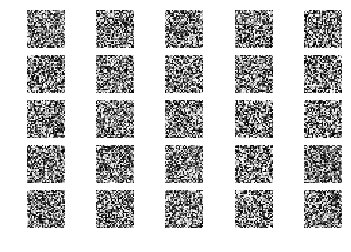

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


1 [D loss: 0.516156, acc.: 59.38%] [G loss: 0.620334]
2 [D loss: 0.405642, acc.: 71.88%] [G loss: 0.749729]
3 [D loss: 0.312330, acc.: 87.50%] [G loss: 0.861566]
4 [D loss: 0.304998, acc.: 89.06%] [G loss: 1.041960]
5 [D loss: 0.258733, acc.: 96.88%] [G loss: 1.159939]
6 [D loss: 0.221402, acc.: 96.88%] [G loss: 1.285743]
7 [D loss: 0.182597, acc.: 100.00%] [G loss: 1.431871]
8 [D loss: 0.163844, acc.: 98.44%] [G loss: 1.526155]
9 [D loss: 0.157583, acc.: 98.44%] [G loss: 1.667588]
10 [D loss: 0.125391, acc.: 100.00%] [G loss: 1.665043]
11 [D loss: 0.120899, acc.: 100.00%] [G loss: 1.886924]
12 [D loss: 0.117445, acc.: 100.00%] [G loss: 1.859183]
13 [D loss: 0.110646, acc.: 100.00%] [G loss: 1.978279]
14 [D loss: 0.111257, acc.: 100.00%] [G loss: 2.123020]
15 [D loss: 0.088076, acc.: 100.00%] [G loss: 2.204431]
16 [D loss: 0.081981, acc.: 100.00%] [G loss: 2.321185]
17 [D loss: 0.077190, acc.: 100.00%] [G loss: 2.379202]
18 [D loss: 0.073087, acc.: 100.00%] [G loss: 2.402836]
19 [D los

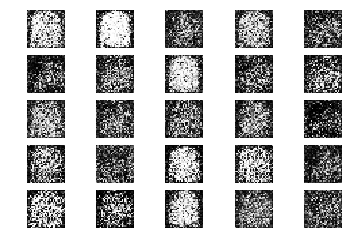

201 [D loss: 0.399748, acc.: 79.69%] [G loss: 2.390488]
202 [D loss: 0.257283, acc.: 89.06%] [G loss: 2.623665]
203 [D loss: 0.472724, acc.: 75.00%] [G loss: 2.222172]
204 [D loss: 0.472655, acc.: 79.69%] [G loss: 2.428315]
205 [D loss: 0.518765, acc.: 68.75%] [G loss: 2.167446]
206 [D loss: 0.522348, acc.: 82.81%] [G loss: 2.347710]
207 [D loss: 0.827987, acc.: 73.44%] [G loss: 1.857596]
208 [D loss: 0.347577, acc.: 81.25%] [G loss: 2.986452]
209 [D loss: 0.641018, acc.: 73.44%] [G loss: 2.349819]
210 [D loss: 0.608263, acc.: 75.00%] [G loss: 2.110284]
211 [D loss: 0.524705, acc.: 71.88%] [G loss: 2.305982]
212 [D loss: 0.528832, acc.: 76.56%] [G loss: 2.403225]
213 [D loss: 0.735929, acc.: 60.94%] [G loss: 1.839376]
214 [D loss: 0.684993, acc.: 60.94%] [G loss: 2.067598]
215 [D loss: 0.548594, acc.: 70.31%] [G loss: 2.102315]
216 [D loss: 0.420239, acc.: 85.94%] [G loss: 1.967741]
217 [D loss: 0.550437, acc.: 71.88%] [G loss: 2.149304]
218 [D loss: 0.795761, acc.: 56.25%] [G loss: 1.

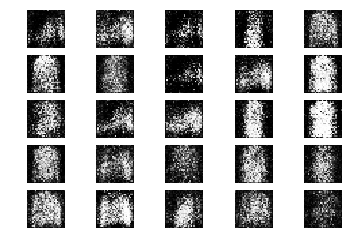

401 [D loss: 0.648398, acc.: 59.38%] [G loss: 0.999505]
402 [D loss: 0.664093, acc.: 62.50%] [G loss: 1.065225]
403 [D loss: 0.585491, acc.: 73.44%] [G loss: 0.969111]
404 [D loss: 0.624178, acc.: 68.75%] [G loss: 0.974309]
405 [D loss: 0.570639, acc.: 71.88%] [G loss: 1.042538]
406 [D loss: 0.655827, acc.: 57.81%] [G loss: 0.980344]
407 [D loss: 0.589015, acc.: 67.19%] [G loss: 1.079961]
408 [D loss: 0.573364, acc.: 78.12%] [G loss: 1.009855]
409 [D loss: 0.614245, acc.: 60.94%] [G loss: 0.905250]
410 [D loss: 0.665786, acc.: 59.38%] [G loss: 0.999804]
411 [D loss: 0.656686, acc.: 57.81%] [G loss: 0.923906]
412 [D loss: 0.661440, acc.: 62.50%] [G loss: 0.952830]
413 [D loss: 0.641750, acc.: 64.06%] [G loss: 0.997944]
414 [D loss: 0.652638, acc.: 67.19%] [G loss: 1.000875]
415 [D loss: 0.621235, acc.: 67.19%] [G loss: 0.930843]
416 [D loss: 0.592488, acc.: 65.62%] [G loss: 0.929767]
417 [D loss: 0.535031, acc.: 70.31%] [G loss: 0.984051]
418 [D loss: 0.607303, acc.: 68.75%] [G loss: 1.

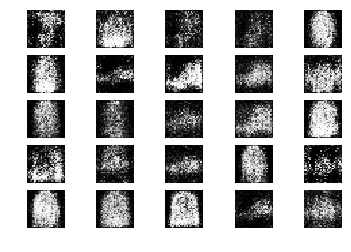

601 [D loss: 0.640076, acc.: 64.06%] [G loss: 0.950133]
602 [D loss: 0.696870, acc.: 51.56%] [G loss: 0.827752]
603 [D loss: 0.631653, acc.: 60.94%] [G loss: 0.827966]
604 [D loss: 0.624879, acc.: 65.62%] [G loss: 0.937422]
605 [D loss: 0.609896, acc.: 65.62%] [G loss: 0.926789]
606 [D loss: 0.662753, acc.: 65.62%] [G loss: 0.877785]
607 [D loss: 0.636278, acc.: 67.19%] [G loss: 0.860110]
608 [D loss: 0.693828, acc.: 48.44%] [G loss: 0.943890]
609 [D loss: 0.626518, acc.: 56.25%] [G loss: 0.925462]
610 [D loss: 0.633256, acc.: 68.75%] [G loss: 0.986164]
611 [D loss: 0.666739, acc.: 56.25%] [G loss: 0.961719]
612 [D loss: 0.595008, acc.: 71.88%] [G loss: 0.918801]
613 [D loss: 0.668718, acc.: 51.56%] [G loss: 0.932028]
614 [D loss: 0.628236, acc.: 62.50%] [G loss: 0.882176]
615 [D loss: 0.652180, acc.: 60.94%] [G loss: 0.905143]
616 [D loss: 0.635324, acc.: 64.06%] [G loss: 0.828146]
617 [D loss: 0.650453, acc.: 64.06%] [G loss: 0.877517]
618 [D loss: 0.643688, acc.: 59.38%] [G loss: 0.

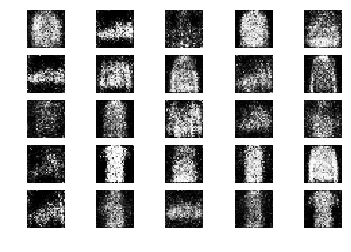

801 [D loss: 0.635921, acc.: 59.38%] [G loss: 0.813511]
802 [D loss: 0.637493, acc.: 53.12%] [G loss: 0.807132]
803 [D loss: 0.642552, acc.: 68.75%] [G loss: 0.833845]
804 [D loss: 0.695290, acc.: 59.38%] [G loss: 0.883286]
805 [D loss: 0.669129, acc.: 51.56%] [G loss: 0.835046]
806 [D loss: 0.697830, acc.: 54.69%] [G loss: 0.862058]
807 [D loss: 0.645498, acc.: 64.06%] [G loss: 0.855804]
808 [D loss: 0.646063, acc.: 70.31%] [G loss: 0.908661]
809 [D loss: 0.605485, acc.: 71.88%] [G loss: 0.935502]
810 [D loss: 0.676170, acc.: 57.81%] [G loss: 0.911812]
811 [D loss: 0.604439, acc.: 65.62%] [G loss: 0.904918]
812 [D loss: 0.654866, acc.: 62.50%] [G loss: 0.836794]
813 [D loss: 0.636532, acc.: 65.62%] [G loss: 0.853456]
814 [D loss: 0.645469, acc.: 65.62%] [G loss: 0.917470]
815 [D loss: 0.601195, acc.: 73.44%] [G loss: 0.882068]
816 [D loss: 0.673943, acc.: 51.56%] [G loss: 0.906791]
817 [D loss: 0.681946, acc.: 62.50%] [G loss: 0.878579]
818 [D loss: 0.649166, acc.: 67.19%] [G loss: 0.

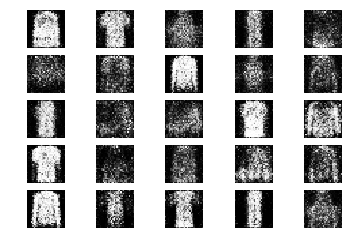

1001 [D loss: 0.622474, acc.: 60.94%] [G loss: 0.837746]
1002 [D loss: 0.676881, acc.: 54.69%] [G loss: 0.863712]
1003 [D loss: 0.650460, acc.: 62.50%] [G loss: 0.851517]
1004 [D loss: 0.639584, acc.: 54.69%] [G loss: 0.880418]
1005 [D loss: 0.628630, acc.: 75.00%] [G loss: 0.849580]
1006 [D loss: 0.638776, acc.: 67.19%] [G loss: 0.837101]
1007 [D loss: 0.724332, acc.: 57.81%] [G loss: 0.912337]
1008 [D loss: 0.674521, acc.: 56.25%] [G loss: 0.881942]
1009 [D loss: 0.602539, acc.: 65.62%] [G loss: 0.878645]
1010 [D loss: 0.662435, acc.: 56.25%] [G loss: 0.922069]
1011 [D loss: 0.647191, acc.: 60.94%] [G loss: 0.897413]
1012 [D loss: 0.563839, acc.: 73.44%] [G loss: 0.899589]
1013 [D loss: 0.590311, acc.: 75.00%] [G loss: 0.867349]
1014 [D loss: 0.628886, acc.: 67.19%] [G loss: 0.831895]
1015 [D loss: 0.640065, acc.: 57.81%] [G loss: 0.879686]
1016 [D loss: 0.615509, acc.: 67.19%] [G loss: 0.893196]
1017 [D loss: 0.676201, acc.: 56.25%] [G loss: 0.840343]
1018 [D loss: 0.595942, acc.: 6

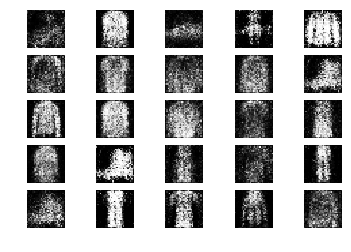

1201 [D loss: 0.650038, acc.: 57.81%] [G loss: 0.834909]
1202 [D loss: 0.605697, acc.: 60.94%] [G loss: 0.867983]
1203 [D loss: 0.671772, acc.: 64.06%] [G loss: 0.789636]
1204 [D loss: 0.654925, acc.: 65.62%] [G loss: 0.923971]
1205 [D loss: 0.676672, acc.: 64.06%] [G loss: 0.768351]
1206 [D loss: 0.558278, acc.: 75.00%] [G loss: 0.909346]
1207 [D loss: 0.614592, acc.: 64.06%] [G loss: 0.850985]
1208 [D loss: 0.631394, acc.: 65.62%] [G loss: 0.797609]
1209 [D loss: 0.642641, acc.: 59.38%] [G loss: 0.880163]
1210 [D loss: 0.611133, acc.: 62.50%] [G loss: 0.956799]
1211 [D loss: 0.658715, acc.: 67.19%] [G loss: 0.860962]
1212 [D loss: 0.671574, acc.: 59.38%] [G loss: 0.917226]
1213 [D loss: 0.633850, acc.: 64.06%] [G loss: 1.029805]
1214 [D loss: 0.621031, acc.: 65.62%] [G loss: 0.925716]
1215 [D loss: 0.700612, acc.: 54.69%] [G loss: 0.911342]
1216 [D loss: 0.654148, acc.: 67.19%] [G loss: 0.864497]
1217 [D loss: 0.656254, acc.: 62.50%] [G loss: 0.854740]
1218 [D loss: 0.606911, acc.: 6

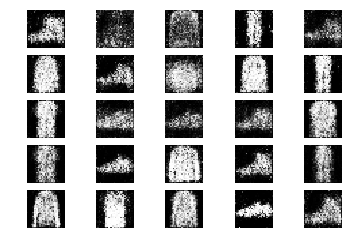

1401 [D loss: 0.591106, acc.: 65.62%] [G loss: 0.823716]
1402 [D loss: 0.639614, acc.: 65.62%] [G loss: 0.966441]
1403 [D loss: 0.633400, acc.: 60.94%] [G loss: 0.874989]
1404 [D loss: 0.603011, acc.: 71.88%] [G loss: 0.871281]
1405 [D loss: 0.645702, acc.: 64.06%] [G loss: 0.872031]
1406 [D loss: 0.584494, acc.: 71.88%] [G loss: 0.871957]
1407 [D loss: 0.688495, acc.: 54.69%] [G loss: 0.813218]
1408 [D loss: 0.645861, acc.: 59.38%] [G loss: 0.961979]
1409 [D loss: 0.621867, acc.: 71.88%] [G loss: 0.857719]
1410 [D loss: 0.706126, acc.: 53.12%] [G loss: 0.947966]
1411 [D loss: 0.669547, acc.: 57.81%] [G loss: 0.883011]
1412 [D loss: 0.614721, acc.: 67.19%] [G loss: 0.919508]
1413 [D loss: 0.625496, acc.: 65.62%] [G loss: 0.819924]
1414 [D loss: 0.612003, acc.: 70.31%] [G loss: 0.849225]
1415 [D loss: 0.702374, acc.: 46.88%] [G loss: 0.828145]
1416 [D loss: 0.604759, acc.: 70.31%] [G loss: 0.820259]
1417 [D loss: 0.626841, acc.: 60.94%] [G loss: 0.850907]
1418 [D loss: 0.587637, acc.: 7

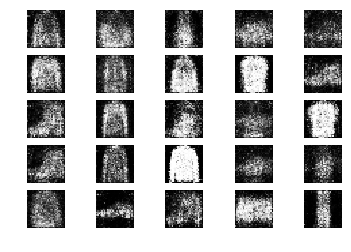

1601 [D loss: 0.628047, acc.: 65.62%] [G loss: 0.899502]
1602 [D loss: 0.681240, acc.: 54.69%] [G loss: 0.883210]
1603 [D loss: 0.639646, acc.: 60.94%] [G loss: 0.820382]
1604 [D loss: 0.600045, acc.: 67.19%] [G loss: 0.851296]
1605 [D loss: 0.641574, acc.: 68.75%] [G loss: 0.939500]
1606 [D loss: 0.600548, acc.: 71.88%] [G loss: 0.889648]
1607 [D loss: 0.621444, acc.: 64.06%] [G loss: 0.857792]
1608 [D loss: 0.564160, acc.: 70.31%] [G loss: 0.941613]
1609 [D loss: 0.663462, acc.: 56.25%] [G loss: 0.970508]
1610 [D loss: 0.630946, acc.: 57.81%] [G loss: 0.845148]
1611 [D loss: 0.638598, acc.: 64.06%] [G loss: 0.941364]
1612 [D loss: 0.690423, acc.: 56.25%] [G loss: 0.899658]
1613 [D loss: 0.601417, acc.: 67.19%] [G loss: 0.930129]
1614 [D loss: 0.591452, acc.: 70.31%] [G loss: 0.827501]
1615 [D loss: 0.581869, acc.: 67.19%] [G loss: 0.930480]
1616 [D loss: 0.674196, acc.: 60.94%] [G loss: 0.907786]
1617 [D loss: 0.621998, acc.: 65.62%] [G loss: 0.903290]
1618 [D loss: 0.697324, acc.: 6

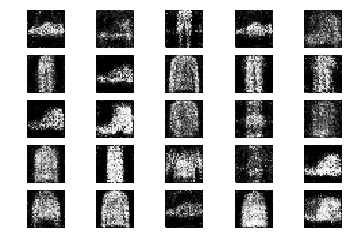

1801 [D loss: 0.685230, acc.: 62.50%] [G loss: 0.956915]
1802 [D loss: 0.616286, acc.: 65.62%] [G loss: 0.879604]
1803 [D loss: 0.606881, acc.: 64.06%] [G loss: 0.918837]
1804 [D loss: 0.610692, acc.: 62.50%] [G loss: 0.988174]
1805 [D loss: 0.657839, acc.: 60.94%] [G loss: 0.976104]
1806 [D loss: 0.680534, acc.: 60.94%] [G loss: 0.917147]
1807 [D loss: 0.680435, acc.: 57.81%] [G loss: 0.936317]
1808 [D loss: 0.628186, acc.: 62.50%] [G loss: 0.900142]
1809 [D loss: 0.614532, acc.: 64.06%] [G loss: 0.893053]
1810 [D loss: 0.583037, acc.: 68.75%] [G loss: 0.802919]
1811 [D loss: 0.636212, acc.: 64.06%] [G loss: 0.821204]
1812 [D loss: 0.672514, acc.: 50.00%] [G loss: 1.007912]
1813 [D loss: 0.672447, acc.: 62.50%] [G loss: 0.904002]
1814 [D loss: 0.587435, acc.: 75.00%] [G loss: 0.847503]
1815 [D loss: 0.633469, acc.: 60.94%] [G loss: 0.916105]
1816 [D loss: 0.692973, acc.: 64.06%] [G loss: 0.880550]
1817 [D loss: 0.629143, acc.: 59.38%] [G loss: 0.904893]
1818 [D loss: 0.661883, acc.: 5

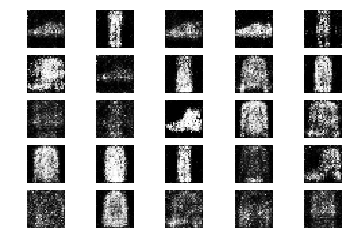

2001 [D loss: 0.723145, acc.: 46.88%] [G loss: 0.798464]
2002 [D loss: 0.645116, acc.: 59.38%] [G loss: 0.937042]
2003 [D loss: 0.644763, acc.: 56.25%] [G loss: 0.951641]
2004 [D loss: 0.619546, acc.: 62.50%] [G loss: 0.911803]
2005 [D loss: 0.620429, acc.: 62.50%] [G loss: 0.850315]
2006 [D loss: 0.599175, acc.: 68.75%] [G loss: 0.903180]
2007 [D loss: 0.605764, acc.: 59.38%] [G loss: 0.956998]
2008 [D loss: 0.650659, acc.: 56.25%] [G loss: 0.936388]
2009 [D loss: 0.693450, acc.: 56.25%] [G loss: 0.858270]
2010 [D loss: 0.668691, acc.: 56.25%] [G loss: 0.870211]
2011 [D loss: 0.628172, acc.: 65.62%] [G loss: 0.904719]
2012 [D loss: 0.635532, acc.: 56.25%] [G loss: 0.913991]
2013 [D loss: 0.594696, acc.: 70.31%] [G loss: 0.922439]
2014 [D loss: 0.643450, acc.: 59.38%] [G loss: 0.893682]
2015 [D loss: 0.627643, acc.: 65.62%] [G loss: 0.942170]
2016 [D loss: 0.596818, acc.: 68.75%] [G loss: 0.880762]
2017 [D loss: 0.622143, acc.: 68.75%] [G loss: 0.911050]
2018 [D loss: 0.573468, acc.: 6

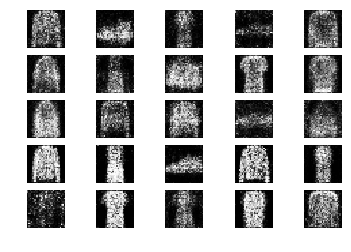

2201 [D loss: 0.598725, acc.: 68.75%] [G loss: 0.826792]
2202 [D loss: 0.602890, acc.: 70.31%] [G loss: 0.869752]
2203 [D loss: 0.649105, acc.: 54.69%] [G loss: 0.857537]
2204 [D loss: 0.597880, acc.: 62.50%] [G loss: 0.972665]
2205 [D loss: 0.679152, acc.: 59.38%] [G loss: 0.888984]
2206 [D loss: 0.622895, acc.: 60.94%] [G loss: 0.891956]
2207 [D loss: 0.711912, acc.: 57.81%] [G loss: 0.884941]
2208 [D loss: 0.658496, acc.: 57.81%] [G loss: 0.753135]
2209 [D loss: 0.621151, acc.: 65.62%] [G loss: 0.940250]
2210 [D loss: 0.591684, acc.: 71.88%] [G loss: 0.801798]
2211 [D loss: 0.621048, acc.: 68.75%] [G loss: 0.876959]
2212 [D loss: 0.677792, acc.: 62.50%] [G loss: 0.885648]
2213 [D loss: 0.605293, acc.: 71.88%] [G loss: 0.844611]
2214 [D loss: 0.647695, acc.: 57.81%] [G loss: 0.895584]
2215 [D loss: 0.643898, acc.: 68.75%] [G loss: 0.915307]
2216 [D loss: 0.740927, acc.: 46.88%] [G loss: 0.906207]
2217 [D loss: 0.645683, acc.: 62.50%] [G loss: 0.871846]
2218 [D loss: 0.563331, acc.: 7

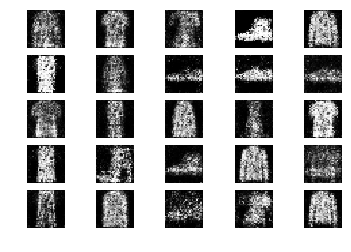

2401 [D loss: 0.690591, acc.: 65.62%] [G loss: 0.851100]
2402 [D loss: 0.663930, acc.: 57.81%] [G loss: 0.854525]
2403 [D loss: 0.668132, acc.: 51.56%] [G loss: 0.839180]
2404 [D loss: 0.585411, acc.: 67.19%] [G loss: 0.907757]
2405 [D loss: 0.658802, acc.: 59.38%] [G loss: 0.957543]
2406 [D loss: 0.661343, acc.: 59.38%] [G loss: 1.008966]
2407 [D loss: 0.633942, acc.: 64.06%] [G loss: 0.889446]
2408 [D loss: 0.625037, acc.: 68.75%] [G loss: 0.895395]
2409 [D loss: 0.612737, acc.: 70.31%] [G loss: 0.887349]
2410 [D loss: 0.622969, acc.: 56.25%] [G loss: 0.895474]
2411 [D loss: 0.597341, acc.: 62.50%] [G loss: 0.844662]
2412 [D loss: 0.637899, acc.: 60.94%] [G loss: 0.967818]
2413 [D loss: 0.653204, acc.: 56.25%] [G loss: 0.909146]
2414 [D loss: 0.606854, acc.: 67.19%] [G loss: 0.942368]
2415 [D loss: 0.621214, acc.: 64.06%] [G loss: 0.926618]
2416 [D loss: 0.646266, acc.: 68.75%] [G loss: 0.920424]
2417 [D loss: 0.618013, acc.: 67.19%] [G loss: 0.920714]
2418 [D loss: 0.559503, acc.: 7

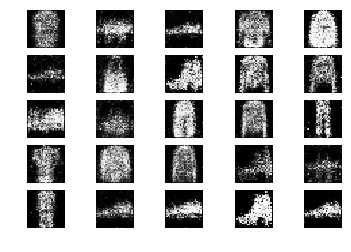

2601 [D loss: 0.671071, acc.: 57.81%] [G loss: 0.997454]
2602 [D loss: 0.617800, acc.: 67.19%] [G loss: 0.867516]
2603 [D loss: 0.639004, acc.: 70.31%] [G loss: 0.921430]
2604 [D loss: 0.604841, acc.: 70.31%] [G loss: 0.903379]
2605 [D loss: 0.607994, acc.: 64.06%] [G loss: 0.909305]
2606 [D loss: 0.649485, acc.: 67.19%] [G loss: 0.945564]
2607 [D loss: 0.637201, acc.: 68.75%] [G loss: 0.872862]
2608 [D loss: 0.686972, acc.: 53.12%] [G loss: 0.815837]
2609 [D loss: 0.651484, acc.: 64.06%] [G loss: 0.824478]
2610 [D loss: 0.628502, acc.: 60.94%] [G loss: 0.891314]
2611 [D loss: 0.656155, acc.: 59.38%] [G loss: 0.910546]
2612 [D loss: 0.651379, acc.: 64.06%] [G loss: 0.908882]
2613 [D loss: 0.656439, acc.: 62.50%] [G loss: 0.926197]
2614 [D loss: 0.618588, acc.: 68.75%] [G loss: 1.004133]
2615 [D loss: 0.555440, acc.: 68.75%] [G loss: 0.915533]
2616 [D loss: 0.642435, acc.: 65.62%] [G loss: 0.963000]
2617 [D loss: 0.664502, acc.: 64.06%] [G loss: 0.885964]
2618 [D loss: 0.599655, acc.: 6

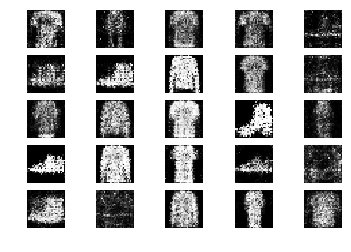

2801 [D loss: 0.665137, acc.: 62.50%] [G loss: 0.893929]
2802 [D loss: 0.678767, acc.: 62.50%] [G loss: 0.846554]
2803 [D loss: 0.591775, acc.: 70.31%] [G loss: 0.930903]
2804 [D loss: 0.665855, acc.: 59.38%] [G loss: 0.907625]
2805 [D loss: 0.642781, acc.: 64.06%] [G loss: 0.864038]
2806 [D loss: 0.666637, acc.: 64.06%] [G loss: 0.840367]
2807 [D loss: 0.607909, acc.: 65.62%] [G loss: 0.897423]
2808 [D loss: 0.628230, acc.: 64.06%] [G loss: 0.887791]
2809 [D loss: 0.743865, acc.: 53.12%] [G loss: 0.939372]
2810 [D loss: 0.612336, acc.: 64.06%] [G loss: 0.811861]
2811 [D loss: 0.553357, acc.: 81.25%] [G loss: 1.015469]
2812 [D loss: 0.647518, acc.: 62.50%] [G loss: 0.951330]
2813 [D loss: 0.749520, acc.: 54.69%] [G loss: 0.934421]
2814 [D loss: 0.673135, acc.: 57.81%] [G loss: 0.868760]
2815 [D loss: 0.628429, acc.: 70.31%] [G loss: 0.886333]
2816 [D loss: 0.607744, acc.: 70.31%] [G loss: 0.970713]
2817 [D loss: 0.648571, acc.: 67.19%] [G loss: 0.838762]
2818 [D loss: 0.663564, acc.: 5

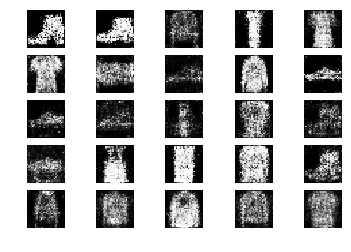

3001 [D loss: 0.679848, acc.: 54.69%] [G loss: 0.828452]
3002 [D loss: 0.667372, acc.: 60.94%] [G loss: 0.891815]
3003 [D loss: 0.633254, acc.: 56.25%] [G loss: 0.847639]
3004 [D loss: 0.617089, acc.: 64.06%] [G loss: 0.868655]
3005 [D loss: 0.653963, acc.: 59.38%] [G loss: 0.907701]
3006 [D loss: 0.659133, acc.: 62.50%] [G loss: 0.883557]
3007 [D loss: 0.668281, acc.: 59.38%] [G loss: 0.892092]
3008 [D loss: 0.665705, acc.: 56.25%] [G loss: 0.921730]
3009 [D loss: 0.652156, acc.: 57.81%] [G loss: 0.876067]
3010 [D loss: 0.566482, acc.: 71.88%] [G loss: 0.928258]
3011 [D loss: 0.634272, acc.: 64.06%] [G loss: 0.926633]
3012 [D loss: 0.662764, acc.: 62.50%] [G loss: 0.900340]
3013 [D loss: 0.682224, acc.: 57.81%] [G loss: 0.870391]
3014 [D loss: 0.651925, acc.: 60.94%] [G loss: 0.940055]
3015 [D loss: 0.597631, acc.: 65.62%] [G loss: 0.841560]
3016 [D loss: 0.593574, acc.: 68.75%] [G loss: 1.023617]
3017 [D loss: 0.683414, acc.: 60.94%] [G loss: 0.953568]
3018 [D loss: 0.617497, acc.: 6

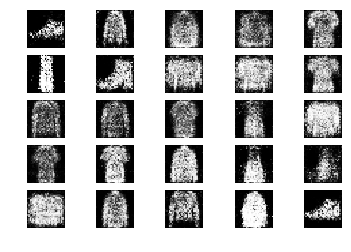

3201 [D loss: 0.592444, acc.: 70.31%] [G loss: 0.866619]
3202 [D loss: 0.733013, acc.: 60.94%] [G loss: 0.906489]
3203 [D loss: 0.650939, acc.: 70.31%] [G loss: 0.985393]
3204 [D loss: 0.531142, acc.: 78.12%] [G loss: 0.994436]
3205 [D loss: 0.731886, acc.: 51.56%] [G loss: 0.868622]
3206 [D loss: 0.705257, acc.: 50.00%] [G loss: 0.848259]
3207 [D loss: 0.677946, acc.: 62.50%] [G loss: 0.875016]
3208 [D loss: 0.645438, acc.: 65.62%] [G loss: 0.818950]
3209 [D loss: 0.677429, acc.: 48.44%] [G loss: 0.953150]
3210 [D loss: 0.607148, acc.: 68.75%] [G loss: 0.868378]
3211 [D loss: 0.671361, acc.: 57.81%] [G loss: 0.892168]
3212 [D loss: 0.652372, acc.: 53.12%] [G loss: 0.855684]
3213 [D loss: 0.693678, acc.: 56.25%] [G loss: 0.939339]
3214 [D loss: 0.659603, acc.: 62.50%] [G loss: 0.813367]
3215 [D loss: 0.702783, acc.: 54.69%] [G loss: 0.834245]
3216 [D loss: 0.541452, acc.: 75.00%] [G loss: 0.928590]
3217 [D loss: 0.675640, acc.: 51.56%] [G loss: 0.880500]
3218 [D loss: 0.687904, acc.: 5

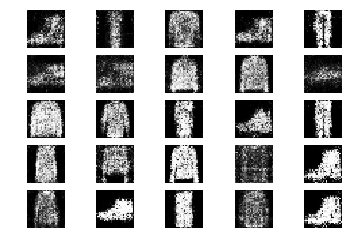

3401 [D loss: 0.578086, acc.: 68.75%] [G loss: 0.882172]
3402 [D loss: 0.644317, acc.: 56.25%] [G loss: 0.874411]
3403 [D loss: 0.658552, acc.: 60.94%] [G loss: 0.893067]
3404 [D loss: 0.684106, acc.: 51.56%] [G loss: 0.850924]
3405 [D loss: 0.677476, acc.: 65.62%] [G loss: 0.833724]
3406 [D loss: 0.674595, acc.: 62.50%] [G loss: 0.925386]
3407 [D loss: 0.651284, acc.: 60.94%] [G loss: 0.878865]
3408 [D loss: 0.656173, acc.: 57.81%] [G loss: 0.925686]
3409 [D loss: 0.649483, acc.: 65.62%] [G loss: 0.874310]
3410 [D loss: 0.615080, acc.: 64.06%] [G loss: 0.791581]
3411 [D loss: 0.680517, acc.: 60.94%] [G loss: 0.931458]
3412 [D loss: 0.632551, acc.: 60.94%] [G loss: 0.865975]
3413 [D loss: 0.585066, acc.: 76.56%] [G loss: 0.873786]
3414 [D loss: 0.678720, acc.: 59.38%] [G loss: 0.872729]
3415 [D loss: 0.682942, acc.: 57.81%] [G loss: 0.920390]
3416 [D loss: 0.661027, acc.: 54.69%] [G loss: 0.928786]
3417 [D loss: 0.653818, acc.: 59.38%] [G loss: 0.809094]
3418 [D loss: 0.629640, acc.: 6

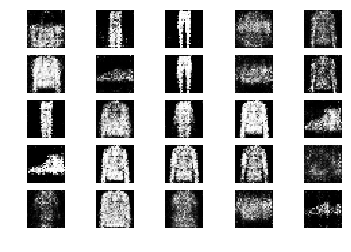

3601 [D loss: 0.632942, acc.: 71.88%] [G loss: 0.902486]
3602 [D loss: 0.639365, acc.: 62.50%] [G loss: 0.872059]
3603 [D loss: 0.647676, acc.: 60.94%] [G loss: 0.993287]
3604 [D loss: 0.641376, acc.: 64.06%] [G loss: 0.860776]
3605 [D loss: 0.643988, acc.: 68.75%] [G loss: 0.931985]
3606 [D loss: 0.635694, acc.: 56.25%] [G loss: 0.905287]
3607 [D loss: 0.603094, acc.: 71.88%] [G loss: 0.908012]
3608 [D loss: 0.619511, acc.: 65.62%] [G loss: 0.835414]
3609 [D loss: 0.634494, acc.: 64.06%] [G loss: 0.988299]
3610 [D loss: 0.684809, acc.: 50.00%] [G loss: 0.895589]
3611 [D loss: 0.670908, acc.: 53.12%] [G loss: 0.961154]
3612 [D loss: 0.648827, acc.: 64.06%] [G loss: 0.885357]
3613 [D loss: 0.600785, acc.: 67.19%] [G loss: 0.979065]
3614 [D loss: 0.660372, acc.: 65.62%] [G loss: 0.889435]
3615 [D loss: 0.681309, acc.: 56.25%] [G loss: 0.860156]
3616 [D loss: 0.672638, acc.: 51.56%] [G loss: 0.855093]
3617 [D loss: 0.610094, acc.: 67.19%] [G loss: 0.935768]
3618 [D loss: 0.669741, acc.: 6

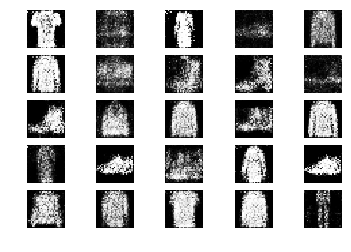

3801 [D loss: 0.661745, acc.: 56.25%] [G loss: 0.842511]
3802 [D loss: 0.569245, acc.: 75.00%] [G loss: 0.882094]
3803 [D loss: 0.644385, acc.: 60.94%] [G loss: 0.875603]
3804 [D loss: 0.718995, acc.: 45.31%] [G loss: 0.939818]
3805 [D loss: 0.628656, acc.: 68.75%] [G loss: 0.925990]
3806 [D loss: 0.649013, acc.: 54.69%] [G loss: 0.915213]
3807 [D loss: 0.632790, acc.: 70.31%] [G loss: 0.879031]
3808 [D loss: 0.662765, acc.: 56.25%] [G loss: 0.941881]
3809 [D loss: 0.604351, acc.: 68.75%] [G loss: 0.987447]
3810 [D loss: 0.661625, acc.: 62.50%] [G loss: 0.896876]
3811 [D loss: 0.609496, acc.: 68.75%] [G loss: 0.930998]
3812 [D loss: 0.662424, acc.: 67.19%] [G loss: 0.858637]
3813 [D loss: 0.596976, acc.: 75.00%] [G loss: 0.883174]
3814 [D loss: 0.620118, acc.: 64.06%] [G loss: 0.881402]
3815 [D loss: 0.643072, acc.: 65.62%] [G loss: 0.919346]
3816 [D loss: 0.637130, acc.: 62.50%] [G loss: 0.929706]
3817 [D loss: 0.691138, acc.: 53.12%] [G loss: 0.887707]
3818 [D loss: 0.693907, acc.: 5

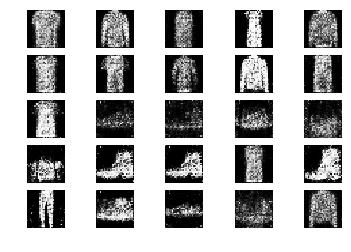

4001 [D loss: 0.686262, acc.: 51.56%] [G loss: 0.927318]
4002 [D loss: 0.677239, acc.: 62.50%] [G loss: 0.874102]
4003 [D loss: 0.664919, acc.: 60.94%] [G loss: 1.007966]
4004 [D loss: 0.680912, acc.: 59.38%] [G loss: 0.910514]
4005 [D loss: 0.654903, acc.: 64.06%] [G loss: 1.002658]
4006 [D loss: 0.647482, acc.: 67.19%] [G loss: 0.876463]
4007 [D loss: 0.634584, acc.: 60.94%] [G loss: 0.892477]
4008 [D loss: 0.724697, acc.: 57.81%] [G loss: 0.801347]
4009 [D loss: 0.654256, acc.: 60.94%] [G loss: 0.876636]
4010 [D loss: 0.603777, acc.: 71.88%] [G loss: 0.852159]
4011 [D loss: 0.619492, acc.: 60.94%] [G loss: 0.854951]
4012 [D loss: 0.651429, acc.: 60.94%] [G loss: 0.850125]
4013 [D loss: 0.645956, acc.: 59.38%] [G loss: 0.922740]
4014 [D loss: 0.627759, acc.: 64.06%] [G loss: 0.939010]
4015 [D loss: 0.708724, acc.: 50.00%] [G loss: 0.921630]
4016 [D loss: 0.631512, acc.: 64.06%] [G loss: 0.915439]
4017 [D loss: 0.646612, acc.: 59.38%] [G loss: 0.951919]
4018 [D loss: 0.654936, acc.: 4

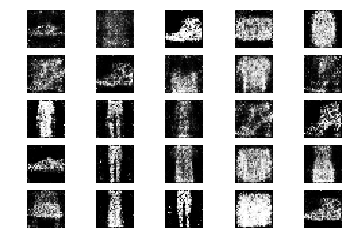

4201 [D loss: 0.648366, acc.: 57.81%] [G loss: 0.866818]
4202 [D loss: 0.665439, acc.: 59.38%] [G loss: 0.819846]
4203 [D loss: 0.668730, acc.: 56.25%] [G loss: 0.965306]
4204 [D loss: 0.639508, acc.: 64.06%] [G loss: 0.988251]
4205 [D loss: 0.624918, acc.: 62.50%] [G loss: 0.946981]
4206 [D loss: 0.654995, acc.: 51.56%] [G loss: 0.895830]
4207 [D loss: 0.651015, acc.: 54.69%] [G loss: 0.831732]
4208 [D loss: 0.586938, acc.: 71.88%] [G loss: 0.870693]
4209 [D loss: 0.667540, acc.: 64.06%] [G loss: 0.856185]
4210 [D loss: 0.654584, acc.: 60.94%] [G loss: 0.877665]
4211 [D loss: 0.644171, acc.: 62.50%] [G loss: 0.809665]
4212 [D loss: 0.661763, acc.: 60.94%] [G loss: 0.845741]
4213 [D loss: 0.647580, acc.: 62.50%] [G loss: 0.938223]
4214 [D loss: 0.635584, acc.: 70.31%] [G loss: 0.930267]
4215 [D loss: 0.650763, acc.: 62.50%] [G loss: 0.868898]
4216 [D loss: 0.677569, acc.: 59.38%] [G loss: 0.899740]
4217 [D loss: 0.688536, acc.: 45.31%] [G loss: 0.873535]
4218 [D loss: 0.713021, acc.: 6

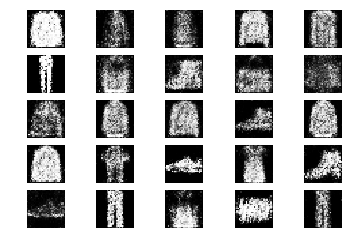

4401 [D loss: 0.587878, acc.: 68.75%] [G loss: 0.869057]
4402 [D loss: 0.659777, acc.: 62.50%] [G loss: 0.872571]
4403 [D loss: 0.686458, acc.: 60.94%] [G loss: 0.833081]
4404 [D loss: 0.637495, acc.: 62.50%] [G loss: 0.863577]
4405 [D loss: 0.655503, acc.: 57.81%] [G loss: 0.857190]
4406 [D loss: 0.651689, acc.: 60.94%] [G loss: 0.914625]
4407 [D loss: 0.647451, acc.: 65.62%] [G loss: 0.906617]
4408 [D loss: 0.695277, acc.: 59.38%] [G loss: 0.900108]
4409 [D loss: 0.619672, acc.: 64.06%] [G loss: 0.922854]
4410 [D loss: 0.633083, acc.: 54.69%] [G loss: 0.891413]
4411 [D loss: 0.625163, acc.: 59.38%] [G loss: 0.948612]
4412 [D loss: 0.588713, acc.: 67.19%] [G loss: 1.042387]
4413 [D loss: 0.725936, acc.: 54.69%] [G loss: 1.018241]
4414 [D loss: 0.586789, acc.: 70.31%] [G loss: 1.031831]
4415 [D loss: 0.723684, acc.: 53.12%] [G loss: 0.864347]
4416 [D loss: 0.681067, acc.: 54.69%] [G loss: 0.917985]
4417 [D loss: 0.664815, acc.: 56.25%] [G loss: 0.874915]
4418 [D loss: 0.607146, acc.: 6

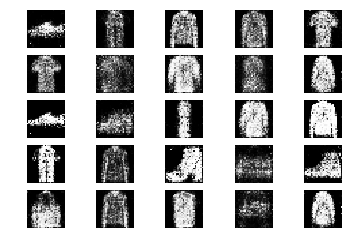

4601 [D loss: 0.626110, acc.: 59.38%] [G loss: 0.984787]
4602 [D loss: 0.670761, acc.: 56.25%] [G loss: 0.950624]
4603 [D loss: 0.620312, acc.: 68.75%] [G loss: 1.002654]
4604 [D loss: 0.601366, acc.: 71.88%] [G loss: 0.893374]
4605 [D loss: 0.680099, acc.: 51.56%] [G loss: 0.949632]
4606 [D loss: 0.680910, acc.: 50.00%] [G loss: 0.921616]
4607 [D loss: 0.708890, acc.: 46.88%] [G loss: 0.849331]
4608 [D loss: 0.673999, acc.: 56.25%] [G loss: 0.859173]
4609 [D loss: 0.678812, acc.: 57.81%] [G loss: 0.861724]
4610 [D loss: 0.643040, acc.: 59.38%] [G loss: 0.952527]
4611 [D loss: 0.605949, acc.: 70.31%] [G loss: 0.966316]
4612 [D loss: 0.626788, acc.: 64.06%] [G loss: 0.881743]
4613 [D loss: 0.626146, acc.: 68.75%] [G loss: 0.896129]
4614 [D loss: 0.618207, acc.: 64.06%] [G loss: 0.955271]
4615 [D loss: 0.606160, acc.: 65.62%] [G loss: 0.853843]
4616 [D loss: 0.622691, acc.: 64.06%] [G loss: 0.948644]
4617 [D loss: 0.684689, acc.: 54.69%] [G loss: 0.808867]
4618 [D loss: 0.730780, acc.: 5

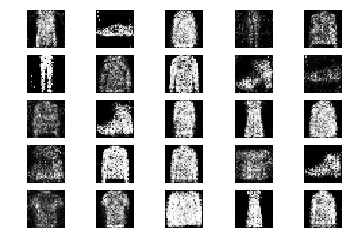

4801 [D loss: 0.675967, acc.: 57.81%] [G loss: 0.891289]
4802 [D loss: 0.663403, acc.: 62.50%] [G loss: 0.912359]
4803 [D loss: 0.613582, acc.: 60.94%] [G loss: 0.827208]
4804 [D loss: 0.610059, acc.: 71.88%] [G loss: 0.856070]
4805 [D loss: 0.609220, acc.: 64.06%] [G loss: 0.851371]
4806 [D loss: 0.706267, acc.: 57.81%] [G loss: 0.902423]
4807 [D loss: 0.694041, acc.: 56.25%] [G loss: 0.917030]
4808 [D loss: 0.631780, acc.: 65.62%] [G loss: 0.842091]
4809 [D loss: 0.645024, acc.: 60.94%] [G loss: 1.015769]
4810 [D loss: 0.660502, acc.: 60.94%] [G loss: 1.013818]
4811 [D loss: 0.610469, acc.: 73.44%] [G loss: 0.949624]
4812 [D loss: 0.650637, acc.: 59.38%] [G loss: 0.883363]
4813 [D loss: 0.605672, acc.: 68.75%] [G loss: 0.860762]
4814 [D loss: 0.682281, acc.: 57.81%] [G loss: 0.869372]
4815 [D loss: 0.698081, acc.: 51.56%] [G loss: 0.819502]
4816 [D loss: 0.627393, acc.: 70.31%] [G loss: 0.839183]
4817 [D loss: 0.655787, acc.: 65.62%] [G loss: 0.904777]
4818 [D loss: 0.689977, acc.: 6

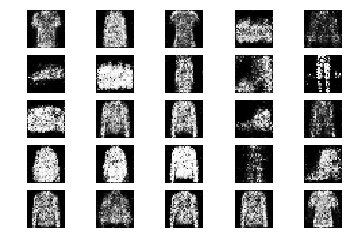

5001 [D loss: 0.711491, acc.: 59.38%] [G loss: 0.840099]
5002 [D loss: 0.643814, acc.: 71.88%] [G loss: 0.769828]
5003 [D loss: 0.654038, acc.: 64.06%] [G loss: 0.912060]
5004 [D loss: 0.624799, acc.: 65.62%] [G loss: 0.782812]
5005 [D loss: 0.663453, acc.: 54.69%] [G loss: 0.894158]
5006 [D loss: 0.649599, acc.: 57.81%] [G loss: 0.933721]
5007 [D loss: 0.626944, acc.: 67.19%] [G loss: 0.909554]
5008 [D loss: 0.681697, acc.: 50.00%] [G loss: 0.942470]
5009 [D loss: 0.652271, acc.: 67.19%] [G loss: 1.005669]
5010 [D loss: 0.673553, acc.: 56.25%] [G loss: 0.905898]
5011 [D loss: 0.633739, acc.: 65.62%] [G loss: 0.893552]
5012 [D loss: 0.655727, acc.: 67.19%] [G loss: 0.966177]
5013 [D loss: 0.578189, acc.: 73.44%] [G loss: 0.948903]
5014 [D loss: 0.671182, acc.: 54.69%] [G loss: 0.857767]
5015 [D loss: 0.669312, acc.: 65.62%] [G loss: 0.852185]
5016 [D loss: 0.656222, acc.: 62.50%] [G loss: 0.905369]
5017 [D loss: 0.632084, acc.: 59.38%] [G loss: 0.871768]
5018 [D loss: 0.599098, acc.: 7

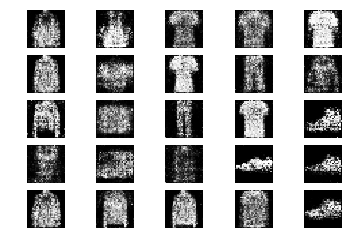

5201 [D loss: 0.623486, acc.: 62.50%] [G loss: 0.847038]
5202 [D loss: 0.660530, acc.: 60.94%] [G loss: 0.872702]
5203 [D loss: 0.614611, acc.: 67.19%] [G loss: 0.878118]
5204 [D loss: 0.609387, acc.: 70.31%] [G loss: 0.969684]
5205 [D loss: 0.650943, acc.: 54.69%] [G loss: 0.951513]
5206 [D loss: 0.654578, acc.: 60.94%] [G loss: 0.888404]
5207 [D loss: 0.651378, acc.: 60.94%] [G loss: 1.019157]
5208 [D loss: 0.578043, acc.: 71.88%] [G loss: 0.902197]
5209 [D loss: 0.690825, acc.: 50.00%] [G loss: 0.949609]
5210 [D loss: 0.658977, acc.: 57.81%] [G loss: 0.848489]
5211 [D loss: 0.629390, acc.: 71.88%] [G loss: 0.994741]
5212 [D loss: 0.628197, acc.: 65.62%] [G loss: 0.935487]
5213 [D loss: 0.667473, acc.: 60.94%] [G loss: 0.888760]
5214 [D loss: 0.635186, acc.: 62.50%] [G loss: 0.933766]
5215 [D loss: 0.626621, acc.: 68.75%] [G loss: 1.005701]
5216 [D loss: 0.652029, acc.: 56.25%] [G loss: 0.928539]
5217 [D loss: 0.645130, acc.: 64.06%] [G loss: 0.902669]
5218 [D loss: 0.754330, acc.: 4

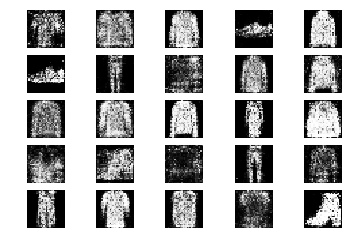

5401 [D loss: 0.696357, acc.: 56.25%] [G loss: 0.913829]
5402 [D loss: 0.634645, acc.: 65.62%] [G loss: 0.862526]
5403 [D loss: 0.626116, acc.: 65.62%] [G loss: 0.923124]
5404 [D loss: 0.700078, acc.: 48.44%] [G loss: 0.882505]
5405 [D loss: 0.648128, acc.: 57.81%] [G loss: 0.896444]
5406 [D loss: 0.651314, acc.: 57.81%] [G loss: 0.858134]
5407 [D loss: 0.655255, acc.: 64.06%] [G loss: 0.842350]
5408 [D loss: 0.711521, acc.: 53.12%] [G loss: 0.884311]
5409 [D loss: 0.619964, acc.: 65.62%] [G loss: 0.919295]
5410 [D loss: 0.636906, acc.: 70.31%] [G loss: 0.900705]
5411 [D loss: 0.627479, acc.: 62.50%] [G loss: 0.897733]
5412 [D loss: 0.648171, acc.: 67.19%] [G loss: 0.989464]
5413 [D loss: 0.691242, acc.: 54.69%] [G loss: 0.888831]
5414 [D loss: 0.674691, acc.: 59.38%] [G loss: 0.893735]
5415 [D loss: 0.658739, acc.: 60.94%] [G loss: 0.823800]
5416 [D loss: 0.707819, acc.: 56.25%] [G loss: 0.873606]
5417 [D loss: 0.663166, acc.: 65.62%] [G loss: 0.960009]
5418 [D loss: 0.660200, acc.: 5

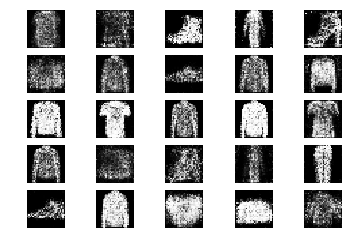

5601 [D loss: 0.675666, acc.: 57.81%] [G loss: 0.837720]
5602 [D loss: 0.657539, acc.: 54.69%] [G loss: 0.898292]
5603 [D loss: 0.640925, acc.: 65.62%] [G loss: 0.892551]
5604 [D loss: 0.696381, acc.: 51.56%] [G loss: 0.891962]
5605 [D loss: 0.667928, acc.: 57.81%] [G loss: 0.833592]
5606 [D loss: 0.644794, acc.: 60.94%] [G loss: 0.924695]
5607 [D loss: 0.659621, acc.: 57.81%] [G loss: 0.876805]
5608 [D loss: 0.666281, acc.: 53.12%] [G loss: 0.811942]
5609 [D loss: 0.622441, acc.: 64.06%] [G loss: 0.873888]
5610 [D loss: 0.617569, acc.: 62.50%] [G loss: 0.893321]
5611 [D loss: 0.642034, acc.: 60.94%] [G loss: 0.961245]
5612 [D loss: 0.647789, acc.: 59.38%] [G loss: 0.906857]
5613 [D loss: 0.672530, acc.: 59.38%] [G loss: 0.952490]
5614 [D loss: 0.608049, acc.: 70.31%] [G loss: 0.958980]
5615 [D loss: 0.635843, acc.: 62.50%] [G loss: 0.835831]
5616 [D loss: 0.615826, acc.: 65.62%] [G loss: 0.829503]
5617 [D loss: 0.634083, acc.: 68.75%] [G loss: 0.802522]
5618 [D loss: 0.618218, acc.: 6

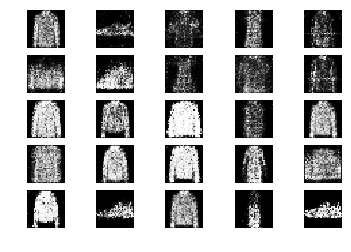

5801 [D loss: 0.691969, acc.: 51.56%] [G loss: 0.918392]
5802 [D loss: 0.654549, acc.: 62.50%] [G loss: 0.871361]
5803 [D loss: 0.646637, acc.: 60.94%] [G loss: 0.829517]
5804 [D loss: 0.714239, acc.: 53.12%] [G loss: 0.887701]
5805 [D loss: 0.606449, acc.: 75.00%] [G loss: 0.923785]
5806 [D loss: 0.694977, acc.: 53.12%] [G loss: 0.983290]
5807 [D loss: 0.624535, acc.: 68.75%] [G loss: 0.976230]
5808 [D loss: 0.735213, acc.: 45.31%] [G loss: 0.873483]
5809 [D loss: 0.664503, acc.: 59.38%] [G loss: 0.793753]
5810 [D loss: 0.668543, acc.: 57.81%] [G loss: 0.906150]
5811 [D loss: 0.584309, acc.: 67.19%] [G loss: 0.923919]
5812 [D loss: 0.635386, acc.: 67.19%] [G loss: 0.939592]
5813 [D loss: 0.649343, acc.: 62.50%] [G loss: 0.925821]
5814 [D loss: 0.742097, acc.: 50.00%] [G loss: 0.862514]
5815 [D loss: 0.634692, acc.: 65.62%] [G loss: 0.848048]
5816 [D loss: 0.699158, acc.: 51.56%] [G loss: 0.873564]
5817 [D loss: 0.662195, acc.: 60.94%] [G loss: 0.875582]
5818 [D loss: 0.668107, acc.: 5

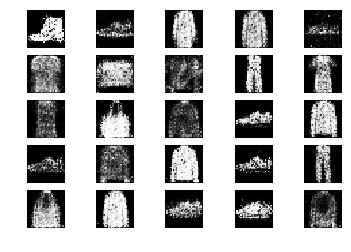

6001 [D loss: 0.643316, acc.: 56.25%] [G loss: 0.897732]
6002 [D loss: 0.616836, acc.: 67.19%] [G loss: 0.892677]
6003 [D loss: 0.574110, acc.: 71.88%] [G loss: 0.798762]
6004 [D loss: 0.637091, acc.: 65.62%] [G loss: 0.912281]
6005 [D loss: 0.658522, acc.: 57.81%] [G loss: 0.906945]
6006 [D loss: 0.660502, acc.: 51.56%] [G loss: 0.967734]
6007 [D loss: 0.656096, acc.: 64.06%] [G loss: 0.891193]
6008 [D loss: 0.730329, acc.: 45.31%] [G loss: 0.874179]
6009 [D loss: 0.656114, acc.: 59.38%] [G loss: 0.874365]
6010 [D loss: 0.595488, acc.: 68.75%] [G loss: 0.939979]
6011 [D loss: 0.718724, acc.: 54.69%] [G loss: 0.882196]
6012 [D loss: 0.694644, acc.: 54.69%] [G loss: 0.907022]
6013 [D loss: 0.737304, acc.: 51.56%] [G loss: 0.901962]
6014 [D loss: 0.615108, acc.: 70.31%] [G loss: 0.947034]
6015 [D loss: 0.664535, acc.: 64.06%] [G loss: 0.884507]
6016 [D loss: 0.607537, acc.: 67.19%] [G loss: 0.946057]
6017 [D loss: 0.682260, acc.: 54.69%] [G loss: 0.914516]
6018 [D loss: 0.649853, acc.: 6

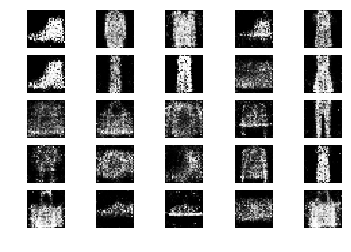

6201 [D loss: 0.673213, acc.: 56.25%] [G loss: 0.921267]
6202 [D loss: 0.570136, acc.: 73.44%] [G loss: 0.945563]
6203 [D loss: 0.623199, acc.: 70.31%] [G loss: 0.954391]
6204 [D loss: 0.577806, acc.: 70.31%] [G loss: 0.891043]
6205 [D loss: 0.676811, acc.: 60.94%] [G loss: 0.873257]
6206 [D loss: 0.606160, acc.: 64.06%] [G loss: 0.946873]
6207 [D loss: 0.658858, acc.: 56.25%] [G loss: 1.041009]
6208 [D loss: 0.602861, acc.: 70.31%] [G loss: 0.887972]
6209 [D loss: 0.640590, acc.: 65.62%] [G loss: 0.792825]
6210 [D loss: 0.701715, acc.: 54.69%] [G loss: 0.863134]
6211 [D loss: 0.638740, acc.: 60.94%] [G loss: 0.982093]
6212 [D loss: 0.619710, acc.: 68.75%] [G loss: 0.929811]
6213 [D loss: 0.598479, acc.: 73.44%] [G loss: 0.935069]
6214 [D loss: 0.610598, acc.: 68.75%] [G loss: 0.916974]
6215 [D loss: 0.645982, acc.: 67.19%] [G loss: 0.888786]
6216 [D loss: 0.660784, acc.: 62.50%] [G loss: 0.961366]
6217 [D loss: 0.626813, acc.: 65.62%] [G loss: 0.962491]
6218 [D loss: 0.657919, acc.: 5

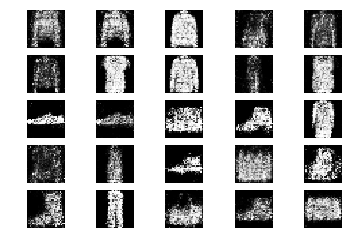

6401 [D loss: 0.635012, acc.: 60.94%] [G loss: 0.782399]
6402 [D loss: 0.646633, acc.: 67.19%] [G loss: 0.805598]
6403 [D loss: 0.635339, acc.: 67.19%] [G loss: 0.927232]
6404 [D loss: 0.651980, acc.: 62.50%] [G loss: 0.925518]
6405 [D loss: 0.645072, acc.: 56.25%] [G loss: 1.009390]
6406 [D loss: 0.667776, acc.: 62.50%] [G loss: 0.921356]
6407 [D loss: 0.644873, acc.: 60.94%] [G loss: 0.884098]
6408 [D loss: 0.622181, acc.: 65.62%] [G loss: 0.909313]
6409 [D loss: 0.696205, acc.: 54.69%] [G loss: 0.908813]
6410 [D loss: 0.644384, acc.: 62.50%] [G loss: 0.962493]
6411 [D loss: 0.626693, acc.: 64.06%] [G loss: 0.939599]
6412 [D loss: 0.671633, acc.: 51.56%] [G loss: 0.926857]
6413 [D loss: 0.724875, acc.: 51.56%] [G loss: 0.917221]
6414 [D loss: 0.712770, acc.: 48.44%] [G loss: 0.972339]
6415 [D loss: 0.630278, acc.: 65.62%] [G loss: 0.872072]
6416 [D loss: 0.606572, acc.: 70.31%] [G loss: 0.795275]
6417 [D loss: 0.661170, acc.: 65.62%] [G loss: 0.942621]
6418 [D loss: 0.641084, acc.: 6

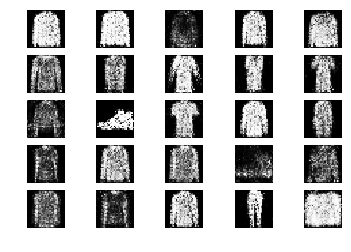

6601 [D loss: 0.611567, acc.: 59.38%] [G loss: 0.863098]
6602 [D loss: 0.661950, acc.: 53.12%] [G loss: 0.860069]
6603 [D loss: 0.621924, acc.: 67.19%] [G loss: 0.890629]
6604 [D loss: 0.602546, acc.: 68.75%] [G loss: 0.975274]
6605 [D loss: 0.669993, acc.: 56.25%] [G loss: 0.886617]
6606 [D loss: 0.638215, acc.: 56.25%] [G loss: 0.863745]
6607 [D loss: 0.610320, acc.: 62.50%] [G loss: 1.023434]
6608 [D loss: 0.644647, acc.: 67.19%] [G loss: 0.946808]
6609 [D loss: 0.628872, acc.: 65.62%] [G loss: 0.906900]
6610 [D loss: 0.719785, acc.: 50.00%] [G loss: 0.828197]
6611 [D loss: 0.609759, acc.: 62.50%] [G loss: 0.833832]
6612 [D loss: 0.654574, acc.: 59.38%] [G loss: 0.896666]
6613 [D loss: 0.622091, acc.: 70.31%] [G loss: 0.874276]
6614 [D loss: 0.647013, acc.: 59.38%] [G loss: 0.941632]
6615 [D loss: 0.617113, acc.: 59.38%] [G loss: 0.813561]
6616 [D loss: 0.656730, acc.: 62.50%] [G loss: 0.882230]
6617 [D loss: 0.589682, acc.: 70.31%] [G loss: 0.959224]
6618 [D loss: 0.597994, acc.: 7

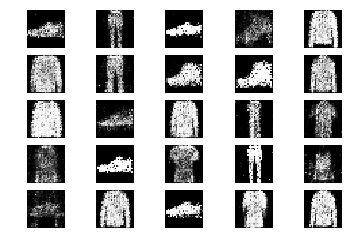

6801 [D loss: 0.614001, acc.: 70.31%] [G loss: 0.907874]
6802 [D loss: 0.641598, acc.: 57.81%] [G loss: 0.937311]
6803 [D loss: 0.633598, acc.: 59.38%] [G loss: 0.907090]
6804 [D loss: 0.684533, acc.: 54.69%] [G loss: 0.880478]
6805 [D loss: 0.636593, acc.: 64.06%] [G loss: 0.870004]
6806 [D loss: 0.682515, acc.: 60.94%] [G loss: 0.944610]
6807 [D loss: 0.683943, acc.: 57.81%] [G loss: 0.934955]
6808 [D loss: 0.678043, acc.: 57.81%] [G loss: 0.892336]
6809 [D loss: 0.603590, acc.: 70.31%] [G loss: 0.915977]
6810 [D loss: 0.697245, acc.: 62.50%] [G loss: 0.929840]
6811 [D loss: 0.680565, acc.: 56.25%] [G loss: 0.913172]
6812 [D loss: 0.616238, acc.: 60.94%] [G loss: 0.839513]
6813 [D loss: 0.602309, acc.: 73.44%] [G loss: 0.817931]
6814 [D loss: 0.643560, acc.: 67.19%] [G loss: 0.884244]
6815 [D loss: 0.610012, acc.: 68.75%] [G loss: 0.896906]
6816 [D loss: 0.726278, acc.: 51.56%] [G loss: 0.902396]
6817 [D loss: 0.689349, acc.: 56.25%] [G loss: 0.825784]
6818 [D loss: 0.600817, acc.: 7

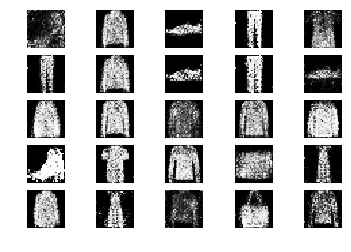

7001 [D loss: 0.682454, acc.: 56.25%] [G loss: 0.837024]
7002 [D loss: 0.646733, acc.: 62.50%] [G loss: 0.890411]
7003 [D loss: 0.601200, acc.: 67.19%] [G loss: 0.783835]
7004 [D loss: 0.678974, acc.: 54.69%] [G loss: 0.869066]
7005 [D loss: 0.733855, acc.: 46.88%] [G loss: 0.838902]
7006 [D loss: 0.640106, acc.: 62.50%] [G loss: 0.903538]
7007 [D loss: 0.637335, acc.: 62.50%] [G loss: 0.880339]
7008 [D loss: 0.717841, acc.: 59.38%] [G loss: 0.882974]
7009 [D loss: 0.708577, acc.: 56.25%] [G loss: 0.793277]
7010 [D loss: 0.672228, acc.: 59.38%] [G loss: 0.844158]
7011 [D loss: 0.656364, acc.: 59.38%] [G loss: 0.890173]
7012 [D loss: 0.626920, acc.: 59.38%] [G loss: 0.978104]
7013 [D loss: 0.652177, acc.: 60.94%] [G loss: 0.908681]
7014 [D loss: 0.665967, acc.: 62.50%] [G loss: 0.817385]
7015 [D loss: 0.683052, acc.: 62.50%] [G loss: 0.936864]
7016 [D loss: 0.671790, acc.: 60.94%] [G loss: 0.909194]
7017 [D loss: 0.709099, acc.: 46.88%] [G loss: 0.874569]
7018 [D loss: 0.625861, acc.: 6

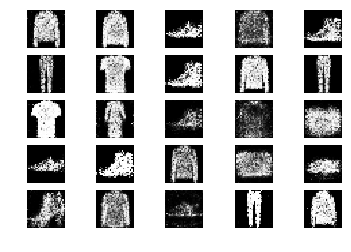

7201 [D loss: 0.694986, acc.: 46.88%] [G loss: 0.863539]
7202 [D loss: 0.609781, acc.: 65.62%] [G loss: 0.895706]
7203 [D loss: 0.729959, acc.: 51.56%] [G loss: 0.913038]
7204 [D loss: 0.656636, acc.: 54.69%] [G loss: 0.801058]
7205 [D loss: 0.638452, acc.: 68.75%] [G loss: 0.875460]
7206 [D loss: 0.647451, acc.: 60.94%] [G loss: 0.889036]
7207 [D loss: 0.680572, acc.: 54.69%] [G loss: 0.856312]
7208 [D loss: 0.658864, acc.: 62.50%] [G loss: 0.792706]
7209 [D loss: 0.609501, acc.: 67.19%] [G loss: 0.837980]
7210 [D loss: 0.652848, acc.: 59.38%] [G loss: 0.958102]
7211 [D loss: 0.665367, acc.: 64.06%] [G loss: 0.887874]
7212 [D loss: 0.680227, acc.: 59.38%] [G loss: 0.890270]
7213 [D loss: 0.684484, acc.: 57.81%] [G loss: 0.942079]
7214 [D loss: 0.697269, acc.: 51.56%] [G loss: 0.844783]
7215 [D loss: 0.652564, acc.: 59.38%] [G loss: 0.936169]
7216 [D loss: 0.641381, acc.: 67.19%] [G loss: 0.954492]
7217 [D loss: 0.643135, acc.: 62.50%] [G loss: 0.912091]
7218 [D loss: 0.696647, acc.: 5

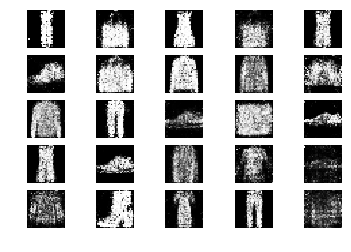

7401 [D loss: 0.676545, acc.: 57.81%] [G loss: 0.827691]
7402 [D loss: 0.663275, acc.: 54.69%] [G loss: 0.807075]
7403 [D loss: 0.695018, acc.: 53.12%] [G loss: 0.877359]
7404 [D loss: 0.605414, acc.: 59.38%] [G loss: 0.879965]
7405 [D loss: 0.679799, acc.: 57.81%] [G loss: 0.859826]
7406 [D loss: 0.616334, acc.: 68.75%] [G loss: 0.967367]
7407 [D loss: 0.588585, acc.: 68.75%] [G loss: 0.905444]
7408 [D loss: 0.645428, acc.: 57.81%] [G loss: 0.890466]
7409 [D loss: 0.652179, acc.: 71.88%] [G loss: 0.818502]
7410 [D loss: 0.636164, acc.: 62.50%] [G loss: 0.922421]
7411 [D loss: 0.653976, acc.: 60.94%] [G loss: 0.922151]
7412 [D loss: 0.654830, acc.: 60.94%] [G loss: 0.815897]
7413 [D loss: 0.608982, acc.: 67.19%] [G loss: 0.806254]
7414 [D loss: 0.628956, acc.: 60.94%] [G loss: 0.945803]
7415 [D loss: 0.617210, acc.: 68.75%] [G loss: 0.909900]
7416 [D loss: 0.578224, acc.: 60.94%] [G loss: 1.001069]
7417 [D loss: 0.649418, acc.: 71.88%] [G loss: 0.879964]
7418 [D loss: 0.699779, acc.: 5

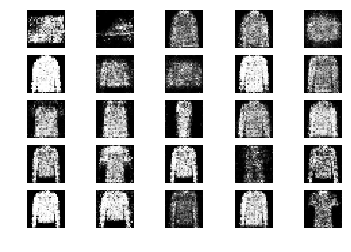

7601 [D loss: 0.664357, acc.: 57.81%] [G loss: 0.954369]
7602 [D loss: 0.644999, acc.: 56.25%] [G loss: 0.920317]
7603 [D loss: 0.717728, acc.: 50.00%] [G loss: 0.884139]
7604 [D loss: 0.648067, acc.: 65.62%] [G loss: 0.864056]
7605 [D loss: 0.644145, acc.: 65.62%] [G loss: 0.945871]
7606 [D loss: 0.691130, acc.: 50.00%] [G loss: 0.887950]
7607 [D loss: 0.704606, acc.: 48.44%] [G loss: 0.850768]
7608 [D loss: 0.641658, acc.: 67.19%] [G loss: 0.877511]
7609 [D loss: 0.642306, acc.: 64.06%] [G loss: 0.944715]
7610 [D loss: 0.676395, acc.: 54.69%] [G loss: 0.853544]
7611 [D loss: 0.668801, acc.: 54.69%] [G loss: 0.900377]
7612 [D loss: 0.658321, acc.: 54.69%] [G loss: 0.903264]
7613 [D loss: 0.679731, acc.: 50.00%] [G loss: 0.901239]
7614 [D loss: 0.630601, acc.: 65.62%] [G loss: 0.862010]
7615 [D loss: 0.614943, acc.: 67.19%] [G loss: 0.865788]
7616 [D loss: 0.617929, acc.: 62.50%] [G loss: 0.902925]
7617 [D loss: 0.698679, acc.: 51.56%] [G loss: 0.851475]
7618 [D loss: 0.585336, acc.: 7

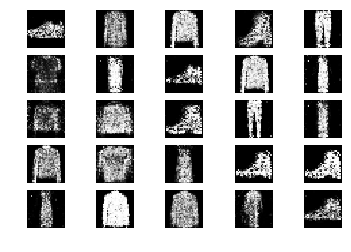

7801 [D loss: 0.637156, acc.: 62.50%] [G loss: 0.936334]
7802 [D loss: 0.624004, acc.: 70.31%] [G loss: 0.904844]
7803 [D loss: 0.611577, acc.: 75.00%] [G loss: 0.901106]
7804 [D loss: 0.609453, acc.: 71.88%] [G loss: 0.822544]
7805 [D loss: 0.664121, acc.: 57.81%] [G loss: 0.806450]
7806 [D loss: 0.584123, acc.: 70.31%] [G loss: 0.853872]
7807 [D loss: 0.725227, acc.: 60.94%] [G loss: 0.907918]
7808 [D loss: 0.648097, acc.: 67.19%] [G loss: 0.942803]
7809 [D loss: 0.678493, acc.: 56.25%] [G loss: 0.887441]
7810 [D loss: 0.664640, acc.: 62.50%] [G loss: 0.832665]
7811 [D loss: 0.674355, acc.: 54.69%] [G loss: 0.828026]
7812 [D loss: 0.653969, acc.: 62.50%] [G loss: 0.881245]
7813 [D loss: 0.719982, acc.: 48.44%] [G loss: 0.854194]
7814 [D loss: 0.711787, acc.: 56.25%] [G loss: 0.864183]
7815 [D loss: 0.584966, acc.: 71.88%] [G loss: 0.864003]
7816 [D loss: 0.645669, acc.: 64.06%] [G loss: 0.889253]
7817 [D loss: 0.688364, acc.: 57.81%] [G loss: 0.853692]
7818 [D loss: 0.636984, acc.: 5

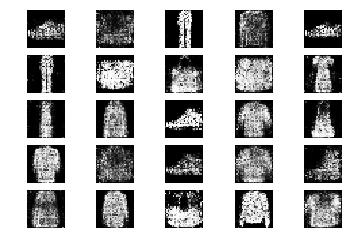

8001 [D loss: 0.667153, acc.: 56.25%] [G loss: 0.918884]
8002 [D loss: 0.658155, acc.: 59.38%] [G loss: 0.852389]
8003 [D loss: 0.661146, acc.: 67.19%] [G loss: 0.869177]
8004 [D loss: 0.640406, acc.: 62.50%] [G loss: 0.891015]
8005 [D loss: 0.650384, acc.: 57.81%] [G loss: 0.903852]
8006 [D loss: 0.633884, acc.: 59.38%] [G loss: 0.906018]
8007 [D loss: 0.696987, acc.: 57.81%] [G loss: 0.838077]
8008 [D loss: 0.680912, acc.: 60.94%] [G loss: 0.867860]
8009 [D loss: 0.671293, acc.: 56.25%] [G loss: 0.826014]
8010 [D loss: 0.639015, acc.: 56.25%] [G loss: 0.855394]
8011 [D loss: 0.681007, acc.: 54.69%] [G loss: 0.819875]
8012 [D loss: 0.609664, acc.: 64.06%] [G loss: 0.887813]
8013 [D loss: 0.689072, acc.: 60.94%] [G loss: 0.898128]
8014 [D loss: 0.647223, acc.: 54.69%] [G loss: 0.792123]
8015 [D loss: 0.592026, acc.: 65.62%] [G loss: 0.842883]
8016 [D loss: 0.644181, acc.: 64.06%] [G loss: 0.791597]
8017 [D loss: 0.686282, acc.: 60.94%] [G loss: 0.822186]
8018 [D loss: 0.643842, acc.: 6

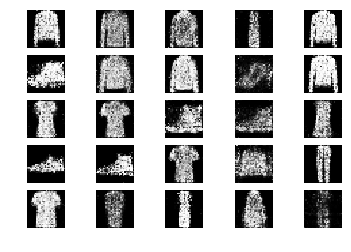

8201 [D loss: 0.665681, acc.: 56.25%] [G loss: 0.867505]
8202 [D loss: 0.654893, acc.: 60.94%] [G loss: 0.869789]
8203 [D loss: 0.637958, acc.: 76.56%] [G loss: 0.969165]
8204 [D loss: 0.658660, acc.: 56.25%] [G loss: 0.942942]
8205 [D loss: 0.684816, acc.: 60.94%] [G loss: 0.874063]
8206 [D loss: 0.592241, acc.: 67.19%] [G loss: 0.834825]
8207 [D loss: 0.609514, acc.: 70.31%] [G loss: 0.925279]
8208 [D loss: 0.705318, acc.: 59.38%] [G loss: 0.996642]
8209 [D loss: 0.674165, acc.: 60.94%] [G loss: 1.022374]
8210 [D loss: 0.779111, acc.: 32.81%] [G loss: 0.940093]
8211 [D loss: 0.632155, acc.: 60.94%] [G loss: 0.920641]
8212 [D loss: 0.581165, acc.: 70.31%] [G loss: 0.891985]
8213 [D loss: 0.738249, acc.: 50.00%] [G loss: 0.959681]
8214 [D loss: 0.709237, acc.: 51.56%] [G loss: 0.841344]
8215 [D loss: 0.638340, acc.: 60.94%] [G loss: 0.909567]
8216 [D loss: 0.668178, acc.: 67.19%] [G loss: 0.865749]
8217 [D loss: 0.617248, acc.: 64.06%] [G loss: 0.923578]
8218 [D loss: 0.686559, acc.: 5

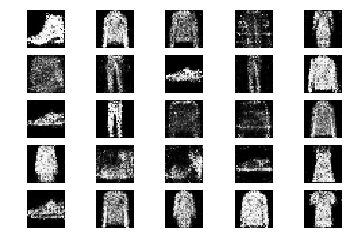

8401 [D loss: 0.649209, acc.: 59.38%] [G loss: 0.866216]
8402 [D loss: 0.658226, acc.: 51.56%] [G loss: 0.846772]
8403 [D loss: 0.727310, acc.: 48.44%] [G loss: 0.831256]
8404 [D loss: 0.642103, acc.: 64.06%] [G loss: 0.775918]
8405 [D loss: 0.595205, acc.: 71.88%] [G loss: 0.849419]
8406 [D loss: 0.702343, acc.: 53.12%] [G loss: 0.870627]
8407 [D loss: 0.649587, acc.: 60.94%] [G loss: 0.920395]
8408 [D loss: 0.657998, acc.: 62.50%] [G loss: 0.833870]
8409 [D loss: 0.602819, acc.: 70.31%] [G loss: 0.908595]
8410 [D loss: 0.708955, acc.: 57.81%] [G loss: 1.008016]
8411 [D loss: 0.611028, acc.: 76.56%] [G loss: 1.018956]
8412 [D loss: 0.721027, acc.: 54.69%] [G loss: 0.829532]
8413 [D loss: 0.670889, acc.: 62.50%] [G loss: 0.911473]
8414 [D loss: 0.667689, acc.: 59.38%] [G loss: 0.817773]
8415 [D loss: 0.628452, acc.: 70.31%] [G loss: 0.917972]
8416 [D loss: 0.601803, acc.: 68.75%] [G loss: 0.835558]
8417 [D loss: 0.670175, acc.: 59.38%] [G loss: 0.844403]
8418 [D loss: 0.638673, acc.: 6

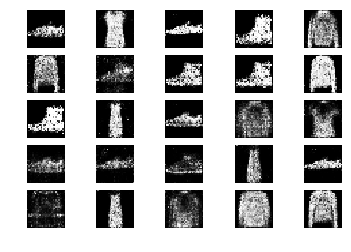

8601 [D loss: 0.662089, acc.: 57.81%] [G loss: 0.860066]
8602 [D loss: 0.664613, acc.: 56.25%] [G loss: 0.809825]
8603 [D loss: 0.663254, acc.: 64.06%] [G loss: 0.852579]
8604 [D loss: 0.675671, acc.: 64.06%] [G loss: 0.901995]
8605 [D loss: 0.700500, acc.: 57.81%] [G loss: 0.846761]
8606 [D loss: 0.659541, acc.: 62.50%] [G loss: 0.891072]
8607 [D loss: 0.700239, acc.: 53.12%] [G loss: 0.859957]
8608 [D loss: 0.679623, acc.: 51.56%] [G loss: 0.928881]
8609 [D loss: 0.647091, acc.: 67.19%] [G loss: 0.905571]
8610 [D loss: 0.694522, acc.: 62.50%] [G loss: 0.912073]
8611 [D loss: 0.639178, acc.: 67.19%] [G loss: 0.913674]
8612 [D loss: 0.637020, acc.: 68.75%] [G loss: 0.981285]
8613 [D loss: 0.757194, acc.: 40.62%] [G loss: 0.934398]
8614 [D loss: 0.686968, acc.: 54.69%] [G loss: 0.873278]
8615 [D loss: 0.668698, acc.: 64.06%] [G loss: 0.947524]
8616 [D loss: 0.616765, acc.: 62.50%] [G loss: 0.871180]
8617 [D loss: 0.665466, acc.: 54.69%] [G loss: 0.843441]
8618 [D loss: 0.637092, acc.: 6

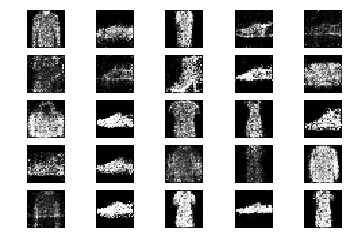

8801 [D loss: 0.690304, acc.: 54.69%] [G loss: 0.894734]
8802 [D loss: 0.697596, acc.: 56.25%] [G loss: 0.836418]
8803 [D loss: 0.641219, acc.: 60.94%] [G loss: 0.789050]
8804 [D loss: 0.651064, acc.: 59.38%] [G loss: 0.893099]
8805 [D loss: 0.671027, acc.: 53.12%] [G loss: 0.855089]
8806 [D loss: 0.684353, acc.: 57.81%] [G loss: 0.823015]
8807 [D loss: 0.635418, acc.: 65.62%] [G loss: 0.963423]
8808 [D loss: 0.675607, acc.: 57.81%] [G loss: 0.860670]
8809 [D loss: 0.729493, acc.: 54.69%] [G loss: 0.884375]
8810 [D loss: 0.661094, acc.: 68.75%] [G loss: 0.848905]
8811 [D loss: 0.686707, acc.: 53.12%] [G loss: 0.892387]
8812 [D loss: 0.687200, acc.: 53.12%] [G loss: 0.897535]
8813 [D loss: 0.644159, acc.: 59.38%] [G loss: 0.801316]
8814 [D loss: 0.688913, acc.: 62.50%] [G loss: 0.885046]
8815 [D loss: 0.671324, acc.: 57.81%] [G loss: 0.841655]
8816 [D loss: 0.690340, acc.: 67.19%] [G loss: 0.904785]
8817 [D loss: 0.650200, acc.: 65.62%] [G loss: 0.989010]
8818 [D loss: 0.635831, acc.: 6

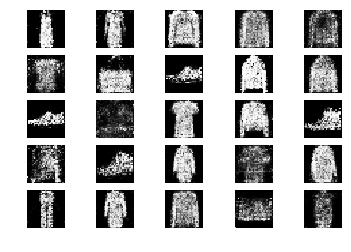

9001 [D loss: 0.650087, acc.: 70.31%] [G loss: 0.844248]
9002 [D loss: 0.663469, acc.: 56.25%] [G loss: 0.857289]
9003 [D loss: 0.696200, acc.: 51.56%] [G loss: 0.891879]
9004 [D loss: 0.712605, acc.: 53.12%] [G loss: 0.973679]
9005 [D loss: 0.660533, acc.: 56.25%] [G loss: 0.970314]
9006 [D loss: 0.645173, acc.: 59.38%] [G loss: 0.897980]
9007 [D loss: 0.703593, acc.: 54.69%] [G loss: 0.904619]
9008 [D loss: 0.670128, acc.: 51.56%] [G loss: 0.945348]
9009 [D loss: 0.747774, acc.: 45.31%] [G loss: 0.913823]
9010 [D loss: 0.686546, acc.: 54.69%] [G loss: 0.922551]
9011 [D loss: 0.666673, acc.: 53.12%] [G loss: 0.931323]
9012 [D loss: 0.659623, acc.: 59.38%] [G loss: 0.918223]
9013 [D loss: 0.666633, acc.: 59.38%] [G loss: 0.933177]
9014 [D loss: 0.665949, acc.: 56.25%] [G loss: 0.808508]
9015 [D loss: 0.659699, acc.: 68.75%] [G loss: 0.992140]
9016 [D loss: 0.691806, acc.: 57.81%] [G loss: 0.931551]
9017 [D loss: 0.676606, acc.: 51.56%] [G loss: 0.938916]
9018 [D loss: 0.628614, acc.: 6

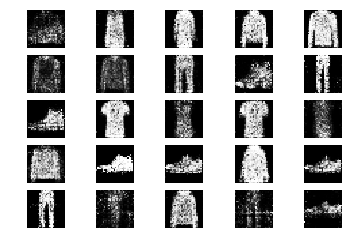

9201 [D loss: 0.689845, acc.: 48.44%] [G loss: 0.986373]
9202 [D loss: 0.614808, acc.: 65.62%] [G loss: 0.925063]
9203 [D loss: 0.716889, acc.: 53.12%] [G loss: 0.934158]
9204 [D loss: 0.597758, acc.: 70.31%] [G loss: 0.899197]
9205 [D loss: 0.633837, acc.: 59.38%] [G loss: 0.914795]
9206 [D loss: 0.575848, acc.: 71.88%] [G loss: 0.878706]
9207 [D loss: 0.595955, acc.: 73.44%] [G loss: 0.879472]
9208 [D loss: 0.740059, acc.: 50.00%] [G loss: 0.852024]
9209 [D loss: 0.642475, acc.: 57.81%] [G loss: 0.811484]
9210 [D loss: 0.696315, acc.: 51.56%] [G loss: 0.972180]
9211 [D loss: 0.580173, acc.: 67.19%] [G loss: 0.944966]
9212 [D loss: 0.653388, acc.: 60.94%] [G loss: 0.880656]
9213 [D loss: 0.590978, acc.: 68.75%] [G loss: 0.961444]
9214 [D loss: 0.691620, acc.: 57.81%] [G loss: 0.936206]
9215 [D loss: 0.692675, acc.: 57.81%] [G loss: 0.824812]
9216 [D loss: 0.620057, acc.: 68.75%] [G loss: 0.885489]
9217 [D loss: 0.667404, acc.: 53.12%] [G loss: 0.947494]
9218 [D loss: 0.692923, acc.: 5

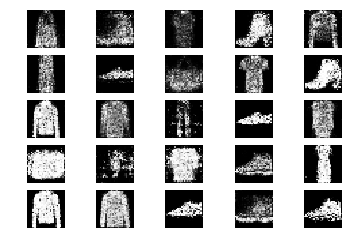

9401 [D loss: 0.641899, acc.: 62.50%] [G loss: 0.973280]
9402 [D loss: 0.620548, acc.: 65.62%] [G loss: 0.917081]
9403 [D loss: 0.715350, acc.: 48.44%] [G loss: 0.835903]
9404 [D loss: 0.670231, acc.: 56.25%] [G loss: 0.885745]
9405 [D loss: 0.657055, acc.: 60.94%] [G loss: 0.905481]
9406 [D loss: 0.694688, acc.: 60.94%] [G loss: 0.912633]
9407 [D loss: 0.685373, acc.: 56.25%] [G loss: 0.895820]
9408 [D loss: 0.709995, acc.: 51.56%] [G loss: 0.907819]
9409 [D loss: 0.634397, acc.: 62.50%] [G loss: 0.902859]
9410 [D loss: 0.606909, acc.: 70.31%] [G loss: 0.961917]
9411 [D loss: 0.657809, acc.: 60.94%] [G loss: 0.917412]
9412 [D loss: 0.743501, acc.: 56.25%] [G loss: 0.933252]
9413 [D loss: 0.664294, acc.: 56.25%] [G loss: 0.932531]
9414 [D loss: 0.692832, acc.: 53.12%] [G loss: 0.803097]
9415 [D loss: 0.670567, acc.: 57.81%] [G loss: 0.897648]
9416 [D loss: 0.693905, acc.: 59.38%] [G loss: 0.933966]
9417 [D loss: 0.635043, acc.: 64.06%] [G loss: 0.895082]
9418 [D loss: 0.677055, acc.: 5

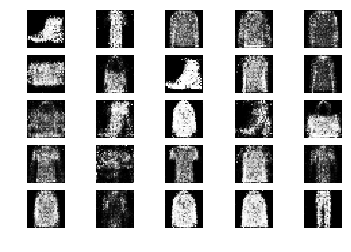

9601 [D loss: 0.677855, acc.: 54.69%] [G loss: 0.896582]
9602 [D loss: 0.685681, acc.: 59.38%] [G loss: 0.945467]
9603 [D loss: 0.624784, acc.: 64.06%] [G loss: 0.898021]
9604 [D loss: 0.685013, acc.: 48.44%] [G loss: 0.869555]
9605 [D loss: 0.604717, acc.: 68.75%] [G loss: 0.836383]
9606 [D loss: 0.635568, acc.: 57.81%] [G loss: 0.958534]
9607 [D loss: 0.646962, acc.: 59.38%] [G loss: 0.848238]
9608 [D loss: 0.700894, acc.: 54.69%] [G loss: 0.875658]
9609 [D loss: 0.765474, acc.: 46.88%] [G loss: 0.841484]
9610 [D loss: 0.674140, acc.: 59.38%] [G loss: 0.930042]
9611 [D loss: 0.653085, acc.: 59.38%] [G loss: 0.977365]
9612 [D loss: 0.612668, acc.: 68.75%] [G loss: 0.906756]
9613 [D loss: 0.681285, acc.: 62.50%] [G loss: 0.899226]
9614 [D loss: 0.661557, acc.: 60.94%] [G loss: 0.880868]
9615 [D loss: 0.633031, acc.: 68.75%] [G loss: 0.881629]
9616 [D loss: 0.685094, acc.: 56.25%] [G loss: 0.843989]
9617 [D loss: 0.654210, acc.: 60.94%] [G loss: 0.860369]
9618 [D loss: 0.659088, acc.: 6

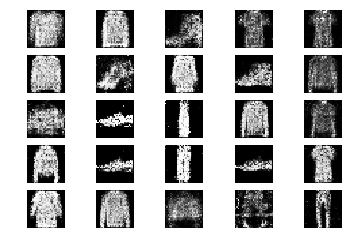

9801 [D loss: 0.674013, acc.: 54.69%] [G loss: 0.796306]
9802 [D loss: 0.664541, acc.: 54.69%] [G loss: 0.797577]
9803 [D loss: 0.675070, acc.: 53.12%] [G loss: 0.825636]
9804 [D loss: 0.687511, acc.: 53.12%] [G loss: 0.843949]
9805 [D loss: 0.722973, acc.: 50.00%] [G loss: 0.778675]
9806 [D loss: 0.702296, acc.: 59.38%] [G loss: 0.908425]
9807 [D loss: 0.670977, acc.: 59.38%] [G loss: 0.888611]
9808 [D loss: 0.669609, acc.: 57.81%] [G loss: 0.966043]
9809 [D loss: 0.618446, acc.: 70.31%] [G loss: 0.896550]
9810 [D loss: 0.652032, acc.: 62.50%] [G loss: 0.843762]
9811 [D loss: 0.674049, acc.: 57.81%] [G loss: 0.853403]
9812 [D loss: 0.663133, acc.: 65.62%] [G loss: 0.862785]
9813 [D loss: 0.696819, acc.: 60.94%] [G loss: 0.943519]
9814 [D loss: 0.655415, acc.: 64.06%] [G loss: 0.855300]
9815 [D loss: 0.641351, acc.: 62.50%] [G loss: 0.854157]
9816 [D loss: 0.608674, acc.: 64.06%] [G loss: 0.805392]
9817 [D loss: 0.695634, acc.: 50.00%] [G loss: 0.849793]
9818 [D loss: 0.634983, acc.: 6

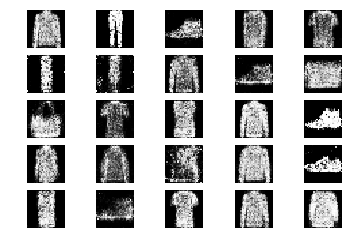

10001 [D loss: 0.639198, acc.: 59.38%] [G loss: 0.876661]
10002 [D loss: 0.618851, acc.: 68.75%] [G loss: 0.854949]
10003 [D loss: 0.602365, acc.: 67.19%] [G loss: 0.859004]
10004 [D loss: 0.657939, acc.: 64.06%] [G loss: 0.898880]
10005 [D loss: 0.628714, acc.: 59.38%] [G loss: 0.862729]
10006 [D loss: 0.681370, acc.: 54.69%] [G loss: 0.872941]
10007 [D loss: 0.675523, acc.: 57.81%] [G loss: 0.843911]
10008 [D loss: 0.652416, acc.: 57.81%] [G loss: 0.862139]
10009 [D loss: 0.664809, acc.: 54.69%] [G loss: 0.839145]
10010 [D loss: 0.647122, acc.: 60.94%] [G loss: 0.737803]
10011 [D loss: 0.698315, acc.: 57.81%] [G loss: 0.919054]
10012 [D loss: 0.685613, acc.: 53.12%] [G loss: 0.855284]
10013 [D loss: 0.677573, acc.: 60.94%] [G loss: 0.940200]
10014 [D loss: 0.637254, acc.: 70.31%] [G loss: 0.938523]
10015 [D loss: 0.664449, acc.: 60.94%] [G loss: 0.965374]
10016 [D loss: 0.684137, acc.: 56.25%] [G loss: 0.972600]
10017 [D loss: 0.654325, acc.: 62.50%] [G loss: 0.929160]
10018 [D loss:

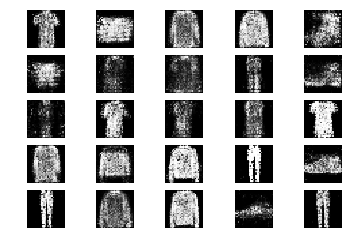

10201 [D loss: 0.652562, acc.: 59.38%] [G loss: 0.952340]
10202 [D loss: 0.620409, acc.: 68.75%] [G loss: 0.837361]
10203 [D loss: 0.662116, acc.: 54.69%] [G loss: 0.873853]
10204 [D loss: 0.667508, acc.: 62.50%] [G loss: 0.876057]
10205 [D loss: 0.718570, acc.: 51.56%] [G loss: 0.899575]
10206 [D loss: 0.693614, acc.: 54.69%] [G loss: 0.893505]
10207 [D loss: 0.647598, acc.: 57.81%] [G loss: 0.929372]
10208 [D loss: 0.690355, acc.: 50.00%] [G loss: 0.957464]
10209 [D loss: 0.706345, acc.: 54.69%] [G loss: 0.935301]
10210 [D loss: 0.706426, acc.: 51.56%] [G loss: 0.854999]
10211 [D loss: 0.662925, acc.: 62.50%] [G loss: 0.870669]
10212 [D loss: 0.652448, acc.: 70.31%] [G loss: 0.898142]
10213 [D loss: 0.717994, acc.: 59.38%] [G loss: 0.853085]
10214 [D loss: 0.619607, acc.: 65.62%] [G loss: 0.838725]
10215 [D loss: 0.651014, acc.: 59.38%] [G loss: 0.882724]
10216 [D loss: 0.674048, acc.: 59.38%] [G loss: 0.863722]
10217 [D loss: 0.633699, acc.: 64.06%] [G loss: 0.907379]
10218 [D loss:

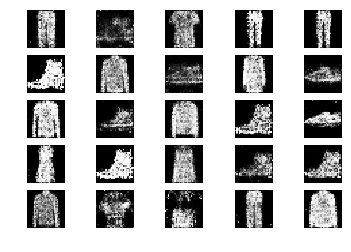

10401 [D loss: 0.652425, acc.: 57.81%] [G loss: 0.942453]
10402 [D loss: 0.643492, acc.: 64.06%] [G loss: 0.914904]
10403 [D loss: 0.680714, acc.: 60.94%] [G loss: 0.842210]
10404 [D loss: 0.664507, acc.: 54.69%] [G loss: 0.834620]
10405 [D loss: 0.682011, acc.: 53.12%] [G loss: 0.920429]
10406 [D loss: 0.687250, acc.: 50.00%] [G loss: 0.929089]
10407 [D loss: 0.599725, acc.: 70.31%] [G loss: 0.956997]
10408 [D loss: 0.635338, acc.: 62.50%] [G loss: 0.892391]
10409 [D loss: 0.626063, acc.: 60.94%] [G loss: 1.028931]
10410 [D loss: 0.787494, acc.: 42.19%] [G loss: 0.892473]
10411 [D loss: 0.655665, acc.: 57.81%] [G loss: 0.972519]
10412 [D loss: 0.706298, acc.: 51.56%] [G loss: 0.926559]
10413 [D loss: 0.647864, acc.: 54.69%] [G loss: 0.941056]
10414 [D loss: 0.660995, acc.: 54.69%] [G loss: 0.948998]
10415 [D loss: 0.670354, acc.: 60.94%] [G loss: 0.959195]
10416 [D loss: 0.714832, acc.: 50.00%] [G loss: 0.896248]
10417 [D loss: 0.657012, acc.: 60.94%] [G loss: 0.871718]
10418 [D loss:

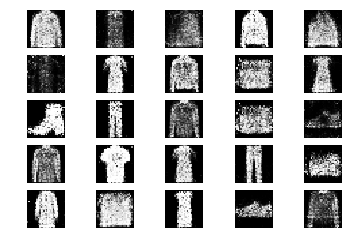

10601 [D loss: 0.667695, acc.: 57.81%] [G loss: 0.896561]
10602 [D loss: 0.700082, acc.: 57.81%] [G loss: 0.822440]
10603 [D loss: 0.680542, acc.: 59.38%] [G loss: 0.837322]
10604 [D loss: 0.641188, acc.: 62.50%] [G loss: 0.809007]
10605 [D loss: 0.650036, acc.: 65.62%] [G loss: 0.853910]
10606 [D loss: 0.638029, acc.: 57.81%] [G loss: 0.758171]
10607 [D loss: 0.711203, acc.: 60.94%] [G loss: 0.899709]
10608 [D loss: 0.679584, acc.: 48.44%] [G loss: 0.851767]
10609 [D loss: 0.633852, acc.: 60.94%] [G loss: 0.978850]
10610 [D loss: 0.679811, acc.: 56.25%] [G loss: 0.903246]
10611 [D loss: 0.655950, acc.: 65.62%] [G loss: 0.812865]
10612 [D loss: 0.628229, acc.: 67.19%] [G loss: 0.869813]
10613 [D loss: 0.724550, acc.: 54.69%] [G loss: 0.812448]
10614 [D loss: 0.636472, acc.: 65.62%] [G loss: 0.935940]
10615 [D loss: 0.663708, acc.: 54.69%] [G loss: 0.928100]
10616 [D loss: 0.615733, acc.: 65.62%] [G loss: 0.940087]
10617 [D loss: 0.679812, acc.: 54.69%] [G loss: 0.945273]
10618 [D loss:

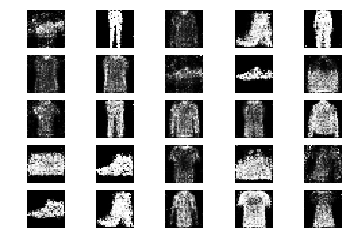

10801 [D loss: 0.685690, acc.: 62.50%] [G loss: 0.902886]
10802 [D loss: 0.648440, acc.: 59.38%] [G loss: 0.911283]
10803 [D loss: 0.646571, acc.: 60.94%] [G loss: 0.951253]
10804 [D loss: 0.662148, acc.: 62.50%] [G loss: 0.877522]
10805 [D loss: 0.614869, acc.: 68.75%] [G loss: 0.884093]
10806 [D loss: 0.640773, acc.: 68.75%] [G loss: 0.893420]
10807 [D loss: 0.631591, acc.: 64.06%] [G loss: 0.895632]
10808 [D loss: 0.643933, acc.: 67.19%] [G loss: 0.899341]
10809 [D loss: 0.578511, acc.: 73.44%] [G loss: 0.880522]
10810 [D loss: 0.640589, acc.: 60.94%] [G loss: 0.921211]
10811 [D loss: 0.601639, acc.: 67.19%] [G loss: 0.863364]
10812 [D loss: 0.614135, acc.: 59.38%] [G loss: 0.891097]
10813 [D loss: 0.644595, acc.: 65.62%] [G loss: 0.891852]
10814 [D loss: 0.699557, acc.: 57.81%] [G loss: 0.858858]
10815 [D loss: 0.622336, acc.: 65.62%] [G loss: 0.795412]
10816 [D loss: 0.630940, acc.: 71.88%] [G loss: 0.768950]
10817 [D loss: 0.625396, acc.: 60.94%] [G loss: 0.942519]
10818 [D loss:

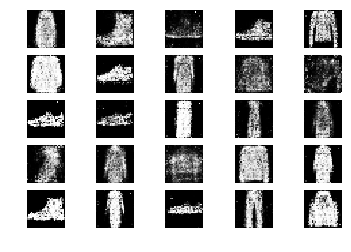

11001 [D loss: 0.668725, acc.: 56.25%] [G loss: 0.959792]
11002 [D loss: 0.621696, acc.: 64.06%] [G loss: 0.983265]
11003 [D loss: 0.701420, acc.: 62.50%] [G loss: 0.785448]
11004 [D loss: 0.672339, acc.: 60.94%] [G loss: 0.890385]
11005 [D loss: 0.680071, acc.: 54.69%] [G loss: 0.865477]
11006 [D loss: 0.642070, acc.: 67.19%] [G loss: 0.911647]
11007 [D loss: 0.680827, acc.: 51.56%] [G loss: 0.887436]
11008 [D loss: 0.686067, acc.: 53.12%] [G loss: 0.853784]
11009 [D loss: 0.670414, acc.: 60.94%] [G loss: 0.859788]
11010 [D loss: 0.691538, acc.: 57.81%] [G loss: 0.888474]
11011 [D loss: 0.614847, acc.: 67.19%] [G loss: 0.862788]
11012 [D loss: 0.655380, acc.: 62.50%] [G loss: 0.862101]
11013 [D loss: 0.650541, acc.: 59.38%] [G loss: 0.826218]
11014 [D loss: 0.685974, acc.: 67.19%] [G loss: 0.892338]
11015 [D loss: 0.663031, acc.: 60.94%] [G loss: 0.937433]
11016 [D loss: 0.648578, acc.: 59.38%] [G loss: 0.858638]
11017 [D loss: 0.681883, acc.: 53.12%] [G loss: 0.920504]
11018 [D loss:

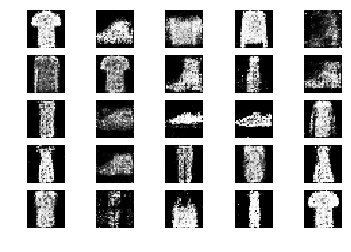

11201 [D loss: 0.641560, acc.: 62.50%] [G loss: 0.899834]
11202 [D loss: 0.662637, acc.: 51.56%] [G loss: 0.902759]
11203 [D loss: 0.637834, acc.: 68.75%] [G loss: 1.059859]
11204 [D loss: 0.712994, acc.: 57.81%] [G loss: 0.946795]
11205 [D loss: 0.695861, acc.: 53.12%] [G loss: 0.875670]
11206 [D loss: 0.656458, acc.: 59.38%] [G loss: 0.900083]
11207 [D loss: 0.689444, acc.: 54.69%] [G loss: 0.919601]
11208 [D loss: 0.650753, acc.: 62.50%] [G loss: 0.949539]
11209 [D loss: 0.659831, acc.: 60.94%] [G loss: 0.893892]
11210 [D loss: 0.714906, acc.: 59.38%] [G loss: 0.952464]
11211 [D loss: 0.672818, acc.: 59.38%] [G loss: 0.830722]
11212 [D loss: 0.642049, acc.: 64.06%] [G loss: 0.957776]
11213 [D loss: 0.654758, acc.: 64.06%] [G loss: 0.955723]
11214 [D loss: 0.620452, acc.: 67.19%] [G loss: 1.036853]
11215 [D loss: 0.677562, acc.: 57.81%] [G loss: 0.909289]
11216 [D loss: 0.615813, acc.: 68.75%] [G loss: 0.898696]
11217 [D loss: 0.669379, acc.: 56.25%] [G loss: 0.857166]
11218 [D loss:

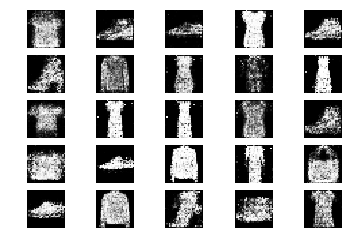

11401 [D loss: 0.660031, acc.: 64.06%] [G loss: 0.804813]
11402 [D loss: 0.662481, acc.: 54.69%] [G loss: 0.854331]
11403 [D loss: 0.677958, acc.: 51.56%] [G loss: 0.787024]
11404 [D loss: 0.691345, acc.: 56.25%] [G loss: 0.869155]
11405 [D loss: 0.660792, acc.: 54.69%] [G loss: 0.897191]
11406 [D loss: 0.655191, acc.: 62.50%] [G loss: 0.826858]
11407 [D loss: 0.709147, acc.: 53.12%] [G loss: 0.846365]
11408 [D loss: 0.618903, acc.: 65.62%] [G loss: 0.935283]
11409 [D loss: 0.632080, acc.: 65.62%] [G loss: 0.848256]
11410 [D loss: 0.712295, acc.: 53.12%] [G loss: 0.837250]
11411 [D loss: 0.642094, acc.: 70.31%] [G loss: 0.939792]
11412 [D loss: 0.685691, acc.: 54.69%] [G loss: 0.854821]
11413 [D loss: 0.655332, acc.: 54.69%] [G loss: 0.817033]
11414 [D loss: 0.660294, acc.: 53.12%] [G loss: 0.798867]
11415 [D loss: 0.658847, acc.: 54.69%] [G loss: 0.818087]
11416 [D loss: 0.660418, acc.: 56.25%] [G loss: 0.874273]
11417 [D loss: 0.641563, acc.: 64.06%] [G loss: 0.918969]
11418 [D loss:

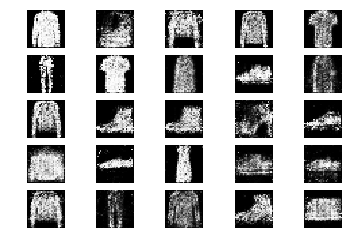

11601 [D loss: 0.722872, acc.: 56.25%] [G loss: 0.893810]
11602 [D loss: 0.629060, acc.: 67.19%] [G loss: 0.924612]
11603 [D loss: 0.646502, acc.: 65.62%] [G loss: 0.905601]
11604 [D loss: 0.665792, acc.: 51.56%] [G loss: 0.870273]
11605 [D loss: 0.666507, acc.: 59.38%] [G loss: 0.814766]
11606 [D loss: 0.690247, acc.: 53.12%] [G loss: 0.826042]
11607 [D loss: 0.664064, acc.: 62.50%] [G loss: 0.856891]
11608 [D loss: 0.645765, acc.: 64.06%] [G loss: 0.855724]
11609 [D loss: 0.685954, acc.: 60.94%] [G loss: 0.875880]
11610 [D loss: 0.613526, acc.: 64.06%] [G loss: 0.864071]
11611 [D loss: 0.633301, acc.: 59.38%] [G loss: 0.866798]
11612 [D loss: 0.707508, acc.: 53.12%] [G loss: 0.850347]
11613 [D loss: 0.649521, acc.: 64.06%] [G loss: 0.827160]
11614 [D loss: 0.687105, acc.: 46.88%] [G loss: 0.794240]
11615 [D loss: 0.676852, acc.: 65.62%] [G loss: 0.871957]
11616 [D loss: 0.652253, acc.: 56.25%] [G loss: 0.838790]
11617 [D loss: 0.683062, acc.: 56.25%] [G loss: 0.906977]
11618 [D loss:

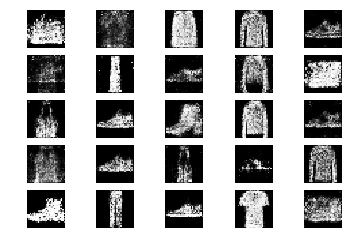

11801 [D loss: 0.585783, acc.: 73.44%] [G loss: 0.935081]
11802 [D loss: 0.590331, acc.: 68.75%] [G loss: 0.858767]
11803 [D loss: 0.687869, acc.: 53.12%] [G loss: 0.850290]
11804 [D loss: 0.737808, acc.: 53.12%] [G loss: 0.832642]
11805 [D loss: 0.649702, acc.: 64.06%] [G loss: 0.913121]
11806 [D loss: 0.684569, acc.: 51.56%] [G loss: 0.964161]
11807 [D loss: 0.615527, acc.: 68.75%] [G loss: 0.928101]
11808 [D loss: 0.650984, acc.: 64.06%] [G loss: 0.918322]
11809 [D loss: 0.630678, acc.: 68.75%] [G loss: 0.969595]
11810 [D loss: 0.638477, acc.: 53.12%] [G loss: 0.908299]
11811 [D loss: 0.708252, acc.: 53.12%] [G loss: 0.918776]
11812 [D loss: 0.670414, acc.: 48.44%] [G loss: 0.906522]
11813 [D loss: 0.654942, acc.: 59.38%] [G loss: 1.000552]
11814 [D loss: 0.646136, acc.: 62.50%] [G loss: 0.966137]
11815 [D loss: 0.682319, acc.: 59.38%] [G loss: 0.907281]
11816 [D loss: 0.629591, acc.: 70.31%] [G loss: 0.907417]
11817 [D loss: 0.651124, acc.: 60.94%] [G loss: 0.861381]
11818 [D loss:

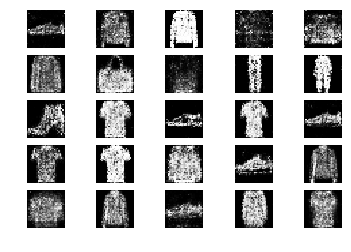

12001 [D loss: 0.621041, acc.: 62.50%] [G loss: 0.865421]
12002 [D loss: 0.617295, acc.: 65.62%] [G loss: 0.906230]
12003 [D loss: 0.635433, acc.: 71.88%] [G loss: 0.957670]
12004 [D loss: 0.689366, acc.: 56.25%] [G loss: 0.913393]
12005 [D loss: 0.636654, acc.: 64.06%] [G loss: 0.900922]
12006 [D loss: 0.672683, acc.: 57.81%] [G loss: 1.033209]
12007 [D loss: 0.652581, acc.: 71.88%] [G loss: 0.884012]
12008 [D loss: 0.699113, acc.: 56.25%] [G loss: 0.921602]
12009 [D loss: 0.649086, acc.: 59.38%] [G loss: 0.865534]
12010 [D loss: 0.637562, acc.: 60.94%] [G loss: 0.848367]
12011 [D loss: 0.657032, acc.: 65.62%] [G loss: 0.854834]
12012 [D loss: 0.612640, acc.: 60.94%] [G loss: 0.811809]
12013 [D loss: 0.667149, acc.: 65.62%] [G loss: 0.808589]
12014 [D loss: 0.644418, acc.: 59.38%] [G loss: 0.830156]
12015 [D loss: 0.611055, acc.: 65.62%] [G loss: 0.809006]
12016 [D loss: 0.629929, acc.: 59.38%] [G loss: 0.884502]
12017 [D loss: 0.734859, acc.: 51.56%] [G loss: 0.904351]
12018 [D loss:

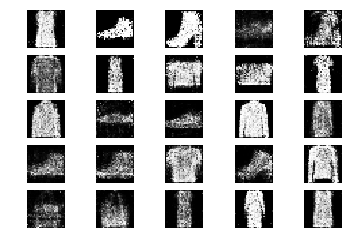

12201 [D loss: 0.731734, acc.: 50.00%] [G loss: 0.839807]
12202 [D loss: 0.637170, acc.: 60.94%] [G loss: 0.931609]
12203 [D loss: 0.683063, acc.: 54.69%] [G loss: 0.868632]
12204 [D loss: 0.689989, acc.: 50.00%] [G loss: 0.913110]
12205 [D loss: 0.676827, acc.: 54.69%] [G loss: 0.843240]
12206 [D loss: 0.695557, acc.: 56.25%] [G loss: 0.892166]
12207 [D loss: 0.641891, acc.: 67.19%] [G loss: 0.942083]
12208 [D loss: 0.701966, acc.: 53.12%] [G loss: 0.866950]
12209 [D loss: 0.664759, acc.: 62.50%] [G loss: 0.823792]
12210 [D loss: 0.640787, acc.: 65.62%] [G loss: 0.919760]
12211 [D loss: 0.631868, acc.: 68.75%] [G loss: 1.019503]
12212 [D loss: 0.685041, acc.: 53.12%] [G loss: 0.990673]
12213 [D loss: 0.644522, acc.: 59.38%] [G loss: 0.978758]
12214 [D loss: 0.685770, acc.: 56.25%] [G loss: 0.938935]
12215 [D loss: 0.683994, acc.: 59.38%] [G loss: 0.800295]
12216 [D loss: 0.699413, acc.: 46.88%] [G loss: 0.892113]
12217 [D loss: 0.663740, acc.: 57.81%] [G loss: 0.892447]
12218 [D loss:

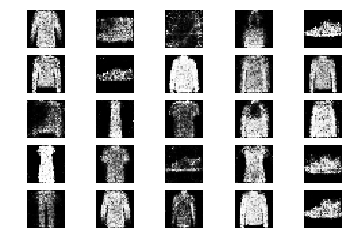

12401 [D loss: 0.707990, acc.: 53.12%] [G loss: 0.966820]
12402 [D loss: 0.689099, acc.: 56.25%] [G loss: 0.998475]
12403 [D loss: 0.657382, acc.: 56.25%] [G loss: 0.899599]
12404 [D loss: 0.682435, acc.: 65.62%] [G loss: 0.908105]
12405 [D loss: 0.656110, acc.: 64.06%] [G loss: 0.908094]
12406 [D loss: 0.636322, acc.: 60.94%] [G loss: 0.917388]
12407 [D loss: 0.632812, acc.: 65.62%] [G loss: 0.838920]
12408 [D loss: 0.635237, acc.: 62.50%] [G loss: 0.923103]
12409 [D loss: 0.591473, acc.: 71.88%] [G loss: 0.869222]
12410 [D loss: 0.698608, acc.: 53.12%] [G loss: 0.919809]
12411 [D loss: 0.643569, acc.: 60.94%] [G loss: 0.965720]
12412 [D loss: 0.684014, acc.: 54.69%] [G loss: 0.933494]
12413 [D loss: 0.681434, acc.: 51.56%] [G loss: 0.827795]
12414 [D loss: 0.633417, acc.: 56.25%] [G loss: 0.930735]
12415 [D loss: 0.643973, acc.: 62.50%] [G loss: 0.878330]
12416 [D loss: 0.642419, acc.: 60.94%] [G loss: 0.985004]
12417 [D loss: 0.741952, acc.: 45.31%] [G loss: 0.872433]
12418 [D loss:

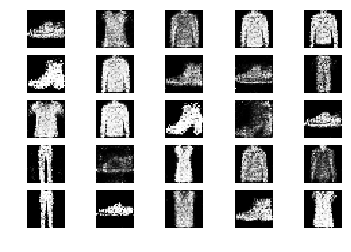

12601 [D loss: 0.650167, acc.: 62.50%] [G loss: 0.864549]
12602 [D loss: 0.644488, acc.: 60.94%] [G loss: 0.820839]
12603 [D loss: 0.643368, acc.: 62.50%] [G loss: 0.807319]
12604 [D loss: 0.608774, acc.: 64.06%] [G loss: 0.988335]
12605 [D loss: 0.663282, acc.: 60.94%] [G loss: 0.863976]
12606 [D loss: 0.596220, acc.: 70.31%] [G loss: 0.929231]
12607 [D loss: 0.644352, acc.: 64.06%] [G loss: 0.868764]
12608 [D loss: 0.652221, acc.: 62.50%] [G loss: 0.942985]
12609 [D loss: 0.690199, acc.: 51.56%] [G loss: 0.970505]
12610 [D loss: 0.664418, acc.: 60.94%] [G loss: 0.885305]
12611 [D loss: 0.637264, acc.: 56.25%] [G loss: 0.868824]
12612 [D loss: 0.634200, acc.: 67.19%] [G loss: 0.903663]
12613 [D loss: 0.662660, acc.: 53.12%] [G loss: 0.820530]
12614 [D loss: 0.681714, acc.: 53.12%] [G loss: 0.902479]
12615 [D loss: 0.630668, acc.: 59.38%] [G loss: 0.987070]
12616 [D loss: 0.668977, acc.: 65.62%] [G loss: 0.818214]
12617 [D loss: 0.699817, acc.: 51.56%] [G loss: 0.864362]
12618 [D loss:

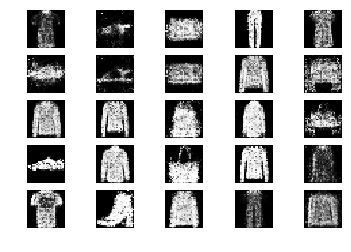

12801 [D loss: 0.645609, acc.: 54.69%] [G loss: 0.940059]
12802 [D loss: 0.669955, acc.: 62.50%] [G loss: 0.884026]
12803 [D loss: 0.640543, acc.: 64.06%] [G loss: 0.867541]
12804 [D loss: 0.723965, acc.: 53.12%] [G loss: 0.928210]
12805 [D loss: 0.674987, acc.: 56.25%] [G loss: 0.865937]
12806 [D loss: 0.650453, acc.: 60.94%] [G loss: 0.888176]
12807 [D loss: 0.605577, acc.: 67.19%] [G loss: 0.928741]
12808 [D loss: 0.641587, acc.: 62.50%] [G loss: 0.912012]
12809 [D loss: 0.697256, acc.: 59.38%] [G loss: 0.878397]
12810 [D loss: 0.697694, acc.: 50.00%] [G loss: 0.786531]
12811 [D loss: 0.645915, acc.: 62.50%] [G loss: 0.848981]
12812 [D loss: 0.651728, acc.: 64.06%] [G loss: 0.880060]
12813 [D loss: 0.637664, acc.: 68.75%] [G loss: 0.918194]
12814 [D loss: 0.659722, acc.: 57.81%] [G loss: 0.861350]
12815 [D loss: 0.671963, acc.: 54.69%] [G loss: 0.912544]
12816 [D loss: 0.592990, acc.: 67.19%] [G loss: 0.966933]
12817 [D loss: 0.674933, acc.: 48.44%] [G loss: 0.931462]
12818 [D loss:

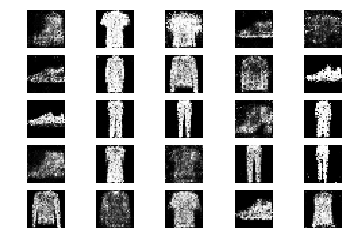

13001 [D loss: 0.648297, acc.: 67.19%] [G loss: 0.904192]
13002 [D loss: 0.667884, acc.: 60.94%] [G loss: 0.894132]
13003 [D loss: 0.612134, acc.: 62.50%] [G loss: 0.919023]
13004 [D loss: 0.654420, acc.: 64.06%] [G loss: 0.889558]
13005 [D loss: 0.684360, acc.: 53.12%] [G loss: 0.938666]
13006 [D loss: 0.705292, acc.: 59.38%] [G loss: 0.864728]
13007 [D loss: 0.683883, acc.: 50.00%] [G loss: 0.905161]
13008 [D loss: 0.588327, acc.: 67.19%] [G loss: 0.938666]
13009 [D loss: 0.654493, acc.: 54.69%] [G loss: 0.944287]
13010 [D loss: 0.667955, acc.: 64.06%] [G loss: 0.967695]
13011 [D loss: 0.611355, acc.: 59.38%] [G loss: 0.899637]
13012 [D loss: 0.639377, acc.: 59.38%] [G loss: 0.834806]
13013 [D loss: 0.675869, acc.: 53.12%] [G loss: 0.812939]
13014 [D loss: 0.607634, acc.: 65.62%] [G loss: 0.853199]
13015 [D loss: 0.607860, acc.: 67.19%] [G loss: 0.883349]
13016 [D loss: 0.656338, acc.: 64.06%] [G loss: 0.842414]
13017 [D loss: 0.694655, acc.: 48.44%] [G loss: 0.883813]
13018 [D loss:

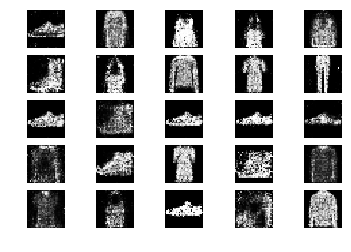

13201 [D loss: 0.666265, acc.: 59.38%] [G loss: 0.949398]
13202 [D loss: 0.644083, acc.: 67.19%] [G loss: 0.907436]
13203 [D loss: 0.621214, acc.: 67.19%] [G loss: 0.864639]
13204 [D loss: 0.709469, acc.: 42.19%] [G loss: 0.859473]
13205 [D loss: 0.638040, acc.: 67.19%] [G loss: 0.916575]
13206 [D loss: 0.721986, acc.: 64.06%] [G loss: 0.952938]
13207 [D loss: 0.616206, acc.: 60.94%] [G loss: 0.952327]
13208 [D loss: 0.630192, acc.: 70.31%] [G loss: 0.954575]
13209 [D loss: 0.650832, acc.: 59.38%] [G loss: 0.916407]
13210 [D loss: 0.702109, acc.: 50.00%] [G loss: 0.931575]
13211 [D loss: 0.665096, acc.: 57.81%] [G loss: 0.863896]
13212 [D loss: 0.654908, acc.: 57.81%] [G loss: 0.838741]
13213 [D loss: 0.632765, acc.: 65.62%] [G loss: 0.851505]
13214 [D loss: 0.663336, acc.: 60.94%] [G loss: 0.901111]
13215 [D loss: 0.625759, acc.: 67.19%] [G loss: 0.867733]
13216 [D loss: 0.632338, acc.: 64.06%] [G loss: 0.838574]
13217 [D loss: 0.647759, acc.: 65.62%] [G loss: 0.932074]
13218 [D loss:

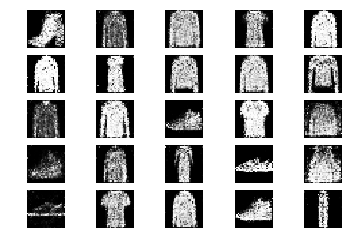

13401 [D loss: 0.682160, acc.: 54.69%] [G loss: 0.931227]
13402 [D loss: 0.654271, acc.: 60.94%] [G loss: 0.991886]
13403 [D loss: 0.623908, acc.: 64.06%] [G loss: 0.977102]
13404 [D loss: 0.657157, acc.: 62.50%] [G loss: 0.958778]
13405 [D loss: 0.641397, acc.: 60.94%] [G loss: 0.870758]
13406 [D loss: 0.688423, acc.: 64.06%] [G loss: 0.922622]
13407 [D loss: 0.675217, acc.: 57.81%] [G loss: 0.869219]
13408 [D loss: 0.648222, acc.: 64.06%] [G loss: 0.885277]
13409 [D loss: 0.693270, acc.: 54.69%] [G loss: 0.834630]
13410 [D loss: 0.706873, acc.: 53.12%] [G loss: 0.897447]
13411 [D loss: 0.599569, acc.: 70.31%] [G loss: 0.931215]
13412 [D loss: 0.611301, acc.: 68.75%] [G loss: 0.868778]
13413 [D loss: 0.704797, acc.: 46.88%] [G loss: 0.947962]
13414 [D loss: 0.643143, acc.: 67.19%] [G loss: 0.873466]
13415 [D loss: 0.654205, acc.: 62.50%] [G loss: 0.956503]
13416 [D loss: 0.626726, acc.: 67.19%] [G loss: 0.979675]
13417 [D loss: 0.666661, acc.: 67.19%] [G loss: 0.933023]
13418 [D loss:

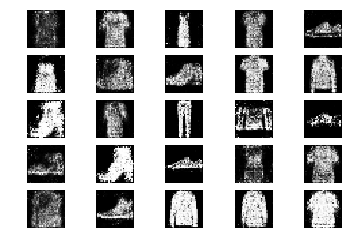

13601 [D loss: 0.596077, acc.: 68.75%] [G loss: 0.871644]
13602 [D loss: 0.697560, acc.: 62.50%] [G loss: 0.967657]
13603 [D loss: 0.710859, acc.: 51.56%] [G loss: 0.867273]
13604 [D loss: 0.652346, acc.: 59.38%] [G loss: 0.859214]
13605 [D loss: 0.659290, acc.: 64.06%] [G loss: 0.936420]
13606 [D loss: 0.669308, acc.: 60.94%] [G loss: 0.934687]
13607 [D loss: 0.667258, acc.: 56.25%] [G loss: 0.929984]
13608 [D loss: 0.666860, acc.: 54.69%] [G loss: 0.875284]
13609 [D loss: 0.614167, acc.: 65.62%] [G loss: 0.996049]
13610 [D loss: 0.642425, acc.: 68.75%] [G loss: 0.939912]
13611 [D loss: 0.611610, acc.: 70.31%] [G loss: 0.925270]
13612 [D loss: 0.666620, acc.: 64.06%] [G loss: 0.888942]
13613 [D loss: 0.681417, acc.: 54.69%] [G loss: 0.915338]
13614 [D loss: 0.625168, acc.: 67.19%] [G loss: 0.895668]
13615 [D loss: 0.684593, acc.: 59.38%] [G loss: 0.930508]
13616 [D loss: 0.648866, acc.: 53.12%] [G loss: 0.901675]
13617 [D loss: 0.643318, acc.: 60.94%] [G loss: 0.872811]
13618 [D loss:

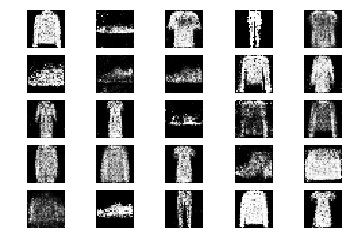

13801 [D loss: 0.704370, acc.: 56.25%] [G loss: 0.902145]
13802 [D loss: 0.655958, acc.: 62.50%] [G loss: 0.906369]
13803 [D loss: 0.632962, acc.: 68.75%] [G loss: 0.971151]
13804 [D loss: 0.638418, acc.: 64.06%] [G loss: 0.919573]
13805 [D loss: 0.661516, acc.: 57.81%] [G loss: 0.888475]
13806 [D loss: 0.692175, acc.: 54.69%] [G loss: 0.871198]
13807 [D loss: 0.612024, acc.: 65.62%] [G loss: 0.838603]
13808 [D loss: 0.652941, acc.: 62.50%] [G loss: 0.962357]
13809 [D loss: 0.605589, acc.: 75.00%] [G loss: 0.927683]
13810 [D loss: 0.679213, acc.: 53.12%] [G loss: 0.845843]
13811 [D loss: 0.676171, acc.: 60.94%] [G loss: 0.894225]
13812 [D loss: 0.652753, acc.: 60.94%] [G loss: 0.950320]
13813 [D loss: 0.585109, acc.: 75.00%] [G loss: 0.940120]
13814 [D loss: 0.613061, acc.: 67.19%] [G loss: 0.903024]
13815 [D loss: 0.613002, acc.: 68.75%] [G loss: 0.933248]
13816 [D loss: 0.621577, acc.: 64.06%] [G loss: 0.974007]
13817 [D loss: 0.606213, acc.: 64.06%] [G loss: 0.925387]
13818 [D loss:

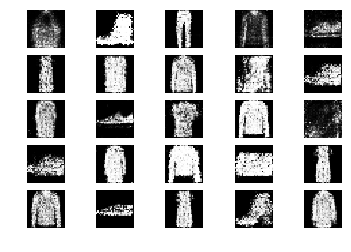

14001 [D loss: 0.690980, acc.: 54.69%] [G loss: 0.957093]
14002 [D loss: 0.666273, acc.: 56.25%] [G loss: 0.936372]
14003 [D loss: 0.679844, acc.: 57.81%] [G loss: 0.908005]
14004 [D loss: 0.643451, acc.: 60.94%] [G loss: 0.853629]
14005 [D loss: 0.635886, acc.: 62.50%] [G loss: 0.839716]
14006 [D loss: 0.628073, acc.: 65.62%] [G loss: 0.854579]
14007 [D loss: 0.680051, acc.: 59.38%] [G loss: 0.837763]
14008 [D loss: 0.730659, acc.: 51.56%] [G loss: 0.909196]
14009 [D loss: 0.621216, acc.: 67.19%] [G loss: 0.984477]
14010 [D loss: 0.742663, acc.: 45.31%] [G loss: 0.918990]
14011 [D loss: 0.683920, acc.: 50.00%] [G loss: 0.900927]
14012 [D loss: 0.614836, acc.: 71.88%] [G loss: 0.931553]
14013 [D loss: 0.588202, acc.: 68.75%] [G loss: 0.884813]
14014 [D loss: 0.712817, acc.: 53.12%] [G loss: 0.853491]
14015 [D loss: 0.681315, acc.: 57.81%] [G loss: 0.956819]
14016 [D loss: 0.700845, acc.: 59.38%] [G loss: 0.883869]
14017 [D loss: 0.692308, acc.: 56.25%] [G loss: 0.943404]
14018 [D loss:

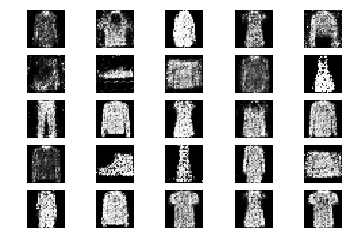

14201 [D loss: 0.685583, acc.: 53.12%] [G loss: 0.805493]
14202 [D loss: 0.638500, acc.: 67.19%] [G loss: 0.866507]
14203 [D loss: 0.716515, acc.: 53.12%] [G loss: 0.872135]
14204 [D loss: 0.663646, acc.: 64.06%] [G loss: 0.836179]
14205 [D loss: 0.680389, acc.: 54.69%] [G loss: 0.863731]
14206 [D loss: 0.607178, acc.: 64.06%] [G loss: 0.884679]
14207 [D loss: 0.681767, acc.: 60.94%] [G loss: 0.784743]
14208 [D loss: 0.683804, acc.: 48.44%] [G loss: 0.874999]
14209 [D loss: 0.685763, acc.: 56.25%] [G loss: 0.826802]
14210 [D loss: 0.633147, acc.: 59.38%] [G loss: 0.897122]
14211 [D loss: 0.609347, acc.: 68.75%] [G loss: 0.913206]
14212 [D loss: 0.699441, acc.: 56.25%] [G loss: 0.869820]
14213 [D loss: 0.682605, acc.: 56.25%] [G loss: 1.001477]
14214 [D loss: 0.638710, acc.: 67.19%] [G loss: 0.901410]
14215 [D loss: 0.649191, acc.: 59.38%] [G loss: 0.917342]
14216 [D loss: 0.638190, acc.: 65.62%] [G loss: 1.101432]
14217 [D loss: 0.574793, acc.: 71.88%] [G loss: 0.965935]
14218 [D loss:

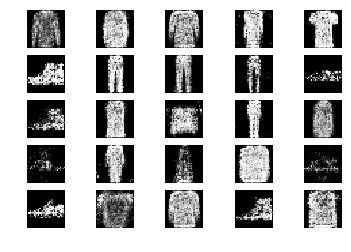

14401 [D loss: 0.669437, acc.: 60.94%] [G loss: 0.929313]
14402 [D loss: 0.657739, acc.: 64.06%] [G loss: 0.963173]
14403 [D loss: 0.617524, acc.: 65.62%] [G loss: 0.975648]
14404 [D loss: 0.626876, acc.: 59.38%] [G loss: 0.978753]
14405 [D loss: 0.700506, acc.: 54.69%] [G loss: 0.926220]
14406 [D loss: 0.591433, acc.: 67.19%] [G loss: 0.963799]
14407 [D loss: 0.641160, acc.: 64.06%] [G loss: 0.901440]
14408 [D loss: 0.610720, acc.: 67.19%] [G loss: 0.826180]
14409 [D loss: 0.664511, acc.: 65.62%] [G loss: 0.865348]
14410 [D loss: 0.680107, acc.: 50.00%] [G loss: 0.843977]
14411 [D loss: 0.576839, acc.: 65.62%] [G loss: 0.912735]
14412 [D loss: 0.669137, acc.: 59.38%] [G loss: 0.882532]
14413 [D loss: 0.640831, acc.: 57.81%] [G loss: 0.965473]
14414 [D loss: 0.659044, acc.: 59.38%] [G loss: 0.965125]
14415 [D loss: 0.643145, acc.: 64.06%] [G loss: 1.051737]
14416 [D loss: 0.715139, acc.: 51.56%] [G loss: 0.943408]
14417 [D loss: 0.638932, acc.: 64.06%] [G loss: 0.933244]
14418 [D loss:

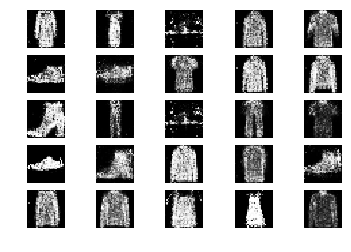

14601 [D loss: 0.658215, acc.: 60.94%] [G loss: 0.926412]
14602 [D loss: 0.686457, acc.: 50.00%] [G loss: 0.886466]
14603 [D loss: 0.650701, acc.: 67.19%] [G loss: 0.961505]
14604 [D loss: 0.609571, acc.: 67.19%] [G loss: 0.927742]
14605 [D loss: 0.663219, acc.: 64.06%] [G loss: 0.993755]
14606 [D loss: 0.651502, acc.: 60.94%] [G loss: 0.933103]
14607 [D loss: 0.690635, acc.: 50.00%] [G loss: 0.963759]
14608 [D loss: 0.618235, acc.: 60.94%] [G loss: 0.916480]
14609 [D loss: 0.655482, acc.: 65.62%] [G loss: 0.953967]
14610 [D loss: 0.609674, acc.: 68.75%] [G loss: 0.915111]
14611 [D loss: 0.716182, acc.: 46.88%] [G loss: 0.902817]
14612 [D loss: 0.637756, acc.: 67.19%] [G loss: 0.835427]
14613 [D loss: 0.643010, acc.: 62.50%] [G loss: 0.898364]
14614 [D loss: 0.635979, acc.: 67.19%] [G loss: 0.900984]
14615 [D loss: 0.671695, acc.: 60.94%] [G loss: 0.897807]
14616 [D loss: 0.606746, acc.: 67.19%] [G loss: 1.045714]
14617 [D loss: 0.669833, acc.: 64.06%] [G loss: 0.924809]
14618 [D loss:

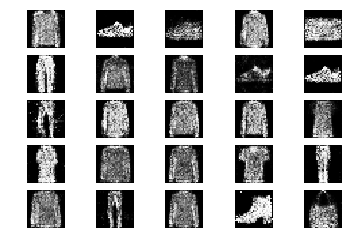

14801 [D loss: 0.608247, acc.: 68.75%] [G loss: 0.942205]
14802 [D loss: 0.663930, acc.: 60.94%] [G loss: 0.972510]
14803 [D loss: 0.652826, acc.: 59.38%] [G loss: 0.873573]
14804 [D loss: 0.621197, acc.: 65.62%] [G loss: 0.919067]
14805 [D loss: 0.616325, acc.: 64.06%] [G loss: 0.933277]
14806 [D loss: 0.637966, acc.: 71.88%] [G loss: 0.951947]
14807 [D loss: 0.677658, acc.: 62.50%] [G loss: 0.979771]
14808 [D loss: 0.715519, acc.: 54.69%] [G loss: 0.931485]
14809 [D loss: 0.690515, acc.: 56.25%] [G loss: 0.905625]
14810 [D loss: 0.725161, acc.: 51.56%] [G loss: 0.922691]
14811 [D loss: 0.616576, acc.: 68.75%] [G loss: 0.924918]
14812 [D loss: 0.615044, acc.: 64.06%] [G loss: 0.910040]
14813 [D loss: 0.647121, acc.: 56.25%] [G loss: 0.937708]
14814 [D loss: 0.631097, acc.: 59.38%] [G loss: 0.910484]
14815 [D loss: 0.590616, acc.: 68.75%] [G loss: 0.880223]
14816 [D loss: 0.715726, acc.: 56.25%] [G loss: 0.864104]
14817 [D loss: 0.632729, acc.: 67.19%] [G loss: 1.052963]
14818 [D loss:

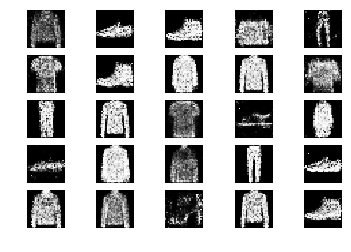

15001 [D loss: 0.656489, acc.: 60.94%] [G loss: 0.839874]
15002 [D loss: 0.696711, acc.: 54.69%] [G loss: 0.944412]
15003 [D loss: 0.610703, acc.: 67.19%] [G loss: 0.874873]
15004 [D loss: 0.699367, acc.: 56.25%] [G loss: 0.892237]
15005 [D loss: 0.615442, acc.: 64.06%] [G loss: 0.879315]
15006 [D loss: 0.615190, acc.: 65.62%] [G loss: 0.921125]
15007 [D loss: 0.633106, acc.: 59.38%] [G loss: 0.916894]
15008 [D loss: 0.608951, acc.: 65.62%] [G loss: 0.913290]
15009 [D loss: 0.691598, acc.: 50.00%] [G loss: 0.855259]
15010 [D loss: 0.678718, acc.: 51.56%] [G loss: 0.801926]
15011 [D loss: 0.642222, acc.: 67.19%] [G loss: 0.879508]
15012 [D loss: 0.671436, acc.: 59.38%] [G loss: 0.823537]
15013 [D loss: 0.626451, acc.: 64.06%] [G loss: 0.925422]
15014 [D loss: 0.668446, acc.: 57.81%] [G loss: 0.900749]
15015 [D loss: 0.677362, acc.: 57.81%] [G loss: 0.895584]
15016 [D loss: 0.650068, acc.: 67.19%] [G loss: 0.912381]
15017 [D loss: 0.703052, acc.: 57.81%] [G loss: 0.912409]
15018 [D loss:

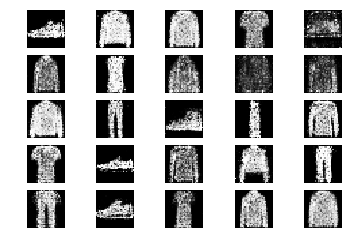

15201 [D loss: 0.673399, acc.: 53.12%] [G loss: 0.820557]
15202 [D loss: 0.719220, acc.: 54.69%] [G loss: 0.863086]
15203 [D loss: 0.664639, acc.: 53.12%] [G loss: 0.896304]
15204 [D loss: 0.657442, acc.: 60.94%] [G loss: 0.934967]
15205 [D loss: 0.684536, acc.: 53.12%] [G loss: 0.850977]
15206 [D loss: 0.689466, acc.: 57.81%] [G loss: 0.937409]
15207 [D loss: 0.679852, acc.: 54.69%] [G loss: 0.898181]
15208 [D loss: 0.654460, acc.: 62.50%] [G loss: 0.987915]
15209 [D loss: 0.656839, acc.: 62.50%] [G loss: 0.954938]
15210 [D loss: 0.697070, acc.: 51.56%] [G loss: 0.895258]
15211 [D loss: 0.642357, acc.: 62.50%] [G loss: 0.816340]
15212 [D loss: 0.641833, acc.: 59.38%] [G loss: 0.859419]
15213 [D loss: 0.721314, acc.: 53.12%] [G loss: 0.918121]
15214 [D loss: 0.643785, acc.: 64.06%] [G loss: 0.874296]
15215 [D loss: 0.679307, acc.: 60.94%] [G loss: 0.851972]
15216 [D loss: 0.675256, acc.: 54.69%] [G loss: 0.835012]
15217 [D loss: 0.658220, acc.: 60.94%] [G loss: 0.945955]
15218 [D loss:

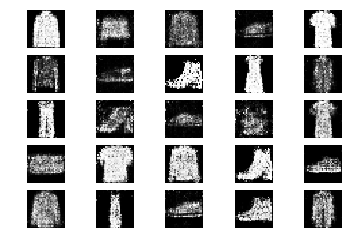

15401 [D loss: 0.725680, acc.: 48.44%] [G loss: 0.933177]
15402 [D loss: 0.615710, acc.: 75.00%] [G loss: 0.973691]
15403 [D loss: 0.639711, acc.: 64.06%] [G loss: 0.877351]
15404 [D loss: 0.649001, acc.: 67.19%] [G loss: 0.816349]
15405 [D loss: 0.668009, acc.: 60.94%] [G loss: 0.810193]
15406 [D loss: 0.735773, acc.: 56.25%] [G loss: 0.871270]
15407 [D loss: 0.602856, acc.: 70.31%] [G loss: 0.939715]
15408 [D loss: 0.615812, acc.: 64.06%] [G loss: 0.897347]
15409 [D loss: 0.692640, acc.: 62.50%] [G loss: 0.932809]
15410 [D loss: 0.730499, acc.: 56.25%] [G loss: 0.910685]
15411 [D loss: 0.668591, acc.: 54.69%] [G loss: 0.988832]
15412 [D loss: 0.650442, acc.: 59.38%] [G loss: 0.847630]
15413 [D loss: 0.650743, acc.: 57.81%] [G loss: 0.934470]
15414 [D loss: 0.702586, acc.: 50.00%] [G loss: 0.911307]
15415 [D loss: 0.694420, acc.: 54.69%] [G loss: 0.848198]
15416 [D loss: 0.622341, acc.: 70.31%] [G loss: 0.902409]
15417 [D loss: 0.667038, acc.: 56.25%] [G loss: 0.924771]
15418 [D loss:

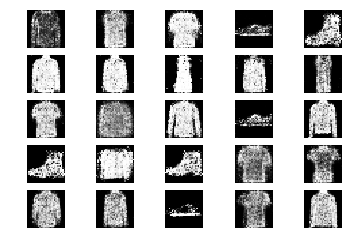

15601 [D loss: 0.669997, acc.: 50.00%] [G loss: 0.982104]
15602 [D loss: 0.618746, acc.: 57.81%] [G loss: 1.001710]
15603 [D loss: 0.654914, acc.: 57.81%] [G loss: 0.962785]
15604 [D loss: 0.645908, acc.: 68.75%] [G loss: 0.873874]
15605 [D loss: 0.597303, acc.: 71.88%] [G loss: 0.965753]
15606 [D loss: 0.697059, acc.: 50.00%] [G loss: 1.025258]
15607 [D loss: 0.664062, acc.: 60.94%] [G loss: 0.976719]
15608 [D loss: 0.622186, acc.: 65.62%] [G loss: 0.949038]
15609 [D loss: 0.632168, acc.: 64.06%] [G loss: 0.943993]
15610 [D loss: 0.546491, acc.: 79.69%] [G loss: 0.994107]
15611 [D loss: 0.525310, acc.: 79.69%] [G loss: 0.935996]
15612 [D loss: 0.644971, acc.: 64.06%] [G loss: 0.858535]
15613 [D loss: 0.686000, acc.: 53.12%] [G loss: 0.929098]
15614 [D loss: 0.563471, acc.: 76.56%] [G loss: 0.926930]
15615 [D loss: 0.705024, acc.: 56.25%] [G loss: 0.890607]
15616 [D loss: 0.668655, acc.: 57.81%] [G loss: 0.939808]
15617 [D loss: 0.635618, acc.: 65.62%] [G loss: 1.083967]
15618 [D loss:

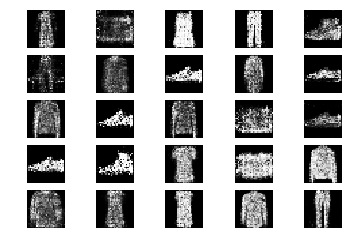

15801 [D loss: 0.700899, acc.: 50.00%] [G loss: 0.882587]
15802 [D loss: 0.624501, acc.: 64.06%] [G loss: 0.865046]
15803 [D loss: 0.612701, acc.: 65.62%] [G loss: 0.945062]
15804 [D loss: 0.584145, acc.: 71.88%] [G loss: 0.903229]
15805 [D loss: 0.739093, acc.: 50.00%] [G loss: 0.867454]
15806 [D loss: 0.669503, acc.: 57.81%] [G loss: 0.855042]
15807 [D loss: 0.704174, acc.: 56.25%] [G loss: 0.949568]
15808 [D loss: 0.644048, acc.: 57.81%] [G loss: 0.921371]
15809 [D loss: 0.623814, acc.: 65.62%] [G loss: 0.969174]
15810 [D loss: 0.604382, acc.: 65.62%] [G loss: 0.918127]
15811 [D loss: 0.623766, acc.: 62.50%] [G loss: 0.919657]
15812 [D loss: 0.694469, acc.: 54.69%] [G loss: 0.838302]
15813 [D loss: 0.657460, acc.: 64.06%] [G loss: 0.966520]
15814 [D loss: 0.684304, acc.: 50.00%] [G loss: 0.953769]
15815 [D loss: 0.671141, acc.: 57.81%] [G loss: 0.879580]
15816 [D loss: 0.640319, acc.: 62.50%] [G loss: 0.822005]
15817 [D loss: 0.619914, acc.: 71.88%] [G loss: 0.828626]
15818 [D loss:

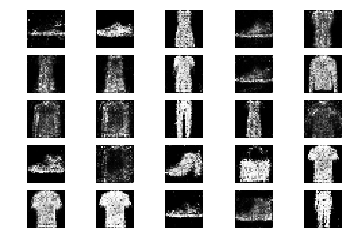

16001 [D loss: 0.667105, acc.: 54.69%] [G loss: 0.850873]
16002 [D loss: 0.664721, acc.: 59.38%] [G loss: 0.884160]
16003 [D loss: 0.587195, acc.: 75.00%] [G loss: 0.840469]
16004 [D loss: 0.635023, acc.: 70.31%] [G loss: 0.977158]
16005 [D loss: 0.683873, acc.: 53.12%] [G loss: 0.933775]
16006 [D loss: 0.670263, acc.: 67.19%] [G loss: 0.943680]
16007 [D loss: 0.634779, acc.: 67.19%] [G loss: 0.899971]
16008 [D loss: 0.696536, acc.: 57.81%] [G loss: 0.886918]
16009 [D loss: 0.644340, acc.: 64.06%] [G loss: 0.841922]
16010 [D loss: 0.630546, acc.: 67.19%] [G loss: 0.927452]
16011 [D loss: 0.667945, acc.: 59.38%] [G loss: 0.892955]
16012 [D loss: 0.697668, acc.: 56.25%] [G loss: 0.913125]
16013 [D loss: 0.640102, acc.: 57.81%] [G loss: 0.894615]
16014 [D loss: 0.687157, acc.: 57.81%] [G loss: 0.849702]
16015 [D loss: 0.687819, acc.: 53.12%] [G loss: 0.894727]
16016 [D loss: 0.682807, acc.: 56.25%] [G loss: 0.943357]
16017 [D loss: 0.675357, acc.: 57.81%] [G loss: 1.032774]
16018 [D loss:

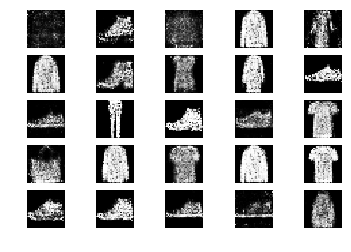

16201 [D loss: 0.665600, acc.: 54.69%] [G loss: 0.921855]
16202 [D loss: 0.691984, acc.: 56.25%] [G loss: 0.888720]
16203 [D loss: 0.605776, acc.: 73.44%] [G loss: 0.877757]
16204 [D loss: 0.655981, acc.: 60.94%] [G loss: 1.017179]
16205 [D loss: 0.604078, acc.: 75.00%] [G loss: 0.924318]
16206 [D loss: 0.674339, acc.: 57.81%] [G loss: 0.956270]
16207 [D loss: 0.685445, acc.: 48.44%] [G loss: 0.969655]
16208 [D loss: 0.667041, acc.: 60.94%] [G loss: 0.948941]
16209 [D loss: 0.623683, acc.: 70.31%] [G loss: 0.924497]
16210 [D loss: 0.654634, acc.: 59.38%] [G loss: 0.922408]
16211 [D loss: 0.660810, acc.: 70.31%] [G loss: 0.856016]
16212 [D loss: 0.664962, acc.: 56.25%] [G loss: 0.779632]
16213 [D loss: 0.624043, acc.: 67.19%] [G loss: 0.816260]
16214 [D loss: 0.665911, acc.: 59.38%] [G loss: 0.852197]
16215 [D loss: 0.659816, acc.: 56.25%] [G loss: 0.907318]
16216 [D loss: 0.684204, acc.: 59.38%] [G loss: 0.820830]
16217 [D loss: 0.647781, acc.: 64.06%] [G loss: 0.822855]
16218 [D loss:

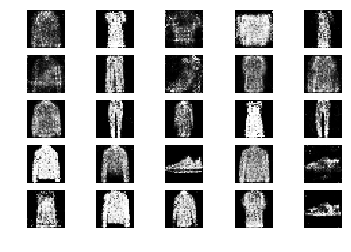

16401 [D loss: 0.630099, acc.: 67.19%] [G loss: 0.880451]
16402 [D loss: 0.667204, acc.: 56.25%] [G loss: 0.878155]
16403 [D loss: 0.619667, acc.: 70.31%] [G loss: 0.916317]
16404 [D loss: 0.718038, acc.: 45.31%] [G loss: 0.814623]
16405 [D loss: 0.662983, acc.: 64.06%] [G loss: 0.973664]
16406 [D loss: 0.679923, acc.: 60.94%] [G loss: 0.873491]
16407 [D loss: 0.687813, acc.: 54.69%] [G loss: 0.954936]
16408 [D loss: 0.655125, acc.: 54.69%] [G loss: 0.970146]
16409 [D loss: 0.677002, acc.: 54.69%] [G loss: 0.975372]
16410 [D loss: 0.714564, acc.: 54.69%] [G loss: 0.865090]
16411 [D loss: 0.637595, acc.: 67.19%] [G loss: 0.918881]
16412 [D loss: 0.662626, acc.: 57.81%] [G loss: 0.882129]
16413 [D loss: 0.673500, acc.: 53.12%] [G loss: 0.919234]
16414 [D loss: 0.571392, acc.: 65.62%] [G loss: 0.902671]
16415 [D loss: 0.700986, acc.: 57.81%] [G loss: 0.967183]
16416 [D loss: 0.649471, acc.: 59.38%] [G loss: 0.797954]
16417 [D loss: 0.572184, acc.: 75.00%] [G loss: 0.888815]
16418 [D loss:

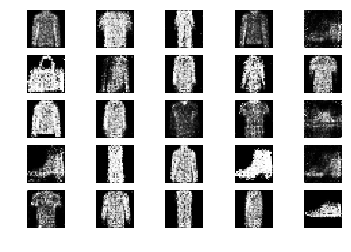

16601 [D loss: 0.670339, acc.: 56.25%] [G loss: 0.906197]
16602 [D loss: 0.716094, acc.: 51.56%] [G loss: 0.935172]
16603 [D loss: 0.647745, acc.: 65.62%] [G loss: 0.940390]
16604 [D loss: 0.632894, acc.: 57.81%] [G loss: 0.958671]
16605 [D loss: 0.688163, acc.: 50.00%] [G loss: 0.900489]
16606 [D loss: 0.656323, acc.: 54.69%] [G loss: 0.905460]
16607 [D loss: 0.660585, acc.: 59.38%] [G loss: 0.962371]
16608 [D loss: 0.711399, acc.: 54.69%] [G loss: 0.819264]
16609 [D loss: 0.666413, acc.: 57.81%] [G loss: 0.973897]
16610 [D loss: 0.649299, acc.: 60.94%] [G loss: 0.867668]
16611 [D loss: 0.579356, acc.: 68.75%] [G loss: 0.884660]
16612 [D loss: 0.688682, acc.: 53.12%] [G loss: 0.850333]
16613 [D loss: 0.585595, acc.: 64.06%] [G loss: 0.870437]
16614 [D loss: 0.620896, acc.: 67.19%] [G loss: 0.893356]
16615 [D loss: 0.627392, acc.: 62.50%] [G loss: 0.924170]
16616 [D loss: 0.652316, acc.: 62.50%] [G loss: 0.866728]
16617 [D loss: 0.619642, acc.: 71.88%] [G loss: 0.856495]
16618 [D loss:

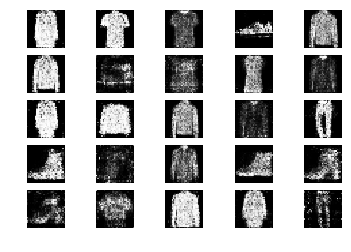

16801 [D loss: 0.649822, acc.: 53.12%] [G loss: 0.918233]
16802 [D loss: 0.648904, acc.: 67.19%] [G loss: 0.922837]
16803 [D loss: 0.678976, acc.: 60.94%] [G loss: 0.927947]
16804 [D loss: 0.636840, acc.: 57.81%] [G loss: 0.939593]
16805 [D loss: 0.715516, acc.: 48.44%] [G loss: 0.968806]
16806 [D loss: 0.631939, acc.: 60.94%] [G loss: 0.877995]
16807 [D loss: 0.624873, acc.: 68.75%] [G loss: 0.893493]
16808 [D loss: 0.652542, acc.: 60.94%] [G loss: 0.835944]
16809 [D loss: 0.626719, acc.: 62.50%] [G loss: 0.884168]
16810 [D loss: 0.589408, acc.: 71.88%] [G loss: 0.952464]
16811 [D loss: 0.690501, acc.: 53.12%] [G loss: 0.924262]
16812 [D loss: 0.679608, acc.: 51.56%] [G loss: 0.988637]
16813 [D loss: 0.675553, acc.: 64.06%] [G loss: 0.953499]
16814 [D loss: 0.690304, acc.: 59.38%] [G loss: 0.940978]
16815 [D loss: 0.681579, acc.: 56.25%] [G loss: 0.906373]
16816 [D loss: 0.701359, acc.: 54.69%] [G loss: 0.878742]
16817 [D loss: 0.633408, acc.: 67.19%] [G loss: 0.871080]
16818 [D loss:

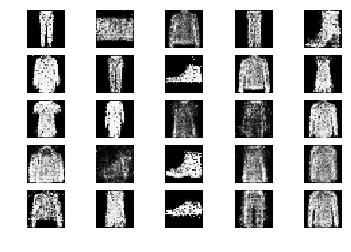

17001 [D loss: 0.696010, acc.: 57.81%] [G loss: 0.859225]
17002 [D loss: 0.646421, acc.: 65.62%] [G loss: 0.927259]
17003 [D loss: 0.623481, acc.: 59.38%] [G loss: 0.944420]
17004 [D loss: 0.619267, acc.: 65.62%] [G loss: 0.941707]
17005 [D loss: 0.628002, acc.: 60.94%] [G loss: 0.963928]
17006 [D loss: 0.573938, acc.: 68.75%] [G loss: 0.910557]
17007 [D loss: 0.624498, acc.: 65.62%] [G loss: 1.014740]
17008 [D loss: 0.717703, acc.: 53.12%] [G loss: 0.918915]
17009 [D loss: 0.675571, acc.: 62.50%] [G loss: 0.907727]
17010 [D loss: 0.583250, acc.: 71.88%] [G loss: 0.981882]
17011 [D loss: 0.601817, acc.: 67.19%] [G loss: 0.847992]
17012 [D loss: 0.691354, acc.: 54.69%] [G loss: 0.835694]
17013 [D loss: 0.704747, acc.: 54.69%] [G loss: 0.929244]
17014 [D loss: 0.591944, acc.: 68.75%] [G loss: 0.887913]
17015 [D loss: 0.716609, acc.: 54.69%] [G loss: 0.965163]
17016 [D loss: 0.652218, acc.: 60.94%] [G loss: 0.980284]
17017 [D loss: 0.648104, acc.: 57.81%] [G loss: 0.832435]
17018 [D loss:

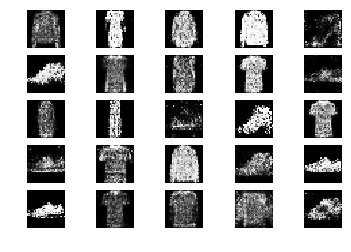

17201 [D loss: 0.602863, acc.: 70.31%] [G loss: 0.842981]
17202 [D loss: 0.623207, acc.: 62.50%] [G loss: 0.904389]
17203 [D loss: 0.630219, acc.: 65.62%] [G loss: 0.861016]
17204 [D loss: 0.658682, acc.: 62.50%] [G loss: 0.860724]
17205 [D loss: 0.625154, acc.: 65.62%] [G loss: 0.858961]
17206 [D loss: 0.670178, acc.: 56.25%] [G loss: 0.839787]
17207 [D loss: 0.666129, acc.: 57.81%] [G loss: 0.823450]
17208 [D loss: 0.653298, acc.: 59.38%] [G loss: 0.866947]
17209 [D loss: 0.686454, acc.: 54.69%] [G loss: 0.900965]
17210 [D loss: 0.708012, acc.: 57.81%] [G loss: 0.875199]
17211 [D loss: 0.649424, acc.: 57.81%] [G loss: 0.913686]
17212 [D loss: 0.627808, acc.: 64.06%] [G loss: 0.888183]
17213 [D loss: 0.730814, acc.: 51.56%] [G loss: 0.831141]
17214 [D loss: 0.631052, acc.: 67.19%] [G loss: 0.864940]
17215 [D loss: 0.698425, acc.: 50.00%] [G loss: 0.889467]
17216 [D loss: 0.705547, acc.: 50.00%] [G loss: 0.892217]
17217 [D loss: 0.693794, acc.: 56.25%] [G loss: 0.910967]
17218 [D loss:

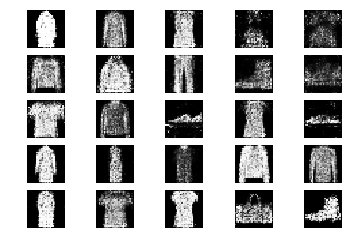

17401 [D loss: 0.661430, acc.: 62.50%] [G loss: 0.919365]
17402 [D loss: 0.581414, acc.: 71.88%] [G loss: 0.897616]
17403 [D loss: 0.627668, acc.: 62.50%] [G loss: 0.912821]
17404 [D loss: 0.693562, acc.: 62.50%] [G loss: 0.920379]
17405 [D loss: 0.681948, acc.: 62.50%] [G loss: 0.868243]
17406 [D loss: 0.641508, acc.: 71.88%] [G loss: 0.808906]
17407 [D loss: 0.613757, acc.: 64.06%] [G loss: 0.833226]
17408 [D loss: 0.644859, acc.: 65.62%] [G loss: 0.999565]
17409 [D loss: 0.669213, acc.: 64.06%] [G loss: 0.886119]
17410 [D loss: 0.677035, acc.: 57.81%] [G loss: 0.984715]
17411 [D loss: 0.722246, acc.: 50.00%] [G loss: 0.941220]
17412 [D loss: 0.628653, acc.: 68.75%] [G loss: 0.922793]
17413 [D loss: 0.622489, acc.: 64.06%] [G loss: 0.943309]
17414 [D loss: 0.640659, acc.: 65.62%] [G loss: 0.844323]
17415 [D loss: 0.602446, acc.: 68.75%] [G loss: 0.997533]
17416 [D loss: 0.626829, acc.: 64.06%] [G loss: 0.889820]
17417 [D loss: 0.617416, acc.: 67.19%] [G loss: 0.859788]
17418 [D loss:

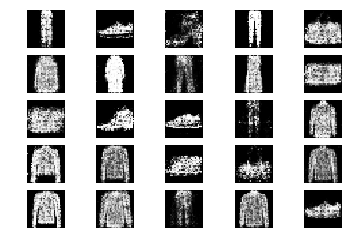

17601 [D loss: 0.629679, acc.: 65.62%] [G loss: 0.901685]
17602 [D loss: 0.620382, acc.: 67.19%] [G loss: 0.913826]
17603 [D loss: 0.660718, acc.: 62.50%] [G loss: 0.866069]
17604 [D loss: 0.593416, acc.: 65.62%] [G loss: 0.933702]
17605 [D loss: 0.618394, acc.: 67.19%] [G loss: 0.932503]
17606 [D loss: 0.609469, acc.: 67.19%] [G loss: 0.830115]
17607 [D loss: 0.615570, acc.: 67.19%] [G loss: 0.916780]
17608 [D loss: 0.589816, acc.: 71.88%] [G loss: 0.907098]
17609 [D loss: 0.679638, acc.: 54.69%] [G loss: 0.918685]
17610 [D loss: 0.662150, acc.: 59.38%] [G loss: 0.872544]
17611 [D loss: 0.587431, acc.: 71.88%] [G loss: 0.914746]
17612 [D loss: 0.641020, acc.: 71.88%] [G loss: 0.916275]
17613 [D loss: 0.694894, acc.: 50.00%] [G loss: 0.847080]
17614 [D loss: 0.720756, acc.: 50.00%] [G loss: 0.813772]
17615 [D loss: 0.624838, acc.: 70.31%] [G loss: 0.921722]
17616 [D loss: 0.652143, acc.: 64.06%] [G loss: 0.889077]
17617 [D loss: 0.642620, acc.: 64.06%] [G loss: 0.822845]
17618 [D loss:

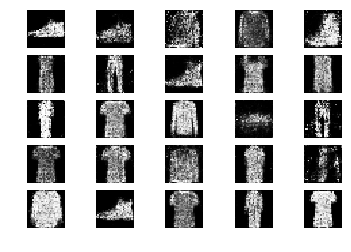

17801 [D loss: 0.662425, acc.: 62.50%] [G loss: 0.853128]
17802 [D loss: 0.643320, acc.: 67.19%] [G loss: 0.926850]
17803 [D loss: 0.656818, acc.: 54.69%] [G loss: 0.889038]
17804 [D loss: 0.629891, acc.: 62.50%] [G loss: 0.934477]
17805 [D loss: 0.654696, acc.: 56.25%] [G loss: 0.895836]
17806 [D loss: 0.672783, acc.: 54.69%] [G loss: 0.905936]
17807 [D loss: 0.689708, acc.: 51.56%] [G loss: 0.936892]
17808 [D loss: 0.650257, acc.: 57.81%] [G loss: 0.914962]
17809 [D loss: 0.683082, acc.: 53.12%] [G loss: 0.962290]
17810 [D loss: 0.672920, acc.: 59.38%] [G loss: 0.932850]
17811 [D loss: 0.703434, acc.: 50.00%] [G loss: 0.838960]
17812 [D loss: 0.664038, acc.: 59.38%] [G loss: 0.920543]
17813 [D loss: 0.639081, acc.: 60.94%] [G loss: 0.914447]
17814 [D loss: 0.664078, acc.: 65.62%] [G loss: 0.896338]
17815 [D loss: 0.590366, acc.: 73.44%] [G loss: 0.859111]
17816 [D loss: 0.647668, acc.: 53.12%] [G loss: 0.923982]
17817 [D loss: 0.608011, acc.: 70.31%] [G loss: 0.962943]
17818 [D loss:

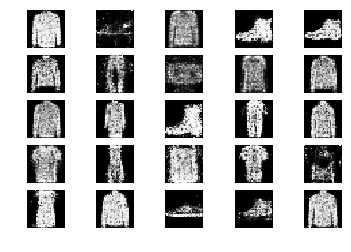

18001 [D loss: 0.634619, acc.: 73.44%] [G loss: 0.978655]
18002 [D loss: 0.684372, acc.: 64.06%] [G loss: 0.917537]
18003 [D loss: 0.629853, acc.: 64.06%] [G loss: 0.880351]
18004 [D loss: 0.686096, acc.: 59.38%] [G loss: 0.899007]
18005 [D loss: 0.634828, acc.: 68.75%] [G loss: 1.025161]
18006 [D loss: 0.589857, acc.: 75.00%] [G loss: 0.855081]
18007 [D loss: 0.551823, acc.: 70.31%] [G loss: 0.950607]
18008 [D loss: 0.685249, acc.: 59.38%] [G loss: 0.960576]
18009 [D loss: 0.564991, acc.: 75.00%] [G loss: 0.953459]
18010 [D loss: 0.619473, acc.: 60.94%] [G loss: 0.981855]
18011 [D loss: 0.624891, acc.: 57.81%] [G loss: 0.950102]
18012 [D loss: 0.641012, acc.: 65.62%] [G loss: 0.950385]
18013 [D loss: 0.639901, acc.: 67.19%] [G loss: 0.874897]
18014 [D loss: 0.640588, acc.: 64.06%] [G loss: 1.013789]
18015 [D loss: 0.616452, acc.: 62.50%] [G loss: 1.002697]
18016 [D loss: 0.702074, acc.: 56.25%] [G loss: 0.968921]
18017 [D loss: 0.668462, acc.: 59.38%] [G loss: 0.931048]
18018 [D loss:

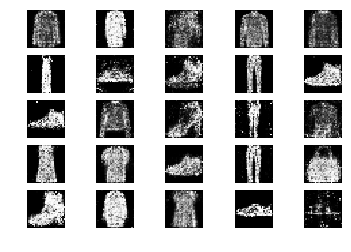

18201 [D loss: 0.683182, acc.: 62.50%] [G loss: 0.972705]
18202 [D loss: 0.588498, acc.: 67.19%] [G loss: 0.965710]
18203 [D loss: 0.666850, acc.: 59.38%] [G loss: 0.946474]
18204 [D loss: 0.643461, acc.: 62.50%] [G loss: 0.960259]
18205 [D loss: 0.647467, acc.: 57.81%] [G loss: 0.979075]
18206 [D loss: 0.717620, acc.: 57.81%] [G loss: 0.889841]
18207 [D loss: 0.642995, acc.: 64.06%] [G loss: 0.941300]
18208 [D loss: 0.662863, acc.: 60.94%] [G loss: 0.939689]
18209 [D loss: 0.611878, acc.: 64.06%] [G loss: 1.029877]
18210 [D loss: 0.630500, acc.: 68.75%] [G loss: 1.040487]
18211 [D loss: 0.617072, acc.: 62.50%] [G loss: 0.864983]
18212 [D loss: 0.673363, acc.: 57.81%] [G loss: 0.870311]
18213 [D loss: 0.581195, acc.: 67.19%] [G loss: 0.814875]
18214 [D loss: 0.617922, acc.: 59.38%] [G loss: 0.842667]
18215 [D loss: 0.702371, acc.: 56.25%] [G loss: 0.888552]
18216 [D loss: 0.678505, acc.: 60.94%] [G loss: 0.988868]
18217 [D loss: 0.655577, acc.: 60.94%] [G loss: 0.941446]
18218 [D loss:

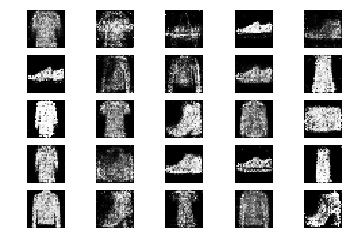

18401 [D loss: 0.689102, acc.: 54.69%] [G loss: 0.859038]
18402 [D loss: 0.709537, acc.: 56.25%] [G loss: 0.909600]
18403 [D loss: 0.641299, acc.: 64.06%] [G loss: 0.910762]
18404 [D loss: 0.648969, acc.: 62.50%] [G loss: 0.932016]
18405 [D loss: 0.604882, acc.: 67.19%] [G loss: 0.884373]
18406 [D loss: 0.671027, acc.: 59.38%] [G loss: 0.938523]
18407 [D loss: 0.730304, acc.: 51.56%] [G loss: 0.826155]
18408 [D loss: 0.627997, acc.: 70.31%] [G loss: 0.856064]
18409 [D loss: 0.612115, acc.: 67.19%] [G loss: 0.902767]
18410 [D loss: 0.646343, acc.: 60.94%] [G loss: 0.832729]
18411 [D loss: 0.666276, acc.: 57.81%] [G loss: 0.923113]
18412 [D loss: 0.671256, acc.: 64.06%] [G loss: 0.866431]
18413 [D loss: 0.650176, acc.: 60.94%] [G loss: 0.937330]
18414 [D loss: 0.658121, acc.: 56.25%] [G loss: 0.917394]
18415 [D loss: 0.645080, acc.: 65.62%] [G loss: 0.965104]
18416 [D loss: 0.642554, acc.: 68.75%] [G loss: 0.936145]
18417 [D loss: 0.601345, acc.: 67.19%] [G loss: 0.900584]
18418 [D loss:

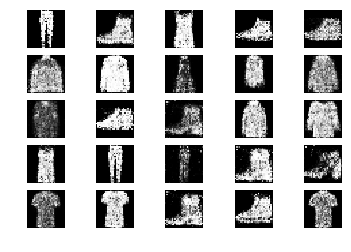

18601 [D loss: 0.680333, acc.: 62.50%] [G loss: 0.924230]
18602 [D loss: 0.668790, acc.: 60.94%] [G loss: 0.958178]
18603 [D loss: 0.606072, acc.: 65.62%] [G loss: 0.835147]
18604 [D loss: 0.666433, acc.: 54.69%] [G loss: 0.903736]
18605 [D loss: 0.646282, acc.: 67.19%] [G loss: 0.964188]
18606 [D loss: 0.613221, acc.: 59.38%] [G loss: 0.868958]
18607 [D loss: 0.633968, acc.: 67.19%] [G loss: 0.921605]
18608 [D loss: 0.622969, acc.: 64.06%] [G loss: 0.890420]
18609 [D loss: 0.610222, acc.: 67.19%] [G loss: 1.020427]
18610 [D loss: 0.701515, acc.: 54.69%] [G loss: 0.975054]
18611 [D loss: 0.699037, acc.: 54.69%] [G loss: 0.911011]
18612 [D loss: 0.642605, acc.: 67.19%] [G loss: 0.886998]
18613 [D loss: 0.616142, acc.: 57.81%] [G loss: 0.876921]
18614 [D loss: 0.767142, acc.: 46.88%] [G loss: 0.870280]
18615 [D loss: 0.655052, acc.: 62.50%] [G loss: 0.905409]
18616 [D loss: 0.640017, acc.: 60.94%] [G loss: 0.905051]
18617 [D loss: 0.684995, acc.: 54.69%] [G loss: 0.900115]
18618 [D loss:

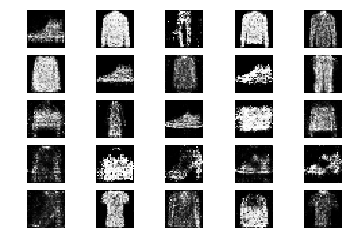

18801 [D loss: 0.598365, acc.: 70.31%] [G loss: 0.962390]
18802 [D loss: 0.698809, acc.: 54.69%] [G loss: 0.986406]
18803 [D loss: 0.675957, acc.: 59.38%] [G loss: 0.877176]
18804 [D loss: 0.608469, acc.: 70.31%] [G loss: 0.847405]
18805 [D loss: 0.599494, acc.: 68.75%] [G loss: 0.959803]
18806 [D loss: 0.645913, acc.: 60.94%] [G loss: 0.948079]
18807 [D loss: 0.624770, acc.: 62.50%] [G loss: 0.814076]
18808 [D loss: 0.662462, acc.: 57.81%] [G loss: 0.892201]
18809 [D loss: 0.728721, acc.: 51.56%] [G loss: 0.947188]
18810 [D loss: 0.627385, acc.: 62.50%] [G loss: 0.925820]
18811 [D loss: 0.646877, acc.: 62.50%] [G loss: 0.904776]
18812 [D loss: 0.694421, acc.: 56.25%] [G loss: 0.930553]
18813 [D loss: 0.657181, acc.: 62.50%] [G loss: 0.974280]
18814 [D loss: 0.615522, acc.: 68.75%] [G loss: 0.959233]
18815 [D loss: 0.605230, acc.: 67.19%] [G loss: 0.885501]
18816 [D loss: 0.643223, acc.: 67.19%] [G loss: 1.028439]
18817 [D loss: 0.703619, acc.: 57.81%] [G loss: 0.949531]
18818 [D loss:

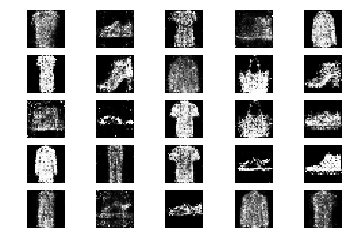

19001 [D loss: 0.585956, acc.: 70.31%] [G loss: 0.940927]
19002 [D loss: 0.675938, acc.: 60.94%] [G loss: 0.997046]
19003 [D loss: 0.633457, acc.: 67.19%] [G loss: 0.930806]
19004 [D loss: 0.659126, acc.: 57.81%] [G loss: 0.892508]
19005 [D loss: 0.624042, acc.: 65.62%] [G loss: 0.923234]
19006 [D loss: 0.681260, acc.: 64.06%] [G loss: 0.977407]
19007 [D loss: 0.668708, acc.: 54.69%] [G loss: 0.813417]
19008 [D loss: 0.529758, acc.: 79.69%] [G loss: 0.963008]
19009 [D loss: 0.743621, acc.: 54.69%] [G loss: 0.984884]
19010 [D loss: 0.731660, acc.: 57.81%] [G loss: 0.911318]
19011 [D loss: 0.637164, acc.: 62.50%] [G loss: 0.917249]
19012 [D loss: 0.647978, acc.: 60.94%] [G loss: 0.873095]
19013 [D loss: 0.641006, acc.: 65.62%] [G loss: 0.802648]
19014 [D loss: 0.714792, acc.: 51.56%] [G loss: 0.882810]
19015 [D loss: 0.646497, acc.: 62.50%] [G loss: 0.861486]
19016 [D loss: 0.694507, acc.: 57.81%] [G loss: 0.887997]
19017 [D loss: 0.627270, acc.: 62.50%] [G loss: 0.941565]
19018 [D loss:

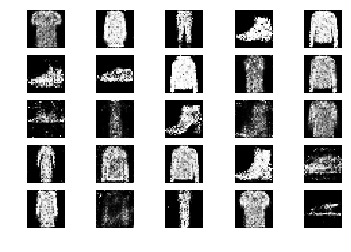

19201 [D loss: 0.639281, acc.: 59.38%] [G loss: 0.848150]
19202 [D loss: 0.616547, acc.: 64.06%] [G loss: 0.941267]
19203 [D loss: 0.688787, acc.: 57.81%] [G loss: 0.896105]
19204 [D loss: 0.672329, acc.: 57.81%] [G loss: 0.966526]
19205 [D loss: 0.647347, acc.: 68.75%] [G loss: 0.961420]
19206 [D loss: 0.651409, acc.: 57.81%] [G loss: 0.891466]
19207 [D loss: 0.620554, acc.: 70.31%] [G loss: 0.899806]
19208 [D loss: 0.713868, acc.: 59.38%] [G loss: 0.942108]
19209 [D loss: 0.624725, acc.: 68.75%] [G loss: 0.976831]
19210 [D loss: 0.620768, acc.: 67.19%] [G loss: 0.959314]
19211 [D loss: 0.669607, acc.: 53.12%] [G loss: 0.974603]
19212 [D loss: 0.672849, acc.: 60.94%] [G loss: 0.913833]
19213 [D loss: 0.666945, acc.: 57.81%] [G loss: 0.954035]
19214 [D loss: 0.642136, acc.: 64.06%] [G loss: 0.863541]
19215 [D loss: 0.641029, acc.: 64.06%] [G loss: 0.939012]
19216 [D loss: 0.615753, acc.: 64.06%] [G loss: 0.943042]
19217 [D loss: 0.701634, acc.: 54.69%] [G loss: 0.893048]
19218 [D loss:

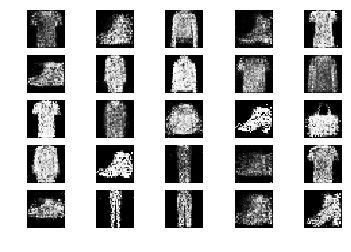

19401 [D loss: 0.712947, acc.: 53.12%] [G loss: 0.957981]
19402 [D loss: 0.644331, acc.: 68.75%] [G loss: 0.966529]
19403 [D loss: 0.659236, acc.: 62.50%] [G loss: 0.954242]
19404 [D loss: 0.646019, acc.: 64.06%] [G loss: 0.891407]
19405 [D loss: 0.583527, acc.: 73.44%] [G loss: 0.990500]
19406 [D loss: 0.560576, acc.: 73.44%] [G loss: 0.995501]
19407 [D loss: 0.738308, acc.: 45.31%] [G loss: 0.973738]
19408 [D loss: 0.736556, acc.: 48.44%] [G loss: 0.806419]
19409 [D loss: 0.632021, acc.: 68.75%] [G loss: 1.047620]
19410 [D loss: 0.634412, acc.: 68.75%] [G loss: 0.920124]
19411 [D loss: 0.674651, acc.: 60.94%] [G loss: 0.961571]
19412 [D loss: 0.696348, acc.: 57.81%] [G loss: 0.933269]
19413 [D loss: 0.675358, acc.: 65.62%] [G loss: 1.038176]
19414 [D loss: 0.679764, acc.: 59.38%] [G loss: 0.998938]
19415 [D loss: 0.649285, acc.: 60.94%] [G loss: 1.039886]
19416 [D loss: 0.593441, acc.: 68.75%] [G loss: 0.974702]
19417 [D loss: 0.553224, acc.: 78.12%] [G loss: 0.963900]
19418 [D loss:

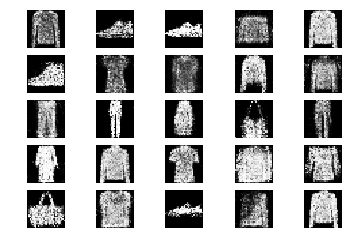

19601 [D loss: 0.650725, acc.: 60.94%] [G loss: 0.990890]
19602 [D loss: 0.610352, acc.: 65.62%] [G loss: 1.027026]
19603 [D loss: 0.748397, acc.: 46.88%] [G loss: 0.944220]
19604 [D loss: 0.663495, acc.: 62.50%] [G loss: 1.006396]
19605 [D loss: 0.672487, acc.: 54.69%] [G loss: 0.898905]
19606 [D loss: 0.612582, acc.: 67.19%] [G loss: 0.902220]
19607 [D loss: 0.613892, acc.: 67.19%] [G loss: 0.850771]
19608 [D loss: 0.655896, acc.: 54.69%] [G loss: 0.965171]
19609 [D loss: 0.708389, acc.: 50.00%] [G loss: 0.925011]
19610 [D loss: 0.656489, acc.: 60.94%] [G loss: 0.930472]
19611 [D loss: 0.699296, acc.: 56.25%] [G loss: 0.910771]
19612 [D loss: 0.683385, acc.: 57.81%] [G loss: 0.933755]
19613 [D loss: 0.592135, acc.: 67.19%] [G loss: 0.919040]
19614 [D loss: 0.653115, acc.: 59.38%] [G loss: 0.954218]
19615 [D loss: 0.647707, acc.: 62.50%] [G loss: 0.946900]
19616 [D loss: 0.735282, acc.: 45.31%] [G loss: 0.859300]
19617 [D loss: 0.645940, acc.: 62.50%] [G loss: 0.848411]
19618 [D loss:

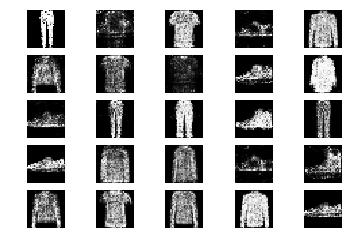

19801 [D loss: 0.621319, acc.: 65.62%] [G loss: 0.959078]
19802 [D loss: 0.665208, acc.: 59.38%] [G loss: 0.841228]
19803 [D loss: 0.669958, acc.: 60.94%] [G loss: 0.865437]
19804 [D loss: 0.644797, acc.: 68.75%] [G loss: 0.915722]
19805 [D loss: 0.611284, acc.: 62.50%] [G loss: 0.936611]
19806 [D loss: 0.651111, acc.: 59.38%] [G loss: 0.860056]
19807 [D loss: 0.605001, acc.: 73.44%] [G loss: 0.904271]
19808 [D loss: 0.695167, acc.: 59.38%] [G loss: 0.894291]
19809 [D loss: 0.640672, acc.: 59.38%] [G loss: 0.916367]
19810 [D loss: 0.677670, acc.: 59.38%] [G loss: 0.886915]
19811 [D loss: 0.626199, acc.: 68.75%] [G loss: 0.946241]
19812 [D loss: 0.770128, acc.: 45.31%] [G loss: 0.850167]
19813 [D loss: 0.688929, acc.: 51.56%] [G loss: 0.813951]
19814 [D loss: 0.655828, acc.: 60.94%] [G loss: 0.864241]
19815 [D loss: 0.591922, acc.: 68.75%] [G loss: 0.890658]
19816 [D loss: 0.673339, acc.: 67.19%] [G loss: 0.836805]
19817 [D loss: 0.652754, acc.: 65.62%] [G loss: 0.891868]
19818 [D loss:

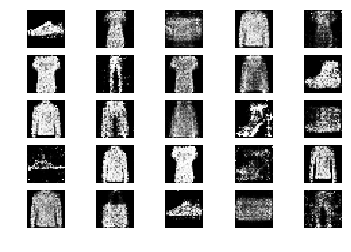

20001 [D loss: 0.691729, acc.: 57.81%] [G loss: 1.011389]
20002 [D loss: 0.670762, acc.: 60.94%] [G loss: 0.864904]
20003 [D loss: 0.624469, acc.: 67.19%] [G loss: 0.812552]
20004 [D loss: 0.570116, acc.: 78.12%] [G loss: 0.900239]
20005 [D loss: 0.645326, acc.: 57.81%] [G loss: 0.856625]
20006 [D loss: 0.633804, acc.: 59.38%] [G loss: 0.932515]
20007 [D loss: 0.694502, acc.: 60.94%] [G loss: 0.846461]
20008 [D loss: 0.680380, acc.: 59.38%] [G loss: 0.938260]
20009 [D loss: 0.642726, acc.: 56.25%] [G loss: 0.880416]
20010 [D loss: 0.639155, acc.: 62.50%] [G loss: 0.913639]
20011 [D loss: 0.670033, acc.: 57.81%] [G loss: 0.885582]
20012 [D loss: 0.669954, acc.: 57.81%] [G loss: 0.956446]
20013 [D loss: 0.653617, acc.: 56.25%] [G loss: 0.936122]
20014 [D loss: 0.677065, acc.: 59.38%] [G loss: 0.969044]
20015 [D loss: 0.542943, acc.: 71.88%] [G loss: 1.005362]
20016 [D loss: 0.675347, acc.: 56.25%] [G loss: 0.991940]
20017 [D loss: 0.613164, acc.: 65.62%] [G loss: 0.964172]
20018 [D loss:

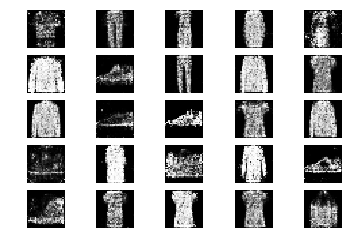

20201 [D loss: 0.622337, acc.: 65.62%] [G loss: 0.883272]
20202 [D loss: 0.634423, acc.: 67.19%] [G loss: 0.816061]
20203 [D loss: 0.628190, acc.: 59.38%] [G loss: 0.954744]
20204 [D loss: 0.593838, acc.: 67.19%] [G loss: 0.903061]
20205 [D loss: 0.723267, acc.: 51.56%] [G loss: 0.881635]
20206 [D loss: 0.622381, acc.: 67.19%] [G loss: 0.994142]
20207 [D loss: 0.649917, acc.: 57.81%] [G loss: 1.009699]
20208 [D loss: 0.712286, acc.: 60.94%] [G loss: 0.885537]
20209 [D loss: 0.587171, acc.: 73.44%] [G loss: 0.958947]
20210 [D loss: 0.688951, acc.: 56.25%] [G loss: 0.895002]
20211 [D loss: 0.660400, acc.: 59.38%] [G loss: 0.874599]
20212 [D loss: 0.584435, acc.: 65.62%] [G loss: 0.781435]
20213 [D loss: 0.626518, acc.: 67.19%] [G loss: 0.892558]
20214 [D loss: 0.628906, acc.: 62.50%] [G loss: 0.885818]
20215 [D loss: 0.609051, acc.: 71.88%] [G loss: 0.934776]
20216 [D loss: 0.610727, acc.: 70.31%] [G loss: 0.963609]
20217 [D loss: 0.675042, acc.: 65.62%] [G loss: 0.950495]
20218 [D loss:

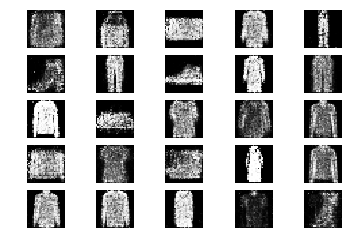

20401 [D loss: 0.659530, acc.: 60.94%] [G loss: 0.876424]
20402 [D loss: 0.639974, acc.: 64.06%] [G loss: 0.984450]
20403 [D loss: 0.570886, acc.: 71.88%] [G loss: 0.930580]
20404 [D loss: 0.634838, acc.: 64.06%] [G loss: 0.826046]
20405 [D loss: 0.664160, acc.: 60.94%] [G loss: 0.851180]
20406 [D loss: 0.651199, acc.: 67.19%] [G loss: 0.911842]
20407 [D loss: 0.650937, acc.: 67.19%] [G loss: 1.056249]
20408 [D loss: 0.576822, acc.: 73.44%] [G loss: 0.939442]
20409 [D loss: 0.640807, acc.: 64.06%] [G loss: 1.028666]
20410 [D loss: 0.622010, acc.: 65.62%] [G loss: 0.980094]
20411 [D loss: 0.640967, acc.: 64.06%] [G loss: 1.003189]
20412 [D loss: 0.696126, acc.: 60.94%] [G loss: 0.995718]
20413 [D loss: 0.689613, acc.: 50.00%] [G loss: 1.066077]
20414 [D loss: 0.665991, acc.: 59.38%] [G loss: 0.969037]
20415 [D loss: 0.622589, acc.: 67.19%] [G loss: 0.933247]
20416 [D loss: 0.735678, acc.: 51.56%] [G loss: 0.977197]
20417 [D loss: 0.707538, acc.: 59.38%] [G loss: 0.890983]
20418 [D loss:

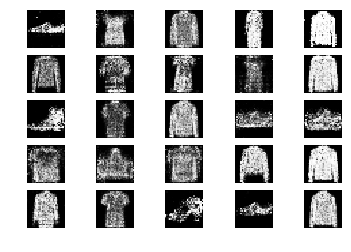

20601 [D loss: 0.664309, acc.: 57.81%] [G loss: 0.929324]
20602 [D loss: 0.567516, acc.: 76.56%] [G loss: 0.971143]
20603 [D loss: 0.645487, acc.: 60.94%] [G loss: 0.882790]
20604 [D loss: 0.627860, acc.: 65.62%] [G loss: 0.941170]
20605 [D loss: 0.635769, acc.: 68.75%] [G loss: 0.923582]
20606 [D loss: 0.636767, acc.: 57.81%] [G loss: 0.966978]
20607 [D loss: 0.648714, acc.: 60.94%] [G loss: 0.892976]
20608 [D loss: 0.652336, acc.: 71.88%] [G loss: 0.903904]
20609 [D loss: 0.643852, acc.: 65.62%] [G loss: 0.854996]
20610 [D loss: 0.646563, acc.: 54.69%] [G loss: 0.882223]
20611 [D loss: 0.644926, acc.: 62.50%] [G loss: 0.829887]
20612 [D loss: 0.647066, acc.: 62.50%] [G loss: 0.836018]
20613 [D loss: 0.584808, acc.: 70.31%] [G loss: 0.943273]
20614 [D loss: 0.618551, acc.: 67.19%] [G loss: 0.940155]
20615 [D loss: 0.680037, acc.: 60.94%] [G loss: 0.879189]
20616 [D loss: 0.630780, acc.: 67.19%] [G loss: 0.822528]
20617 [D loss: 0.590505, acc.: 65.62%] [G loss: 0.963573]
20618 [D loss:

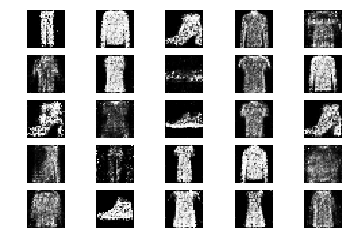

20801 [D loss: 0.651411, acc.: 59.38%] [G loss: 0.982106]
20802 [D loss: 0.549219, acc.: 71.88%] [G loss: 1.065733]
20803 [D loss: 0.690937, acc.: 54.69%] [G loss: 0.965060]
20804 [D loss: 0.621898, acc.: 62.50%] [G loss: 0.949862]
20805 [D loss: 0.565868, acc.: 71.88%] [G loss: 0.874212]
20806 [D loss: 0.637158, acc.: 60.94%] [G loss: 0.855765]
20807 [D loss: 0.541493, acc.: 78.12%] [G loss: 1.016313]
20808 [D loss: 0.609479, acc.: 70.31%] [G loss: 0.985140]
20809 [D loss: 0.649449, acc.: 57.81%] [G loss: 0.940141]
20810 [D loss: 0.668400, acc.: 64.06%] [G loss: 0.961716]
20811 [D loss: 0.656546, acc.: 62.50%] [G loss: 1.061395]
20812 [D loss: 0.688719, acc.: 59.38%] [G loss: 0.971940]
20813 [D loss: 0.659358, acc.: 59.38%] [G loss: 0.952447]
20814 [D loss: 0.647170, acc.: 67.19%] [G loss: 1.039989]
20815 [D loss: 0.675294, acc.: 57.81%] [G loss: 0.942059]
20816 [D loss: 0.628428, acc.: 68.75%] [G loss: 0.920417]
20817 [D loss: 0.640122, acc.: 57.81%] [G loss: 0.861885]
20818 [D loss:

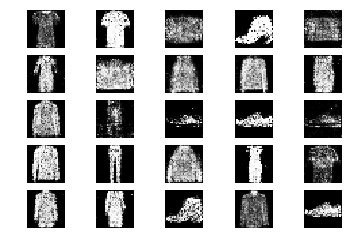

21001 [D loss: 0.646947, acc.: 60.94%] [G loss: 0.978235]
21002 [D loss: 0.643325, acc.: 64.06%] [G loss: 0.927883]
21003 [D loss: 0.675148, acc.: 60.94%] [G loss: 0.937585]
21004 [D loss: 0.628368, acc.: 60.94%] [G loss: 0.883548]
21005 [D loss: 0.670448, acc.: 59.38%] [G loss: 0.915698]
21006 [D loss: 0.652729, acc.: 65.62%] [G loss: 0.863103]
21007 [D loss: 0.657786, acc.: 64.06%] [G loss: 0.942669]
21008 [D loss: 0.673284, acc.: 54.69%] [G loss: 0.925246]
21009 [D loss: 0.647397, acc.: 54.69%] [G loss: 0.951720]
21010 [D loss: 0.663313, acc.: 57.81%] [G loss: 0.969566]
21011 [D loss: 0.589912, acc.: 67.19%] [G loss: 1.063590]
21012 [D loss: 0.671841, acc.: 60.94%] [G loss: 0.889583]
21013 [D loss: 0.675034, acc.: 65.62%] [G loss: 0.982777]
21014 [D loss: 0.621244, acc.: 64.06%] [G loss: 0.928171]
21015 [D loss: 0.614329, acc.: 62.50%] [G loss: 0.911564]
21016 [D loss: 0.656272, acc.: 60.94%] [G loss: 0.960110]
21017 [D loss: 0.595519, acc.: 65.62%] [G loss: 0.937695]
21018 [D loss:

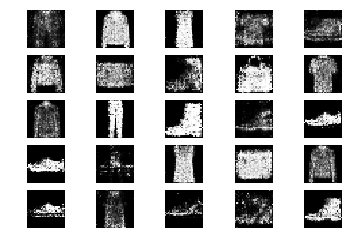

21201 [D loss: 0.592838, acc.: 71.88%] [G loss: 0.929548]
21202 [D loss: 0.644687, acc.: 60.94%] [G loss: 0.831430]
21203 [D loss: 0.674242, acc.: 54.69%] [G loss: 1.010496]
21204 [D loss: 0.604541, acc.: 64.06%] [G loss: 0.948097]
21205 [D loss: 0.691839, acc.: 59.38%] [G loss: 0.985977]
21206 [D loss: 0.611262, acc.: 70.31%] [G loss: 0.863905]
21207 [D loss: 0.662141, acc.: 54.69%] [G loss: 0.957294]
21208 [D loss: 0.734035, acc.: 46.88%] [G loss: 0.862802]
21209 [D loss: 0.665896, acc.: 64.06%] [G loss: 1.037803]
21210 [D loss: 0.617907, acc.: 70.31%] [G loss: 0.928285]
21211 [D loss: 0.710009, acc.: 53.12%] [G loss: 0.949444]
21212 [D loss: 0.662995, acc.: 62.50%] [G loss: 0.883067]
21213 [D loss: 0.599562, acc.: 75.00%] [G loss: 0.885165]
21214 [D loss: 0.625550, acc.: 65.62%] [G loss: 1.009926]
21215 [D loss: 0.696452, acc.: 53.12%] [G loss: 1.042125]
21216 [D loss: 0.630307, acc.: 67.19%] [G loss: 1.055940]
21217 [D loss: 0.684608, acc.: 60.94%] [G loss: 0.999254]
21218 [D loss:

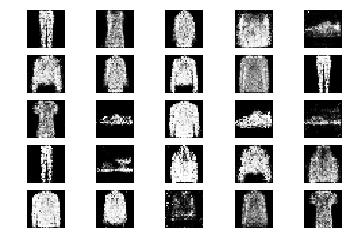

21401 [D loss: 0.646482, acc.: 60.94%] [G loss: 0.923919]
21402 [D loss: 0.729977, acc.: 54.69%] [G loss: 0.962274]
21403 [D loss: 0.663055, acc.: 64.06%] [G loss: 1.011630]
21404 [D loss: 0.634709, acc.: 59.38%] [G loss: 1.060659]
21405 [D loss: 0.618756, acc.: 64.06%] [G loss: 0.944641]
21406 [D loss: 0.652563, acc.: 51.56%] [G loss: 0.887942]
21407 [D loss: 0.641622, acc.: 57.81%] [G loss: 0.897396]
21408 [D loss: 0.659957, acc.: 62.50%] [G loss: 0.910051]
21409 [D loss: 0.726281, acc.: 48.44%] [G loss: 0.873810]
21410 [D loss: 0.600370, acc.: 67.19%] [G loss: 0.946470]
21411 [D loss: 0.593330, acc.: 70.31%] [G loss: 0.998393]
21412 [D loss: 0.602360, acc.: 67.19%] [G loss: 0.952475]
21413 [D loss: 0.639822, acc.: 59.38%] [G loss: 0.871426]
21414 [D loss: 0.616588, acc.: 70.31%] [G loss: 0.938980]
21415 [D loss: 0.727752, acc.: 54.69%] [G loss: 0.868975]
21416 [D loss: 0.712139, acc.: 57.81%] [G loss: 0.879101]
21417 [D loss: 0.627663, acc.: 60.94%] [G loss: 0.836075]
21418 [D loss:

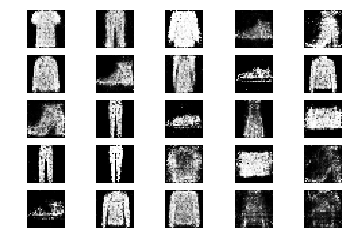

21601 [D loss: 0.630653, acc.: 64.06%] [G loss: 1.061724]
21602 [D loss: 0.629365, acc.: 60.94%] [G loss: 0.988566]
21603 [D loss: 0.634859, acc.: 65.62%] [G loss: 0.952096]
21604 [D loss: 0.652974, acc.: 60.94%] [G loss: 1.111287]
21605 [D loss: 0.622400, acc.: 64.06%] [G loss: 0.866344]
21606 [D loss: 0.692758, acc.: 56.25%] [G loss: 0.936721]
21607 [D loss: 0.684900, acc.: 60.94%] [G loss: 0.821794]
21608 [D loss: 0.682667, acc.: 53.12%] [G loss: 0.869644]
21609 [D loss: 0.665620, acc.: 53.12%] [G loss: 1.052504]
21610 [D loss: 0.621073, acc.: 62.50%] [G loss: 0.876035]
21611 [D loss: 0.713733, acc.: 51.56%] [G loss: 0.995534]
21612 [D loss: 0.602764, acc.: 64.06%] [G loss: 0.994462]
21613 [D loss: 0.630854, acc.: 62.50%] [G loss: 1.019888]
21614 [D loss: 0.624231, acc.: 59.38%] [G loss: 1.039228]
21615 [D loss: 0.614293, acc.: 64.06%] [G loss: 0.981709]
21616 [D loss: 0.641711, acc.: 60.94%] [G loss: 0.939282]
21617 [D loss: 0.702599, acc.: 57.81%] [G loss: 0.898324]
21618 [D loss:

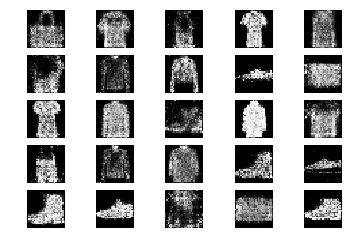

21801 [D loss: 0.639233, acc.: 60.94%] [G loss: 0.988624]
21802 [D loss: 0.613830, acc.: 60.94%] [G loss: 0.959160]
21803 [D loss: 0.648326, acc.: 51.56%] [G loss: 1.017522]
21804 [D loss: 0.588390, acc.: 73.44%] [G loss: 0.929337]
21805 [D loss: 0.648297, acc.: 57.81%] [G loss: 0.977301]
21806 [D loss: 0.660463, acc.: 62.50%] [G loss: 0.768750]
21807 [D loss: 0.645469, acc.: 65.62%] [G loss: 0.893171]
21808 [D loss: 0.637268, acc.: 67.19%] [G loss: 0.885708]
21809 [D loss: 0.648739, acc.: 56.25%] [G loss: 0.879475]
21810 [D loss: 0.693587, acc.: 56.25%] [G loss: 0.924286]
21811 [D loss: 0.632834, acc.: 68.75%] [G loss: 0.984349]
21812 [D loss: 0.657052, acc.: 56.25%] [G loss: 1.039408]
21813 [D loss: 0.646787, acc.: 62.50%] [G loss: 0.961819]
21814 [D loss: 0.650613, acc.: 56.25%] [G loss: 0.917440]
21815 [D loss: 0.687990, acc.: 48.44%] [G loss: 0.882747]
21816 [D loss: 0.708943, acc.: 50.00%] [G loss: 0.970798]
21817 [D loss: 0.611433, acc.: 65.62%] [G loss: 0.908904]
21818 [D loss:

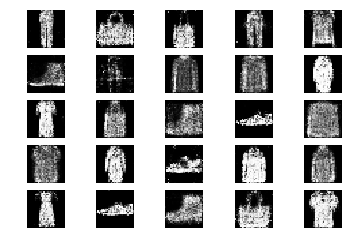

22001 [D loss: 0.726691, acc.: 50.00%] [G loss: 0.914694]
22002 [D loss: 0.617822, acc.: 70.31%] [G loss: 0.921543]
22003 [D loss: 0.676659, acc.: 62.50%] [G loss: 0.931023]
22004 [D loss: 0.624426, acc.: 65.62%] [G loss: 0.897014]
22005 [D loss: 0.640860, acc.: 62.50%] [G loss: 0.869622]
22006 [D loss: 0.662248, acc.: 56.25%] [G loss: 0.926415]
22007 [D loss: 0.646816, acc.: 62.50%] [G loss: 0.965097]
22008 [D loss: 0.609373, acc.: 73.44%] [G loss: 0.883665]
22009 [D loss: 0.657622, acc.: 62.50%] [G loss: 0.900996]
22010 [D loss: 0.674929, acc.: 60.94%] [G loss: 0.844432]
22011 [D loss: 0.741215, acc.: 53.12%] [G loss: 0.860820]
22012 [D loss: 0.743407, acc.: 45.31%] [G loss: 0.931020]
22013 [D loss: 0.723757, acc.: 53.12%] [G loss: 0.826938]
22014 [D loss: 0.636486, acc.: 62.50%] [G loss: 0.894653]
22015 [D loss: 0.598614, acc.: 76.56%] [G loss: 0.880701]
22016 [D loss: 0.629837, acc.: 59.38%] [G loss: 0.873698]
22017 [D loss: 0.642203, acc.: 67.19%] [G loss: 0.922812]
22018 [D loss:

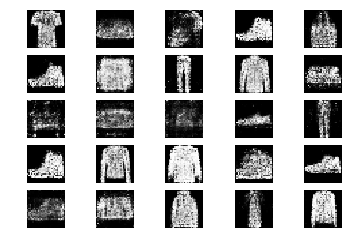

22201 [D loss: 0.624466, acc.: 67.19%] [G loss: 0.933469]
22202 [D loss: 0.621925, acc.: 64.06%] [G loss: 0.889891]
22203 [D loss: 0.612357, acc.: 68.75%] [G loss: 1.009419]
22204 [D loss: 0.648496, acc.: 60.94%] [G loss: 1.003594]
22205 [D loss: 0.587186, acc.: 70.31%] [G loss: 0.988656]
22206 [D loss: 0.678157, acc.: 60.94%] [G loss: 0.971953]
22207 [D loss: 0.731302, acc.: 59.38%] [G loss: 1.029454]
22208 [D loss: 0.625036, acc.: 59.38%] [G loss: 0.993274]
22209 [D loss: 0.587578, acc.: 78.12%] [G loss: 0.952208]
22210 [D loss: 0.598968, acc.: 70.31%] [G loss: 0.975435]
22211 [D loss: 0.638285, acc.: 62.50%] [G loss: 0.911724]
22212 [D loss: 0.657330, acc.: 59.38%] [G loss: 0.931595]
22213 [D loss: 0.649935, acc.: 56.25%] [G loss: 0.908667]
22214 [D loss: 0.635822, acc.: 68.75%] [G loss: 0.962715]
22215 [D loss: 0.587175, acc.: 67.19%] [G loss: 0.951605]
22216 [D loss: 0.674638, acc.: 59.38%] [G loss: 0.905601]
22217 [D loss: 0.638304, acc.: 59.38%] [G loss: 0.934063]
22218 [D loss:

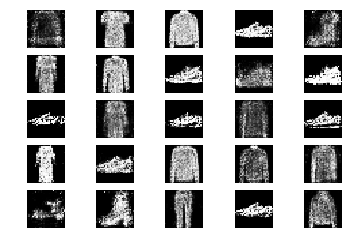

22401 [D loss: 0.636510, acc.: 65.62%] [G loss: 0.843564]
22402 [D loss: 0.682838, acc.: 56.25%] [G loss: 0.883863]
22403 [D loss: 0.635728, acc.: 60.94%] [G loss: 0.821819]
22404 [D loss: 0.656310, acc.: 53.12%] [G loss: 0.913009]
22405 [D loss: 0.645541, acc.: 67.19%] [G loss: 0.923810]
22406 [D loss: 0.589656, acc.: 64.06%] [G loss: 0.906082]
22407 [D loss: 0.666483, acc.: 57.81%] [G loss: 0.871704]
22408 [D loss: 0.701797, acc.: 59.38%] [G loss: 0.861324]
22409 [D loss: 0.641553, acc.: 67.19%] [G loss: 0.939389]
22410 [D loss: 0.679975, acc.: 50.00%] [G loss: 0.983097]
22411 [D loss: 0.646948, acc.: 56.25%] [G loss: 0.879990]
22412 [D loss: 0.612412, acc.: 64.06%] [G loss: 0.914122]
22413 [D loss: 0.638147, acc.: 62.50%] [G loss: 0.967205]
22414 [D loss: 0.674830, acc.: 56.25%] [G loss: 0.814974]
22415 [D loss: 0.644275, acc.: 68.75%] [G loss: 0.819704]
22416 [D loss: 0.643211, acc.: 65.62%] [G loss: 0.953509]
22417 [D loss: 0.640844, acc.: 65.62%] [G loss: 1.005610]
22418 [D loss:

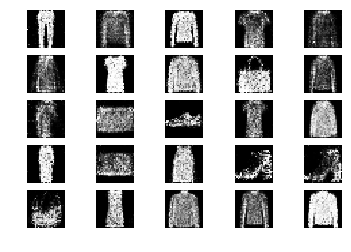

22601 [D loss: 0.648915, acc.: 60.94%] [G loss: 0.939139]
22602 [D loss: 0.662686, acc.: 60.94%] [G loss: 0.858388]
22603 [D loss: 0.712341, acc.: 50.00%] [G loss: 0.887925]
22604 [D loss: 0.641894, acc.: 64.06%] [G loss: 1.025906]
22605 [D loss: 0.694941, acc.: 56.25%] [G loss: 1.026401]
22606 [D loss: 0.661704, acc.: 57.81%] [G loss: 0.916212]
22607 [D loss: 0.585213, acc.: 73.44%] [G loss: 0.867816]
22608 [D loss: 0.682673, acc.: 57.81%] [G loss: 0.899306]
22609 [D loss: 0.667126, acc.: 59.38%] [G loss: 0.966367]
22610 [D loss: 0.698095, acc.: 54.69%] [G loss: 0.890210]
22611 [D loss: 0.670902, acc.: 59.38%] [G loss: 0.894955]
22612 [D loss: 0.637511, acc.: 62.50%] [G loss: 0.978185]
22613 [D loss: 0.712923, acc.: 46.88%] [G loss: 1.004703]
22614 [D loss: 0.628237, acc.: 60.94%] [G loss: 1.057852]
22615 [D loss: 0.652197, acc.: 64.06%] [G loss: 0.977996]
22616 [D loss: 0.681361, acc.: 53.12%] [G loss: 0.901682]
22617 [D loss: 0.634608, acc.: 60.94%] [G loss: 0.919733]
22618 [D loss:

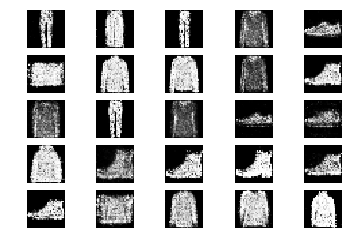

22801 [D loss: 0.641295, acc.: 57.81%] [G loss: 0.988719]
22802 [D loss: 0.741686, acc.: 50.00%] [G loss: 1.009258]
22803 [D loss: 0.636481, acc.: 67.19%] [G loss: 0.996453]
22804 [D loss: 0.581031, acc.: 73.44%] [G loss: 1.010744]
22805 [D loss: 0.703341, acc.: 57.81%] [G loss: 0.929446]
22806 [D loss: 0.700476, acc.: 59.38%] [G loss: 0.913753]
22807 [D loss: 0.674046, acc.: 60.94%] [G loss: 0.930176]
22808 [D loss: 0.609565, acc.: 64.06%] [G loss: 0.978092]
22809 [D loss: 0.691771, acc.: 50.00%] [G loss: 0.987810]
22810 [D loss: 0.576700, acc.: 62.50%] [G loss: 0.939185]
22811 [D loss: 0.695784, acc.: 57.81%] [G loss: 0.919399]
22812 [D loss: 0.587497, acc.: 76.56%] [G loss: 0.841264]
22813 [D loss: 0.639192, acc.: 57.81%] [G loss: 0.978324]
22814 [D loss: 0.609164, acc.: 65.62%] [G loss: 0.900385]
22815 [D loss: 0.674551, acc.: 60.94%] [G loss: 0.920455]
22816 [D loss: 0.677603, acc.: 64.06%] [G loss: 0.865515]
22817 [D loss: 0.643686, acc.: 56.25%] [G loss: 0.961453]
22818 [D loss:

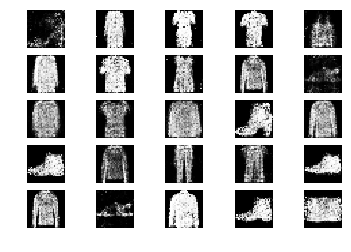

23001 [D loss: 0.600798, acc.: 67.19%] [G loss: 1.071184]
23002 [D loss: 0.591303, acc.: 75.00%] [G loss: 0.976249]
23003 [D loss: 0.690737, acc.: 54.69%] [G loss: 0.940223]
23004 [D loss: 0.605407, acc.: 62.50%] [G loss: 0.959382]
23005 [D loss: 0.578557, acc.: 70.31%] [G loss: 0.907047]
23006 [D loss: 0.628699, acc.: 62.50%] [G loss: 0.929370]
23007 [D loss: 0.633156, acc.: 57.81%] [G loss: 0.939027]
23008 [D loss: 0.690004, acc.: 50.00%] [G loss: 0.911316]
23009 [D loss: 0.630721, acc.: 64.06%] [G loss: 0.958433]
23010 [D loss: 0.591622, acc.: 79.69%] [G loss: 0.906293]
23011 [D loss: 0.638785, acc.: 65.62%] [G loss: 0.913280]
23012 [D loss: 0.738356, acc.: 54.69%] [G loss: 1.048755]
23013 [D loss: 0.621872, acc.: 60.94%] [G loss: 0.928250]
23014 [D loss: 0.689625, acc.: 53.12%] [G loss: 0.995903]
23015 [D loss: 0.633200, acc.: 67.19%] [G loss: 0.909569]
23016 [D loss: 0.681500, acc.: 59.38%] [G loss: 0.986543]
23017 [D loss: 0.599194, acc.: 70.31%] [G loss: 0.876493]
23018 [D loss:

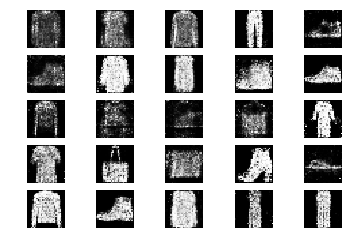

23201 [D loss: 0.657988, acc.: 68.75%] [G loss: 0.925847]
23202 [D loss: 0.673227, acc.: 56.25%] [G loss: 0.875771]
23203 [D loss: 0.657322, acc.: 60.94%] [G loss: 0.929277]
23204 [D loss: 0.620329, acc.: 62.50%] [G loss: 0.992476]
23205 [D loss: 0.622301, acc.: 67.19%] [G loss: 0.965447]
23206 [D loss: 0.658423, acc.: 60.94%] [G loss: 1.031885]
23207 [D loss: 0.630589, acc.: 65.62%] [G loss: 0.941574]
23208 [D loss: 0.610943, acc.: 70.31%] [G loss: 0.955959]
23209 [D loss: 0.616933, acc.: 65.62%] [G loss: 0.834223]
23210 [D loss: 0.683863, acc.: 50.00%] [G loss: 0.929765]
23211 [D loss: 0.609306, acc.: 68.75%] [G loss: 0.895959]
23212 [D loss: 0.656271, acc.: 59.38%] [G loss: 0.934420]
23213 [D loss: 0.599783, acc.: 68.75%] [G loss: 0.895033]
23214 [D loss: 0.630073, acc.: 65.62%] [G loss: 0.936750]
23215 [D loss: 0.679848, acc.: 54.69%] [G loss: 0.994198]
23216 [D loss: 0.662699, acc.: 57.81%] [G loss: 1.062018]
23217 [D loss: 0.726100, acc.: 42.19%] [G loss: 0.956719]
23218 [D loss:

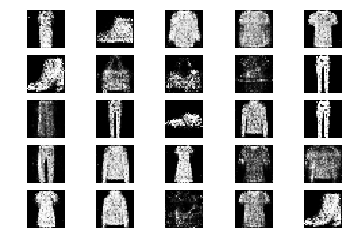

23401 [D loss: 0.601610, acc.: 68.75%] [G loss: 0.938693]
23402 [D loss: 0.689358, acc.: 57.81%] [G loss: 0.966822]
23403 [D loss: 0.628157, acc.: 65.62%] [G loss: 0.968341]
23404 [D loss: 0.704445, acc.: 57.81%] [G loss: 1.014606]
23405 [D loss: 0.564738, acc.: 75.00%] [G loss: 0.965465]
23406 [D loss: 0.620774, acc.: 65.62%] [G loss: 1.062844]
23407 [D loss: 0.632861, acc.: 62.50%] [G loss: 1.010748]
23408 [D loss: 0.629688, acc.: 64.06%] [G loss: 1.007716]
23409 [D loss: 0.601188, acc.: 65.62%] [G loss: 0.922529]
23410 [D loss: 0.646249, acc.: 56.25%] [G loss: 0.995522]
23411 [D loss: 0.631769, acc.: 65.62%] [G loss: 0.962064]
23412 [D loss: 0.652437, acc.: 59.38%] [G loss: 0.947063]
23413 [D loss: 0.681398, acc.: 59.38%] [G loss: 1.004714]
23414 [D loss: 0.591557, acc.: 67.19%] [G loss: 0.932924]
23415 [D loss: 0.652680, acc.: 59.38%] [G loss: 0.890135]
23416 [D loss: 0.637352, acc.: 60.94%] [G loss: 0.943496]
23417 [D loss: 0.641510, acc.: 62.50%] [G loss: 0.860038]
23418 [D loss:

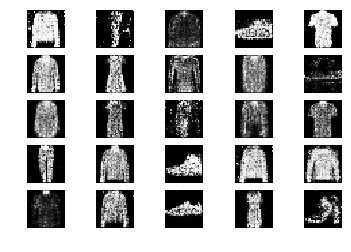

23601 [D loss: 0.653189, acc.: 56.25%] [G loss: 0.966638]
23602 [D loss: 0.623309, acc.: 59.38%] [G loss: 0.848021]
23603 [D loss: 0.593351, acc.: 62.50%] [G loss: 0.873384]
23604 [D loss: 0.758636, acc.: 43.75%] [G loss: 0.861610]
23605 [D loss: 0.649132, acc.: 59.38%] [G loss: 0.980947]
23606 [D loss: 0.618158, acc.: 68.75%] [G loss: 0.986008]
23607 [D loss: 0.659480, acc.: 62.50%] [G loss: 1.012779]
23608 [D loss: 0.630778, acc.: 65.62%] [G loss: 0.902664]
23609 [D loss: 0.630439, acc.: 73.44%] [G loss: 0.972170]
23610 [D loss: 0.642723, acc.: 57.81%] [G loss: 0.880595]
23611 [D loss: 0.626125, acc.: 67.19%] [G loss: 0.865857]
23612 [D loss: 0.635257, acc.: 70.31%] [G loss: 0.892686]
23613 [D loss: 0.658190, acc.: 57.81%] [G loss: 0.903285]
23614 [D loss: 0.621977, acc.: 65.62%] [G loss: 0.960278]
23615 [D loss: 0.701274, acc.: 50.00%] [G loss: 0.904941]
23616 [D loss: 0.697284, acc.: 46.88%] [G loss: 0.891707]
23617 [D loss: 0.652231, acc.: 60.94%] [G loss: 0.895769]
23618 [D loss:

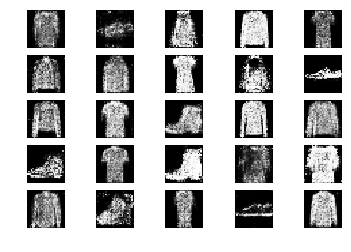

23801 [D loss: 0.664351, acc.: 59.38%] [G loss: 0.943298]
23802 [D loss: 0.626312, acc.: 67.19%] [G loss: 0.913455]
23803 [D loss: 0.659369, acc.: 60.94%] [G loss: 0.944548]
23804 [D loss: 0.601988, acc.: 62.50%] [G loss: 0.961214]
23805 [D loss: 0.670056, acc.: 67.19%] [G loss: 0.904984]
23806 [D loss: 0.661697, acc.: 54.69%] [G loss: 0.888988]
23807 [D loss: 0.624833, acc.: 65.62%] [G loss: 0.882353]
23808 [D loss: 0.631454, acc.: 59.38%] [G loss: 0.934264]
23809 [D loss: 0.657439, acc.: 57.81%] [G loss: 1.011244]
23810 [D loss: 0.575260, acc.: 70.31%] [G loss: 0.889432]
23811 [D loss: 0.697130, acc.: 54.69%] [G loss: 0.912432]
23812 [D loss: 0.654144, acc.: 59.38%] [G loss: 1.015094]
23813 [D loss: 0.619682, acc.: 64.06%] [G loss: 0.949832]
23814 [D loss: 0.691460, acc.: 53.12%] [G loss: 0.929134]
23815 [D loss: 0.599584, acc.: 71.88%] [G loss: 0.967516]
23816 [D loss: 0.616567, acc.: 65.62%] [G loss: 0.969866]
23817 [D loss: 0.663504, acc.: 65.62%] [G loss: 0.956866]
23818 [D loss:

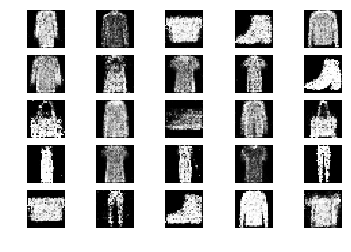

24001 [D loss: 0.647440, acc.: 62.50%] [G loss: 0.964135]
24002 [D loss: 0.562956, acc.: 68.75%] [G loss: 0.935304]
24003 [D loss: 0.610634, acc.: 57.81%] [G loss: 1.023739]
24004 [D loss: 0.659800, acc.: 60.94%] [G loss: 0.915722]
24005 [D loss: 0.678439, acc.: 70.31%] [G loss: 0.898763]
24006 [D loss: 0.697669, acc.: 57.81%] [G loss: 0.943932]
24007 [D loss: 0.647143, acc.: 57.81%] [G loss: 0.989199]
24008 [D loss: 0.626930, acc.: 59.38%] [G loss: 0.924327]
24009 [D loss: 0.590824, acc.: 73.44%] [G loss: 0.985745]
24010 [D loss: 0.667050, acc.: 60.94%] [G loss: 0.938265]
24011 [D loss: 0.681841, acc.: 62.50%] [G loss: 0.956642]
24012 [D loss: 0.667631, acc.: 65.62%] [G loss: 0.904868]
24013 [D loss: 0.695105, acc.: 57.81%] [G loss: 0.910814]
24014 [D loss: 0.632812, acc.: 60.94%] [G loss: 0.999052]
24015 [D loss: 0.596309, acc.: 68.75%] [G loss: 0.886465]
24016 [D loss: 0.571168, acc.: 76.56%] [G loss: 0.895602]
24017 [D loss: 0.702140, acc.: 51.56%] [G loss: 0.915631]
24018 [D loss:

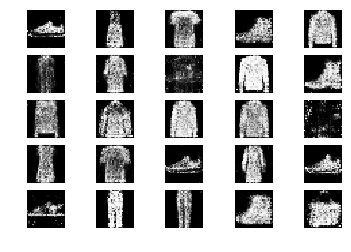

24201 [D loss: 0.681374, acc.: 56.25%] [G loss: 0.904949]
24202 [D loss: 0.635798, acc.: 65.62%] [G loss: 0.945868]
24203 [D loss: 0.679599, acc.: 54.69%] [G loss: 0.892900]
24204 [D loss: 0.633144, acc.: 57.81%] [G loss: 0.892132]
24205 [D loss: 0.631978, acc.: 65.62%] [G loss: 0.943086]
24206 [D loss: 0.598064, acc.: 73.44%] [G loss: 0.909336]
24207 [D loss: 0.642631, acc.: 62.50%] [G loss: 0.955810]
24208 [D loss: 0.704529, acc.: 53.12%] [G loss: 1.013540]
24209 [D loss: 0.710357, acc.: 50.00%] [G loss: 0.905578]
24210 [D loss: 0.640918, acc.: 62.50%] [G loss: 0.973642]
24211 [D loss: 0.633595, acc.: 54.69%] [G loss: 0.959728]
24212 [D loss: 0.622392, acc.: 65.62%] [G loss: 0.973443]
24213 [D loss: 0.631039, acc.: 60.94%] [G loss: 0.955262]
24214 [D loss: 0.602149, acc.: 73.44%] [G loss: 0.871625]
24215 [D loss: 0.658089, acc.: 57.81%] [G loss: 0.869975]
24216 [D loss: 0.662681, acc.: 56.25%] [G loss: 0.934313]
24217 [D loss: 0.576515, acc.: 75.00%] [G loss: 0.976756]
24218 [D loss:

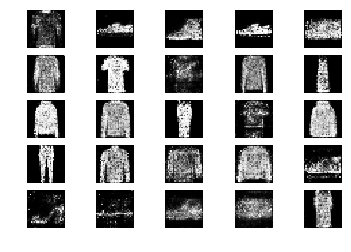

24401 [D loss: 0.637366, acc.: 54.69%] [G loss: 0.967581]
24402 [D loss: 0.668082, acc.: 57.81%] [G loss: 0.923433]
24403 [D loss: 0.613942, acc.: 64.06%] [G loss: 0.984434]
24404 [D loss: 0.527429, acc.: 79.69%] [G loss: 1.108256]
24405 [D loss: 0.618955, acc.: 73.44%] [G loss: 1.016008]
24406 [D loss: 0.659752, acc.: 53.12%] [G loss: 0.917163]
24407 [D loss: 0.634033, acc.: 60.94%] [G loss: 0.915431]
24408 [D loss: 0.669856, acc.: 59.38%] [G loss: 0.931862]
24409 [D loss: 0.594157, acc.: 70.31%] [G loss: 1.000162]
24410 [D loss: 0.666814, acc.: 60.94%] [G loss: 0.884717]
24411 [D loss: 0.627585, acc.: 62.50%] [G loss: 0.990434]
24412 [D loss: 0.677099, acc.: 57.81%] [G loss: 0.877271]
24413 [D loss: 0.660563, acc.: 59.38%] [G loss: 0.897879]
24414 [D loss: 0.645104, acc.: 59.38%] [G loss: 0.891118]
24415 [D loss: 0.673099, acc.: 54.69%] [G loss: 1.021646]
24416 [D loss: 0.632369, acc.: 65.62%] [G loss: 0.897680]
24417 [D loss: 0.658512, acc.: 57.81%] [G loss: 1.035577]
24418 [D loss:

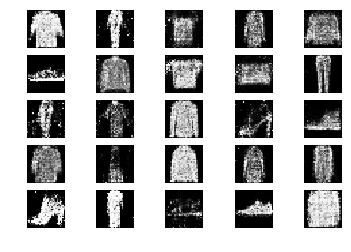

24601 [D loss: 0.707063, acc.: 57.81%] [G loss: 0.860845]
24602 [D loss: 0.652722, acc.: 59.38%] [G loss: 0.918726]
24603 [D loss: 0.683943, acc.: 59.38%] [G loss: 0.941760]
24604 [D loss: 0.649194, acc.: 62.50%] [G loss: 0.959484]
24605 [D loss: 0.690763, acc.: 57.81%] [G loss: 0.932152]
24606 [D loss: 0.713663, acc.: 53.12%] [G loss: 0.954531]
24607 [D loss: 0.695677, acc.: 54.69%] [G loss: 0.958433]
24608 [D loss: 0.642532, acc.: 60.94%] [G loss: 0.897764]
24609 [D loss: 0.670447, acc.: 51.56%] [G loss: 0.823541]
24610 [D loss: 0.658411, acc.: 53.12%] [G loss: 0.941614]
24611 [D loss: 0.646034, acc.: 62.50%] [G loss: 1.005938]
24612 [D loss: 0.688756, acc.: 56.25%] [G loss: 0.880993]
24613 [D loss: 0.594262, acc.: 73.44%] [G loss: 0.992976]
24614 [D loss: 0.658068, acc.: 54.69%] [G loss: 0.836371]
24615 [D loss: 0.679180, acc.: 54.69%] [G loss: 0.900522]
24616 [D loss: 0.606987, acc.: 67.19%] [G loss: 0.886574]
24617 [D loss: 0.668008, acc.: 53.12%] [G loss: 0.921577]
24618 [D loss:

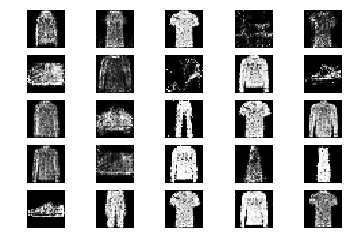

24801 [D loss: 0.689616, acc.: 53.12%] [G loss: 0.950872]
24802 [D loss: 0.591345, acc.: 67.19%] [G loss: 0.949828]
24803 [D loss: 0.643113, acc.: 59.38%] [G loss: 0.975656]
24804 [D loss: 0.605262, acc.: 65.62%] [G loss: 0.943324]
24805 [D loss: 0.616520, acc.: 60.94%] [G loss: 0.954165]
24806 [D loss: 0.649473, acc.: 62.50%] [G loss: 0.956448]
24807 [D loss: 0.630315, acc.: 57.81%] [G loss: 0.955615]
24808 [D loss: 0.592774, acc.: 73.44%] [G loss: 0.900925]
24809 [D loss: 0.620860, acc.: 65.62%] [G loss: 0.942695]
24810 [D loss: 0.693845, acc.: 53.12%] [G loss: 0.944300]
24811 [D loss: 0.595254, acc.: 75.00%] [G loss: 0.971348]
24812 [D loss: 0.633797, acc.: 67.19%] [G loss: 0.909862]
24813 [D loss: 0.532053, acc.: 81.25%] [G loss: 1.026716]
24814 [D loss: 0.676950, acc.: 64.06%] [G loss: 0.855853]
24815 [D loss: 0.616845, acc.: 67.19%] [G loss: 0.917378]
24816 [D loss: 0.695550, acc.: 57.81%] [G loss: 0.843987]
24817 [D loss: 0.646471, acc.: 60.94%] [G loss: 0.896059]
24818 [D loss:

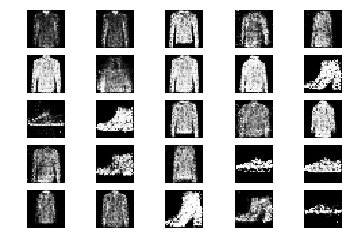

25001 [D loss: 0.630638, acc.: 65.62%] [G loss: 0.989143]
25002 [D loss: 0.637382, acc.: 56.25%] [G loss: 0.905873]
25003 [D loss: 0.647873, acc.: 60.94%] [G loss: 0.984119]
25004 [D loss: 0.684219, acc.: 59.38%] [G loss: 0.885728]
25005 [D loss: 0.628661, acc.: 60.94%] [G loss: 0.962072]
25006 [D loss: 0.733831, acc.: 51.56%] [G loss: 0.887380]
25007 [D loss: 0.671211, acc.: 57.81%] [G loss: 0.902158]
25008 [D loss: 0.658634, acc.: 64.06%] [G loss: 0.934478]
25009 [D loss: 0.665680, acc.: 54.69%] [G loss: 0.927350]
25010 [D loss: 0.633538, acc.: 64.06%] [G loss: 0.954809]
25011 [D loss: 0.622769, acc.: 65.62%] [G loss: 0.989915]
25012 [D loss: 0.604490, acc.: 70.31%] [G loss: 0.928679]
25013 [D loss: 0.582372, acc.: 71.88%] [G loss: 0.985626]
25014 [D loss: 0.623081, acc.: 57.81%] [G loss: 1.020334]
25015 [D loss: 0.641759, acc.: 71.88%] [G loss: 1.015137]
25016 [D loss: 0.624406, acc.: 70.31%] [G loss: 0.991948]
25017 [D loss: 0.605204, acc.: 68.75%] [G loss: 0.913976]
25018 [D loss:

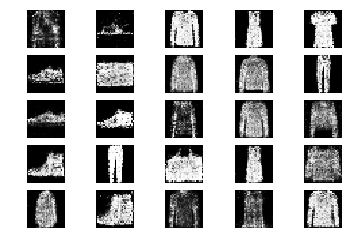

25201 [D loss: 0.609186, acc.: 70.31%] [G loss: 0.971745]
25202 [D loss: 0.671727, acc.: 54.69%] [G loss: 1.068224]
25203 [D loss: 0.707544, acc.: 56.25%] [G loss: 0.950352]
25204 [D loss: 0.676495, acc.: 59.38%] [G loss: 0.928717]
25205 [D loss: 0.649348, acc.: 56.25%] [G loss: 0.907133]
25206 [D loss: 0.685089, acc.: 56.25%] [G loss: 0.873144]
25207 [D loss: 0.635583, acc.: 56.25%] [G loss: 0.902147]
25208 [D loss: 0.642773, acc.: 62.50%] [G loss: 0.785135]
25209 [D loss: 0.558763, acc.: 71.88%] [G loss: 0.913482]
25210 [D loss: 0.645122, acc.: 64.06%] [G loss: 0.893808]
25211 [D loss: 0.606722, acc.: 65.62%] [G loss: 0.988523]
25212 [D loss: 0.649618, acc.: 60.94%] [G loss: 0.959160]
25213 [D loss: 0.610021, acc.: 71.88%] [G loss: 0.885585]
25214 [D loss: 0.649237, acc.: 62.50%] [G loss: 1.019660]
25215 [D loss: 0.617852, acc.: 71.88%] [G loss: 1.062961]
25216 [D loss: 0.632420, acc.: 65.62%] [G loss: 0.982163]
25217 [D loss: 0.595042, acc.: 64.06%] [G loss: 0.909827]
25218 [D loss:

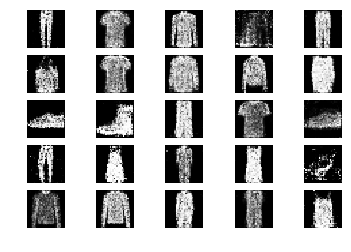

25401 [D loss: 0.603094, acc.: 68.75%] [G loss: 0.896331]
25402 [D loss: 0.616171, acc.: 65.62%] [G loss: 0.993664]
25403 [D loss: 0.577225, acc.: 67.19%] [G loss: 0.882757]
25404 [D loss: 0.606284, acc.: 64.06%] [G loss: 1.099887]
25405 [D loss: 0.619164, acc.: 76.56%] [G loss: 1.007930]
25406 [D loss: 0.624687, acc.: 68.75%] [G loss: 0.956043]
25407 [D loss: 0.683289, acc.: 59.38%] [G loss: 0.876186]
25408 [D loss: 0.657548, acc.: 73.44%] [G loss: 1.031135]
25409 [D loss: 0.521743, acc.: 81.25%] [G loss: 1.033812]
25410 [D loss: 0.630292, acc.: 64.06%] [G loss: 1.028044]
25411 [D loss: 0.584990, acc.: 64.06%] [G loss: 1.071465]
25412 [D loss: 0.597837, acc.: 65.62%] [G loss: 1.064784]
25413 [D loss: 0.568986, acc.: 75.00%] [G loss: 1.058689]
25414 [D loss: 0.655985, acc.: 57.81%] [G loss: 0.945579]
25415 [D loss: 0.712978, acc.: 54.69%] [G loss: 0.929191]
25416 [D loss: 0.723864, acc.: 51.56%] [G loss: 0.871905]
25417 [D loss: 0.621255, acc.: 60.94%] [G loss: 0.949162]
25418 [D loss:

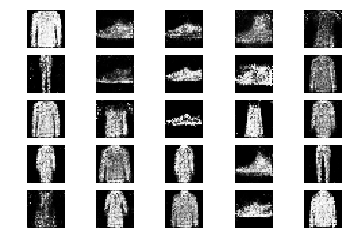

25601 [D loss: 0.693077, acc.: 62.50%] [G loss: 0.849101]
25602 [D loss: 0.589218, acc.: 65.62%] [G loss: 0.886055]
25603 [D loss: 0.695989, acc.: 60.94%] [G loss: 0.914768]
25604 [D loss: 0.600984, acc.: 68.75%] [G loss: 0.911670]
25605 [D loss: 0.634657, acc.: 60.94%] [G loss: 0.928013]
25606 [D loss: 0.703224, acc.: 54.69%] [G loss: 0.981443]
25607 [D loss: 0.594745, acc.: 68.75%] [G loss: 0.989332]
25608 [D loss: 0.632658, acc.: 68.75%] [G loss: 0.925368]
25609 [D loss: 0.709490, acc.: 53.12%] [G loss: 0.940862]
25610 [D loss: 0.642090, acc.: 65.62%] [G loss: 0.966167]
25611 [D loss: 0.658416, acc.: 53.12%] [G loss: 1.009922]
25612 [D loss: 0.693391, acc.: 56.25%] [G loss: 0.866518]
25613 [D loss: 0.692418, acc.: 56.25%] [G loss: 0.860548]
25614 [D loss: 0.632176, acc.: 64.06%] [G loss: 0.958677]
25615 [D loss: 0.600662, acc.: 68.75%] [G loss: 1.008339]
25616 [D loss: 0.599266, acc.: 70.31%] [G loss: 0.947696]
25617 [D loss: 0.639710, acc.: 60.94%] [G loss: 0.986120]
25618 [D loss:

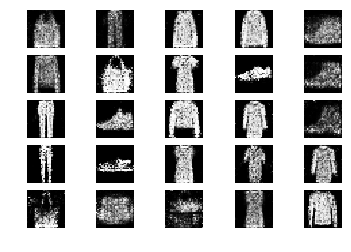

25801 [D loss: 0.668549, acc.: 65.62%] [G loss: 0.945953]
25802 [D loss: 0.655906, acc.: 64.06%] [G loss: 0.898885]
25803 [D loss: 0.583564, acc.: 71.88%] [G loss: 0.983615]
25804 [D loss: 0.626343, acc.: 65.62%] [G loss: 0.872857]
25805 [D loss: 0.650919, acc.: 60.94%] [G loss: 0.992879]
25806 [D loss: 0.622884, acc.: 68.75%] [G loss: 0.842652]
25807 [D loss: 0.641524, acc.: 60.94%] [G loss: 0.895148]
25808 [D loss: 0.666026, acc.: 62.50%] [G loss: 0.947693]
25809 [D loss: 0.611358, acc.: 75.00%] [G loss: 0.916306]
25810 [D loss: 0.676145, acc.: 56.25%] [G loss: 0.927645]
25811 [D loss: 0.662995, acc.: 65.62%] [G loss: 0.912987]
25812 [D loss: 0.655321, acc.: 60.94%] [G loss: 0.947802]
25813 [D loss: 0.602351, acc.: 70.31%] [G loss: 0.988016]
25814 [D loss: 0.611999, acc.: 71.88%] [G loss: 1.046149]
25815 [D loss: 0.767812, acc.: 50.00%] [G loss: 0.988021]
25816 [D loss: 0.701765, acc.: 50.00%] [G loss: 1.020448]
25817 [D loss: 0.584304, acc.: 71.88%] [G loss: 0.985386]
25818 [D loss:

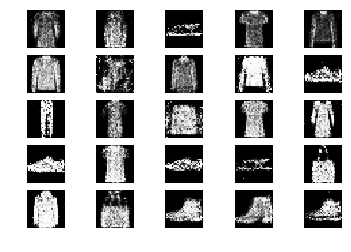

26001 [D loss: 0.636210, acc.: 65.62%] [G loss: 0.948633]
26002 [D loss: 0.653734, acc.: 56.25%] [G loss: 0.976603]
26003 [D loss: 0.677059, acc.: 64.06%] [G loss: 0.825932]
26004 [D loss: 0.721098, acc.: 57.81%] [G loss: 0.951063]
26005 [D loss: 0.660637, acc.: 57.81%] [G loss: 0.864795]
26006 [D loss: 0.593678, acc.: 68.75%] [G loss: 0.897503]
26007 [D loss: 0.644668, acc.: 57.81%] [G loss: 0.913822]
26008 [D loss: 0.692490, acc.: 56.25%] [G loss: 0.893057]
26009 [D loss: 0.639485, acc.: 56.25%] [G loss: 0.900959]
26010 [D loss: 0.659902, acc.: 54.69%] [G loss: 0.993978]
26011 [D loss: 0.606043, acc.: 67.19%] [G loss: 0.892745]
26012 [D loss: 0.588149, acc.: 71.88%] [G loss: 0.951558]
26013 [D loss: 0.651280, acc.: 59.38%] [G loss: 0.810394]
26014 [D loss: 0.719114, acc.: 48.44%] [G loss: 0.919453]
26015 [D loss: 0.647756, acc.: 60.94%] [G loss: 0.932248]
26016 [D loss: 0.638316, acc.: 64.06%] [G loss: 0.980440]
26017 [D loss: 0.630143, acc.: 57.81%] [G loss: 0.995600]
26018 [D loss:

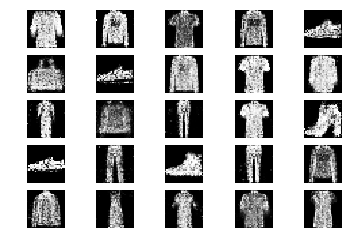

26201 [D loss: 0.644446, acc.: 62.50%] [G loss: 1.007669]
26202 [D loss: 0.593667, acc.: 67.19%] [G loss: 0.940525]
26203 [D loss: 0.605552, acc.: 65.62%] [G loss: 0.952328]
26204 [D loss: 0.616042, acc.: 68.75%] [G loss: 0.877784]
26205 [D loss: 0.703021, acc.: 54.69%] [G loss: 0.864307]
26206 [D loss: 0.643914, acc.: 56.25%] [G loss: 0.875827]
26207 [D loss: 0.647969, acc.: 67.19%] [G loss: 0.936215]
26208 [D loss: 0.651311, acc.: 64.06%] [G loss: 0.970610]
26209 [D loss: 0.629670, acc.: 59.38%] [G loss: 0.935078]
26210 [D loss: 0.564345, acc.: 71.88%] [G loss: 0.882888]
26211 [D loss: 0.656203, acc.: 56.25%] [G loss: 0.997144]
26212 [D loss: 0.644154, acc.: 65.62%] [G loss: 0.882402]
26213 [D loss: 0.653851, acc.: 56.25%] [G loss: 0.891319]
26214 [D loss: 0.617169, acc.: 65.62%] [G loss: 0.893687]
26215 [D loss: 0.635325, acc.: 70.31%] [G loss: 0.906542]
26216 [D loss: 0.619964, acc.: 62.50%] [G loss: 0.888649]
26217 [D loss: 0.763780, acc.: 53.12%] [G loss: 0.915123]
26218 [D loss:

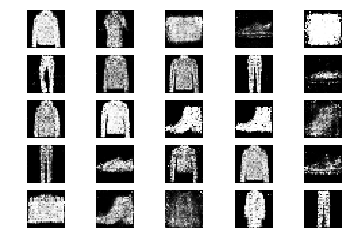

26401 [D loss: 0.635234, acc.: 65.62%] [G loss: 0.840576]
26402 [D loss: 0.616475, acc.: 67.19%] [G loss: 0.956896]
26403 [D loss: 0.695837, acc.: 54.69%] [G loss: 0.975767]
26404 [D loss: 0.643995, acc.: 60.94%] [G loss: 0.979967]
26405 [D loss: 0.669697, acc.: 53.12%] [G loss: 0.978534]
26406 [D loss: 0.638476, acc.: 59.38%] [G loss: 0.869673]
26407 [D loss: 0.670956, acc.: 56.25%] [G loss: 0.969280]
26408 [D loss: 0.635912, acc.: 64.06%] [G loss: 0.888983]
26409 [D loss: 0.630505, acc.: 64.06%] [G loss: 0.969858]
26410 [D loss: 0.632528, acc.: 68.75%] [G loss: 0.951457]
26411 [D loss: 0.595155, acc.: 57.81%] [G loss: 0.898091]
26412 [D loss: 0.684302, acc.: 45.31%] [G loss: 0.893007]
26413 [D loss: 0.698894, acc.: 54.69%] [G loss: 0.954603]
26414 [D loss: 0.600163, acc.: 60.94%] [G loss: 0.952192]
26415 [D loss: 0.610086, acc.: 70.31%] [G loss: 1.062719]
26416 [D loss: 0.653135, acc.: 64.06%] [G loss: 0.973159]
26417 [D loss: 0.636134, acc.: 71.88%] [G loss: 0.962451]
26418 [D loss:

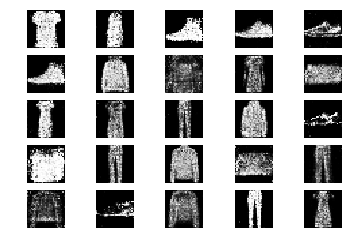

26601 [D loss: 0.603014, acc.: 70.31%] [G loss: 0.959552]
26602 [D loss: 0.641923, acc.: 65.62%] [G loss: 0.907801]
26603 [D loss: 0.661896, acc.: 65.62%] [G loss: 1.011100]
26604 [D loss: 0.662936, acc.: 59.38%] [G loss: 0.955634]
26605 [D loss: 0.611618, acc.: 64.06%] [G loss: 1.022318]
26606 [D loss: 0.574691, acc.: 65.62%] [G loss: 0.938802]
26607 [D loss: 0.690786, acc.: 51.56%] [G loss: 1.011267]
26608 [D loss: 0.665205, acc.: 56.25%] [G loss: 1.001042]
26609 [D loss: 0.656674, acc.: 64.06%] [G loss: 0.965216]
26610 [D loss: 0.558197, acc.: 73.44%] [G loss: 0.960458]
26611 [D loss: 0.631853, acc.: 62.50%] [G loss: 0.871275]
26612 [D loss: 0.642295, acc.: 65.62%] [G loss: 0.886692]
26613 [D loss: 0.670871, acc.: 59.38%] [G loss: 0.888767]
26614 [D loss: 0.671135, acc.: 53.12%] [G loss: 1.041899]
26615 [D loss: 0.647383, acc.: 60.94%] [G loss: 0.915707]
26616 [D loss: 0.667734, acc.: 54.69%] [G loss: 1.021604]
26617 [D loss: 0.613525, acc.: 62.50%] [G loss: 0.998814]
26618 [D loss:

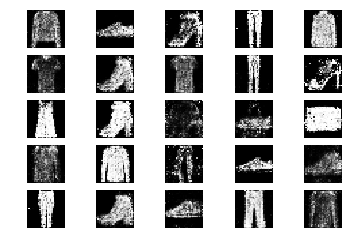

26801 [D loss: 0.667513, acc.: 56.25%] [G loss: 1.011497]
26802 [D loss: 0.687289, acc.: 67.19%] [G loss: 0.881643]
26803 [D loss: 0.601357, acc.: 70.31%] [G loss: 0.923150]
26804 [D loss: 0.661798, acc.: 62.50%] [G loss: 0.969882]
26805 [D loss: 0.552079, acc.: 76.56%] [G loss: 1.012241]
26806 [D loss: 0.701196, acc.: 65.62%] [G loss: 0.983818]
26807 [D loss: 0.636294, acc.: 64.06%] [G loss: 1.032936]
26808 [D loss: 0.613878, acc.: 70.31%] [G loss: 1.063439]
26809 [D loss: 0.696084, acc.: 56.25%] [G loss: 0.985536]
26810 [D loss: 0.590987, acc.: 60.94%] [G loss: 0.863044]
26811 [D loss: 0.657372, acc.: 67.19%] [G loss: 0.984713]
26812 [D loss: 0.644009, acc.: 59.38%] [G loss: 1.080504]
26813 [D loss: 0.680927, acc.: 56.25%] [G loss: 0.905759]
26814 [D loss: 0.588658, acc.: 68.75%] [G loss: 0.983318]
26815 [D loss: 0.674711, acc.: 57.81%] [G loss: 0.830152]
26816 [D loss: 0.598456, acc.: 68.75%] [G loss: 1.025722]
26817 [D loss: 0.667739, acc.: 60.94%] [G loss: 0.990684]
26818 [D loss:

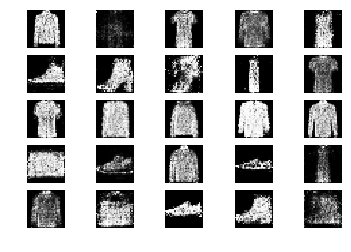

27001 [D loss: 0.636731, acc.: 71.88%] [G loss: 0.991712]
27002 [D loss: 0.681678, acc.: 56.25%] [G loss: 0.937786]
27003 [D loss: 0.637316, acc.: 65.62%] [G loss: 0.985631]
27004 [D loss: 0.572040, acc.: 71.88%] [G loss: 0.917591]
27005 [D loss: 0.617587, acc.: 62.50%] [G loss: 1.020326]
27006 [D loss: 0.649799, acc.: 56.25%] [G loss: 1.037048]
27007 [D loss: 0.573018, acc.: 71.88%] [G loss: 0.888989]
27008 [D loss: 0.550207, acc.: 75.00%] [G loss: 1.003498]
27009 [D loss: 0.659613, acc.: 59.38%] [G loss: 0.929627]
27010 [D loss: 0.639988, acc.: 65.62%] [G loss: 1.036841]
27011 [D loss: 0.674956, acc.: 57.81%] [G loss: 1.006789]
27012 [D loss: 0.645730, acc.: 59.38%] [G loss: 1.009995]
27013 [D loss: 0.617928, acc.: 67.19%] [G loss: 0.912232]
27014 [D loss: 0.628904, acc.: 64.06%] [G loss: 1.004538]
27015 [D loss: 0.608528, acc.: 62.50%] [G loss: 1.061955]
27016 [D loss: 0.677947, acc.: 59.38%] [G loss: 1.072644]
27017 [D loss: 0.671577, acc.: 57.81%] [G loss: 1.024842]
27018 [D loss:

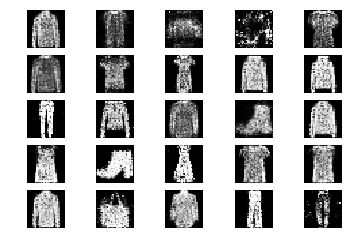

27201 [D loss: 0.666387, acc.: 57.81%] [G loss: 0.917998]
27202 [D loss: 0.672392, acc.: 60.94%] [G loss: 1.009556]
27203 [D loss: 0.692310, acc.: 53.12%] [G loss: 0.883520]
27204 [D loss: 0.625232, acc.: 68.75%] [G loss: 0.915451]
27205 [D loss: 0.629970, acc.: 65.62%] [G loss: 1.067296]
27206 [D loss: 0.647481, acc.: 65.62%] [G loss: 0.920520]
27207 [D loss: 0.688162, acc.: 68.75%] [G loss: 0.961127]
27208 [D loss: 0.593499, acc.: 71.88%] [G loss: 1.073479]
27209 [D loss: 0.612761, acc.: 60.94%] [G loss: 0.978717]
27210 [D loss: 0.594990, acc.: 70.31%] [G loss: 0.960741]
27211 [D loss: 0.685438, acc.: 56.25%] [G loss: 0.996352]
27212 [D loss: 0.631382, acc.: 70.31%] [G loss: 0.926899]
27213 [D loss: 0.684103, acc.: 56.25%] [G loss: 0.973304]
27214 [D loss: 0.646513, acc.: 67.19%] [G loss: 0.930478]
27215 [D loss: 0.563841, acc.: 75.00%] [G loss: 0.859418]
27216 [D loss: 0.597964, acc.: 65.62%] [G loss: 0.932539]
27217 [D loss: 0.687548, acc.: 57.81%] [G loss: 0.915668]
27218 [D loss:

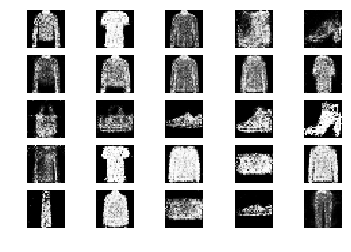

27401 [D loss: 0.626699, acc.: 65.62%] [G loss: 0.917822]
27402 [D loss: 0.697015, acc.: 59.38%] [G loss: 0.876201]
27403 [D loss: 0.670753, acc.: 59.38%] [G loss: 0.943140]
27404 [D loss: 0.720083, acc.: 51.56%] [G loss: 0.917070]
27405 [D loss: 0.634705, acc.: 62.50%] [G loss: 1.039541]
27406 [D loss: 0.630149, acc.: 64.06%] [G loss: 1.059283]
27407 [D loss: 0.635520, acc.: 67.19%] [G loss: 1.002864]
27408 [D loss: 0.635103, acc.: 60.94%] [G loss: 0.956711]
27409 [D loss: 0.608313, acc.: 65.62%] [G loss: 0.938949]
27410 [D loss: 0.628494, acc.: 64.06%] [G loss: 0.901032]
27411 [D loss: 0.668581, acc.: 57.81%] [G loss: 0.967922]
27412 [D loss: 0.720313, acc.: 51.56%] [G loss: 0.882482]
27413 [D loss: 0.648674, acc.: 65.62%] [G loss: 1.001284]
27414 [D loss: 0.585042, acc.: 64.06%] [G loss: 0.881682]
27415 [D loss: 0.631116, acc.: 57.81%] [G loss: 0.962537]
27416 [D loss: 0.584992, acc.: 71.88%] [G loss: 0.863223]
27417 [D loss: 0.570547, acc.: 71.88%] [G loss: 0.935556]
27418 [D loss:

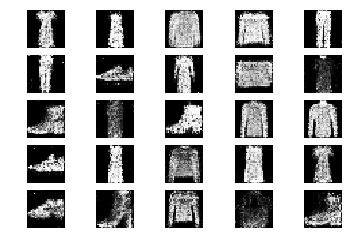

27601 [D loss: 0.621004, acc.: 65.62%] [G loss: 0.889699]
27602 [D loss: 0.648744, acc.: 70.31%] [G loss: 0.907351]
27603 [D loss: 0.677044, acc.: 57.81%] [G loss: 0.881491]
27604 [D loss: 0.680009, acc.: 59.38%] [G loss: 0.911482]
27605 [D loss: 0.664665, acc.: 56.25%] [G loss: 1.035981]
27606 [D loss: 0.642376, acc.: 67.19%] [G loss: 0.885842]
27607 [D loss: 0.649077, acc.: 57.81%] [G loss: 0.926030]
27608 [D loss: 0.682489, acc.: 56.25%] [G loss: 0.910024]
27609 [D loss: 0.684225, acc.: 56.25%] [G loss: 0.839580]
27610 [D loss: 0.623942, acc.: 67.19%] [G loss: 0.953243]
27611 [D loss: 0.660381, acc.: 64.06%] [G loss: 0.979183]
27612 [D loss: 0.597451, acc.: 71.88%] [G loss: 0.900901]
27613 [D loss: 0.594840, acc.: 68.75%] [G loss: 0.996000]
27614 [D loss: 0.640610, acc.: 60.94%] [G loss: 0.852902]
27615 [D loss: 0.609654, acc.: 65.62%] [G loss: 0.954040]
27616 [D loss: 0.645813, acc.: 57.81%] [G loss: 0.896581]
27617 [D loss: 0.633229, acc.: 57.81%] [G loss: 1.058287]
27618 [D loss:

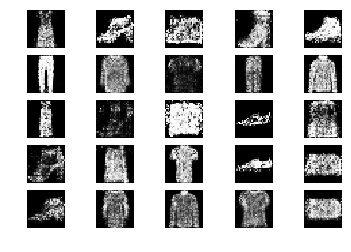

27801 [D loss: 0.614827, acc.: 67.19%] [G loss: 0.887766]
27802 [D loss: 0.709222, acc.: 48.44%] [G loss: 0.889574]
27803 [D loss: 0.644216, acc.: 60.94%] [G loss: 0.949400]
27804 [D loss: 0.619237, acc.: 59.38%] [G loss: 0.973542]
27805 [D loss: 0.619507, acc.: 71.88%] [G loss: 0.950868]
27806 [D loss: 0.660971, acc.: 57.81%] [G loss: 1.021293]
27807 [D loss: 0.662926, acc.: 53.12%] [G loss: 0.919214]
27808 [D loss: 0.561029, acc.: 68.75%] [G loss: 0.954687]
27809 [D loss: 0.640197, acc.: 62.50%] [G loss: 0.898560]
27810 [D loss: 0.620326, acc.: 67.19%] [G loss: 1.056906]
27811 [D loss: 0.644994, acc.: 59.38%] [G loss: 1.061424]
27812 [D loss: 0.683947, acc.: 60.94%] [G loss: 1.084918]
27813 [D loss: 0.578419, acc.: 79.69%] [G loss: 0.995370]
27814 [D loss: 0.549862, acc.: 75.00%] [G loss: 1.090069]
27815 [D loss: 0.691444, acc.: 59.38%] [G loss: 1.188690]
27816 [D loss: 0.583348, acc.: 71.88%] [G loss: 1.088466]
27817 [D loss: 0.683414, acc.: 54.69%] [G loss: 1.009574]
27818 [D loss:

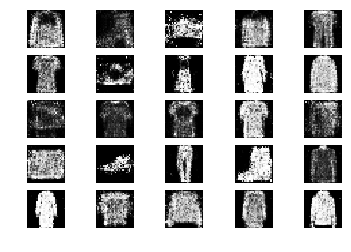

28001 [D loss: 0.641549, acc.: 54.69%] [G loss: 0.944225]
28002 [D loss: 0.603930, acc.: 67.19%] [G loss: 0.991245]
28003 [D loss: 0.596514, acc.: 71.88%] [G loss: 0.913431]
28004 [D loss: 0.675417, acc.: 54.69%] [G loss: 0.942716]
28005 [D loss: 0.582350, acc.: 71.88%] [G loss: 0.886822]
28006 [D loss: 0.637793, acc.: 67.19%] [G loss: 0.999810]
28007 [D loss: 0.633235, acc.: 65.62%] [G loss: 1.050904]
28008 [D loss: 0.666310, acc.: 60.94%] [G loss: 0.928862]
28009 [D loss: 0.684940, acc.: 59.38%] [G loss: 0.932000]
28010 [D loss: 0.631516, acc.: 64.06%] [G loss: 0.915512]
28011 [D loss: 0.632708, acc.: 65.62%] [G loss: 0.929732]
28012 [D loss: 0.576662, acc.: 73.44%] [G loss: 0.943813]
28013 [D loss: 0.635918, acc.: 57.81%] [G loss: 1.056298]
28014 [D loss: 0.692800, acc.: 54.69%] [G loss: 1.060333]
28015 [D loss: 0.687797, acc.: 53.12%] [G loss: 0.998184]
28016 [D loss: 0.627086, acc.: 62.50%] [G loss: 0.941215]
28017 [D loss: 0.697706, acc.: 57.81%] [G loss: 0.916152]
28018 [D loss:

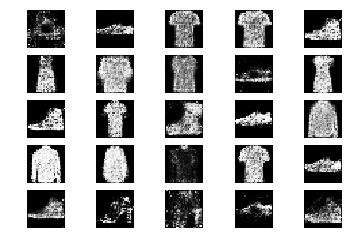

28201 [D loss: 0.609780, acc.: 65.62%] [G loss: 0.924631]
28202 [D loss: 0.667132, acc.: 65.62%] [G loss: 1.007549]
28203 [D loss: 0.591560, acc.: 71.88%] [G loss: 0.992598]
28204 [D loss: 0.567021, acc.: 75.00%] [G loss: 0.953460]
28205 [D loss: 0.679109, acc.: 57.81%] [G loss: 0.950027]
28206 [D loss: 0.639427, acc.: 68.75%] [G loss: 0.925025]
28207 [D loss: 0.715503, acc.: 56.25%] [G loss: 0.871141]
28208 [D loss: 0.658215, acc.: 59.38%] [G loss: 0.919582]
28209 [D loss: 0.596378, acc.: 64.06%] [G loss: 0.899144]
28210 [D loss: 0.620128, acc.: 62.50%] [G loss: 0.902577]
28211 [D loss: 0.659329, acc.: 62.50%] [G loss: 0.919273]
28212 [D loss: 0.688734, acc.: 56.25%] [G loss: 0.902754]
28213 [D loss: 0.700752, acc.: 51.56%] [G loss: 0.983913]
28214 [D loss: 0.597788, acc.: 64.06%] [G loss: 1.044125]
28215 [D loss: 0.626482, acc.: 67.19%] [G loss: 1.014934]
28216 [D loss: 0.657766, acc.: 59.38%] [G loss: 0.859082]
28217 [D loss: 0.631741, acc.: 65.62%] [G loss: 1.036267]
28218 [D loss:

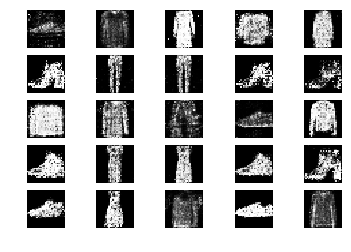

28401 [D loss: 0.561457, acc.: 71.88%] [G loss: 0.946122]
28402 [D loss: 0.569088, acc.: 76.56%] [G loss: 0.911258]
28403 [D loss: 0.677858, acc.: 60.94%] [G loss: 0.985481]
28404 [D loss: 0.697855, acc.: 54.69%] [G loss: 1.124211]
28405 [D loss: 0.653804, acc.: 59.38%] [G loss: 1.028415]
28406 [D loss: 0.625662, acc.: 67.19%] [G loss: 1.041183]
28407 [D loss: 0.642848, acc.: 62.50%] [G loss: 0.993309]
28408 [D loss: 0.591004, acc.: 70.31%] [G loss: 1.104342]
28409 [D loss: 0.673524, acc.: 62.50%] [G loss: 1.014203]
28410 [D loss: 0.607466, acc.: 64.06%] [G loss: 1.049753]
28411 [D loss: 0.606513, acc.: 67.19%] [G loss: 1.094088]
28412 [D loss: 0.582974, acc.: 73.44%] [G loss: 0.980992]
28413 [D loss: 0.660409, acc.: 53.12%] [G loss: 1.070861]
28414 [D loss: 0.550179, acc.: 81.25%] [G loss: 0.954915]
28415 [D loss: 0.637414, acc.: 60.94%] [G loss: 1.013192]
28416 [D loss: 0.679079, acc.: 60.94%] [G loss: 1.071748]
28417 [D loss: 0.649427, acc.: 65.62%] [G loss: 0.900205]
28418 [D loss:

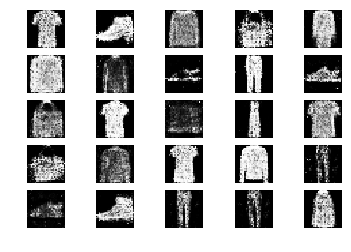

28601 [D loss: 0.650056, acc.: 54.69%] [G loss: 0.947022]
28602 [D loss: 0.586817, acc.: 62.50%] [G loss: 1.013372]
28603 [D loss: 0.580068, acc.: 71.88%] [G loss: 0.970718]
28604 [D loss: 0.589255, acc.: 70.31%] [G loss: 0.989780]
28605 [D loss: 0.618099, acc.: 64.06%] [G loss: 1.032374]
28606 [D loss: 0.676185, acc.: 57.81%] [G loss: 0.984781]
28607 [D loss: 0.681013, acc.: 50.00%] [G loss: 0.938307]
28608 [D loss: 0.709996, acc.: 56.25%] [G loss: 1.015141]
28609 [D loss: 0.653140, acc.: 60.94%] [G loss: 0.939833]
28610 [D loss: 0.583073, acc.: 76.56%] [G loss: 0.928777]
28611 [D loss: 0.691920, acc.: 57.81%] [G loss: 1.006295]
28612 [D loss: 0.632470, acc.: 64.06%] [G loss: 0.955046]
28613 [D loss: 0.681560, acc.: 62.50%] [G loss: 0.957519]
28614 [D loss: 0.618402, acc.: 62.50%] [G loss: 0.960482]
28615 [D loss: 0.577050, acc.: 68.75%] [G loss: 0.960063]
28616 [D loss: 0.609863, acc.: 60.94%] [G loss: 1.057245]
28617 [D loss: 0.654584, acc.: 59.38%] [G loss: 0.927264]
28618 [D loss:

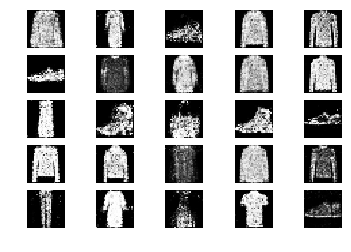

28801 [D loss: 0.649778, acc.: 62.50%] [G loss: 0.894682]
28802 [D loss: 0.636654, acc.: 59.38%] [G loss: 0.982809]
28803 [D loss: 0.677168, acc.: 51.56%] [G loss: 0.907162]
28804 [D loss: 0.619365, acc.: 64.06%] [G loss: 0.979182]
28805 [D loss: 0.635009, acc.: 62.50%] [G loss: 1.002133]
28806 [D loss: 0.668454, acc.: 57.81%] [G loss: 0.999593]
28807 [D loss: 0.653948, acc.: 59.38%] [G loss: 1.004370]
28808 [D loss: 0.577794, acc.: 67.19%] [G loss: 0.993100]
28809 [D loss: 0.590405, acc.: 68.75%] [G loss: 0.976901]
28810 [D loss: 0.673895, acc.: 59.38%] [G loss: 1.031615]
28811 [D loss: 0.578904, acc.: 67.19%] [G loss: 1.014351]
28812 [D loss: 0.577098, acc.: 67.19%] [G loss: 1.023467]
28813 [D loss: 0.658839, acc.: 53.12%] [G loss: 0.970499]
28814 [D loss: 0.567532, acc.: 71.88%] [G loss: 0.977894]
28815 [D loss: 0.673350, acc.: 57.81%] [G loss: 1.036551]
28816 [D loss: 0.617854, acc.: 65.62%] [G loss: 0.943163]
28817 [D loss: 0.680491, acc.: 56.25%] [G loss: 1.074239]
28818 [D loss:

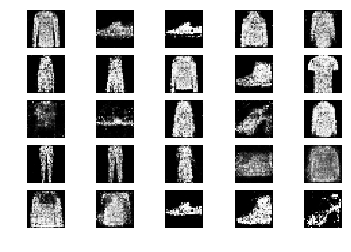

29001 [D loss: 0.602372, acc.: 70.31%] [G loss: 1.019606]
29002 [D loss: 0.594273, acc.: 75.00%] [G loss: 0.954794]
29003 [D loss: 0.586050, acc.: 73.44%] [G loss: 0.988381]
29004 [D loss: 0.673561, acc.: 59.38%] [G loss: 0.987352]
29005 [D loss: 0.672683, acc.: 56.25%] [G loss: 0.963389]
29006 [D loss: 0.657192, acc.: 62.50%] [G loss: 0.948696]
29007 [D loss: 0.638429, acc.: 62.50%] [G loss: 0.918882]
29008 [D loss: 0.610049, acc.: 65.62%] [G loss: 1.049909]
29009 [D loss: 0.583967, acc.: 75.00%] [G loss: 0.951182]
29010 [D loss: 0.626928, acc.: 64.06%] [G loss: 1.099703]
29011 [D loss: 0.601556, acc.: 64.06%] [G loss: 1.031733]
29012 [D loss: 0.616357, acc.: 64.06%] [G loss: 0.988291]
29013 [D loss: 0.666919, acc.: 48.44%] [G loss: 0.969005]
29014 [D loss: 0.670266, acc.: 65.62%] [G loss: 0.973330]
29015 [D loss: 0.598929, acc.: 68.75%] [G loss: 0.892358]
29016 [D loss: 0.590784, acc.: 68.75%] [G loss: 0.915599]
29017 [D loss: 0.702843, acc.: 53.12%] [G loss: 0.956748]
29018 [D loss:

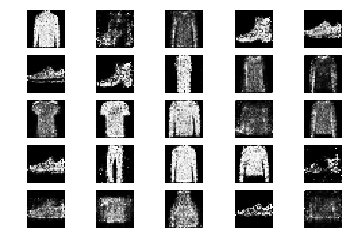

29201 [D loss: 0.608092, acc.: 68.75%] [G loss: 0.873919]
29202 [D loss: 0.643322, acc.: 65.62%] [G loss: 0.924296]
29203 [D loss: 0.588758, acc.: 79.69%] [G loss: 0.940263]
29204 [D loss: 0.659199, acc.: 62.50%] [G loss: 0.893507]
29205 [D loss: 0.651086, acc.: 59.38%] [G loss: 1.034156]
29206 [D loss: 0.646791, acc.: 59.38%] [G loss: 1.026763]
29207 [D loss: 0.671440, acc.: 62.50%] [G loss: 1.051167]
29208 [D loss: 0.609761, acc.: 64.06%] [G loss: 1.002193]
29209 [D loss: 0.617862, acc.: 70.31%] [G loss: 1.014830]
29210 [D loss: 0.621329, acc.: 64.06%] [G loss: 1.056535]
29211 [D loss: 0.642340, acc.: 59.38%] [G loss: 0.879184]
29212 [D loss: 0.604561, acc.: 64.06%] [G loss: 0.933531]
29213 [D loss: 0.626895, acc.: 59.38%] [G loss: 1.010842]
29214 [D loss: 0.633214, acc.: 60.94%] [G loss: 1.040552]
29215 [D loss: 0.688926, acc.: 59.38%] [G loss: 1.018674]
29216 [D loss: 0.575134, acc.: 75.00%] [G loss: 0.939774]
29217 [D loss: 0.628723, acc.: 60.94%] [G loss: 1.014274]
29218 [D loss:

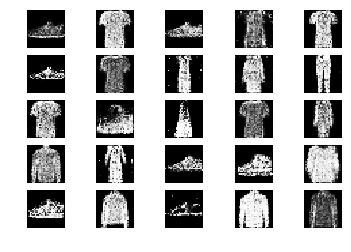

29401 [D loss: 0.630569, acc.: 64.06%] [G loss: 0.894500]
29402 [D loss: 0.576263, acc.: 76.56%] [G loss: 0.942134]
29403 [D loss: 0.739130, acc.: 56.25%] [G loss: 0.974607]
29404 [D loss: 0.705610, acc.: 48.44%] [G loss: 0.930065]
29405 [D loss: 0.651018, acc.: 62.50%] [G loss: 1.017065]
29406 [D loss: 0.647017, acc.: 57.81%] [G loss: 0.919336]
29407 [D loss: 0.706329, acc.: 54.69%] [G loss: 1.005918]
29408 [D loss: 0.649281, acc.: 64.06%] [G loss: 0.988363]
29409 [D loss: 0.633869, acc.: 64.06%] [G loss: 1.007671]
29410 [D loss: 0.646070, acc.: 67.19%] [G loss: 1.046640]
29411 [D loss: 0.625199, acc.: 59.38%] [G loss: 1.061050]
29412 [D loss: 0.653319, acc.: 59.38%] [G loss: 0.974499]
29413 [D loss: 0.599582, acc.: 71.88%] [G loss: 0.963144]
29414 [D loss: 0.676312, acc.: 53.12%] [G loss: 0.888864]
29415 [D loss: 0.555676, acc.: 76.56%] [G loss: 1.007360]
29416 [D loss: 0.569200, acc.: 70.31%] [G loss: 0.985324]
29417 [D loss: 0.589679, acc.: 67.19%] [G loss: 1.014082]
29418 [D loss:

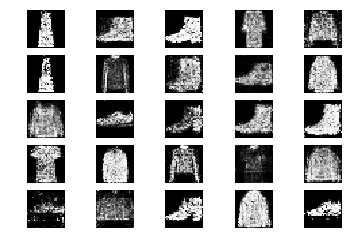

29601 [D loss: 0.659873, acc.: 53.12%] [G loss: 0.892860]
29602 [D loss: 0.654272, acc.: 60.94%] [G loss: 0.887274]
29603 [D loss: 0.592514, acc.: 73.44%] [G loss: 0.880655]
29604 [D loss: 0.639158, acc.: 64.06%] [G loss: 0.921620]
29605 [D loss: 0.583195, acc.: 70.31%] [G loss: 0.974705]
29606 [D loss: 0.690144, acc.: 53.12%] [G loss: 1.019099]
29607 [D loss: 0.622388, acc.: 62.50%] [G loss: 0.916570]
29608 [D loss: 0.619742, acc.: 64.06%] [G loss: 0.860095]
29609 [D loss: 0.721325, acc.: 50.00%] [G loss: 0.894867]
29610 [D loss: 0.658749, acc.: 57.81%] [G loss: 0.957206]
29611 [D loss: 0.597540, acc.: 64.06%] [G loss: 0.877132]
29612 [D loss: 0.635171, acc.: 62.50%] [G loss: 0.987580]
29613 [D loss: 0.572442, acc.: 71.88%] [G loss: 1.047485]
29614 [D loss: 0.652019, acc.: 53.12%] [G loss: 0.951066]
29615 [D loss: 0.669358, acc.: 64.06%] [G loss: 1.030509]
29616 [D loss: 0.663868, acc.: 65.62%] [G loss: 0.868246]
29617 [D loss: 0.637414, acc.: 64.06%] [G loss: 0.991071]
29618 [D loss:

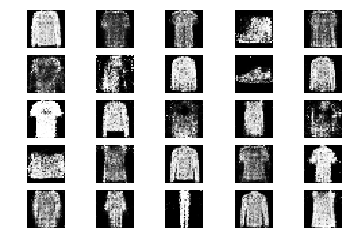

29801 [D loss: 0.655830, acc.: 62.50%] [G loss: 1.081442]
29802 [D loss: 0.621508, acc.: 60.94%] [G loss: 0.893698]
29803 [D loss: 0.668985, acc.: 56.25%] [G loss: 0.932364]
29804 [D loss: 0.613083, acc.: 64.06%] [G loss: 0.935406]
29805 [D loss: 0.720833, acc.: 60.94%] [G loss: 1.014716]
29806 [D loss: 0.662103, acc.: 62.50%] [G loss: 0.973516]
29807 [D loss: 0.626182, acc.: 68.75%] [G loss: 1.074574]
29808 [D loss: 0.624270, acc.: 70.31%] [G loss: 1.062362]
29809 [D loss: 0.565078, acc.: 65.62%] [G loss: 0.964283]
29810 [D loss: 0.706549, acc.: 51.56%] [G loss: 1.086510]
29811 [D loss: 0.613584, acc.: 64.06%] [G loss: 1.003212]
29812 [D loss: 0.637690, acc.: 60.94%] [G loss: 0.972324]
29813 [D loss: 0.643046, acc.: 51.56%] [G loss: 1.022948]
29814 [D loss: 0.567646, acc.: 70.31%] [G loss: 0.906316]
29815 [D loss: 0.639152, acc.: 57.81%] [G loss: 0.965956]
29816 [D loss: 0.617985, acc.: 60.94%] [G loss: 0.991298]
29817 [D loss: 0.702130, acc.: 51.56%] [G loss: 0.899849]
29818 [D loss:

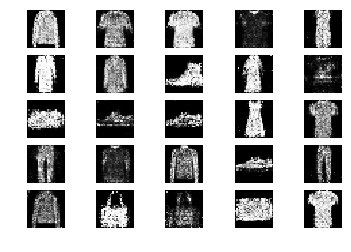

30001 [D loss: 0.595793, acc.: 67.19%] [G loss: 0.931483]
30002 [D loss: 0.621891, acc.: 65.62%] [G loss: 0.907138]
30003 [D loss: 0.612236, acc.: 65.62%] [G loss: 1.061673]
30004 [D loss: 0.597392, acc.: 68.75%] [G loss: 0.900081]
30005 [D loss: 0.673913, acc.: 62.50%] [G loss: 0.914519]
30006 [D loss: 0.671289, acc.: 64.06%] [G loss: 0.876504]
30007 [D loss: 0.665775, acc.: 64.06%] [G loss: 0.975591]
30008 [D loss: 0.635063, acc.: 62.50%] [G loss: 0.934487]
30009 [D loss: 0.726539, acc.: 45.31%] [G loss: 1.113844]
30010 [D loss: 0.617068, acc.: 65.62%] [G loss: 1.041457]
30011 [D loss: 0.648729, acc.: 62.50%] [G loss: 1.065276]
30012 [D loss: 0.627102, acc.: 57.81%] [G loss: 1.013678]
30013 [D loss: 0.691095, acc.: 51.56%] [G loss: 0.945046]
30014 [D loss: 0.660517, acc.: 56.25%] [G loss: 1.057428]
30015 [D loss: 0.599432, acc.: 70.31%] [G loss: 1.024469]
30016 [D loss: 0.586892, acc.: 62.50%] [G loss: 0.924448]
30017 [D loss: 0.647926, acc.: 59.38%] [G loss: 1.011449]
30018 [D loss:

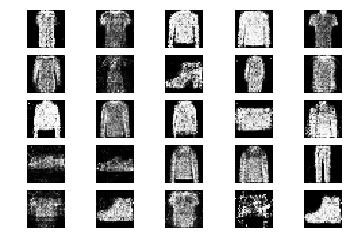

30201 [D loss: 0.657151, acc.: 57.81%] [G loss: 0.893591]
30202 [D loss: 0.714383, acc.: 51.56%] [G loss: 0.903192]
30203 [D loss: 0.621987, acc.: 62.50%] [G loss: 0.927082]
30204 [D loss: 0.708024, acc.: 64.06%] [G loss: 1.001544]
30205 [D loss: 0.567599, acc.: 73.44%] [G loss: 1.015931]
30206 [D loss: 0.608533, acc.: 67.19%] [G loss: 1.079135]
30207 [D loss: 0.679069, acc.: 59.38%] [G loss: 0.979597]
30208 [D loss: 0.659977, acc.: 54.69%] [G loss: 0.951536]
30209 [D loss: 0.641227, acc.: 62.50%] [G loss: 1.045511]
30210 [D loss: 0.692156, acc.: 53.12%] [G loss: 0.995384]
30211 [D loss: 0.581844, acc.: 70.31%] [G loss: 1.020548]
30212 [D loss: 0.698677, acc.: 48.44%] [G loss: 0.944575]
30213 [D loss: 0.632797, acc.: 67.19%] [G loss: 0.959128]
30214 [D loss: 0.628110, acc.: 70.31%] [G loss: 0.910777]
30215 [D loss: 0.618169, acc.: 70.31%] [G loss: 0.999287]
30216 [D loss: 0.675131, acc.: 60.94%] [G loss: 0.951398]
30217 [D loss: 0.630855, acc.: 64.06%] [G loss: 0.941869]
30218 [D loss:

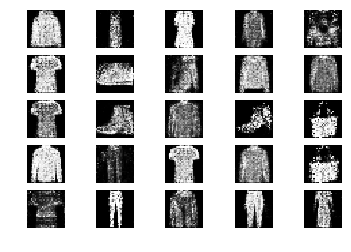

30401 [D loss: 0.653233, acc.: 53.12%] [G loss: 0.948963]
30402 [D loss: 0.698519, acc.: 53.12%] [G loss: 1.024952]
30403 [D loss: 0.646434, acc.: 59.38%] [G loss: 1.027104]
30404 [D loss: 0.641064, acc.: 68.75%] [G loss: 1.002753]
30405 [D loss: 0.620165, acc.: 60.94%] [G loss: 0.961748]
30406 [D loss: 0.757831, acc.: 43.75%] [G loss: 0.935353]
30407 [D loss: 0.638548, acc.: 67.19%] [G loss: 0.839167]
30408 [D loss: 0.708890, acc.: 48.44%] [G loss: 1.044075]
30409 [D loss: 0.604885, acc.: 65.62%] [G loss: 0.933260]
30410 [D loss: 0.610223, acc.: 68.75%] [G loss: 1.001491]
30411 [D loss: 0.652646, acc.: 60.94%] [G loss: 0.981677]
30412 [D loss: 0.606988, acc.: 65.62%] [G loss: 1.003127]
30413 [D loss: 0.606037, acc.: 68.75%] [G loss: 0.944915]
30414 [D loss: 0.633541, acc.: 62.50%] [G loss: 0.988837]
30415 [D loss: 0.573440, acc.: 68.75%] [G loss: 1.055210]
30416 [D loss: 0.631252, acc.: 62.50%] [G loss: 1.024238]
30417 [D loss: 0.607706, acc.: 65.62%] [G loss: 0.975955]
30418 [D loss:

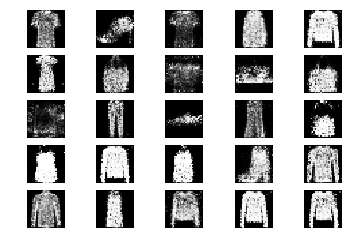

30601 [D loss: 0.715593, acc.: 54.69%] [G loss: 1.039413]
30602 [D loss: 0.598188, acc.: 71.88%] [G loss: 0.906473]
30603 [D loss: 0.589263, acc.: 70.31%] [G loss: 0.936448]
30604 [D loss: 0.626474, acc.: 62.50%] [G loss: 0.917855]
30605 [D loss: 0.589544, acc.: 68.75%] [G loss: 1.002645]
30606 [D loss: 0.626346, acc.: 60.94%] [G loss: 0.973198]
30607 [D loss: 0.562952, acc.: 75.00%] [G loss: 1.020475]
30608 [D loss: 0.664191, acc.: 54.69%] [G loss: 0.957197]
30609 [D loss: 0.603069, acc.: 65.62%] [G loss: 0.941236]
30610 [D loss: 0.544291, acc.: 76.56%] [G loss: 0.956873]
30611 [D loss: 0.722031, acc.: 56.25%] [G loss: 1.017234]
30612 [D loss: 0.606616, acc.: 65.62%] [G loss: 1.070572]
30613 [D loss: 0.585375, acc.: 67.19%] [G loss: 1.015558]
30614 [D loss: 0.677568, acc.: 57.81%] [G loss: 0.909657]
30615 [D loss: 0.612154, acc.: 64.06%] [G loss: 0.925187]
30616 [D loss: 0.666156, acc.: 54.69%] [G loss: 0.938455]
30617 [D loss: 0.627216, acc.: 62.50%] [G loss: 1.044061]
30618 [D loss:

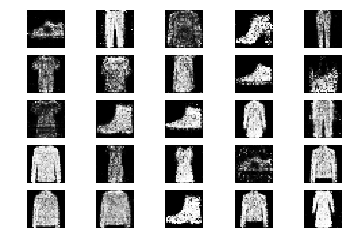

30801 [D loss: 0.669896, acc.: 54.69%] [G loss: 0.982287]
30802 [D loss: 0.640857, acc.: 68.75%] [G loss: 1.031057]
30803 [D loss: 0.633363, acc.: 60.94%] [G loss: 1.027845]
30804 [D loss: 0.640511, acc.: 59.38%] [G loss: 1.019571]
30805 [D loss: 0.632687, acc.: 67.19%] [G loss: 0.987854]
30806 [D loss: 0.603434, acc.: 67.19%] [G loss: 1.071648]
30807 [D loss: 0.610677, acc.: 65.62%] [G loss: 1.024762]
30808 [D loss: 0.659528, acc.: 65.62%] [G loss: 0.960028]
30809 [D loss: 0.668777, acc.: 60.94%] [G loss: 0.906792]
30810 [D loss: 0.654509, acc.: 62.50%] [G loss: 0.915619]
30811 [D loss: 0.666817, acc.: 51.56%] [G loss: 0.934531]
30812 [D loss: 0.628709, acc.: 62.50%] [G loss: 0.916936]
30813 [D loss: 0.592613, acc.: 73.44%] [G loss: 0.994506]
30814 [D loss: 0.592964, acc.: 67.19%] [G loss: 1.055704]
30815 [D loss: 0.665632, acc.: 56.25%] [G loss: 0.991210]
30816 [D loss: 0.688773, acc.: 57.81%] [G loss: 0.913808]
30817 [D loss: 0.582755, acc.: 76.56%] [G loss: 0.995853]
30818 [D loss:

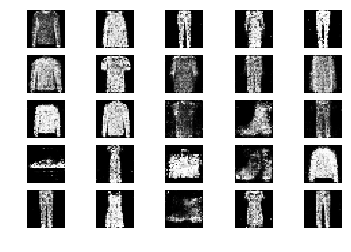

31001 [D loss: 0.616148, acc.: 67.19%] [G loss: 1.034794]
31002 [D loss: 0.697656, acc.: 59.38%] [G loss: 0.945238]
31003 [D loss: 0.628388, acc.: 64.06%] [G loss: 0.928039]
31004 [D loss: 0.558849, acc.: 68.75%] [G loss: 1.003978]
31005 [D loss: 0.671714, acc.: 59.38%] [G loss: 0.891033]
31006 [D loss: 0.632083, acc.: 57.81%] [G loss: 0.951314]
31007 [D loss: 0.577204, acc.: 68.75%] [G loss: 0.986953]
31008 [D loss: 0.562975, acc.: 78.12%] [G loss: 0.976574]
31009 [D loss: 0.579353, acc.: 71.88%] [G loss: 0.979799]
31010 [D loss: 0.587497, acc.: 71.88%] [G loss: 1.014664]
31011 [D loss: 0.588485, acc.: 71.88%] [G loss: 1.110194]
31012 [D loss: 0.643723, acc.: 64.06%] [G loss: 0.941538]
31013 [D loss: 0.626313, acc.: 62.50%] [G loss: 1.014810]
31014 [D loss: 0.691699, acc.: 59.38%] [G loss: 0.949180]
31015 [D loss: 0.647002, acc.: 64.06%] [G loss: 0.956060]
31016 [D loss: 0.595032, acc.: 67.19%] [G loss: 0.995236]
31017 [D loss: 0.634143, acc.: 64.06%] [G loss: 0.997953]
31018 [D loss:

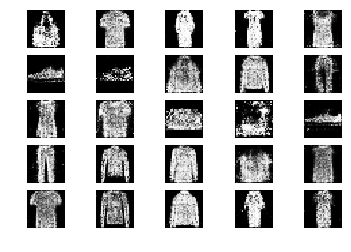

31201 [D loss: 0.596748, acc.: 68.75%] [G loss: 1.060300]
31202 [D loss: 0.679067, acc.: 56.25%] [G loss: 1.075176]
31203 [D loss: 0.557991, acc.: 73.44%] [G loss: 1.016250]
31204 [D loss: 0.629500, acc.: 62.50%] [G loss: 0.959065]
31205 [D loss: 0.582834, acc.: 67.19%] [G loss: 0.956069]
31206 [D loss: 0.555196, acc.: 76.56%] [G loss: 1.056442]
31207 [D loss: 0.587993, acc.: 68.75%] [G loss: 1.042308]
31208 [D loss: 0.539888, acc.: 73.44%] [G loss: 1.093233]
31209 [D loss: 0.573294, acc.: 75.00%] [G loss: 1.020736]
31210 [D loss: 0.616977, acc.: 65.62%] [G loss: 1.000530]
31211 [D loss: 0.599709, acc.: 65.62%] [G loss: 0.952611]
31212 [D loss: 0.702393, acc.: 57.81%] [G loss: 0.983380]
31213 [D loss: 0.675827, acc.: 59.38%] [G loss: 0.974325]
31214 [D loss: 0.634934, acc.: 57.81%] [G loss: 1.013518]
31215 [D loss: 0.616955, acc.: 67.19%] [G loss: 0.903155]
31216 [D loss: 0.687401, acc.: 56.25%] [G loss: 1.043618]
31217 [D loss: 0.762639, acc.: 48.44%] [G loss: 0.975613]
31218 [D loss:

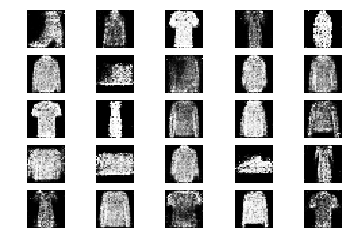

31401 [D loss: 0.569868, acc.: 79.69%] [G loss: 0.965769]
31402 [D loss: 0.638189, acc.: 62.50%] [G loss: 0.844816]
31403 [D loss: 0.684481, acc.: 62.50%] [G loss: 0.960528]
31404 [D loss: 0.669369, acc.: 59.38%] [G loss: 0.940521]
31405 [D loss: 0.664802, acc.: 57.81%] [G loss: 1.065103]
31406 [D loss: 0.654436, acc.: 65.62%] [G loss: 0.951964]
31407 [D loss: 0.629674, acc.: 64.06%] [G loss: 0.990737]
31408 [D loss: 0.664388, acc.: 64.06%] [G loss: 1.018772]
31409 [D loss: 0.695014, acc.: 56.25%] [G loss: 0.896661]
31410 [D loss: 0.695724, acc.: 51.56%] [G loss: 0.885669]
31411 [D loss: 0.617475, acc.: 67.19%] [G loss: 0.883597]
31412 [D loss: 0.774116, acc.: 45.31%] [G loss: 0.953751]
31413 [D loss: 0.665037, acc.: 64.06%] [G loss: 0.985360]
31414 [D loss: 0.638721, acc.: 64.06%] [G loss: 0.916033]
31415 [D loss: 0.625224, acc.: 62.50%] [G loss: 0.970369]
31416 [D loss: 0.583012, acc.: 71.88%] [G loss: 0.991688]
31417 [D loss: 0.703505, acc.: 51.56%] [G loss: 0.973750]
31418 [D loss:

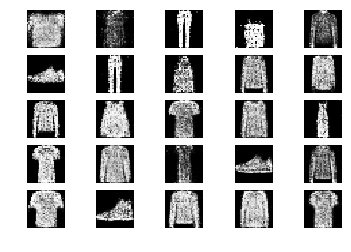

31601 [D loss: 0.636554, acc.: 60.94%] [G loss: 0.895379]
31602 [D loss: 0.620680, acc.: 57.81%] [G loss: 0.918528]
31603 [D loss: 0.667042, acc.: 62.50%] [G loss: 0.951189]
31604 [D loss: 0.612939, acc.: 64.06%] [G loss: 0.964843]
31605 [D loss: 0.615618, acc.: 70.31%] [G loss: 1.024285]
31606 [D loss: 0.616747, acc.: 68.75%] [G loss: 1.045781]
31607 [D loss: 0.570111, acc.: 73.44%] [G loss: 0.983535]
31608 [D loss: 0.705194, acc.: 56.25%] [G loss: 1.030221]
31609 [D loss: 0.661554, acc.: 59.38%] [G loss: 1.027189]
31610 [D loss: 0.742761, acc.: 50.00%] [G loss: 1.072392]
31611 [D loss: 0.618650, acc.: 75.00%] [G loss: 1.077677]
31612 [D loss: 0.679025, acc.: 64.06%] [G loss: 1.042842]
31613 [D loss: 0.654630, acc.: 64.06%] [G loss: 0.924929]
31614 [D loss: 0.604134, acc.: 70.31%] [G loss: 0.907845]
31615 [D loss: 0.577736, acc.: 70.31%] [G loss: 0.942668]
31616 [D loss: 0.717393, acc.: 59.38%] [G loss: 0.967621]
31617 [D loss: 0.528945, acc.: 78.12%] [G loss: 0.879870]
31618 [D loss:

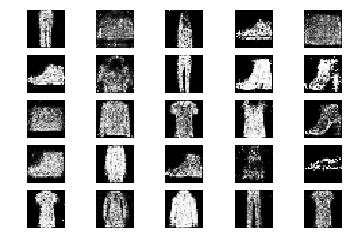

31801 [D loss: 0.689307, acc.: 54.69%] [G loss: 0.967058]
31802 [D loss: 0.655135, acc.: 59.38%] [G loss: 0.999718]
31803 [D loss: 0.688669, acc.: 56.25%] [G loss: 0.954523]
31804 [D loss: 0.669984, acc.: 50.00%] [G loss: 0.987178]
31805 [D loss: 0.664930, acc.: 59.38%] [G loss: 0.953195]
31806 [D loss: 0.618234, acc.: 67.19%] [G loss: 1.046868]
31807 [D loss: 0.558410, acc.: 76.56%] [G loss: 1.036665]
31808 [D loss: 0.634387, acc.: 57.81%] [G loss: 1.048234]
31809 [D loss: 0.628753, acc.: 60.94%] [G loss: 1.060008]
31810 [D loss: 0.654661, acc.: 54.69%] [G loss: 0.838934]
31811 [D loss: 0.698461, acc.: 54.69%] [G loss: 0.901717]
31812 [D loss: 0.701209, acc.: 56.25%] [G loss: 0.878930]
31813 [D loss: 0.677411, acc.: 62.50%] [G loss: 0.968906]
31814 [D loss: 0.574137, acc.: 67.19%] [G loss: 0.916402]
31815 [D loss: 0.701650, acc.: 54.69%] [G loss: 0.809935]
31816 [D loss: 0.670573, acc.: 56.25%] [G loss: 0.953988]
31817 [D loss: 0.589352, acc.: 71.88%] [G loss: 0.944941]
31818 [D loss:

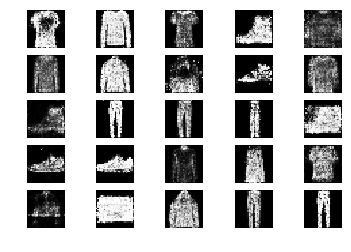

32001 [D loss: 0.609802, acc.: 67.19%] [G loss: 1.018077]
32002 [D loss: 0.609444, acc.: 64.06%] [G loss: 0.987969]
32003 [D loss: 0.630168, acc.: 62.50%] [G loss: 0.972067]
32004 [D loss: 0.595424, acc.: 65.62%] [G loss: 1.003585]
32005 [D loss: 0.683425, acc.: 54.69%] [G loss: 0.875325]
32006 [D loss: 0.621250, acc.: 68.75%] [G loss: 0.890916]
32007 [D loss: 0.649007, acc.: 56.25%] [G loss: 0.938799]
32008 [D loss: 0.593783, acc.: 71.88%] [G loss: 0.912609]
32009 [D loss: 0.632300, acc.: 62.50%] [G loss: 0.988218]
32010 [D loss: 0.571285, acc.: 78.12%] [G loss: 1.017669]
32011 [D loss: 0.651236, acc.: 62.50%] [G loss: 0.911304]
32012 [D loss: 0.629553, acc.: 70.31%] [G loss: 0.959071]
32013 [D loss: 0.580950, acc.: 73.44%] [G loss: 0.967303]
32014 [D loss: 0.584813, acc.: 68.75%] [G loss: 0.947936]
32015 [D loss: 0.622122, acc.: 65.62%] [G loss: 0.855897]
32016 [D loss: 0.573985, acc.: 73.44%] [G loss: 1.033446]
32017 [D loss: 0.554269, acc.: 68.75%] [G loss: 1.098288]
32018 [D loss:

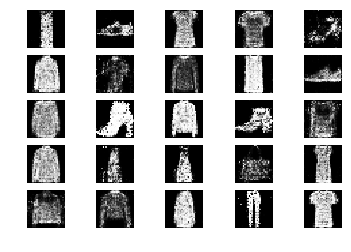

32201 [D loss: 0.590117, acc.: 70.31%] [G loss: 0.879906]
32202 [D loss: 0.630593, acc.: 68.75%] [G loss: 0.895338]
32203 [D loss: 0.622130, acc.: 67.19%] [G loss: 0.932121]
32204 [D loss: 0.649204, acc.: 60.94%] [G loss: 1.033442]
32205 [D loss: 0.569990, acc.: 67.19%] [G loss: 1.049070]
32206 [D loss: 0.553382, acc.: 75.00%] [G loss: 0.914765]
32207 [D loss: 0.646761, acc.: 64.06%] [G loss: 0.937966]
32208 [D loss: 0.678980, acc.: 56.25%] [G loss: 0.884393]
32209 [D loss: 0.636234, acc.: 70.31%] [G loss: 0.937148]
32210 [D loss: 0.590785, acc.: 67.19%] [G loss: 0.851414]
32211 [D loss: 0.649800, acc.: 64.06%] [G loss: 0.898429]
32212 [D loss: 0.690094, acc.: 59.38%] [G loss: 0.938686]
32213 [D loss: 0.612301, acc.: 64.06%] [G loss: 1.000178]
32214 [D loss: 0.688978, acc.: 48.44%] [G loss: 0.846861]
32215 [D loss: 0.679979, acc.: 62.50%] [G loss: 0.958694]
32216 [D loss: 0.697052, acc.: 51.56%] [G loss: 0.960097]
32217 [D loss: 0.602058, acc.: 68.75%] [G loss: 1.022273]
32218 [D loss:

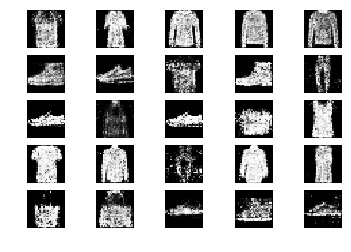

32401 [D loss: 0.503129, acc.: 82.81%] [G loss: 0.924861]
32402 [D loss: 0.653044, acc.: 64.06%] [G loss: 0.993260]
32403 [D loss: 0.654184, acc.: 67.19%] [G loss: 0.815253]
32404 [D loss: 0.583833, acc.: 71.88%] [G loss: 0.911224]
32405 [D loss: 0.649960, acc.: 56.25%] [G loss: 0.940684]
32406 [D loss: 0.655164, acc.: 57.81%] [G loss: 1.019955]
32407 [D loss: 0.657155, acc.: 62.50%] [G loss: 0.962117]
32408 [D loss: 0.641802, acc.: 64.06%] [G loss: 0.965245]
32409 [D loss: 0.618754, acc.: 68.75%] [G loss: 0.941450]
32410 [D loss: 0.605782, acc.: 67.19%] [G loss: 0.974295]
32411 [D loss: 0.650662, acc.: 65.62%] [G loss: 0.989548]
32412 [D loss: 0.675144, acc.: 54.69%] [G loss: 1.021108]
32413 [D loss: 0.607718, acc.: 65.62%] [G loss: 1.023427]
32414 [D loss: 0.605828, acc.: 60.94%] [G loss: 1.058173]
32415 [D loss: 0.611194, acc.: 60.94%] [G loss: 1.050061]
32416 [D loss: 0.609506, acc.: 70.31%] [G loss: 1.011035]
32417 [D loss: 0.692086, acc.: 51.56%] [G loss: 0.997363]
32418 [D loss:

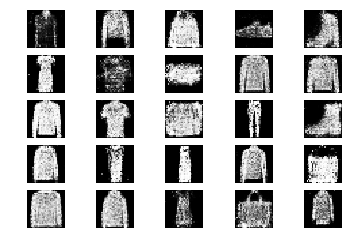

32601 [D loss: 0.746158, acc.: 43.75%] [G loss: 1.027135]
32602 [D loss: 0.545776, acc.: 70.31%] [G loss: 0.937558]
32603 [D loss: 0.654752, acc.: 59.38%] [G loss: 0.953143]
32604 [D loss: 0.679052, acc.: 65.62%] [G loss: 0.999919]
32605 [D loss: 0.677307, acc.: 53.12%] [G loss: 0.902768]
32606 [D loss: 0.558168, acc.: 70.31%] [G loss: 0.940379]
32607 [D loss: 0.652160, acc.: 62.50%] [G loss: 0.966706]
32608 [D loss: 0.631269, acc.: 62.50%] [G loss: 0.975726]
32609 [D loss: 0.600353, acc.: 70.31%] [G loss: 0.892371]
32610 [D loss: 0.646064, acc.: 62.50%] [G loss: 0.900192]
32611 [D loss: 0.702130, acc.: 57.81%] [G loss: 0.964631]
32612 [D loss: 0.614895, acc.: 67.19%] [G loss: 0.937352]
32613 [D loss: 0.632863, acc.: 62.50%] [G loss: 0.976151]
32614 [D loss: 0.615820, acc.: 59.38%] [G loss: 1.033750]
32615 [D loss: 0.705021, acc.: 56.25%] [G loss: 0.946135]
32616 [D loss: 0.712731, acc.: 56.25%] [G loss: 0.959041]
32617 [D loss: 0.633479, acc.: 60.94%] [G loss: 1.015348]
32618 [D loss:

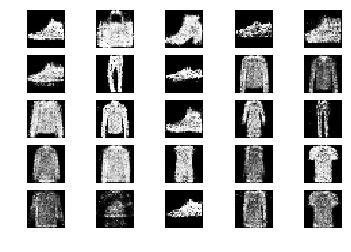

32801 [D loss: 0.615905, acc.: 64.06%] [G loss: 0.923471]
32802 [D loss: 0.665340, acc.: 62.50%] [G loss: 1.008723]
32803 [D loss: 0.567716, acc.: 75.00%] [G loss: 0.984931]
32804 [D loss: 0.590994, acc.: 75.00%] [G loss: 0.989398]
32805 [D loss: 0.654607, acc.: 59.38%] [G loss: 0.943144]
32806 [D loss: 0.658671, acc.: 62.50%] [G loss: 0.950730]
32807 [D loss: 0.670527, acc.: 56.25%] [G loss: 0.878266]
32808 [D loss: 0.613945, acc.: 70.31%] [G loss: 0.900738]
32809 [D loss: 0.607991, acc.: 67.19%] [G loss: 0.898996]
32810 [D loss: 0.626693, acc.: 59.38%] [G loss: 1.000138]
32811 [D loss: 0.607773, acc.: 60.94%] [G loss: 0.946706]
32812 [D loss: 0.615884, acc.: 70.31%] [G loss: 1.022199]
32813 [D loss: 0.620545, acc.: 64.06%] [G loss: 1.070913]
32814 [D loss: 0.708586, acc.: 53.12%] [G loss: 1.012112]
32815 [D loss: 0.614812, acc.: 70.31%] [G loss: 0.923867]
32816 [D loss: 0.637816, acc.: 64.06%] [G loss: 0.867680]
32817 [D loss: 0.689996, acc.: 56.25%] [G loss: 1.030269]
32818 [D loss:

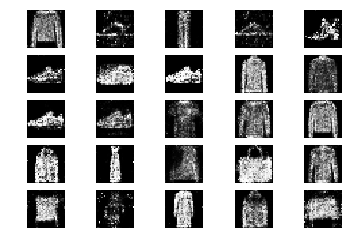

33001 [D loss: 0.602894, acc.: 71.88%] [G loss: 0.947634]
33002 [D loss: 0.727946, acc.: 48.44%] [G loss: 0.952950]
33003 [D loss: 0.622355, acc.: 64.06%] [G loss: 0.953557]
33004 [D loss: 0.639589, acc.: 65.62%] [G loss: 0.908787]
33005 [D loss: 0.694253, acc.: 57.81%] [G loss: 0.961129]
33006 [D loss: 0.596738, acc.: 67.19%] [G loss: 0.988324]
33007 [D loss: 0.703213, acc.: 57.81%] [G loss: 0.959905]
33008 [D loss: 0.696975, acc.: 51.56%] [G loss: 0.993152]
33009 [D loss: 0.631212, acc.: 68.75%] [G loss: 1.031744]
33010 [D loss: 0.606364, acc.: 65.62%] [G loss: 0.949618]
33011 [D loss: 0.776536, acc.: 39.06%] [G loss: 0.884153]
33012 [D loss: 0.681265, acc.: 62.50%] [G loss: 0.909547]
33013 [D loss: 0.651731, acc.: 56.25%] [G loss: 1.008212]
33014 [D loss: 0.540440, acc.: 81.25%] [G loss: 1.063865]
33015 [D loss: 0.611243, acc.: 70.31%] [G loss: 0.944415]
33016 [D loss: 0.612980, acc.: 64.06%] [G loss: 0.934717]
33017 [D loss: 0.581640, acc.: 73.44%] [G loss: 1.063849]
33018 [D loss:

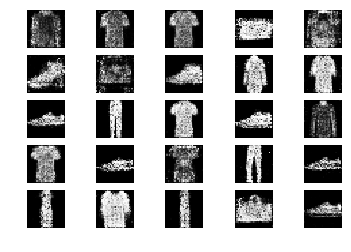

33201 [D loss: 0.624699, acc.: 67.19%] [G loss: 0.964088]
33202 [D loss: 0.622523, acc.: 67.19%] [G loss: 1.080715]
33203 [D loss: 0.619863, acc.: 64.06%] [G loss: 0.986007]
33204 [D loss: 0.612899, acc.: 65.62%] [G loss: 1.106949]
33205 [D loss: 0.640249, acc.: 56.25%] [G loss: 0.932648]
33206 [D loss: 0.606625, acc.: 64.06%] [G loss: 0.936610]
33207 [D loss: 0.593597, acc.: 68.75%] [G loss: 0.953617]
33208 [D loss: 0.723049, acc.: 50.00%] [G loss: 0.905560]
33209 [D loss: 0.628954, acc.: 62.50%] [G loss: 1.002317]
33210 [D loss: 0.586016, acc.: 70.31%] [G loss: 1.013513]
33211 [D loss: 0.686888, acc.: 57.81%] [G loss: 1.022969]
33212 [D loss: 0.638861, acc.: 67.19%] [G loss: 0.955847]
33213 [D loss: 0.600008, acc.: 70.31%] [G loss: 1.001670]
33214 [D loss: 0.716851, acc.: 56.25%] [G loss: 0.916126]
33215 [D loss: 0.609480, acc.: 68.75%] [G loss: 1.043279]
33216 [D loss: 0.598774, acc.: 65.62%] [G loss: 0.896703]
33217 [D loss: 0.609645, acc.: 65.62%] [G loss: 0.990121]
33218 [D loss:

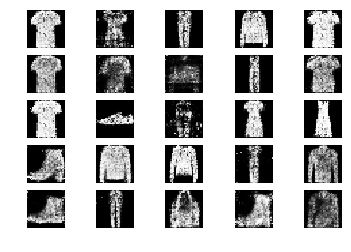

33401 [D loss: 0.584198, acc.: 67.19%] [G loss: 0.881807]
33402 [D loss: 0.607403, acc.: 65.62%] [G loss: 0.986735]
33403 [D loss: 0.631124, acc.: 60.94%] [G loss: 1.057621]
33404 [D loss: 0.621453, acc.: 70.31%] [G loss: 0.904624]
33405 [D loss: 0.654079, acc.: 64.06%] [G loss: 0.975920]
33406 [D loss: 0.599167, acc.: 65.62%] [G loss: 0.893907]
33407 [D loss: 0.685418, acc.: 60.94%] [G loss: 0.945527]
33408 [D loss: 0.649245, acc.: 64.06%] [G loss: 1.024529]
33409 [D loss: 0.582769, acc.: 70.31%] [G loss: 1.006307]
33410 [D loss: 0.655361, acc.: 60.94%] [G loss: 0.913832]
33411 [D loss: 0.549365, acc.: 76.56%] [G loss: 1.095237]
33412 [D loss: 0.589523, acc.: 65.62%] [G loss: 1.006795]
33413 [D loss: 0.614427, acc.: 64.06%] [G loss: 1.027006]
33414 [D loss: 0.560475, acc.: 73.44%] [G loss: 1.126318]
33415 [D loss: 0.562006, acc.: 67.19%] [G loss: 1.041427]
33416 [D loss: 0.690709, acc.: 54.69%] [G loss: 1.098229]
33417 [D loss: 0.676192, acc.: 57.81%] [G loss: 1.095596]
33418 [D loss:

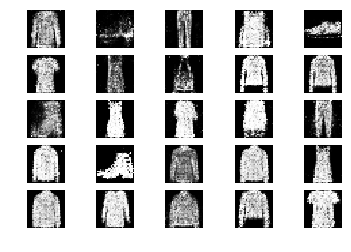

33601 [D loss: 0.653506, acc.: 62.50%] [G loss: 0.900091]
33602 [D loss: 0.579057, acc.: 73.44%] [G loss: 0.969780]
33603 [D loss: 0.625334, acc.: 76.56%] [G loss: 0.946653]
33604 [D loss: 0.610856, acc.: 64.06%] [G loss: 1.017912]
33605 [D loss: 0.627291, acc.: 68.75%] [G loss: 1.032208]
33606 [D loss: 0.697987, acc.: 57.81%] [G loss: 0.940007]
33607 [D loss: 0.649713, acc.: 62.50%] [G loss: 1.007704]
33608 [D loss: 0.652743, acc.: 57.81%] [G loss: 1.032016]
33609 [D loss: 0.649298, acc.: 57.81%] [G loss: 0.858529]
33610 [D loss: 0.599348, acc.: 65.62%] [G loss: 1.094851]
33611 [D loss: 0.714046, acc.: 57.81%] [G loss: 1.026752]
33612 [D loss: 0.650804, acc.: 62.50%] [G loss: 1.126475]
33613 [D loss: 0.629217, acc.: 65.62%] [G loss: 1.080178]
33614 [D loss: 0.591574, acc.: 71.88%] [G loss: 1.000725]
33615 [D loss: 0.640272, acc.: 64.06%] [G loss: 1.068513]
33616 [D loss: 0.642336, acc.: 62.50%] [G loss: 1.061082]
33617 [D loss: 0.662954, acc.: 57.81%] [G loss: 1.077694]
33618 [D loss:

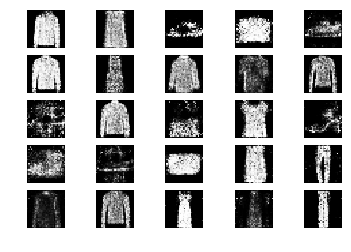

33801 [D loss: 0.668671, acc.: 60.94%] [G loss: 0.941732]
33802 [D loss: 0.653237, acc.: 67.19%] [G loss: 0.972217]
33803 [D loss: 0.648214, acc.: 59.38%] [G loss: 0.907191]
33804 [D loss: 0.600840, acc.: 70.31%] [G loss: 0.963637]
33805 [D loss: 0.578107, acc.: 68.75%] [G loss: 0.989920]
33806 [D loss: 0.662496, acc.: 57.81%] [G loss: 1.066050]
33807 [D loss: 0.652997, acc.: 62.50%] [G loss: 1.013273]
33808 [D loss: 0.606793, acc.: 60.94%] [G loss: 0.990074]
33809 [D loss: 0.607161, acc.: 68.75%] [G loss: 1.000992]
33810 [D loss: 0.697556, acc.: 56.25%] [G loss: 1.073012]
33811 [D loss: 0.589620, acc.: 76.56%] [G loss: 1.208071]
33812 [D loss: 0.696567, acc.: 60.94%] [G loss: 1.051827]
33813 [D loss: 0.707696, acc.: 56.25%] [G loss: 0.894488]
33814 [D loss: 0.667267, acc.: 56.25%] [G loss: 1.006493]
33815 [D loss: 0.664835, acc.: 65.62%] [G loss: 0.977512]
33816 [D loss: 0.586798, acc.: 71.88%] [G loss: 0.946733]
33817 [D loss: 0.678024, acc.: 57.81%] [G loss: 0.969735]
33818 [D loss:

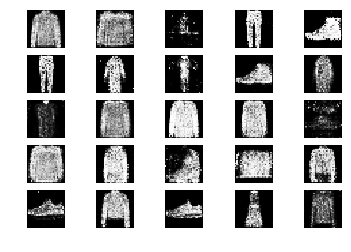

34001 [D loss: 0.615233, acc.: 68.75%] [G loss: 0.979355]
34002 [D loss: 0.644668, acc.: 67.19%] [G loss: 0.966143]
34003 [D loss: 0.618926, acc.: 70.31%] [G loss: 0.939743]
34004 [D loss: 0.702508, acc.: 57.81%] [G loss: 0.964904]
34005 [D loss: 0.631363, acc.: 65.62%] [G loss: 0.996923]
34006 [D loss: 0.574848, acc.: 64.06%] [G loss: 0.944601]
34007 [D loss: 0.585400, acc.: 70.31%] [G loss: 1.025421]
34008 [D loss: 0.667185, acc.: 64.06%] [G loss: 0.963136]
34009 [D loss: 0.602069, acc.: 64.06%] [G loss: 1.203548]
34010 [D loss: 0.607158, acc.: 62.50%] [G loss: 1.010416]
34011 [D loss: 0.652999, acc.: 67.19%] [G loss: 1.050669]
34012 [D loss: 0.627957, acc.: 62.50%] [G loss: 1.052800]
34013 [D loss: 0.575101, acc.: 64.06%] [G loss: 1.007532]
34014 [D loss: 0.671386, acc.: 64.06%] [G loss: 1.017515]
34015 [D loss: 0.617485, acc.: 67.19%] [G loss: 0.990566]
34016 [D loss: 0.589878, acc.: 62.50%] [G loss: 0.968117]
34017 [D loss: 0.611918, acc.: 64.06%] [G loss: 1.054420]
34018 [D loss:

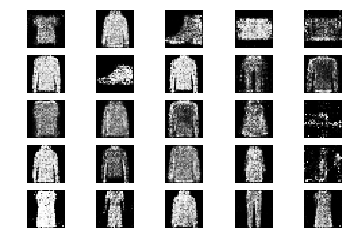

34201 [D loss: 0.642021, acc.: 62.50%] [G loss: 1.049585]
34202 [D loss: 0.641560, acc.: 64.06%] [G loss: 1.058850]
34203 [D loss: 0.677718, acc.: 60.94%] [G loss: 1.025790]
34204 [D loss: 0.657077, acc.: 56.25%] [G loss: 0.962164]
34205 [D loss: 0.593225, acc.: 70.31%] [G loss: 1.066371]
34206 [D loss: 0.628192, acc.: 60.94%] [G loss: 0.955297]
34207 [D loss: 0.621885, acc.: 67.19%] [G loss: 0.991443]
34208 [D loss: 0.645634, acc.: 56.25%] [G loss: 0.947611]
34209 [D loss: 0.626738, acc.: 71.88%] [G loss: 0.967437]
34210 [D loss: 0.613718, acc.: 67.19%] [G loss: 0.944483]
34211 [D loss: 0.773439, acc.: 42.19%] [G loss: 0.966198]
34212 [D loss: 0.573922, acc.: 71.88%] [G loss: 0.992518]
34213 [D loss: 0.578099, acc.: 67.19%] [G loss: 1.087666]
34214 [D loss: 0.689268, acc.: 56.25%] [G loss: 0.942118]
34215 [D loss: 0.632349, acc.: 59.38%] [G loss: 1.016729]
34216 [D loss: 0.632620, acc.: 65.62%] [G loss: 0.995865]
34217 [D loss: 0.632608, acc.: 67.19%] [G loss: 1.059501]
34218 [D loss:

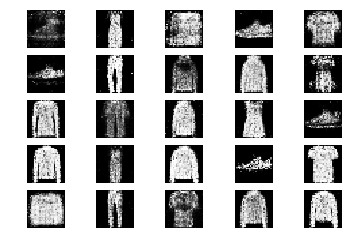

34401 [D loss: 0.711766, acc.: 53.12%] [G loss: 1.021730]
34402 [D loss: 0.648706, acc.: 56.25%] [G loss: 1.079677]
34403 [D loss: 0.684323, acc.: 59.38%] [G loss: 1.072199]
34404 [D loss: 0.634750, acc.: 59.38%] [G loss: 0.975446]
34405 [D loss: 0.667600, acc.: 57.81%] [G loss: 0.925012]
34406 [D loss: 0.628077, acc.: 60.94%] [G loss: 0.946657]
34407 [D loss: 0.633029, acc.: 54.69%] [G loss: 0.982141]
34408 [D loss: 0.651327, acc.: 60.94%] [G loss: 0.931176]
34409 [D loss: 0.638292, acc.: 64.06%] [G loss: 0.951838]
34410 [D loss: 0.664067, acc.: 56.25%] [G loss: 0.946757]
34411 [D loss: 0.702837, acc.: 56.25%] [G loss: 0.920552]
34412 [D loss: 0.559610, acc.: 67.19%] [G loss: 0.985938]
34413 [D loss: 0.602682, acc.: 65.62%] [G loss: 1.032728]
34414 [D loss: 0.640831, acc.: 59.38%] [G loss: 0.871735]
34415 [D loss: 0.675632, acc.: 54.69%] [G loss: 1.019384]
34416 [D loss: 0.626520, acc.: 65.62%] [G loss: 1.110511]
34417 [D loss: 0.632296, acc.: 60.94%] [G loss: 0.995858]
34418 [D loss:

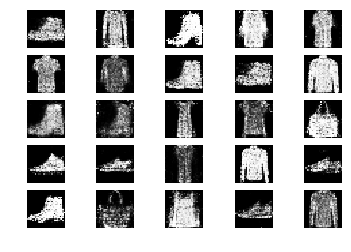

34601 [D loss: 0.579709, acc.: 73.44%] [G loss: 0.901272]
34602 [D loss: 0.542026, acc.: 71.88%] [G loss: 0.973775]
34603 [D loss: 0.620726, acc.: 65.62%] [G loss: 0.927092]
34604 [D loss: 0.642862, acc.: 64.06%] [G loss: 0.924301]
34605 [D loss: 0.653628, acc.: 60.94%] [G loss: 0.917794]
34606 [D loss: 0.677051, acc.: 57.81%] [G loss: 0.870856]
34607 [D loss: 0.695313, acc.: 51.56%] [G loss: 0.835912]
34608 [D loss: 0.706925, acc.: 57.81%] [G loss: 1.062065]
34609 [D loss: 0.668548, acc.: 57.81%] [G loss: 1.031060]
34610 [D loss: 0.634034, acc.: 65.62%] [G loss: 0.959541]
34611 [D loss: 0.576917, acc.: 75.00%] [G loss: 1.012134]
34612 [D loss: 0.670629, acc.: 62.50%] [G loss: 1.034957]
34613 [D loss: 0.710306, acc.: 56.25%] [G loss: 1.014418]
34614 [D loss: 0.643544, acc.: 62.50%] [G loss: 0.978199]
34615 [D loss: 0.566152, acc.: 78.12%] [G loss: 0.924696]
34616 [D loss: 0.694703, acc.: 59.38%] [G loss: 0.911769]
34617 [D loss: 0.681791, acc.: 59.38%] [G loss: 0.936855]
34618 [D loss:

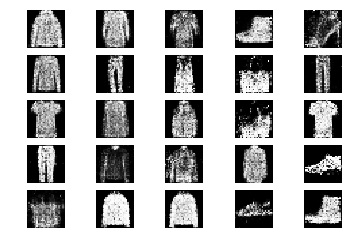

34801 [D loss: 0.617638, acc.: 68.75%] [G loss: 0.945697]
34802 [D loss: 0.662473, acc.: 59.38%] [G loss: 0.902399]
34803 [D loss: 0.710179, acc.: 56.25%] [G loss: 1.070543]
34804 [D loss: 0.631191, acc.: 64.06%] [G loss: 0.944640]
34805 [D loss: 0.676518, acc.: 64.06%] [G loss: 1.036666]
34806 [D loss: 0.627468, acc.: 59.38%] [G loss: 1.036569]
34807 [D loss: 0.665819, acc.: 59.38%] [G loss: 1.055876]
34808 [D loss: 0.600419, acc.: 70.31%] [G loss: 1.044408]
34809 [D loss: 0.611031, acc.: 60.94%] [G loss: 0.952858]
34810 [D loss: 0.571213, acc.: 76.56%] [G loss: 0.883776]
34811 [D loss: 0.681173, acc.: 53.12%] [G loss: 1.018012]
34812 [D loss: 0.662749, acc.: 59.38%] [G loss: 0.878900]
34813 [D loss: 0.604809, acc.: 64.06%] [G loss: 0.879926]
34814 [D loss: 0.651090, acc.: 56.25%] [G loss: 1.055928]
34815 [D loss: 0.655315, acc.: 59.38%] [G loss: 0.984614]
34816 [D loss: 0.575867, acc.: 68.75%] [G loss: 1.054873]
34817 [D loss: 0.667165, acc.: 56.25%] [G loss: 1.078397]
34818 [D loss:

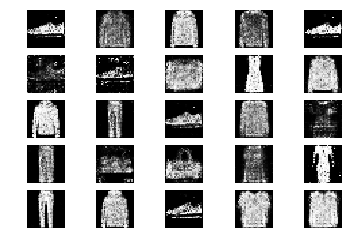

35001 [D loss: 0.627119, acc.: 67.19%] [G loss: 0.948354]
35002 [D loss: 0.617242, acc.: 60.94%] [G loss: 1.028072]
35003 [D loss: 0.580750, acc.: 65.62%] [G loss: 0.943767]
35004 [D loss: 0.613593, acc.: 71.88%] [G loss: 1.037833]
35005 [D loss: 0.622104, acc.: 71.88%] [G loss: 1.017308]
35006 [D loss: 0.687015, acc.: 62.50%] [G loss: 0.972589]
35007 [D loss: 0.654822, acc.: 62.50%] [G loss: 0.886291]
35008 [D loss: 0.644643, acc.: 65.62%] [G loss: 0.988573]
35009 [D loss: 0.636890, acc.: 70.31%] [G loss: 1.047998]
35010 [D loss: 0.645184, acc.: 60.94%] [G loss: 1.017305]
35011 [D loss: 0.644111, acc.: 64.06%] [G loss: 0.959232]
35012 [D loss: 0.590581, acc.: 68.75%] [G loss: 1.043775]
35013 [D loss: 0.615241, acc.: 62.50%] [G loss: 1.092407]
35014 [D loss: 0.577921, acc.: 73.44%] [G loss: 1.025650]
35015 [D loss: 0.602499, acc.: 65.62%] [G loss: 0.926845]
35016 [D loss: 0.619529, acc.: 71.88%] [G loss: 0.993325]
35017 [D loss: 0.601841, acc.: 68.75%] [G loss: 1.040160]
35018 [D loss:

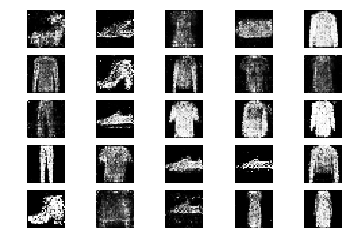

35201 [D loss: 0.621631, acc.: 64.06%] [G loss: 0.997705]
35202 [D loss: 0.607083, acc.: 68.75%] [G loss: 0.968483]
35203 [D loss: 0.630801, acc.: 64.06%] [G loss: 0.996084]
35204 [D loss: 0.647889, acc.: 65.62%] [G loss: 1.018909]
35205 [D loss: 0.633021, acc.: 62.50%] [G loss: 1.016373]
35206 [D loss: 0.636019, acc.: 64.06%] [G loss: 0.993231]
35207 [D loss: 0.661416, acc.: 60.94%] [G loss: 1.059170]
35208 [D loss: 0.614682, acc.: 65.62%] [G loss: 1.015925]
35209 [D loss: 0.602734, acc.: 65.62%] [G loss: 0.946378]
35210 [D loss: 0.598502, acc.: 65.62%] [G loss: 0.973752]
35211 [D loss: 0.508010, acc.: 84.38%] [G loss: 0.990385]
35212 [D loss: 0.723223, acc.: 50.00%] [G loss: 0.864350]
35213 [D loss: 0.633801, acc.: 57.81%] [G loss: 0.963090]
35214 [D loss: 0.649801, acc.: 57.81%] [G loss: 0.939804]
35215 [D loss: 0.646018, acc.: 54.69%] [G loss: 1.037644]
35216 [D loss: 0.634970, acc.: 64.06%] [G loss: 0.945685]
35217 [D loss: 0.684572, acc.: 62.50%] [G loss: 0.972726]
35218 [D loss:

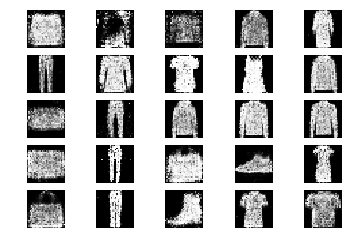

35401 [D loss: 0.600039, acc.: 73.44%] [G loss: 0.953865]
35402 [D loss: 0.584379, acc.: 64.06%] [G loss: 0.998805]
35403 [D loss: 0.617782, acc.: 59.38%] [G loss: 0.964536]
35404 [D loss: 0.674715, acc.: 64.06%] [G loss: 0.829698]
35405 [D loss: 0.613254, acc.: 68.75%] [G loss: 1.011983]
35406 [D loss: 0.656634, acc.: 67.19%] [G loss: 0.864588]
35407 [D loss: 0.588853, acc.: 67.19%] [G loss: 0.897050]
35408 [D loss: 0.662677, acc.: 57.81%] [G loss: 0.969158]
35409 [D loss: 0.699318, acc.: 57.81%] [G loss: 1.098870]
35410 [D loss: 0.603985, acc.: 68.75%] [G loss: 1.071584]
35411 [D loss: 0.557998, acc.: 71.88%] [G loss: 1.097820]
35412 [D loss: 0.634744, acc.: 59.38%] [G loss: 1.091718]
35413 [D loss: 0.681939, acc.: 56.25%] [G loss: 1.055901]
35414 [D loss: 0.717570, acc.: 57.81%] [G loss: 1.009401]
35415 [D loss: 0.573150, acc.: 68.75%] [G loss: 1.108006]
35416 [D loss: 0.603830, acc.: 65.62%] [G loss: 0.922885]
35417 [D loss: 0.654970, acc.: 60.94%] [G loss: 1.023972]
35418 [D loss:

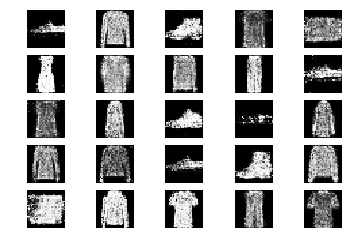

35601 [D loss: 0.631844, acc.: 64.06%] [G loss: 0.806442]
35602 [D loss: 0.615237, acc.: 60.94%] [G loss: 0.890917]
35603 [D loss: 0.721090, acc.: 53.12%] [G loss: 0.892281]
35604 [D loss: 0.638067, acc.: 57.81%] [G loss: 0.936393]
35605 [D loss: 0.635353, acc.: 64.06%] [G loss: 0.987247]
35606 [D loss: 0.618107, acc.: 60.94%] [G loss: 0.960534]
35607 [D loss: 0.571357, acc.: 76.56%] [G loss: 0.868148]
35608 [D loss: 0.633619, acc.: 65.62%] [G loss: 0.961281]
35609 [D loss: 0.646913, acc.: 64.06%] [G loss: 1.049380]
35610 [D loss: 0.690138, acc.: 53.12%] [G loss: 0.955887]
35611 [D loss: 0.609521, acc.: 60.94%] [G loss: 0.947391]
35612 [D loss: 0.561407, acc.: 71.88%] [G loss: 1.017822]
35613 [D loss: 0.610164, acc.: 71.88%] [G loss: 1.012962]
35614 [D loss: 0.777479, acc.: 56.25%] [G loss: 1.037513]
35615 [D loss: 0.719254, acc.: 56.25%] [G loss: 0.958298]
35616 [D loss: 0.589932, acc.: 68.75%] [G loss: 0.935948]
35617 [D loss: 0.671320, acc.: 62.50%] [G loss: 1.008447]
35618 [D loss:

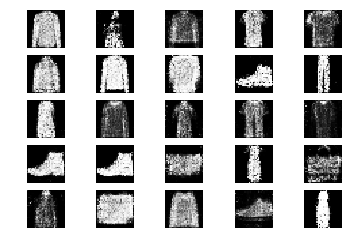

35801 [D loss: 0.637893, acc.: 65.62%] [G loss: 0.970422]
35802 [D loss: 0.605218, acc.: 67.19%] [G loss: 0.923106]
35803 [D loss: 0.639091, acc.: 59.38%] [G loss: 1.007572]
35804 [D loss: 0.663443, acc.: 57.81%] [G loss: 0.968689]
35805 [D loss: 0.610235, acc.: 62.50%] [G loss: 1.016086]
35806 [D loss: 0.670108, acc.: 64.06%] [G loss: 0.891674]
35807 [D loss: 0.630648, acc.: 67.19%] [G loss: 0.866617]
35808 [D loss: 0.620621, acc.: 65.62%] [G loss: 0.923401]
35809 [D loss: 0.595407, acc.: 65.62%] [G loss: 0.987282]
35810 [D loss: 0.650732, acc.: 60.94%] [G loss: 1.067332]
35811 [D loss: 0.575926, acc.: 64.06%] [G loss: 1.044314]
35812 [D loss: 0.561959, acc.: 68.75%] [G loss: 1.058397]
35813 [D loss: 0.629678, acc.: 70.31%] [G loss: 0.969998]
35814 [D loss: 0.680070, acc.: 60.94%] [G loss: 0.966330]
35815 [D loss: 0.701875, acc.: 57.81%] [G loss: 0.972714]
35816 [D loss: 0.758283, acc.: 46.88%] [G loss: 0.994584]
35817 [D loss: 0.614447, acc.: 57.81%] [G loss: 0.991020]
35818 [D loss:

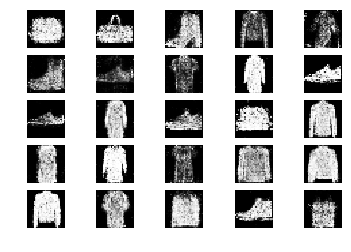

36001 [D loss: 0.566242, acc.: 65.62%] [G loss: 0.996462]
36002 [D loss: 0.712826, acc.: 51.56%] [G loss: 0.949804]
36003 [D loss: 0.590755, acc.: 67.19%] [G loss: 1.056903]
36004 [D loss: 0.571523, acc.: 76.56%] [G loss: 1.010935]
36005 [D loss: 0.605290, acc.: 65.62%] [G loss: 0.998715]
36006 [D loss: 0.707461, acc.: 53.12%] [G loss: 0.965657]
36007 [D loss: 0.596070, acc.: 67.19%] [G loss: 0.932031]
36008 [D loss: 0.650747, acc.: 59.38%] [G loss: 1.079704]
36009 [D loss: 0.688141, acc.: 56.25%] [G loss: 0.991058]
36010 [D loss: 0.544423, acc.: 76.56%] [G loss: 0.967144]
36011 [D loss: 0.616820, acc.: 64.06%] [G loss: 0.997764]
36012 [D loss: 0.594107, acc.: 73.44%] [G loss: 0.946549]
36013 [D loss: 0.677952, acc.: 59.38%] [G loss: 0.873508]
36014 [D loss: 0.612308, acc.: 70.31%] [G loss: 0.954068]
36015 [D loss: 0.605479, acc.: 65.62%] [G loss: 1.016299]
36016 [D loss: 0.637018, acc.: 56.25%] [G loss: 1.057350]
36017 [D loss: 0.594480, acc.: 67.19%] [G loss: 0.894351]
36018 [D loss:

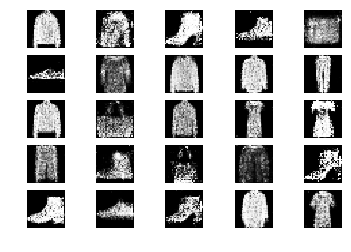

36201 [D loss: 0.637012, acc.: 64.06%] [G loss: 0.899238]
36202 [D loss: 0.587932, acc.: 75.00%] [G loss: 0.900866]
36203 [D loss: 0.648958, acc.: 67.19%] [G loss: 0.926262]
36204 [D loss: 0.666244, acc.: 65.62%] [G loss: 0.944727]
36205 [D loss: 0.624461, acc.: 64.06%] [G loss: 0.959902]
36206 [D loss: 0.640596, acc.: 64.06%] [G loss: 0.942034]
36207 [D loss: 0.649192, acc.: 65.62%] [G loss: 1.056458]
36208 [D loss: 0.648152, acc.: 67.19%] [G loss: 0.975521]
36209 [D loss: 0.654912, acc.: 60.94%] [G loss: 1.080572]
36210 [D loss: 0.615526, acc.: 68.75%] [G loss: 1.009142]
36211 [D loss: 0.680087, acc.: 62.50%] [G loss: 1.025984]
36212 [D loss: 0.659713, acc.: 64.06%] [G loss: 0.950472]
36213 [D loss: 0.649047, acc.: 50.00%] [G loss: 0.978670]
36214 [D loss: 0.640971, acc.: 59.38%] [G loss: 0.974969]
36215 [D loss: 0.658869, acc.: 51.56%] [G loss: 0.888809]
36216 [D loss: 0.706469, acc.: 48.44%] [G loss: 0.882092]
36217 [D loss: 0.582450, acc.: 76.56%] [G loss: 0.926132]
36218 [D loss:

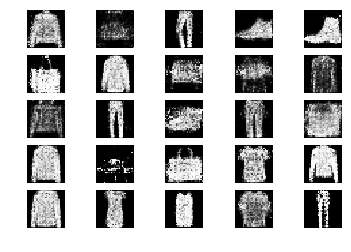

36401 [D loss: 0.685099, acc.: 56.25%] [G loss: 1.011432]
36402 [D loss: 0.623865, acc.: 65.62%] [G loss: 0.953816]
36403 [D loss: 0.654129, acc.: 64.06%] [G loss: 1.047846]
36404 [D loss: 0.641219, acc.: 57.81%] [G loss: 1.016882]
36405 [D loss: 0.626135, acc.: 68.75%] [G loss: 1.017979]
36406 [D loss: 0.646025, acc.: 65.62%] [G loss: 0.966270]
36407 [D loss: 0.652903, acc.: 62.50%] [G loss: 0.954400]
36408 [D loss: 0.600559, acc.: 68.75%] [G loss: 1.029402]
36409 [D loss: 0.620776, acc.: 70.31%] [G loss: 1.055255]
36410 [D loss: 0.583572, acc.: 64.06%] [G loss: 0.987136]
36411 [D loss: 0.605488, acc.: 64.06%] [G loss: 1.026543]
36412 [D loss: 0.619955, acc.: 71.88%] [G loss: 1.030282]
36413 [D loss: 0.601343, acc.: 70.31%] [G loss: 1.005171]
36414 [D loss: 0.691855, acc.: 57.81%] [G loss: 1.050891]
36415 [D loss: 0.602709, acc.: 67.19%] [G loss: 0.917853]
36416 [D loss: 0.687524, acc.: 56.25%] [G loss: 1.005152]
36417 [D loss: 0.677758, acc.: 54.69%] [G loss: 0.969164]
36418 [D loss:

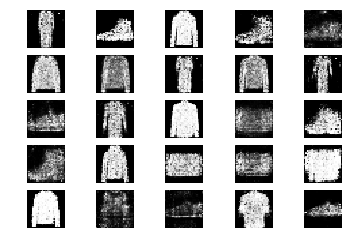

36601 [D loss: 0.701110, acc.: 53.12%] [G loss: 0.940472]
36602 [D loss: 0.635058, acc.: 68.75%] [G loss: 0.854488]
36603 [D loss: 0.634297, acc.: 62.50%] [G loss: 0.899858]
36604 [D loss: 0.717613, acc.: 56.25%] [G loss: 0.961463]
36605 [D loss: 0.607250, acc.: 64.06%] [G loss: 0.957330]
36606 [D loss: 0.612852, acc.: 67.19%] [G loss: 1.006988]
36607 [D loss: 0.624066, acc.: 65.62%] [G loss: 0.932404]
36608 [D loss: 0.599670, acc.: 67.19%] [G loss: 1.036805]
36609 [D loss: 0.678227, acc.: 59.38%] [G loss: 1.050226]
36610 [D loss: 0.585255, acc.: 67.19%] [G loss: 0.989076]
36611 [D loss: 0.550664, acc.: 70.31%] [G loss: 0.995898]
36612 [D loss: 0.610465, acc.: 67.19%] [G loss: 1.028734]
36613 [D loss: 0.627844, acc.: 64.06%] [G loss: 1.016810]
36614 [D loss: 0.646354, acc.: 57.81%] [G loss: 0.953307]
36615 [D loss: 0.700898, acc.: 57.81%] [G loss: 0.977195]
36616 [D loss: 0.686029, acc.: 53.12%] [G loss: 1.097918]
36617 [D loss: 0.653874, acc.: 59.38%] [G loss: 1.055785]
36618 [D loss:

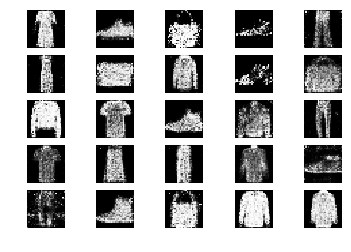

36801 [D loss: 0.619714, acc.: 68.75%] [G loss: 1.000453]
36802 [D loss: 0.619525, acc.: 59.38%] [G loss: 0.911529]
36803 [D loss: 0.769309, acc.: 48.44%] [G loss: 0.909734]
36804 [D loss: 0.644580, acc.: 60.94%] [G loss: 0.951109]
36805 [D loss: 0.649919, acc.: 60.94%] [G loss: 0.980739]
36806 [D loss: 0.651820, acc.: 62.50%] [G loss: 0.974413]
36807 [D loss: 0.611460, acc.: 71.88%] [G loss: 0.954380]
36808 [D loss: 0.558693, acc.: 65.62%] [G loss: 1.018107]
36809 [D loss: 0.622481, acc.: 65.62%] [G loss: 0.950506]
36810 [D loss: 0.686367, acc.: 51.56%] [G loss: 0.951155]
36811 [D loss: 0.609576, acc.: 68.75%] [G loss: 0.955607]
36812 [D loss: 0.620244, acc.: 70.31%] [G loss: 0.991681]
36813 [D loss: 0.606764, acc.: 64.06%] [G loss: 0.882639]
36814 [D loss: 0.668325, acc.: 59.38%] [G loss: 0.910750]
36815 [D loss: 0.553824, acc.: 79.69%] [G loss: 0.904305]
36816 [D loss: 0.594081, acc.: 65.62%] [G loss: 1.088517]
36817 [D loss: 0.683207, acc.: 57.81%] [G loss: 0.970661]
36818 [D loss:

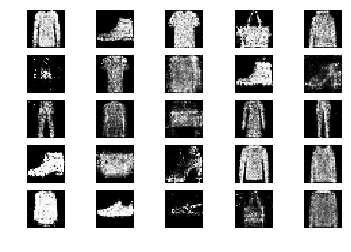

37001 [D loss: 0.557489, acc.: 73.44%] [G loss: 1.024708]
37002 [D loss: 0.669223, acc.: 64.06%] [G loss: 1.078457]
37003 [D loss: 0.660302, acc.: 65.62%] [G loss: 0.968712]
37004 [D loss: 0.576112, acc.: 71.88%] [G loss: 0.992922]
37005 [D loss: 0.648524, acc.: 59.38%] [G loss: 0.957678]
37006 [D loss: 0.679960, acc.: 59.38%] [G loss: 0.928640]
37007 [D loss: 0.641111, acc.: 57.81%] [G loss: 0.948464]
37008 [D loss: 0.610945, acc.: 73.44%] [G loss: 1.030665]
37009 [D loss: 0.696310, acc.: 54.69%] [G loss: 0.920626]
37010 [D loss: 0.677393, acc.: 60.94%] [G loss: 0.987345]
37011 [D loss: 0.644005, acc.: 64.06%] [G loss: 1.070041]
37012 [D loss: 0.671402, acc.: 57.81%] [G loss: 0.976563]
37013 [D loss: 0.634080, acc.: 54.69%] [G loss: 1.039827]
37014 [D loss: 0.629371, acc.: 56.25%] [G loss: 1.035642]
37015 [D loss: 0.698318, acc.: 54.69%] [G loss: 1.043225]
37016 [D loss: 0.678200, acc.: 59.38%] [G loss: 1.149593]
37017 [D loss: 0.581136, acc.: 73.44%] [G loss: 0.942301]
37018 [D loss:

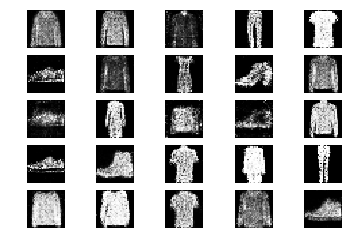

37201 [D loss: 0.659628, acc.: 64.06%] [G loss: 0.908959]
37202 [D loss: 0.575717, acc.: 71.88%] [G loss: 0.961968]
37203 [D loss: 0.677478, acc.: 59.38%] [G loss: 0.892632]
37204 [D loss: 0.607139, acc.: 67.19%] [G loss: 0.812213]
37205 [D loss: 0.645941, acc.: 56.25%] [G loss: 0.894365]
37206 [D loss: 0.574582, acc.: 68.75%] [G loss: 1.051607]
37207 [D loss: 0.721489, acc.: 51.56%] [G loss: 1.025477]
37208 [D loss: 0.630001, acc.: 59.38%] [G loss: 0.901821]
37209 [D loss: 0.632314, acc.: 60.94%] [G loss: 0.969413]
37210 [D loss: 0.590698, acc.: 65.62%] [G loss: 0.911339]
37211 [D loss: 0.614907, acc.: 64.06%] [G loss: 1.015680]
37212 [D loss: 0.734488, acc.: 53.12%] [G loss: 0.933712]
37213 [D loss: 0.699272, acc.: 50.00%] [G loss: 1.033200]
37214 [D loss: 0.661270, acc.: 53.12%] [G loss: 1.026752]
37215 [D loss: 0.742604, acc.: 46.88%] [G loss: 1.077950]
37216 [D loss: 0.569180, acc.: 67.19%] [G loss: 1.132491]
37217 [D loss: 0.584113, acc.: 65.62%] [G loss: 0.986605]
37218 [D loss:

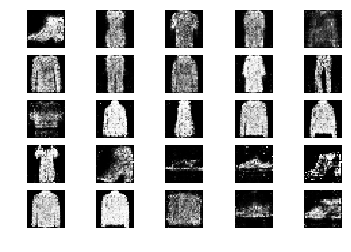

37401 [D loss: 0.615775, acc.: 60.94%] [G loss: 0.962853]
37402 [D loss: 0.668418, acc.: 57.81%] [G loss: 1.051447]
37403 [D loss: 0.650426, acc.: 64.06%] [G loss: 0.944861]
37404 [D loss: 0.552198, acc.: 68.75%] [G loss: 0.915153]
37405 [D loss: 0.627013, acc.: 65.62%] [G loss: 1.121994]
37406 [D loss: 0.634808, acc.: 60.94%] [G loss: 1.028142]
37407 [D loss: 0.613893, acc.: 67.19%] [G loss: 1.098525]
37408 [D loss: 0.651480, acc.: 64.06%] [G loss: 0.993137]
37409 [D loss: 0.514719, acc.: 79.69%] [G loss: 0.967039]
37410 [D loss: 0.667179, acc.: 54.69%] [G loss: 1.095533]
37411 [D loss: 0.614408, acc.: 68.75%] [G loss: 1.096406]
37412 [D loss: 0.638958, acc.: 59.38%] [G loss: 1.105874]
37413 [D loss: 0.595996, acc.: 62.50%] [G loss: 1.065660]
37414 [D loss: 0.661226, acc.: 60.94%] [G loss: 1.056754]
37415 [D loss: 0.673162, acc.: 56.25%] [G loss: 0.934185]
37416 [D loss: 0.625572, acc.: 67.19%] [G loss: 0.957343]
37417 [D loss: 0.624932, acc.: 60.94%] [G loss: 0.997599]
37418 [D loss:

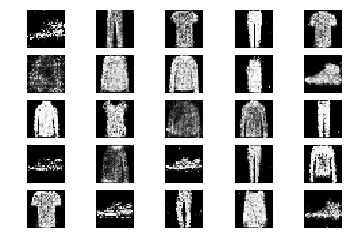

37601 [D loss: 0.590874, acc.: 67.19%] [G loss: 1.000391]
37602 [D loss: 0.663088, acc.: 53.12%] [G loss: 1.010346]
37603 [D loss: 0.697546, acc.: 56.25%] [G loss: 1.073176]
37604 [D loss: 0.644360, acc.: 67.19%] [G loss: 0.989371]
37605 [D loss: 0.586378, acc.: 68.75%] [G loss: 1.020972]
37606 [D loss: 0.585734, acc.: 65.62%] [G loss: 1.032355]
37607 [D loss: 0.678479, acc.: 57.81%] [G loss: 0.963408]
37608 [D loss: 0.645592, acc.: 60.94%] [G loss: 1.013871]
37609 [D loss: 0.548881, acc.: 73.44%] [G loss: 1.001905]
37610 [D loss: 0.683300, acc.: 56.25%] [G loss: 1.018019]
37611 [D loss: 0.613958, acc.: 62.50%] [G loss: 1.199053]
37612 [D loss: 0.704485, acc.: 62.50%] [G loss: 1.007934]
37613 [D loss: 0.719022, acc.: 57.81%] [G loss: 1.035584]
37614 [D loss: 0.676263, acc.: 54.69%] [G loss: 0.788152]
37615 [D loss: 0.761400, acc.: 42.19%] [G loss: 1.035733]
37616 [D loss: 0.622204, acc.: 70.31%] [G loss: 0.962764]
37617 [D loss: 0.588538, acc.: 67.19%] [G loss: 0.948875]
37618 [D loss:

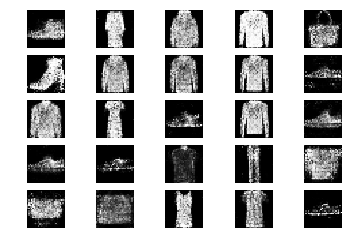

37801 [D loss: 0.647353, acc.: 65.62%] [G loss: 0.914520]
37802 [D loss: 0.658313, acc.: 60.94%] [G loss: 0.966334]
37803 [D loss: 0.598517, acc.: 67.19%] [G loss: 0.994838]
37804 [D loss: 0.588012, acc.: 68.75%] [G loss: 1.170680]
37805 [D loss: 0.678447, acc.: 62.50%] [G loss: 1.118344]
37806 [D loss: 0.651553, acc.: 59.38%] [G loss: 1.113529]
37807 [D loss: 0.542026, acc.: 81.25%] [G loss: 0.992774]
37808 [D loss: 0.609627, acc.: 60.94%] [G loss: 0.974176]
37809 [D loss: 0.640934, acc.: 53.12%] [G loss: 1.009196]
37810 [D loss: 0.617754, acc.: 64.06%] [G loss: 0.923169]
37811 [D loss: 0.625050, acc.: 56.25%] [G loss: 1.012878]
37812 [D loss: 0.624983, acc.: 64.06%] [G loss: 0.985955]
37813 [D loss: 0.629625, acc.: 62.50%] [G loss: 1.028820]
37814 [D loss: 0.689980, acc.: 53.12%] [G loss: 0.953786]
37815 [D loss: 0.639131, acc.: 57.81%] [G loss: 0.921385]
37816 [D loss: 0.542559, acc.: 73.44%] [G loss: 1.070706]
37817 [D loss: 0.743633, acc.: 57.81%] [G loss: 1.046852]
37818 [D loss:

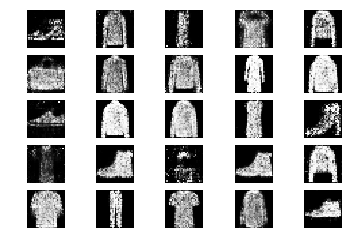

38001 [D loss: 0.667227, acc.: 62.50%] [G loss: 0.964135]
38002 [D loss: 0.606253, acc.: 75.00%] [G loss: 1.113890]
38003 [D loss: 0.594134, acc.: 67.19%] [G loss: 1.054634]
38004 [D loss: 0.596842, acc.: 67.19%] [G loss: 0.920431]
38005 [D loss: 0.699575, acc.: 56.25%] [G loss: 0.896463]
38006 [D loss: 0.598233, acc.: 75.00%] [G loss: 0.975678]
38007 [D loss: 0.658401, acc.: 54.69%] [G loss: 1.042654]
38008 [D loss: 0.611338, acc.: 67.19%] [G loss: 1.041894]
38009 [D loss: 0.691887, acc.: 59.38%] [G loss: 1.122385]
38010 [D loss: 0.660729, acc.: 60.94%] [G loss: 1.074212]
38011 [D loss: 0.593682, acc.: 70.31%] [G loss: 1.020783]
38012 [D loss: 0.647604, acc.: 64.06%] [G loss: 1.012646]
38013 [D loss: 0.625748, acc.: 62.50%] [G loss: 1.010989]
38014 [D loss: 0.631813, acc.: 62.50%] [G loss: 1.005635]
38015 [D loss: 0.546427, acc.: 73.44%] [G loss: 1.134890]
38016 [D loss: 0.609143, acc.: 65.62%] [G loss: 1.017065]
38017 [D loss: 0.596519, acc.: 73.44%] [G loss: 1.071860]
38018 [D loss:

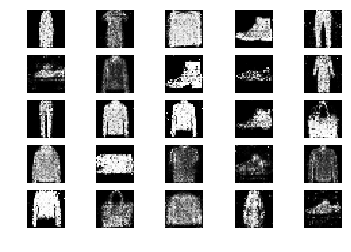

38201 [D loss: 0.659047, acc.: 59.38%] [G loss: 0.966486]
38202 [D loss: 0.599525, acc.: 68.75%] [G loss: 1.015311]
38203 [D loss: 0.684564, acc.: 57.81%] [G loss: 0.940985]
38204 [D loss: 0.596740, acc.: 70.31%] [G loss: 0.989342]
38205 [D loss: 0.686385, acc.: 56.25%] [G loss: 1.065787]
38206 [D loss: 0.599697, acc.: 70.31%] [G loss: 1.106245]
38207 [D loss: 0.590352, acc.: 71.88%] [G loss: 1.002205]
38208 [D loss: 0.600343, acc.: 65.62%] [G loss: 1.021643]
38209 [D loss: 0.663709, acc.: 59.38%] [G loss: 1.101118]
38210 [D loss: 0.667472, acc.: 60.94%] [G loss: 1.019094]
38211 [D loss: 0.652752, acc.: 67.19%] [G loss: 1.107715]
38212 [D loss: 0.661692, acc.: 53.12%] [G loss: 0.885310]
38213 [D loss: 0.636543, acc.: 59.38%] [G loss: 0.998399]
38214 [D loss: 0.575837, acc.: 71.88%] [G loss: 1.061619]
38215 [D loss: 0.641655, acc.: 60.94%] [G loss: 0.975351]
38216 [D loss: 0.692219, acc.: 57.81%] [G loss: 0.901266]
38217 [D loss: 0.688764, acc.: 62.50%] [G loss: 0.884977]
38218 [D loss:

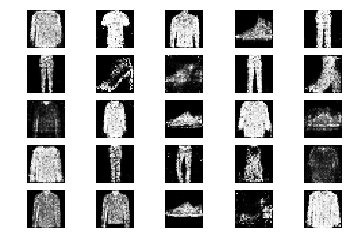

38401 [D loss: 0.616808, acc.: 64.06%] [G loss: 1.119124]
38402 [D loss: 0.642449, acc.: 53.12%] [G loss: 0.964082]
38403 [D loss: 0.584471, acc.: 67.19%] [G loss: 1.080236]
38404 [D loss: 0.616062, acc.: 65.62%] [G loss: 1.201842]
38405 [D loss: 0.656486, acc.: 60.94%] [G loss: 1.074770]
38406 [D loss: 0.589725, acc.: 62.50%] [G loss: 0.950814]
38407 [D loss: 0.670575, acc.: 59.38%] [G loss: 0.962918]
38408 [D loss: 0.719342, acc.: 54.69%] [G loss: 1.037329]
38409 [D loss: 0.712436, acc.: 50.00%] [G loss: 0.959158]
38410 [D loss: 0.668683, acc.: 57.81%] [G loss: 1.047706]
38411 [D loss: 0.628802, acc.: 64.06%] [G loss: 1.031592]
38412 [D loss: 0.592523, acc.: 68.75%] [G loss: 0.978135]
38413 [D loss: 0.615615, acc.: 67.19%] [G loss: 0.959316]
38414 [D loss: 0.602296, acc.: 71.88%] [G loss: 0.937243]
38415 [D loss: 0.571871, acc.: 68.75%] [G loss: 0.970649]
38416 [D loss: 0.592846, acc.: 68.75%] [G loss: 1.043218]
38417 [D loss: 0.642708, acc.: 56.25%] [G loss: 1.107150]
38418 [D loss:

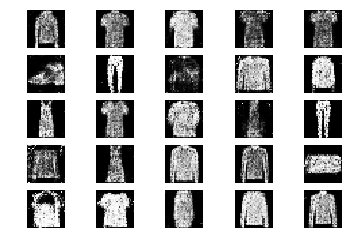

38601 [D loss: 0.693124, acc.: 53.12%] [G loss: 0.901874]
38602 [D loss: 0.648718, acc.: 59.38%] [G loss: 1.106344]
38603 [D loss: 0.614023, acc.: 70.31%] [G loss: 0.962379]
38604 [D loss: 0.608672, acc.: 68.75%] [G loss: 0.930424]
38605 [D loss: 0.678112, acc.: 60.94%] [G loss: 0.930499]
38606 [D loss: 0.604948, acc.: 62.50%] [G loss: 0.902029]
38607 [D loss: 0.698276, acc.: 59.38%] [G loss: 1.021412]
38608 [D loss: 0.700426, acc.: 56.25%] [G loss: 0.944232]
38609 [D loss: 0.606345, acc.: 68.75%] [G loss: 1.092449]
38610 [D loss: 0.600894, acc.: 65.62%] [G loss: 0.973609]
38611 [D loss: 0.641175, acc.: 60.94%] [G loss: 0.917476]
38612 [D loss: 0.609856, acc.: 68.75%] [G loss: 1.001484]
38613 [D loss: 0.636007, acc.: 67.19%] [G loss: 1.060905]
38614 [D loss: 0.609633, acc.: 67.19%] [G loss: 1.005625]
38615 [D loss: 0.616948, acc.: 62.50%] [G loss: 1.032713]
38616 [D loss: 0.626892, acc.: 65.62%] [G loss: 0.990838]
38617 [D loss: 0.638212, acc.: 67.19%] [G loss: 1.064820]
38618 [D loss:

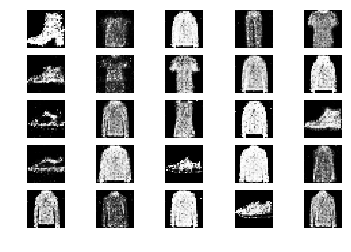

38801 [D loss: 0.634260, acc.: 56.25%] [G loss: 1.029362]
38802 [D loss: 0.603816, acc.: 64.06%] [G loss: 0.933752]
38803 [D loss: 0.604860, acc.: 64.06%] [G loss: 1.049058]
38804 [D loss: 0.607049, acc.: 64.06%] [G loss: 0.916318]
38805 [D loss: 0.639834, acc.: 64.06%] [G loss: 0.883898]
38806 [D loss: 0.673362, acc.: 57.81%] [G loss: 1.137102]
38807 [D loss: 0.670754, acc.: 51.56%] [G loss: 1.009760]
38808 [D loss: 0.642720, acc.: 71.88%] [G loss: 1.143739]
38809 [D loss: 0.630803, acc.: 62.50%] [G loss: 1.072061]
38810 [D loss: 0.670007, acc.: 60.94%] [G loss: 1.069507]
38811 [D loss: 0.665835, acc.: 60.94%] [G loss: 1.037645]
38812 [D loss: 0.666192, acc.: 65.62%] [G loss: 0.968491]
38813 [D loss: 0.573967, acc.: 71.88%] [G loss: 0.971501]
38814 [D loss: 0.655694, acc.: 54.69%] [G loss: 0.976666]
38815 [D loss: 0.542721, acc.: 76.56%] [G loss: 0.991511]
38816 [D loss: 0.596161, acc.: 75.00%] [G loss: 1.019534]
38817 [D loss: 0.605029, acc.: 65.62%] [G loss: 1.026811]
38818 [D loss:

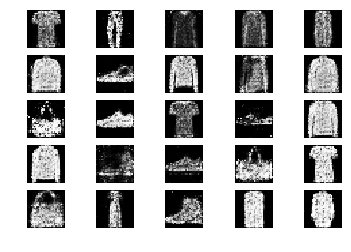

39001 [D loss: 0.627209, acc.: 67.19%] [G loss: 1.091011]
39002 [D loss: 0.593340, acc.: 78.12%] [G loss: 1.121449]
39003 [D loss: 0.625141, acc.: 62.50%] [G loss: 1.166542]
39004 [D loss: 0.682108, acc.: 56.25%] [G loss: 1.056857]
39005 [D loss: 0.557371, acc.: 82.81%] [G loss: 1.185001]
39006 [D loss: 0.573670, acc.: 71.88%] [G loss: 1.104572]
39007 [D loss: 0.550891, acc.: 70.31%] [G loss: 0.962714]
39008 [D loss: 0.602798, acc.: 65.62%] [G loss: 0.983789]
39009 [D loss: 0.617436, acc.: 67.19%] [G loss: 1.046286]
39010 [D loss: 0.625679, acc.: 64.06%] [G loss: 1.016747]
39011 [D loss: 0.647030, acc.: 62.50%] [G loss: 0.922050]
39012 [D loss: 0.673862, acc.: 60.94%] [G loss: 1.141033]
39013 [D loss: 0.640915, acc.: 59.38%] [G loss: 1.020219]
39014 [D loss: 0.742468, acc.: 54.69%] [G loss: 1.008570]
39015 [D loss: 0.719423, acc.: 62.50%] [G loss: 0.976119]
39016 [D loss: 0.649332, acc.: 64.06%] [G loss: 1.019984]
39017 [D loss: 0.657106, acc.: 65.62%] [G loss: 1.051064]
39018 [D loss:

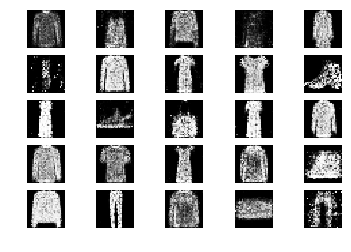

39201 [D loss: 0.615354, acc.: 65.62%] [G loss: 0.946043]
39202 [D loss: 0.606969, acc.: 60.94%] [G loss: 0.980734]
39203 [D loss: 0.611570, acc.: 65.62%] [G loss: 1.032742]
39204 [D loss: 0.636393, acc.: 62.50%] [G loss: 0.890961]
39205 [D loss: 0.691207, acc.: 59.38%] [G loss: 0.923240]
39206 [D loss: 0.597456, acc.: 68.75%] [G loss: 0.951094]
39207 [D loss: 0.751789, acc.: 50.00%] [G loss: 0.996155]
39208 [D loss: 0.646413, acc.: 62.50%] [G loss: 0.998862]
39209 [D loss: 0.601305, acc.: 68.75%] [G loss: 1.016122]
39210 [D loss: 0.703612, acc.: 56.25%] [G loss: 0.958703]
39211 [D loss: 0.718220, acc.: 56.25%] [G loss: 0.989195]
39212 [D loss: 0.594648, acc.: 64.06%] [G loss: 0.929185]
39213 [D loss: 0.585901, acc.: 67.19%] [G loss: 1.086573]
39214 [D loss: 0.655661, acc.: 56.25%] [G loss: 0.952749]
39215 [D loss: 0.683607, acc.: 59.38%] [G loss: 0.940737]
39216 [D loss: 0.630327, acc.: 57.81%] [G loss: 0.988899]
39217 [D loss: 0.626994, acc.: 67.19%] [G loss: 1.032761]
39218 [D loss:

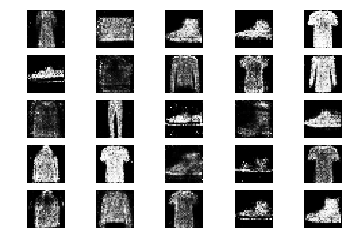

39401 [D loss: 0.686696, acc.: 57.81%] [G loss: 0.914860]
39402 [D loss: 0.556663, acc.: 78.12%] [G loss: 1.039245]
39403 [D loss: 0.633344, acc.: 64.06%] [G loss: 0.990026]
39404 [D loss: 0.632194, acc.: 56.25%] [G loss: 1.064516]
39405 [D loss: 0.601101, acc.: 71.88%] [G loss: 1.102145]
39406 [D loss: 0.707782, acc.: 57.81%] [G loss: 1.082469]
39407 [D loss: 0.667544, acc.: 50.00%] [G loss: 1.037669]
39408 [D loss: 0.574519, acc.: 70.31%] [G loss: 1.055330]
39409 [D loss: 0.623723, acc.: 65.62%] [G loss: 0.957406]
39410 [D loss: 0.566041, acc.: 67.19%] [G loss: 1.001492]
39411 [D loss: 0.610125, acc.: 67.19%] [G loss: 0.872244]
39412 [D loss: 0.765835, acc.: 57.81%] [G loss: 0.922944]
39413 [D loss: 0.618681, acc.: 65.62%] [G loss: 1.046024]
39414 [D loss: 0.575907, acc.: 73.44%] [G loss: 0.906644]
39415 [D loss: 0.705477, acc.: 57.81%] [G loss: 1.006172]
39416 [D loss: 0.527473, acc.: 81.25%] [G loss: 0.918858]
39417 [D loss: 0.660346, acc.: 54.69%] [G loss: 1.029548]
39418 [D loss:

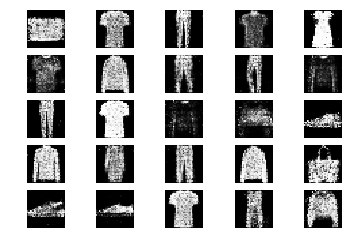

39601 [D loss: 0.670967, acc.: 53.12%] [G loss: 1.098000]
39602 [D loss: 0.656882, acc.: 64.06%] [G loss: 1.097330]
39603 [D loss: 0.574396, acc.: 73.44%] [G loss: 0.951065]
39604 [D loss: 0.624215, acc.: 65.62%] [G loss: 1.015292]
39605 [D loss: 0.576286, acc.: 68.75%] [G loss: 1.047631]
39606 [D loss: 0.652729, acc.: 54.69%] [G loss: 1.001062]
39607 [D loss: 0.698708, acc.: 56.25%] [G loss: 0.992759]
39608 [D loss: 0.648114, acc.: 70.31%] [G loss: 1.005403]
39609 [D loss: 0.619236, acc.: 67.19%] [G loss: 1.020198]
39610 [D loss: 0.568002, acc.: 71.88%] [G loss: 0.900512]
39611 [D loss: 0.665932, acc.: 59.38%] [G loss: 1.017967]
39612 [D loss: 0.680331, acc.: 60.94%] [G loss: 1.123534]
39613 [D loss: 0.608178, acc.: 71.88%] [G loss: 1.024466]
39614 [D loss: 0.671296, acc.: 51.56%] [G loss: 0.990136]
39615 [D loss: 0.617924, acc.: 62.50%] [G loss: 1.088834]
39616 [D loss: 0.636759, acc.: 64.06%] [G loss: 0.955749]
39617 [D loss: 0.621475, acc.: 67.19%] [G loss: 0.880554]
39618 [D loss:

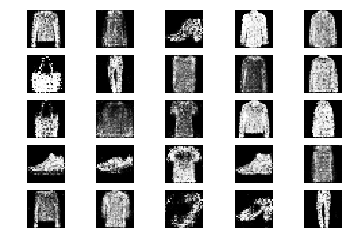

39801 [D loss: 0.585611, acc.: 73.44%] [G loss: 1.009065]
39802 [D loss: 0.595345, acc.: 70.31%] [G loss: 1.006238]
39803 [D loss: 0.659057, acc.: 59.38%] [G loss: 1.037626]
39804 [D loss: 0.648534, acc.: 57.81%] [G loss: 0.975303]
39805 [D loss: 0.584464, acc.: 64.06%] [G loss: 1.001373]
39806 [D loss: 0.606990, acc.: 64.06%] [G loss: 0.963237]
39807 [D loss: 0.630677, acc.: 68.75%] [G loss: 0.973308]
39808 [D loss: 0.564260, acc.: 70.31%] [G loss: 0.962425]
39809 [D loss: 0.603719, acc.: 64.06%] [G loss: 1.024264]
39810 [D loss: 0.622365, acc.: 60.94%] [G loss: 1.089422]
39811 [D loss: 0.593548, acc.: 67.19%] [G loss: 1.051355]
39812 [D loss: 0.611452, acc.: 65.62%] [G loss: 0.949787]
39813 [D loss: 0.579758, acc.: 73.44%] [G loss: 1.085600]
39814 [D loss: 0.700655, acc.: 46.88%] [G loss: 1.046128]
39815 [D loss: 0.662984, acc.: 60.94%] [G loss: 1.044600]
39816 [D loss: 0.617367, acc.: 70.31%] [G loss: 1.182190]
39817 [D loss: 0.646362, acc.: 57.81%] [G loss: 1.097708]
39818 [D loss:

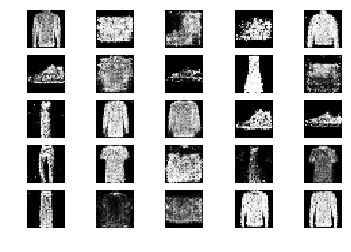

40001 [D loss: 0.619591, acc.: 65.62%] [G loss: 0.976475]
40002 [D loss: 0.582234, acc.: 68.75%] [G loss: 1.026725]
40003 [D loss: 0.628934, acc.: 68.75%] [G loss: 0.981283]
40004 [D loss: 0.638452, acc.: 67.19%] [G loss: 0.956006]
40005 [D loss: 0.645524, acc.: 64.06%] [G loss: 1.152363]
40006 [D loss: 0.660405, acc.: 60.94%] [G loss: 0.944424]
40007 [D loss: 0.655392, acc.: 62.50%] [G loss: 0.918354]
40008 [D loss: 0.677065, acc.: 62.50%] [G loss: 1.098936]
40009 [D loss: 0.553621, acc.: 73.44%] [G loss: 1.018422]
40010 [D loss: 0.640592, acc.: 60.94%] [G loss: 0.993732]
40011 [D loss: 0.623834, acc.: 67.19%] [G loss: 1.052035]
40012 [D loss: 0.694565, acc.: 51.56%] [G loss: 1.078273]
40013 [D loss: 0.567411, acc.: 62.50%] [G loss: 1.006003]
40014 [D loss: 0.693433, acc.: 59.38%] [G loss: 1.047950]
40015 [D loss: 0.683878, acc.: 53.12%] [G loss: 0.932400]
40016 [D loss: 0.595575, acc.: 65.62%] [G loss: 1.004826]
40017 [D loss: 0.627473, acc.: 64.06%] [G loss: 0.986319]
40018 [D loss:

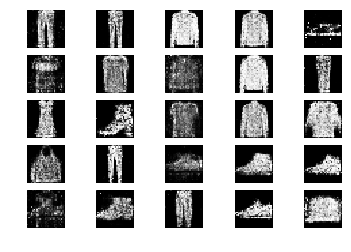

40201 [D loss: 0.593220, acc.: 73.44%] [G loss: 0.936682]
40202 [D loss: 0.627516, acc.: 59.38%] [G loss: 1.110482]
40203 [D loss: 0.610943, acc.: 59.38%] [G loss: 1.039299]
40204 [D loss: 0.664951, acc.: 65.62%] [G loss: 1.004778]
40205 [D loss: 0.652549, acc.: 67.19%] [G loss: 0.953111]
40206 [D loss: 0.618028, acc.: 65.62%] [G loss: 0.896945]
40207 [D loss: 0.618863, acc.: 68.75%] [G loss: 0.997801]
40208 [D loss: 0.606290, acc.: 59.38%] [G loss: 0.975460]
40209 [D loss: 0.655275, acc.: 59.38%] [G loss: 1.060865]
40210 [D loss: 0.708347, acc.: 57.81%] [G loss: 0.933687]
40211 [D loss: 0.621779, acc.: 62.50%] [G loss: 0.959593]
40212 [D loss: 0.680227, acc.: 59.38%] [G loss: 0.974166]
40213 [D loss: 0.691276, acc.: 64.06%] [G loss: 0.971021]
40214 [D loss: 0.679155, acc.: 57.81%] [G loss: 0.981027]
40215 [D loss: 0.591285, acc.: 71.88%] [G loss: 1.047095]
40216 [D loss: 0.633554, acc.: 57.81%] [G loss: 1.067396]
40217 [D loss: 0.590497, acc.: 67.19%] [G loss: 1.050086]
40218 [D loss:

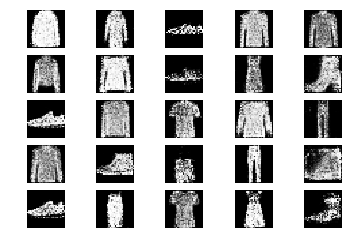

40401 [D loss: 0.641355, acc.: 67.19%] [G loss: 1.004264]
40402 [D loss: 0.656860, acc.: 57.81%] [G loss: 1.037753]
40403 [D loss: 0.609535, acc.: 68.75%] [G loss: 1.034859]
40404 [D loss: 0.565607, acc.: 70.31%] [G loss: 1.083293]
40405 [D loss: 0.670878, acc.: 65.62%] [G loss: 1.071387]
40406 [D loss: 0.590378, acc.: 76.56%] [G loss: 1.036255]
40407 [D loss: 0.646706, acc.: 64.06%] [G loss: 1.027761]
40408 [D loss: 0.679296, acc.: 59.38%] [G loss: 1.098454]
40409 [D loss: 0.625831, acc.: 60.94%] [G loss: 1.060687]
40410 [D loss: 0.665709, acc.: 64.06%] [G loss: 1.170411]
40411 [D loss: 0.591984, acc.: 71.88%] [G loss: 1.119993]
40412 [D loss: 0.679295, acc.: 62.50%] [G loss: 0.890602]
40413 [D loss: 0.582630, acc.: 78.12%] [G loss: 0.862583]
40414 [D loss: 0.608456, acc.: 67.19%] [G loss: 1.045845]
40415 [D loss: 0.763838, acc.: 45.31%] [G loss: 1.071617]
40416 [D loss: 0.598545, acc.: 68.75%] [G loss: 1.087942]
40417 [D loss: 0.620380, acc.: 64.06%] [G loss: 1.155275]
40418 [D loss:

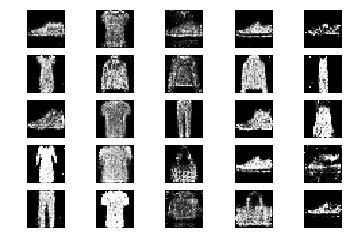

40601 [D loss: 0.643954, acc.: 60.94%] [G loss: 0.999449]
40602 [D loss: 0.662535, acc.: 57.81%] [G loss: 0.907221]
40603 [D loss: 0.680380, acc.: 59.38%] [G loss: 1.027497]
40604 [D loss: 0.729177, acc.: 50.00%] [G loss: 0.928352]
40605 [D loss: 0.600967, acc.: 64.06%] [G loss: 0.985002]
40606 [D loss: 0.608621, acc.: 65.62%] [G loss: 1.050525]
40607 [D loss: 0.610846, acc.: 62.50%] [G loss: 1.095812]
40608 [D loss: 0.548881, acc.: 71.88%] [G loss: 0.944894]
40609 [D loss: 0.629472, acc.: 62.50%] [G loss: 1.027121]
40610 [D loss: 0.615305, acc.: 59.38%] [G loss: 1.042481]
40611 [D loss: 0.623331, acc.: 57.81%] [G loss: 1.007093]
40612 [D loss: 0.626329, acc.: 67.19%] [G loss: 1.022630]
40613 [D loss: 0.660373, acc.: 60.94%] [G loss: 1.019919]
40614 [D loss: 0.565600, acc.: 67.19%] [G loss: 1.107381]
40615 [D loss: 0.612131, acc.: 64.06%] [G loss: 1.103333]
40616 [D loss: 0.555882, acc.: 75.00%] [G loss: 1.006143]
40617 [D loss: 0.635461, acc.: 59.38%] [G loss: 0.989704]
40618 [D loss:

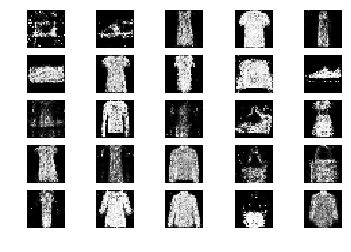

40801 [D loss: 0.683657, acc.: 59.38%] [G loss: 1.038330]
40802 [D loss: 0.595183, acc.: 65.62%] [G loss: 0.955693]
40803 [D loss: 0.654857, acc.: 59.38%] [G loss: 1.022904]
40804 [D loss: 0.564227, acc.: 68.75%] [G loss: 0.981552]
40805 [D loss: 0.632353, acc.: 56.25%] [G loss: 1.016780]
40806 [D loss: 0.640481, acc.: 62.50%] [G loss: 0.922429]
40807 [D loss: 0.660522, acc.: 59.38%] [G loss: 1.124663]
40808 [D loss: 0.579247, acc.: 68.75%] [G loss: 1.035679]
40809 [D loss: 0.564979, acc.: 76.56%] [G loss: 1.014769]
40810 [D loss: 0.577690, acc.: 71.88%] [G loss: 1.006426]
40811 [D loss: 0.631724, acc.: 65.62%] [G loss: 0.953341]
40812 [D loss: 0.641844, acc.: 60.94%] [G loss: 1.076347]
40813 [D loss: 0.591724, acc.: 71.88%] [G loss: 1.127590]
40814 [D loss: 0.625965, acc.: 67.19%] [G loss: 1.006651]
40815 [D loss: 0.635289, acc.: 68.75%] [G loss: 1.008445]
40816 [D loss: 0.654874, acc.: 57.81%] [G loss: 0.978240]
40817 [D loss: 0.592373, acc.: 64.06%] [G loss: 1.105522]
40818 [D loss:

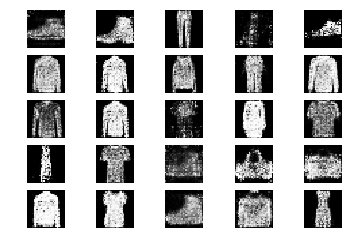

41001 [D loss: 0.695089, acc.: 57.81%] [G loss: 0.982371]
41002 [D loss: 0.625255, acc.: 59.38%] [G loss: 0.927694]
41003 [D loss: 0.728390, acc.: 54.69%] [G loss: 1.047014]
41004 [D loss: 0.605994, acc.: 65.62%] [G loss: 1.143178]
41005 [D loss: 0.576174, acc.: 64.06%] [G loss: 1.039635]
41006 [D loss: 0.713499, acc.: 56.25%] [G loss: 0.907147]
41007 [D loss: 0.697092, acc.: 54.69%] [G loss: 1.100655]
41008 [D loss: 0.644232, acc.: 60.94%] [G loss: 1.073230]
41009 [D loss: 0.590595, acc.: 65.62%] [G loss: 1.069136]
41010 [D loss: 0.559596, acc.: 73.44%] [G loss: 0.860424]
41011 [D loss: 0.532814, acc.: 75.00%] [G loss: 1.015206]
41012 [D loss: 0.637477, acc.: 62.50%] [G loss: 1.002330]
41013 [D loss: 0.609491, acc.: 62.50%] [G loss: 1.041162]
41014 [D loss: 0.607550, acc.: 68.75%] [G loss: 0.975112]
41015 [D loss: 0.576036, acc.: 70.31%] [G loss: 0.842994]
41016 [D loss: 0.640340, acc.: 59.38%] [G loss: 0.894930]
41017 [D loss: 0.624439, acc.: 62.50%] [G loss: 0.856642]
41018 [D loss:

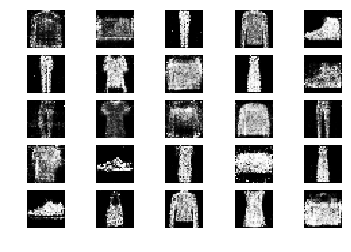

41201 [D loss: 0.787780, acc.: 50.00%] [G loss: 0.926599]
41202 [D loss: 0.654932, acc.: 65.62%] [G loss: 0.969693]
41203 [D loss: 0.610595, acc.: 70.31%] [G loss: 0.982313]
41204 [D loss: 0.643042, acc.: 65.62%] [G loss: 1.101570]
41205 [D loss: 0.619551, acc.: 64.06%] [G loss: 0.948285]
41206 [D loss: 0.592950, acc.: 64.06%] [G loss: 1.053156]
41207 [D loss: 0.581348, acc.: 68.75%] [G loss: 1.015066]
41208 [D loss: 0.708815, acc.: 54.69%] [G loss: 1.079737]
41209 [D loss: 0.712514, acc.: 60.94%] [G loss: 0.998560]
41210 [D loss: 0.525441, acc.: 81.25%] [G loss: 1.032720]
41211 [D loss: 0.658519, acc.: 60.94%] [G loss: 1.043987]
41212 [D loss: 0.647261, acc.: 57.81%] [G loss: 0.935013]
41213 [D loss: 0.613954, acc.: 64.06%] [G loss: 0.945444]
41214 [D loss: 0.624278, acc.: 71.88%] [G loss: 1.049471]
41215 [D loss: 0.640407, acc.: 60.94%] [G loss: 1.001028]
41216 [D loss: 0.560325, acc.: 71.88%] [G loss: 0.970883]
41217 [D loss: 0.602211, acc.: 73.44%] [G loss: 1.072966]
41218 [D loss:

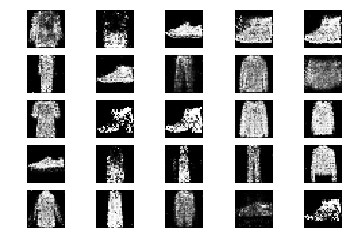

41401 [D loss: 0.640550, acc.: 57.81%] [G loss: 1.013295]
41402 [D loss: 0.675522, acc.: 65.62%] [G loss: 0.873249]
41403 [D loss: 0.635150, acc.: 59.38%] [G loss: 0.904301]
41404 [D loss: 0.593837, acc.: 68.75%] [G loss: 0.911443]
41405 [D loss: 0.677603, acc.: 57.81%] [G loss: 0.969288]
41406 [D loss: 0.603758, acc.: 68.75%] [G loss: 1.091246]
41407 [D loss: 0.630726, acc.: 62.50%] [G loss: 0.997903]
41408 [D loss: 0.564089, acc.: 68.75%] [G loss: 0.976368]
41409 [D loss: 0.635793, acc.: 62.50%] [G loss: 0.951351]
41410 [D loss: 0.562655, acc.: 70.31%] [G loss: 0.987175]
41411 [D loss: 0.710049, acc.: 56.25%] [G loss: 1.059428]
41412 [D loss: 0.623730, acc.: 65.62%] [G loss: 1.047952]
41413 [D loss: 0.574467, acc.: 67.19%] [G loss: 1.135679]
41414 [D loss: 0.587586, acc.: 60.94%] [G loss: 1.014795]
41415 [D loss: 0.603905, acc.: 64.06%] [G loss: 1.078232]
41416 [D loss: 0.671754, acc.: 57.81%] [G loss: 1.074490]
41417 [D loss: 0.601664, acc.: 64.06%] [G loss: 1.011931]
41418 [D loss:

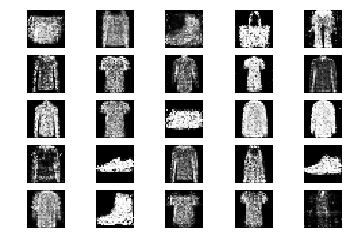

41601 [D loss: 0.649114, acc.: 64.06%] [G loss: 1.086659]
41602 [D loss: 0.673748, acc.: 60.94%] [G loss: 1.039227]
41603 [D loss: 0.625734, acc.: 64.06%] [G loss: 1.035902]
41604 [D loss: 0.803585, acc.: 45.31%] [G loss: 1.037314]
41605 [D loss: 0.572610, acc.: 65.62%] [G loss: 0.908123]
41606 [D loss: 0.566640, acc.: 71.88%] [G loss: 1.010105]
41607 [D loss: 0.713920, acc.: 54.69%] [G loss: 0.987755]
41608 [D loss: 0.650329, acc.: 57.81%] [G loss: 0.969373]
41609 [D loss: 0.584535, acc.: 68.75%] [G loss: 0.994669]
41610 [D loss: 0.645821, acc.: 64.06%] [G loss: 1.098935]
41611 [D loss: 0.600968, acc.: 64.06%] [G loss: 1.018833]
41612 [D loss: 0.579192, acc.: 70.31%] [G loss: 0.972756]
41613 [D loss: 0.687803, acc.: 57.81%] [G loss: 0.974039]
41614 [D loss: 0.596350, acc.: 64.06%] [G loss: 1.054011]
41615 [D loss: 0.596606, acc.: 65.62%] [G loss: 0.951110]
41616 [D loss: 0.640424, acc.: 56.25%] [G loss: 0.988535]
41617 [D loss: 0.602203, acc.: 71.88%] [G loss: 0.952875]
41618 [D loss:

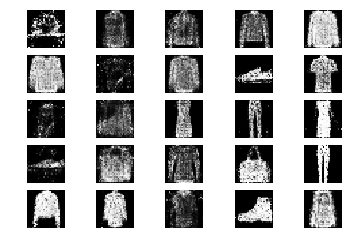

41801 [D loss: 0.658471, acc.: 64.06%] [G loss: 0.978073]
41802 [D loss: 0.657838, acc.: 60.94%] [G loss: 0.926026]
41803 [D loss: 0.594288, acc.: 64.06%] [G loss: 0.984827]
41804 [D loss: 0.599158, acc.: 70.31%] [G loss: 1.075833]
41805 [D loss: 0.657971, acc.: 65.62%] [G loss: 0.897553]
41806 [D loss: 0.637020, acc.: 59.38%] [G loss: 0.939049]
41807 [D loss: 0.669222, acc.: 59.38%] [G loss: 0.975530]
41808 [D loss: 0.630437, acc.: 67.19%] [G loss: 0.924619]
41809 [D loss: 0.605966, acc.: 76.56%] [G loss: 0.991179]
41810 [D loss: 0.686413, acc.: 57.81%] [G loss: 0.937637]
41811 [D loss: 0.583086, acc.: 65.62%] [G loss: 0.900588]
41812 [D loss: 0.623164, acc.: 73.44%] [G loss: 0.960304]
41813 [D loss: 0.579128, acc.: 70.31%] [G loss: 0.892566]
41814 [D loss: 0.649670, acc.: 64.06%] [G loss: 1.084603]
41815 [D loss: 0.608709, acc.: 62.50%] [G loss: 1.040088]
41816 [D loss: 0.575854, acc.: 68.75%] [G loss: 1.086871]
41817 [D loss: 0.560711, acc.: 68.75%] [G loss: 1.073098]
41818 [D loss:

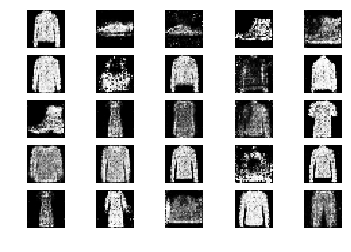

42001 [D loss: 0.620863, acc.: 67.19%] [G loss: 1.030091]
42002 [D loss: 0.651438, acc.: 54.69%] [G loss: 0.978350]
42003 [D loss: 0.679204, acc.: 62.50%] [G loss: 0.969612]
42004 [D loss: 0.679141, acc.: 60.94%] [G loss: 1.047636]
42005 [D loss: 0.684847, acc.: 53.12%] [G loss: 1.124653]
42006 [D loss: 0.590411, acc.: 62.50%] [G loss: 1.043178]
42007 [D loss: 0.631754, acc.: 57.81%] [G loss: 1.047459]
42008 [D loss: 0.638955, acc.: 62.50%] [G loss: 1.036169]
42009 [D loss: 0.617406, acc.: 65.62%] [G loss: 1.185335]
42010 [D loss: 0.646387, acc.: 64.06%] [G loss: 0.914709]
42011 [D loss: 0.619145, acc.: 64.06%] [G loss: 1.055529]
42012 [D loss: 0.679376, acc.: 54.69%] [G loss: 0.947682]
42013 [D loss: 0.602051, acc.: 68.75%] [G loss: 0.875555]
42014 [D loss: 0.639986, acc.: 64.06%] [G loss: 1.122559]
42015 [D loss: 0.658589, acc.: 64.06%] [G loss: 1.156848]
42016 [D loss: 0.635165, acc.: 60.94%] [G loss: 1.037050]
42017 [D loss: 0.656034, acc.: 59.38%] [G loss: 1.072908]
42018 [D loss:

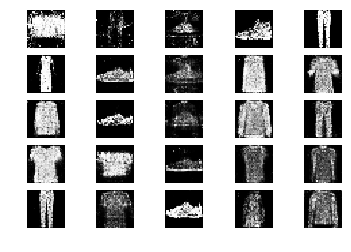

42201 [D loss: 0.691807, acc.: 62.50%] [G loss: 1.006816]
42202 [D loss: 0.649792, acc.: 60.94%] [G loss: 0.952305]
42203 [D loss: 0.568065, acc.: 65.62%] [G loss: 0.944922]
42204 [D loss: 0.759024, acc.: 53.12%] [G loss: 0.946082]
42205 [D loss: 0.619683, acc.: 65.62%] [G loss: 1.015172]
42206 [D loss: 0.672758, acc.: 64.06%] [G loss: 0.978643]
42207 [D loss: 0.670293, acc.: 57.81%] [G loss: 0.973827]
42208 [D loss: 0.669419, acc.: 54.69%] [G loss: 0.918397]
42209 [D loss: 0.623229, acc.: 57.81%] [G loss: 1.098808]
42210 [D loss: 0.596593, acc.: 67.19%] [G loss: 0.943177]
42211 [D loss: 0.536599, acc.: 71.88%] [G loss: 1.008569]
42212 [D loss: 0.685145, acc.: 60.94%] [G loss: 1.082349]
42213 [D loss: 0.618040, acc.: 65.62%] [G loss: 0.967360]
42214 [D loss: 0.675214, acc.: 54.69%] [G loss: 0.953659]
42215 [D loss: 0.750258, acc.: 48.44%] [G loss: 0.865629]
42216 [D loss: 0.628400, acc.: 65.62%] [G loss: 0.993066]
42217 [D loss: 0.657883, acc.: 62.50%] [G loss: 0.948181]
42218 [D loss:

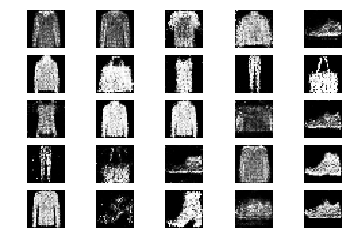

42401 [D loss: 0.581429, acc.: 70.31%] [G loss: 0.889324]
42402 [D loss: 0.590640, acc.: 65.62%] [G loss: 1.002139]
42403 [D loss: 0.587012, acc.: 67.19%] [G loss: 1.056548]
42404 [D loss: 0.608614, acc.: 67.19%] [G loss: 1.028165]
42405 [D loss: 0.667330, acc.: 60.94%] [G loss: 1.003855]
42406 [D loss: 0.632243, acc.: 62.50%] [G loss: 0.943296]
42407 [D loss: 0.624166, acc.: 60.94%] [G loss: 1.040823]
42408 [D loss: 0.587517, acc.: 62.50%] [G loss: 1.133136]
42409 [D loss: 0.612596, acc.: 68.75%] [G loss: 1.004033]
42410 [D loss: 0.574920, acc.: 70.31%] [G loss: 1.087965]
42411 [D loss: 0.696641, acc.: 53.12%] [G loss: 1.006222]
42412 [D loss: 0.605775, acc.: 65.62%] [G loss: 1.142457]
42413 [D loss: 0.619970, acc.: 57.81%] [G loss: 1.020967]
42414 [D loss: 0.547200, acc.: 68.75%] [G loss: 1.082423]
42415 [D loss: 0.660056, acc.: 60.94%] [G loss: 1.225614]
42416 [D loss: 0.582313, acc.: 73.44%] [G loss: 0.990347]
42417 [D loss: 0.667711, acc.: 60.94%] [G loss: 1.087778]
42418 [D loss:

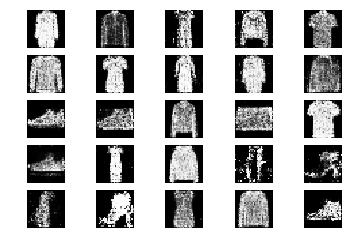

42601 [D loss: 0.572792, acc.: 75.00%] [G loss: 1.010194]
42602 [D loss: 0.634884, acc.: 59.38%] [G loss: 1.037788]
42603 [D loss: 0.606187, acc.: 68.75%] [G loss: 0.939517]
42604 [D loss: 0.664907, acc.: 62.50%] [G loss: 1.046546]
42605 [D loss: 0.623455, acc.: 67.19%] [G loss: 1.111270]
42606 [D loss: 0.618011, acc.: 62.50%] [G loss: 0.988154]
42607 [D loss: 0.666121, acc.: 60.94%] [G loss: 1.011151]
42608 [D loss: 0.665431, acc.: 53.12%] [G loss: 1.053952]
42609 [D loss: 0.693562, acc.: 57.81%] [G loss: 1.031313]
42610 [D loss: 0.592162, acc.: 71.88%] [G loss: 1.176728]
42611 [D loss: 0.579353, acc.: 71.88%] [G loss: 1.046463]
42612 [D loss: 0.609011, acc.: 67.19%] [G loss: 1.108006]
42613 [D loss: 0.683133, acc.: 59.38%] [G loss: 1.056554]
42614 [D loss: 0.603490, acc.: 65.62%] [G loss: 1.021605]
42615 [D loss: 0.617187, acc.: 70.31%] [G loss: 1.099535]
42616 [D loss: 0.666232, acc.: 62.50%] [G loss: 1.031889]
42617 [D loss: 0.603253, acc.: 71.88%] [G loss: 0.986338]
42618 [D loss:

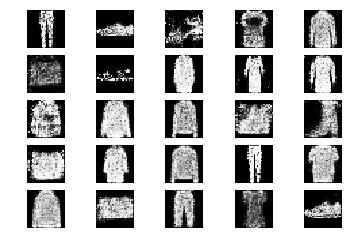

42801 [D loss: 0.689747, acc.: 50.00%] [G loss: 1.101333]
42802 [D loss: 0.766439, acc.: 50.00%] [G loss: 1.003351]
42803 [D loss: 0.616088, acc.: 65.62%] [G loss: 1.003981]
42804 [D loss: 0.621881, acc.: 59.38%] [G loss: 0.972755]
42805 [D loss: 0.598924, acc.: 65.62%] [G loss: 1.032452]
42806 [D loss: 0.638733, acc.: 64.06%] [G loss: 1.073519]
42807 [D loss: 0.543898, acc.: 75.00%] [G loss: 1.000467]
42808 [D loss: 0.595068, acc.: 67.19%] [G loss: 1.067965]
42809 [D loss: 0.645144, acc.: 65.62%] [G loss: 0.909082]
42810 [D loss: 0.574557, acc.: 64.06%] [G loss: 0.925342]
42811 [D loss: 0.666099, acc.: 60.94%] [G loss: 1.019976]
42812 [D loss: 0.558868, acc.: 73.44%] [G loss: 0.998549]
42813 [D loss: 0.614624, acc.: 64.06%] [G loss: 0.914124]
42814 [D loss: 0.571144, acc.: 68.75%] [G loss: 1.029848]
42815 [D loss: 0.687420, acc.: 60.94%] [G loss: 0.894008]
42816 [D loss: 0.601388, acc.: 64.06%] [G loss: 1.000976]
42817 [D loss: 0.743904, acc.: 53.12%] [G loss: 0.974412]
42818 [D loss:

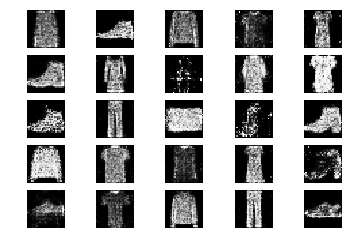

43001 [D loss: 0.514975, acc.: 78.12%] [G loss: 1.015505]
43002 [D loss: 0.604557, acc.: 67.19%] [G loss: 0.991720]
43003 [D loss: 0.590696, acc.: 71.88%] [G loss: 1.002845]
43004 [D loss: 0.631970, acc.: 56.25%] [G loss: 1.026266]
43005 [D loss: 0.577456, acc.: 71.88%] [G loss: 0.986722]
43006 [D loss: 0.657542, acc.: 65.62%] [G loss: 0.912488]
43007 [D loss: 0.567234, acc.: 71.88%] [G loss: 1.046729]
43008 [D loss: 0.622770, acc.: 57.81%] [G loss: 1.008254]
43009 [D loss: 0.627111, acc.: 64.06%] [G loss: 0.910448]
43010 [D loss: 0.574382, acc.: 70.31%] [G loss: 0.963081]
43011 [D loss: 0.668428, acc.: 62.50%] [G loss: 0.913925]
43012 [D loss: 0.663305, acc.: 54.69%] [G loss: 0.922481]
43013 [D loss: 0.641780, acc.: 57.81%] [G loss: 1.098104]
43014 [D loss: 0.609788, acc.: 62.50%] [G loss: 1.097300]
43015 [D loss: 0.622306, acc.: 59.38%] [G loss: 1.104296]
43016 [D loss: 0.811071, acc.: 53.12%] [G loss: 0.930581]
43017 [D loss: 0.628490, acc.: 59.38%] [G loss: 0.894492]
43018 [D loss:

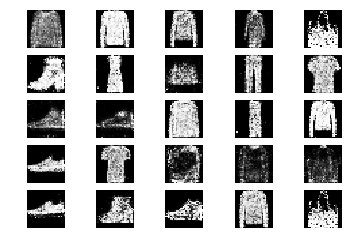

43201 [D loss: 0.658927, acc.: 60.94%] [G loss: 1.097407]
43202 [D loss: 0.581385, acc.: 70.31%] [G loss: 1.067688]
43203 [D loss: 0.563735, acc.: 65.62%] [G loss: 1.141200]
43204 [D loss: 0.622842, acc.: 65.62%] [G loss: 1.054776]
43205 [D loss: 0.667043, acc.: 54.69%] [G loss: 1.125549]
43206 [D loss: 0.673155, acc.: 57.81%] [G loss: 0.930999]
43207 [D loss: 0.627003, acc.: 65.62%] [G loss: 1.082092]
43208 [D loss: 0.631146, acc.: 57.81%] [G loss: 0.991916]
43209 [D loss: 0.644696, acc.: 64.06%] [G loss: 1.224969]
43210 [D loss: 0.638559, acc.: 57.81%] [G loss: 1.070447]
43211 [D loss: 0.595139, acc.: 67.19%] [G loss: 1.085079]
43212 [D loss: 0.647084, acc.: 59.38%] [G loss: 1.036307]
43213 [D loss: 0.660134, acc.: 59.38%] [G loss: 0.961429]
43214 [D loss: 0.625804, acc.: 65.62%] [G loss: 1.051457]
43215 [D loss: 0.599591, acc.: 70.31%] [G loss: 1.035615]
43216 [D loss: 0.578663, acc.: 71.88%] [G loss: 0.985534]
43217 [D loss: 0.592858, acc.: 73.44%] [G loss: 1.058660]
43218 [D loss:

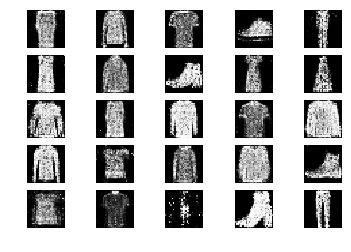

43401 [D loss: 0.563022, acc.: 81.25%] [G loss: 0.958889]
43402 [D loss: 0.602634, acc.: 64.06%] [G loss: 1.007363]
43403 [D loss: 0.710078, acc.: 53.12%] [G loss: 0.919785]
43404 [D loss: 0.598451, acc.: 67.19%] [G loss: 1.073652]
43405 [D loss: 0.573714, acc.: 71.88%] [G loss: 0.913512]
43406 [D loss: 0.573179, acc.: 73.44%] [G loss: 0.936179]
43407 [D loss: 0.655201, acc.: 56.25%] [G loss: 1.011640]
43408 [D loss: 0.551800, acc.: 71.88%] [G loss: 1.140369]
43409 [D loss: 0.701010, acc.: 56.25%] [G loss: 0.985950]
43410 [D loss: 0.656390, acc.: 62.50%] [G loss: 1.008545]
43411 [D loss: 0.607422, acc.: 70.31%] [G loss: 0.934444]
43412 [D loss: 0.640947, acc.: 62.50%] [G loss: 0.993005]
43413 [D loss: 0.651368, acc.: 65.62%] [G loss: 1.058214]
43414 [D loss: 0.673071, acc.: 60.94%] [G loss: 1.018872]
43415 [D loss: 0.553189, acc.: 71.88%] [G loss: 0.994915]
43416 [D loss: 0.630650, acc.: 65.62%] [G loss: 0.915509]
43417 [D loss: 0.758020, acc.: 56.25%] [G loss: 0.957316]
43418 [D loss:

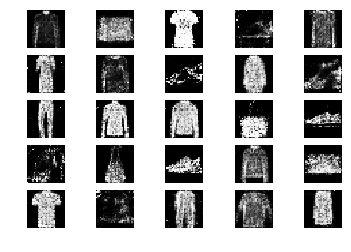

43601 [D loss: 0.544441, acc.: 71.88%] [G loss: 1.008507]
43602 [D loss: 0.624971, acc.: 65.62%] [G loss: 0.959711]
43603 [D loss: 0.520582, acc.: 79.69%] [G loss: 1.100476]
43604 [D loss: 0.625851, acc.: 64.06%] [G loss: 0.956430]
43605 [D loss: 0.646883, acc.: 56.25%] [G loss: 1.064392]
43606 [D loss: 0.573830, acc.: 70.31%] [G loss: 1.016610]
43607 [D loss: 0.684834, acc.: 57.81%] [G loss: 0.943329]
43608 [D loss: 0.596426, acc.: 64.06%] [G loss: 0.975364]
43609 [D loss: 0.683403, acc.: 53.12%] [G loss: 1.021564]
43610 [D loss: 0.665628, acc.: 65.62%] [G loss: 0.972509]
43611 [D loss: 0.595018, acc.: 60.94%] [G loss: 0.971087]
43612 [D loss: 0.589170, acc.: 67.19%] [G loss: 1.072136]
43613 [D loss: 0.667150, acc.: 65.62%] [G loss: 1.055319]
43614 [D loss: 0.705894, acc.: 53.12%] [G loss: 1.220372]
43615 [D loss: 0.639177, acc.: 60.94%] [G loss: 1.114546]
43616 [D loss: 0.618048, acc.: 65.62%] [G loss: 1.181129]
43617 [D loss: 0.708384, acc.: 56.25%] [G loss: 1.042694]
43618 [D loss:

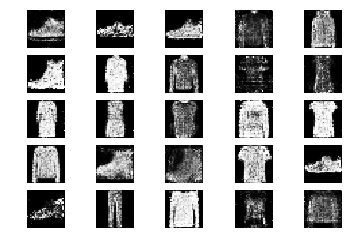

43801 [D loss: 0.644846, acc.: 60.94%] [G loss: 0.878767]
43802 [D loss: 0.590997, acc.: 68.75%] [G loss: 0.958292]
43803 [D loss: 0.624505, acc.: 64.06%] [G loss: 1.003883]
43804 [D loss: 0.654055, acc.: 60.94%] [G loss: 1.021199]
43805 [D loss: 0.645681, acc.: 60.94%] [G loss: 0.903649]
43806 [D loss: 0.550227, acc.: 73.44%] [G loss: 0.866749]
43807 [D loss: 0.700729, acc.: 53.12%] [G loss: 0.929587]
43808 [D loss: 0.547144, acc.: 75.00%] [G loss: 0.934951]
43809 [D loss: 0.711479, acc.: 56.25%] [G loss: 0.963001]
43810 [D loss: 0.557870, acc.: 76.56%] [G loss: 1.038318]
43811 [D loss: 0.628750, acc.: 62.50%] [G loss: 0.942630]
43812 [D loss: 0.690873, acc.: 50.00%] [G loss: 1.058270]
43813 [D loss: 0.569843, acc.: 67.19%] [G loss: 1.091651]
43814 [D loss: 0.614724, acc.: 67.19%] [G loss: 0.950213]
43815 [D loss: 0.658567, acc.: 62.50%] [G loss: 0.983033]
43816 [D loss: 0.630926, acc.: 65.62%] [G loss: 1.017902]
43817 [D loss: 0.631947, acc.: 59.38%] [G loss: 0.993514]
43818 [D loss:

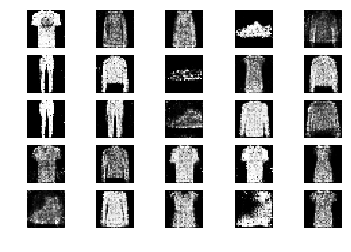

44001 [D loss: 0.661654, acc.: 56.25%] [G loss: 0.929170]
44002 [D loss: 0.622043, acc.: 57.81%] [G loss: 1.023733]
44003 [D loss: 0.649904, acc.: 70.31%] [G loss: 1.070578]
44004 [D loss: 0.600293, acc.: 70.31%] [G loss: 1.003184]
44005 [D loss: 0.581126, acc.: 60.94%] [G loss: 1.224477]
44006 [D loss: 0.627180, acc.: 65.62%] [G loss: 1.073876]
44007 [D loss: 0.601151, acc.: 67.19%] [G loss: 0.938377]
44008 [D loss: 0.630063, acc.: 67.19%] [G loss: 1.026658]
44009 [D loss: 0.599415, acc.: 64.06%] [G loss: 0.965801]
44010 [D loss: 0.624832, acc.: 60.94%] [G loss: 1.035261]
44011 [D loss: 0.578243, acc.: 68.75%] [G loss: 1.089332]
44012 [D loss: 0.632789, acc.: 60.94%] [G loss: 0.923900]
44013 [D loss: 0.636225, acc.: 59.38%] [G loss: 0.937291]
44014 [D loss: 0.631446, acc.: 59.38%] [G loss: 0.953747]
44015 [D loss: 0.646511, acc.: 53.12%] [G loss: 1.035662]
44016 [D loss: 0.620520, acc.: 67.19%] [G loss: 1.053634]
44017 [D loss: 0.640879, acc.: 62.50%] [G loss: 1.010324]
44018 [D loss:

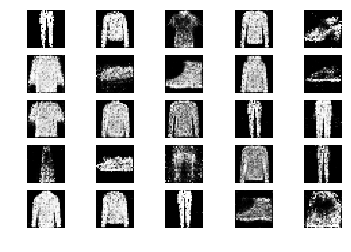

44201 [D loss: 0.570323, acc.: 71.88%] [G loss: 0.961121]
44202 [D loss: 0.709083, acc.: 60.94%] [G loss: 1.192445]
44203 [D loss: 0.588353, acc.: 73.44%] [G loss: 0.990836]
44204 [D loss: 0.685272, acc.: 57.81%] [G loss: 0.948304]
44205 [D loss: 0.684328, acc.: 60.94%] [G loss: 1.050864]
44206 [D loss: 0.612538, acc.: 62.50%] [G loss: 1.032662]
44207 [D loss: 0.648089, acc.: 64.06%] [G loss: 1.055913]
44208 [D loss: 0.585043, acc.: 73.44%] [G loss: 0.959646]
44209 [D loss: 0.605271, acc.: 64.06%] [G loss: 1.070800]
44210 [D loss: 0.627136, acc.: 57.81%] [G loss: 1.067692]
44211 [D loss: 0.625087, acc.: 67.19%] [G loss: 1.063161]
44212 [D loss: 0.629169, acc.: 67.19%] [G loss: 1.185313]
44213 [D loss: 0.590055, acc.: 70.31%] [G loss: 1.130326]
44214 [D loss: 0.549788, acc.: 73.44%] [G loss: 0.969651]
44215 [D loss: 0.646567, acc.: 71.88%] [G loss: 1.165345]
44216 [D loss: 0.727537, acc.: 59.38%] [G loss: 0.888286]
44217 [D loss: 0.552872, acc.: 71.88%] [G loss: 0.921242]
44218 [D loss:

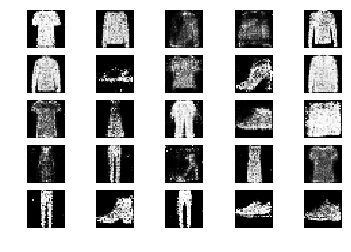

44401 [D loss: 0.683416, acc.: 57.81%] [G loss: 0.997079]
44402 [D loss: 0.593337, acc.: 70.31%] [G loss: 1.117675]
44403 [D loss: 0.639977, acc.: 60.94%] [G loss: 0.944170]
44404 [D loss: 0.644318, acc.: 62.50%] [G loss: 0.983809]
44405 [D loss: 0.558625, acc.: 75.00%] [G loss: 1.075489]
44406 [D loss: 0.618559, acc.: 62.50%] [G loss: 0.926503]
44407 [D loss: 0.511202, acc.: 79.69%] [G loss: 1.011905]
44408 [D loss: 0.660691, acc.: 70.31%] [G loss: 1.011979]
44409 [D loss: 0.643171, acc.: 56.25%] [G loss: 1.029377]
44410 [D loss: 0.617474, acc.: 60.94%] [G loss: 1.001021]
44411 [D loss: 0.629267, acc.: 62.50%] [G loss: 1.090754]
44412 [D loss: 0.644807, acc.: 65.62%] [G loss: 1.096836]
44413 [D loss: 0.623803, acc.: 65.62%] [G loss: 0.985554]
44414 [D loss: 0.611447, acc.: 65.62%] [G loss: 1.118730]
44415 [D loss: 0.584516, acc.: 68.75%] [G loss: 1.147897]
44416 [D loss: 0.566196, acc.: 73.44%] [G loss: 1.058302]
44417 [D loss: 0.687441, acc.: 53.12%] [G loss: 1.049730]
44418 [D loss:

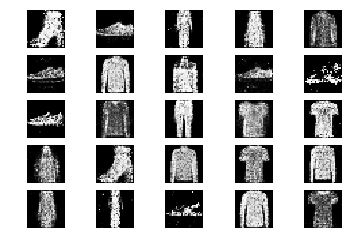

44601 [D loss: 0.591194, acc.: 76.56%] [G loss: 0.847132]
44602 [D loss: 0.581614, acc.: 68.75%] [G loss: 0.946027]
44603 [D loss: 0.629303, acc.: 68.75%] [G loss: 1.095267]
44604 [D loss: 0.689169, acc.: 59.38%] [G loss: 1.028649]
44605 [D loss: 0.645166, acc.: 57.81%] [G loss: 0.963005]
44606 [D loss: 0.678223, acc.: 51.56%] [G loss: 0.950049]
44607 [D loss: 0.587060, acc.: 62.50%] [G loss: 0.967574]
44608 [D loss: 0.565226, acc.: 73.44%] [G loss: 0.966848]
44609 [D loss: 0.661033, acc.: 64.06%] [G loss: 0.998675]
44610 [D loss: 0.605129, acc.: 64.06%] [G loss: 0.959775]
44611 [D loss: 0.689608, acc.: 54.69%] [G loss: 1.034728]
44612 [D loss: 0.711488, acc.: 51.56%] [G loss: 0.959123]
44613 [D loss: 0.612823, acc.: 62.50%] [G loss: 0.922953]
44614 [D loss: 0.663643, acc.: 56.25%] [G loss: 0.931494]
44615 [D loss: 0.675794, acc.: 57.81%] [G loss: 0.986637]
44616 [D loss: 0.565858, acc.: 71.88%] [G loss: 0.989655]
44617 [D loss: 0.539668, acc.: 73.44%] [G loss: 1.138396]
44618 [D loss:

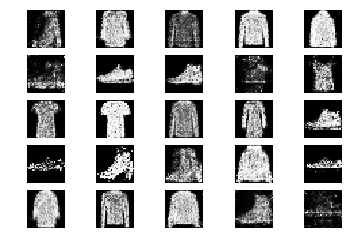

44801 [D loss: 0.687459, acc.: 57.81%] [G loss: 0.938473]
44802 [D loss: 0.615344, acc.: 59.38%] [G loss: 1.053100]
44803 [D loss: 0.689092, acc.: 57.81%] [G loss: 1.035612]
44804 [D loss: 0.680425, acc.: 57.81%] [G loss: 0.961801]
44805 [D loss: 0.535086, acc.: 71.88%] [G loss: 1.012707]
44806 [D loss: 0.523087, acc.: 79.69%] [G loss: 1.063076]
44807 [D loss: 0.589253, acc.: 62.50%] [G loss: 1.018657]
44808 [D loss: 0.593676, acc.: 68.75%] [G loss: 0.998212]
44809 [D loss: 0.643016, acc.: 62.50%] [G loss: 1.048805]
44810 [D loss: 0.625386, acc.: 60.94%] [G loss: 0.918051]
44811 [D loss: 0.703198, acc.: 57.81%] [G loss: 1.034853]
44812 [D loss: 0.636061, acc.: 64.06%] [G loss: 1.002004]
44813 [D loss: 0.581127, acc.: 64.06%] [G loss: 0.970793]
44814 [D loss: 0.593199, acc.: 68.75%] [G loss: 1.001720]
44815 [D loss: 0.617340, acc.: 65.62%] [G loss: 1.009288]
44816 [D loss: 0.525540, acc.: 75.00%] [G loss: 0.933589]
44817 [D loss: 0.580067, acc.: 75.00%] [G loss: 1.109646]
44818 [D loss:

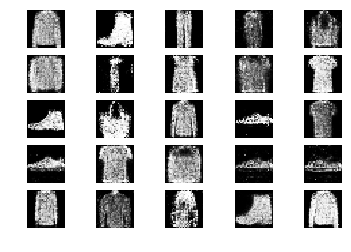

45001 [D loss: 0.611396, acc.: 67.19%] [G loss: 0.967642]
45002 [D loss: 0.640975, acc.: 57.81%] [G loss: 0.972309]
45003 [D loss: 0.624210, acc.: 64.06%] [G loss: 0.971543]
45004 [D loss: 0.590747, acc.: 65.62%] [G loss: 1.001984]
45005 [D loss: 0.636300, acc.: 65.62%] [G loss: 0.989050]
45006 [D loss: 0.636027, acc.: 59.38%] [G loss: 1.098146]
45007 [D loss: 0.801024, acc.: 45.31%] [G loss: 0.869163]
45008 [D loss: 0.636113, acc.: 59.38%] [G loss: 1.006330]
45009 [D loss: 0.729528, acc.: 54.69%] [G loss: 0.956889]
45010 [D loss: 0.697376, acc.: 57.81%] [G loss: 1.057550]
45011 [D loss: 0.639024, acc.: 64.06%] [G loss: 1.037951]
45012 [D loss: 0.638338, acc.: 64.06%] [G loss: 0.952187]
45013 [D loss: 0.631129, acc.: 65.62%] [G loss: 0.991612]
45014 [D loss: 0.683389, acc.: 59.38%] [G loss: 1.090407]
45015 [D loss: 0.608420, acc.: 68.75%] [G loss: 1.037618]
45016 [D loss: 0.587788, acc.: 62.50%] [G loss: 1.172817]
45017 [D loss: 0.668169, acc.: 57.81%] [G loss: 1.123602]
45018 [D loss:

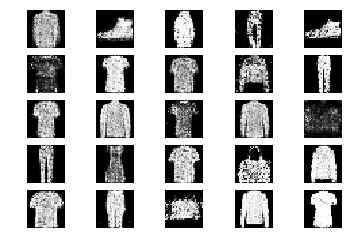

45201 [D loss: 0.602171, acc.: 67.19%] [G loss: 0.990367]
45202 [D loss: 0.627610, acc.: 67.19%] [G loss: 1.019572]
45203 [D loss: 0.583893, acc.: 67.19%] [G loss: 1.177610]
45204 [D loss: 0.621113, acc.: 62.50%] [G loss: 1.026489]
45205 [D loss: 0.687040, acc.: 53.12%] [G loss: 0.960122]
45206 [D loss: 0.697577, acc.: 62.50%] [G loss: 0.953966]
45207 [D loss: 0.691720, acc.: 54.69%] [G loss: 1.032286]
45208 [D loss: 0.631722, acc.: 59.38%] [G loss: 1.024120]
45209 [D loss: 0.652550, acc.: 62.50%] [G loss: 1.011497]
45210 [D loss: 0.662218, acc.: 64.06%] [G loss: 1.121474]
45211 [D loss: 0.602989, acc.: 67.19%] [G loss: 1.167516]
45212 [D loss: 0.645026, acc.: 60.94%] [G loss: 1.110279]
45213 [D loss: 0.682545, acc.: 59.38%] [G loss: 1.162217]
45214 [D loss: 0.629694, acc.: 67.19%] [G loss: 1.132116]
45215 [D loss: 0.658416, acc.: 65.62%] [G loss: 1.076513]
45216 [D loss: 0.687721, acc.: 59.38%] [G loss: 0.970936]
45217 [D loss: 0.577312, acc.: 67.19%] [G loss: 1.053377]
45218 [D loss:

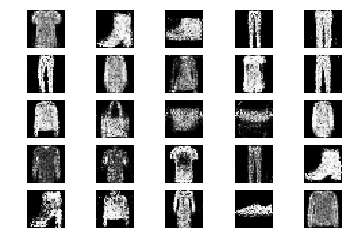

45401 [D loss: 0.562928, acc.: 81.25%] [G loss: 0.981979]
45402 [D loss: 0.564604, acc.: 71.88%] [G loss: 1.106776]
45403 [D loss: 0.585529, acc.: 70.31%] [G loss: 0.927178]
45404 [D loss: 0.584924, acc.: 75.00%] [G loss: 0.937826]
45405 [D loss: 0.626906, acc.: 62.50%] [G loss: 0.879341]
45406 [D loss: 0.616192, acc.: 64.06%] [G loss: 1.039634]
45407 [D loss: 0.622262, acc.: 62.50%] [G loss: 1.000831]
45408 [D loss: 0.650270, acc.: 54.69%] [G loss: 1.058277]
45409 [D loss: 0.630173, acc.: 60.94%] [G loss: 0.930616]
45410 [D loss: 0.564624, acc.: 71.88%] [G loss: 1.020618]
45411 [D loss: 0.608576, acc.: 60.94%] [G loss: 1.115432]
45412 [D loss: 0.697814, acc.: 62.50%] [G loss: 1.036596]
45413 [D loss: 0.668275, acc.: 57.81%] [G loss: 1.114315]
45414 [D loss: 0.597132, acc.: 64.06%] [G loss: 1.049527]
45415 [D loss: 0.643318, acc.: 60.94%] [G loss: 0.997663]
45416 [D loss: 0.596164, acc.: 70.31%] [G loss: 0.953056]
45417 [D loss: 0.641115, acc.: 64.06%] [G loss: 1.061570]
45418 [D loss:

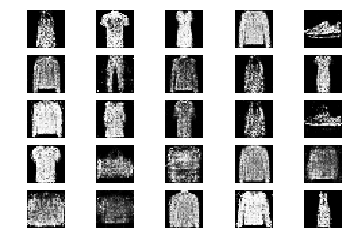

45601 [D loss: 0.596851, acc.: 60.94%] [G loss: 0.948737]
45602 [D loss: 0.683463, acc.: 54.69%] [G loss: 0.935021]
45603 [D loss: 0.624262, acc.: 67.19%] [G loss: 0.987839]
45604 [D loss: 0.620423, acc.: 62.50%] [G loss: 1.039874]
45605 [D loss: 0.728581, acc.: 48.44%] [G loss: 0.917587]
45606 [D loss: 0.656169, acc.: 60.94%] [G loss: 0.941859]
45607 [D loss: 0.652236, acc.: 56.25%] [G loss: 1.119501]
45608 [D loss: 0.584850, acc.: 76.56%] [G loss: 1.102516]
45609 [D loss: 0.661456, acc.: 68.75%] [G loss: 1.058183]
45610 [D loss: 0.622260, acc.: 56.25%] [G loss: 1.022110]
45611 [D loss: 0.654044, acc.: 56.25%] [G loss: 1.159330]
45612 [D loss: 0.638205, acc.: 57.81%] [G loss: 1.064119]
45613 [D loss: 0.613492, acc.: 65.62%] [G loss: 1.009492]
45614 [D loss: 0.612301, acc.: 67.19%] [G loss: 1.028326]
45615 [D loss: 0.620219, acc.: 67.19%] [G loss: 1.130489]
45616 [D loss: 0.667285, acc.: 60.94%] [G loss: 1.029825]
45617 [D loss: 0.574394, acc.: 68.75%] [G loss: 1.011782]
45618 [D loss:

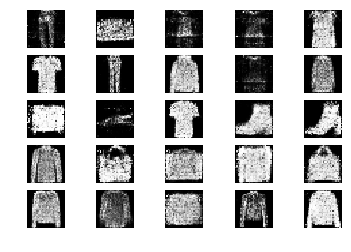

45801 [D loss: 0.560086, acc.: 68.75%] [G loss: 1.064410]
45802 [D loss: 0.583253, acc.: 73.44%] [G loss: 0.925803]
45803 [D loss: 0.605065, acc.: 64.06%] [G loss: 0.961302]
45804 [D loss: 0.588457, acc.: 65.62%] [G loss: 1.089216]
45805 [D loss: 0.580217, acc.: 70.31%] [G loss: 0.960952]
45806 [D loss: 0.616382, acc.: 64.06%] [G loss: 1.049246]
45807 [D loss: 0.601040, acc.: 70.31%] [G loss: 1.226884]
45808 [D loss: 0.672494, acc.: 62.50%] [G loss: 0.972153]
45809 [D loss: 0.578760, acc.: 70.31%] [G loss: 0.937495]
45810 [D loss: 0.650946, acc.: 60.94%] [G loss: 1.068036]
45811 [D loss: 0.613291, acc.: 65.62%] [G loss: 0.935731]
45812 [D loss: 0.543296, acc.: 68.75%] [G loss: 1.048892]
45813 [D loss: 0.660378, acc.: 68.75%] [G loss: 1.060368]
45814 [D loss: 0.669690, acc.: 62.50%] [G loss: 0.945300]
45815 [D loss: 0.615017, acc.: 67.19%] [G loss: 0.899235]
45816 [D loss: 0.596474, acc.: 62.50%] [G loss: 1.152379]
45817 [D loss: 0.752822, acc.: 51.56%] [G loss: 0.979514]
45818 [D loss:

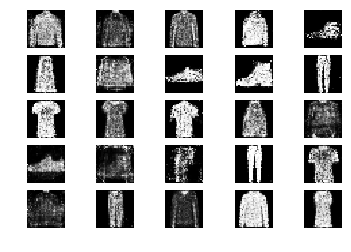

46001 [D loss: 0.603180, acc.: 67.19%] [G loss: 0.871463]
46002 [D loss: 0.647424, acc.: 67.19%] [G loss: 0.971586]
46003 [D loss: 0.558278, acc.: 67.19%] [G loss: 1.060552]
46004 [D loss: 0.638679, acc.: 60.94%] [G loss: 1.102002]
46005 [D loss: 0.642547, acc.: 56.25%] [G loss: 1.020451]
46006 [D loss: 0.647073, acc.: 59.38%] [G loss: 1.022533]
46007 [D loss: 0.560665, acc.: 68.75%] [G loss: 1.096690]
46008 [D loss: 0.593836, acc.: 59.38%] [G loss: 1.184164]
46009 [D loss: 0.629599, acc.: 64.06%] [G loss: 0.973412]
46010 [D loss: 0.594739, acc.: 59.38%] [G loss: 0.863079]
46011 [D loss: 0.613144, acc.: 68.75%] [G loss: 1.012103]
46012 [D loss: 0.548322, acc.: 71.88%] [G loss: 0.939383]
46013 [D loss: 0.651086, acc.: 60.94%] [G loss: 0.975828]
46014 [D loss: 0.788253, acc.: 43.75%] [G loss: 0.884274]
46015 [D loss: 0.646662, acc.: 67.19%] [G loss: 1.057932]
46016 [D loss: 0.630929, acc.: 64.06%] [G loss: 1.015865]
46017 [D loss: 0.683520, acc.: 57.81%] [G loss: 1.049051]
46018 [D loss:

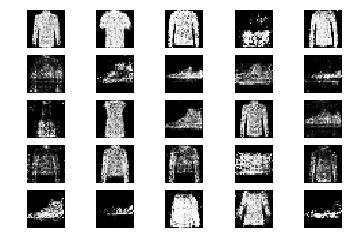

46201 [D loss: 0.572942, acc.: 67.19%] [G loss: 0.994722]
46202 [D loss: 0.613899, acc.: 67.19%] [G loss: 0.944264]
46203 [D loss: 0.628992, acc.: 64.06%] [G loss: 1.049716]
46204 [D loss: 0.607916, acc.: 67.19%] [G loss: 1.081098]
46205 [D loss: 0.631186, acc.: 67.19%] [G loss: 1.060482]
46206 [D loss: 0.565113, acc.: 67.19%] [G loss: 1.068969]
46207 [D loss: 0.578713, acc.: 70.31%] [G loss: 1.005916]
46208 [D loss: 0.706773, acc.: 54.69%] [G loss: 1.030419]
46209 [D loss: 0.555165, acc.: 70.31%] [G loss: 1.019650]
46210 [D loss: 0.571691, acc.: 60.94%] [G loss: 1.129963]
46211 [D loss: 0.697253, acc.: 60.94%] [G loss: 1.065870]
46212 [D loss: 0.610050, acc.: 62.50%] [G loss: 0.928888]
46213 [D loss: 0.583062, acc.: 67.19%] [G loss: 1.021481]
46214 [D loss: 0.651331, acc.: 57.81%] [G loss: 0.978082]
46215 [D loss: 0.580923, acc.: 67.19%] [G loss: 0.939084]
46216 [D loss: 0.649104, acc.: 59.38%] [G loss: 1.069234]
46217 [D loss: 0.683537, acc.: 57.81%] [G loss: 1.081824]
46218 [D loss:

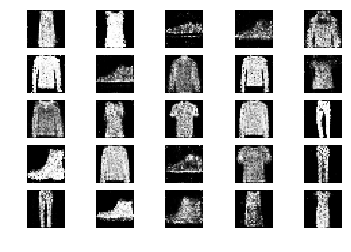

46401 [D loss: 0.620211, acc.: 59.38%] [G loss: 1.042370]
46402 [D loss: 0.573367, acc.: 67.19%] [G loss: 0.921014]
46403 [D loss: 0.664924, acc.: 56.25%] [G loss: 0.968830]
46404 [D loss: 0.587557, acc.: 67.19%] [G loss: 0.958067]
46405 [D loss: 0.549597, acc.: 70.31%] [G loss: 1.104801]
46406 [D loss: 0.607938, acc.: 65.62%] [G loss: 1.114230]
46407 [D loss: 0.691764, acc.: 67.19%] [G loss: 1.046564]
46408 [D loss: 0.551821, acc.: 71.88%] [G loss: 1.151352]
46409 [D loss: 0.701808, acc.: 53.12%] [G loss: 1.104840]
46410 [D loss: 0.631778, acc.: 60.94%] [G loss: 1.004982]
46411 [D loss: 0.652534, acc.: 62.50%] [G loss: 0.964237]
46412 [D loss: 0.609363, acc.: 64.06%] [G loss: 0.994093]
46413 [D loss: 0.583256, acc.: 70.31%] [G loss: 1.017661]
46414 [D loss: 0.659326, acc.: 64.06%] [G loss: 1.106974]
46415 [D loss: 0.609010, acc.: 65.62%] [G loss: 1.048166]
46416 [D loss: 0.585428, acc.: 73.44%] [G loss: 0.959459]
46417 [D loss: 0.637474, acc.: 65.62%] [G loss: 1.043870]
46418 [D loss:

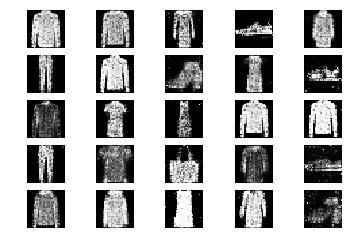

46601 [D loss: 0.694878, acc.: 53.12%] [G loss: 1.019027]
46602 [D loss: 0.633001, acc.: 65.62%] [G loss: 1.059801]
46603 [D loss: 0.658080, acc.: 62.50%] [G loss: 1.054098]
46604 [D loss: 0.640635, acc.: 62.50%] [G loss: 1.047971]
46605 [D loss: 0.629805, acc.: 67.19%] [G loss: 1.054762]
46606 [D loss: 0.574683, acc.: 76.56%] [G loss: 1.010474]
46607 [D loss: 0.650976, acc.: 56.25%] [G loss: 1.009105]
46608 [D loss: 0.638887, acc.: 60.94%] [G loss: 1.057292]
46609 [D loss: 0.700908, acc.: 59.38%] [G loss: 1.067704]
46610 [D loss: 0.622379, acc.: 62.50%] [G loss: 0.989065]
46611 [D loss: 0.646697, acc.: 56.25%] [G loss: 1.001525]
46612 [D loss: 0.733650, acc.: 62.50%] [G loss: 0.977554]
46613 [D loss: 0.647370, acc.: 62.50%] [G loss: 0.911323]
46614 [D loss: 0.650777, acc.: 62.50%] [G loss: 0.919513]
46615 [D loss: 0.609184, acc.: 67.19%] [G loss: 0.962892]
46616 [D loss: 0.565612, acc.: 76.56%] [G loss: 0.950220]
46617 [D loss: 0.658859, acc.: 62.50%] [G loss: 0.920526]
46618 [D loss:

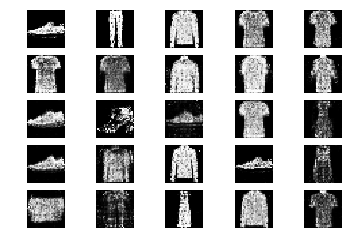

46801 [D loss: 0.638923, acc.: 68.75%] [G loss: 0.970426]
46802 [D loss: 0.635180, acc.: 64.06%] [G loss: 1.048842]
46803 [D loss: 0.592658, acc.: 70.31%] [G loss: 1.093124]
46804 [D loss: 0.613643, acc.: 68.75%] [G loss: 1.097545]
46805 [D loss: 0.591764, acc.: 70.31%] [G loss: 1.084632]
46806 [D loss: 0.614129, acc.: 59.38%] [G loss: 0.995691]
46807 [D loss: 0.512303, acc.: 73.44%] [G loss: 1.046500]
46808 [D loss: 0.647284, acc.: 65.62%] [G loss: 1.125610]
46809 [D loss: 0.701790, acc.: 57.81%] [G loss: 0.998924]
46810 [D loss: 0.662749, acc.: 62.50%] [G loss: 0.957074]
46811 [D loss: 0.701698, acc.: 59.38%] [G loss: 0.880944]
46812 [D loss: 0.603088, acc.: 68.75%] [G loss: 1.005171]
46813 [D loss: 0.711582, acc.: 54.69%] [G loss: 0.996771]
46814 [D loss: 0.662332, acc.: 59.38%] [G loss: 1.047176]
46815 [D loss: 0.567979, acc.: 64.06%] [G loss: 0.968666]
46816 [D loss: 0.721704, acc.: 51.56%] [G loss: 0.906455]
46817 [D loss: 0.614275, acc.: 64.06%] [G loss: 0.962037]
46818 [D loss:

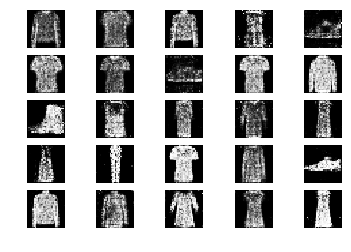

47001 [D loss: 0.700755, acc.: 56.25%] [G loss: 0.921296]
47002 [D loss: 0.533082, acc.: 76.56%] [G loss: 0.936459]
47003 [D loss: 0.693502, acc.: 57.81%] [G loss: 1.006909]
47004 [D loss: 0.512799, acc.: 73.44%] [G loss: 1.051954]
47005 [D loss: 0.680041, acc.: 59.38%] [G loss: 1.112149]
47006 [D loss: 0.670309, acc.: 59.38%] [G loss: 0.991845]
47007 [D loss: 0.605209, acc.: 68.75%] [G loss: 0.976014]
47008 [D loss: 0.590980, acc.: 70.31%] [G loss: 0.986373]
47009 [D loss: 0.587150, acc.: 71.88%] [G loss: 1.044854]
47010 [D loss: 0.707582, acc.: 62.50%] [G loss: 1.001266]
47011 [D loss: 0.604834, acc.: 68.75%] [G loss: 1.029537]
47012 [D loss: 0.584588, acc.: 73.44%] [G loss: 0.998825]
47013 [D loss: 0.607083, acc.: 65.62%] [G loss: 0.981074]
47014 [D loss: 0.555468, acc.: 73.44%] [G loss: 0.958068]
47015 [D loss: 0.683020, acc.: 60.94%] [G loss: 0.927312]
47016 [D loss: 0.620117, acc.: 62.50%] [G loss: 1.011409]
47017 [D loss: 0.579243, acc.: 70.31%] [G loss: 0.860834]
47018 [D loss:

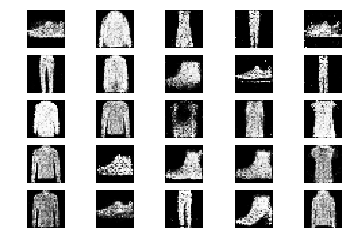

47201 [D loss: 0.601698, acc.: 67.19%] [G loss: 1.035134]
47202 [D loss: 0.639761, acc.: 57.81%] [G loss: 1.185864]
47203 [D loss: 0.535830, acc.: 75.00%] [G loss: 0.950637]
47204 [D loss: 0.578151, acc.: 71.88%] [G loss: 0.993638]
47205 [D loss: 0.715443, acc.: 56.25%] [G loss: 1.078440]
47206 [D loss: 0.628636, acc.: 64.06%] [G loss: 1.012785]
47207 [D loss: 0.609737, acc.: 70.31%] [G loss: 1.004983]
47208 [D loss: 0.586756, acc.: 65.62%] [G loss: 1.174836]
47209 [D loss: 0.555752, acc.: 71.88%] [G loss: 1.030907]
47210 [D loss: 0.566216, acc.: 64.06%] [G loss: 1.196037]
47211 [D loss: 0.656817, acc.: 64.06%] [G loss: 0.994583]
47212 [D loss: 0.618932, acc.: 68.75%] [G loss: 1.038012]
47213 [D loss: 0.590784, acc.: 65.62%] [G loss: 1.023637]
47214 [D loss: 0.659227, acc.: 62.50%] [G loss: 1.079153]
47215 [D loss: 0.530985, acc.: 71.88%] [G loss: 1.160597]
47216 [D loss: 0.544755, acc.: 76.56%] [G loss: 1.026515]
47217 [D loss: 0.649995, acc.: 59.38%] [G loss: 1.085269]
47218 [D loss:

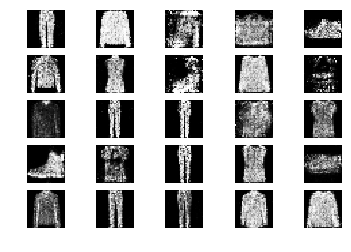

47401 [D loss: 0.673145, acc.: 67.19%] [G loss: 0.935999]
47402 [D loss: 0.623220, acc.: 68.75%] [G loss: 0.944804]
47403 [D loss: 0.653243, acc.: 56.25%] [G loss: 0.995680]
47404 [D loss: 0.626374, acc.: 64.06%] [G loss: 1.095914]
47405 [D loss: 0.543253, acc.: 71.88%] [G loss: 1.151595]
47406 [D loss: 0.650455, acc.: 64.06%] [G loss: 1.053052]
47407 [D loss: 0.719660, acc.: 51.56%] [G loss: 1.050352]
47408 [D loss: 0.597962, acc.: 70.31%] [G loss: 0.950861]
47409 [D loss: 0.603092, acc.: 59.38%] [G loss: 0.959241]
47410 [D loss: 0.610487, acc.: 71.88%] [G loss: 0.986930]
47411 [D loss: 0.565584, acc.: 70.31%] [G loss: 1.219204]
47412 [D loss: 0.637074, acc.: 64.06%] [G loss: 0.892401]
47413 [D loss: 0.561779, acc.: 78.12%] [G loss: 1.002788]
47414 [D loss: 0.622803, acc.: 65.62%] [G loss: 1.107849]
47415 [D loss: 0.660537, acc.: 62.50%] [G loss: 1.068901]
47416 [D loss: 0.634843, acc.: 62.50%] [G loss: 1.119621]
47417 [D loss: 0.699978, acc.: 56.25%] [G loss: 1.031978]
47418 [D loss:

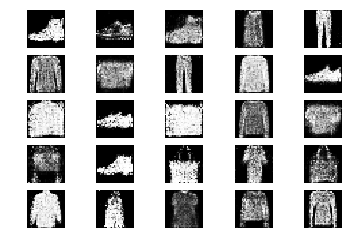

47601 [D loss: 0.577279, acc.: 73.44%] [G loss: 1.102494]
47602 [D loss: 0.631297, acc.: 64.06%] [G loss: 1.085009]
47603 [D loss: 0.704917, acc.: 59.38%] [G loss: 1.018371]
47604 [D loss: 0.571148, acc.: 71.88%] [G loss: 0.944117]
47605 [D loss: 0.578051, acc.: 65.62%] [G loss: 1.112578]
47606 [D loss: 0.736846, acc.: 48.44%] [G loss: 1.031544]
47607 [D loss: 0.655068, acc.: 59.38%] [G loss: 1.004761]
47608 [D loss: 0.591910, acc.: 75.00%] [G loss: 1.026033]
47609 [D loss: 0.581717, acc.: 70.31%] [G loss: 1.001055]
47610 [D loss: 0.668731, acc.: 59.38%] [G loss: 1.035717]
47611 [D loss: 0.609377, acc.: 65.62%] [G loss: 0.952972]
47612 [D loss: 0.585274, acc.: 67.19%] [G loss: 0.977086]
47613 [D loss: 0.596688, acc.: 67.19%] [G loss: 1.081853]
47614 [D loss: 0.628745, acc.: 59.38%] [G loss: 0.981956]
47615 [D loss: 0.553082, acc.: 73.44%] [G loss: 1.004050]
47616 [D loss: 0.715208, acc.: 51.56%] [G loss: 0.951289]
47617 [D loss: 0.645992, acc.: 60.94%] [G loss: 1.163549]
47618 [D loss:

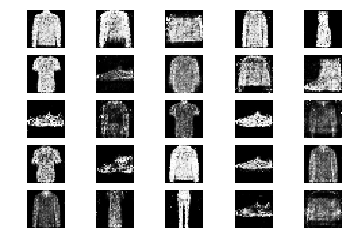

47801 [D loss: 0.604475, acc.: 68.75%] [G loss: 1.065636]
47802 [D loss: 0.632411, acc.: 62.50%] [G loss: 1.073300]
47803 [D loss: 0.568564, acc.: 70.31%] [G loss: 1.062728]
47804 [D loss: 0.632253, acc.: 64.06%] [G loss: 1.092958]
47805 [D loss: 0.585840, acc.: 65.62%] [G loss: 0.897377]
47806 [D loss: 0.567263, acc.: 68.75%] [G loss: 0.894765]
47807 [D loss: 0.580389, acc.: 68.75%] [G loss: 0.915683]
47808 [D loss: 0.701454, acc.: 57.81%] [G loss: 1.021639]
47809 [D loss: 0.598753, acc.: 67.19%] [G loss: 0.984914]
47810 [D loss: 0.600717, acc.: 64.06%] [G loss: 0.867433]
47811 [D loss: 0.507551, acc.: 79.69%] [G loss: 1.026121]
47812 [D loss: 0.635968, acc.: 64.06%] [G loss: 1.000852]
47813 [D loss: 0.580718, acc.: 70.31%] [G loss: 0.961769]
47814 [D loss: 0.666888, acc.: 62.50%] [G loss: 1.046935]
47815 [D loss: 0.607932, acc.: 68.75%] [G loss: 1.007305]
47816 [D loss: 0.538020, acc.: 73.44%] [G loss: 1.037826]
47817 [D loss: 0.655932, acc.: 67.19%] [G loss: 1.049829]
47818 [D loss:

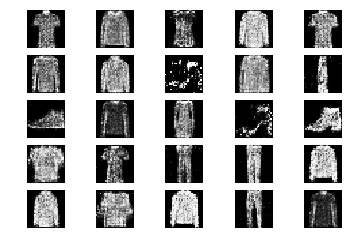

48001 [D loss: 0.565565, acc.: 68.75%] [G loss: 1.035010]
48002 [D loss: 0.636331, acc.: 65.62%] [G loss: 1.027512]
48003 [D loss: 0.617571, acc.: 62.50%] [G loss: 1.041065]
48004 [D loss: 0.589634, acc.: 73.44%] [G loss: 1.129440]
48005 [D loss: 0.554364, acc.: 70.31%] [G loss: 1.110819]
48006 [D loss: 0.575167, acc.: 75.00%] [G loss: 0.997163]
48007 [D loss: 0.571246, acc.: 62.50%] [G loss: 1.090899]
48008 [D loss: 0.641699, acc.: 65.62%] [G loss: 1.030207]
48009 [D loss: 0.649415, acc.: 54.69%] [G loss: 1.007647]
48010 [D loss: 0.562145, acc.: 68.75%] [G loss: 1.105269]
48011 [D loss: 0.631950, acc.: 64.06%] [G loss: 1.207920]
48012 [D loss: 0.660466, acc.: 64.06%] [G loss: 1.055641]
48013 [D loss: 0.737280, acc.: 56.25%] [G loss: 0.927292]
48014 [D loss: 0.599347, acc.: 67.19%] [G loss: 0.976527]
48015 [D loss: 0.725758, acc.: 56.25%] [G loss: 1.053702]
48016 [D loss: 0.629539, acc.: 70.31%] [G loss: 1.045306]
48017 [D loss: 0.602942, acc.: 60.94%] [G loss: 1.087190]
48018 [D loss:

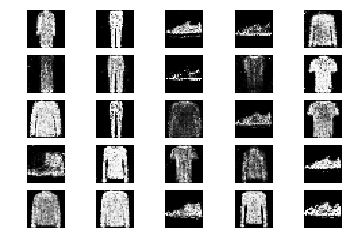

48201 [D loss: 0.651289, acc.: 60.94%] [G loss: 1.075242]
48202 [D loss: 0.697060, acc.: 51.56%] [G loss: 0.955563]
48203 [D loss: 0.660605, acc.: 62.50%] [G loss: 1.004924]
48204 [D loss: 0.660031, acc.: 62.50%] [G loss: 0.970816]
48205 [D loss: 0.593587, acc.: 60.94%] [G loss: 1.002236]
48206 [D loss: 0.616437, acc.: 65.62%] [G loss: 0.958381]
48207 [D loss: 0.615100, acc.: 70.31%] [G loss: 1.038293]
48208 [D loss: 0.681376, acc.: 59.38%] [G loss: 0.951120]
48209 [D loss: 0.600071, acc.: 68.75%] [G loss: 1.138860]
48210 [D loss: 0.587143, acc.: 64.06%] [G loss: 1.032204]
48211 [D loss: 0.680211, acc.: 60.94%] [G loss: 0.937604]
48212 [D loss: 0.594794, acc.: 67.19%] [G loss: 0.946237]
48213 [D loss: 0.625253, acc.: 65.62%] [G loss: 0.947101]
48214 [D loss: 0.627752, acc.: 60.94%] [G loss: 0.994734]
48215 [D loss: 0.607648, acc.: 67.19%] [G loss: 0.978730]
48216 [D loss: 0.636088, acc.: 70.31%] [G loss: 0.990609]
48217 [D loss: 0.688146, acc.: 56.25%] [G loss: 0.919978]
48218 [D loss:

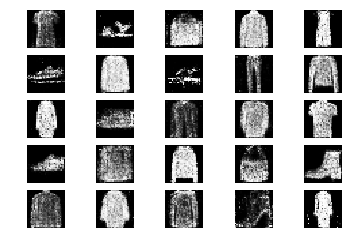

48401 [D loss: 0.632648, acc.: 59.38%] [G loss: 1.076130]
48402 [D loss: 0.643137, acc.: 67.19%] [G loss: 1.107584]
48403 [D loss: 0.524896, acc.: 75.00%] [G loss: 1.099280]
48404 [D loss: 0.574206, acc.: 68.75%] [G loss: 0.996502]
48405 [D loss: 0.607591, acc.: 64.06%] [G loss: 1.097608]
48406 [D loss: 0.664713, acc.: 60.94%] [G loss: 1.094657]
48407 [D loss: 0.647749, acc.: 60.94%] [G loss: 1.087171]
48408 [D loss: 0.580776, acc.: 67.19%] [G loss: 1.109063]
48409 [D loss: 0.662739, acc.: 60.94%] [G loss: 1.033297]
48410 [D loss: 0.650412, acc.: 56.25%] [G loss: 0.993568]
48411 [D loss: 0.538826, acc.: 78.12%] [G loss: 1.072871]
48412 [D loss: 0.628282, acc.: 67.19%] [G loss: 1.075470]
48413 [D loss: 0.685013, acc.: 56.25%] [G loss: 1.059074]
48414 [D loss: 0.608309, acc.: 68.75%] [G loss: 0.980314]
48415 [D loss: 0.603053, acc.: 65.62%] [G loss: 1.168607]
48416 [D loss: 0.651412, acc.: 51.56%] [G loss: 1.103797]
48417 [D loss: 0.560818, acc.: 73.44%] [G loss: 1.041233]
48418 [D loss:

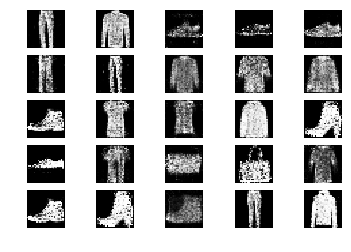

48601 [D loss: 0.624757, acc.: 64.06%] [G loss: 1.074620]
48602 [D loss: 0.658768, acc.: 64.06%] [G loss: 0.980378]
48603 [D loss: 0.605828, acc.: 67.19%] [G loss: 1.018391]
48604 [D loss: 0.664423, acc.: 62.50%] [G loss: 0.996079]
48605 [D loss: 0.591729, acc.: 71.88%] [G loss: 0.963041]
48606 [D loss: 0.589969, acc.: 67.19%] [G loss: 1.038912]
48607 [D loss: 0.607938, acc.: 65.62%] [G loss: 1.071199]
48608 [D loss: 0.662702, acc.: 56.25%] [G loss: 0.919118]
48609 [D loss: 0.580782, acc.: 68.75%] [G loss: 0.979214]
48610 [D loss: 0.654308, acc.: 59.38%] [G loss: 0.966074]
48611 [D loss: 0.649420, acc.: 67.19%] [G loss: 0.894302]
48612 [D loss: 0.635701, acc.: 60.94%] [G loss: 0.978285]
48613 [D loss: 0.571077, acc.: 67.19%] [G loss: 0.990819]
48614 [D loss: 0.608838, acc.: 67.19%] [G loss: 0.974149]
48615 [D loss: 0.723019, acc.: 56.25%] [G loss: 1.127051]
48616 [D loss: 0.661998, acc.: 59.38%] [G loss: 1.050900]
48617 [D loss: 0.711102, acc.: 54.69%] [G loss: 0.935469]
48618 [D loss:

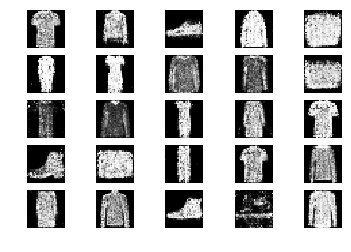

48801 [D loss: 0.699923, acc.: 57.81%] [G loss: 1.034277]
48802 [D loss: 0.620813, acc.: 64.06%] [G loss: 0.914303]
48803 [D loss: 0.623771, acc.: 64.06%] [G loss: 1.043724]
48804 [D loss: 0.604538, acc.: 67.19%] [G loss: 1.059983]
48805 [D loss: 0.573991, acc.: 73.44%] [G loss: 0.978747]
48806 [D loss: 0.698732, acc.: 60.94%] [G loss: 0.977867]
48807 [D loss: 0.664898, acc.: 50.00%] [G loss: 1.117417]
48808 [D loss: 0.669815, acc.: 56.25%] [G loss: 1.021564]
48809 [D loss: 0.636512, acc.: 65.62%] [G loss: 1.025919]
48810 [D loss: 0.582894, acc.: 68.75%] [G loss: 1.192789]
48811 [D loss: 0.621344, acc.: 62.50%] [G loss: 1.070167]
48812 [D loss: 0.619400, acc.: 64.06%] [G loss: 1.075923]
48813 [D loss: 0.571371, acc.: 71.88%] [G loss: 1.052655]
48814 [D loss: 0.636703, acc.: 67.19%] [G loss: 1.081062]
48815 [D loss: 0.710320, acc.: 53.12%] [G loss: 1.090667]
48816 [D loss: 0.595714, acc.: 68.75%] [G loss: 1.022434]
48817 [D loss: 0.622472, acc.: 62.50%] [G loss: 0.993571]
48818 [D loss:

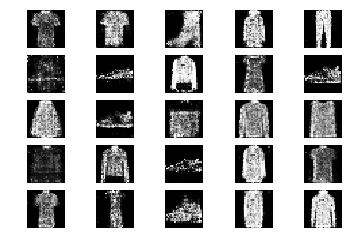

49001 [D loss: 0.608119, acc.: 64.06%] [G loss: 1.018132]
49002 [D loss: 0.571631, acc.: 73.44%] [G loss: 1.081524]
49003 [D loss: 0.613759, acc.: 65.62%] [G loss: 0.999344]
49004 [D loss: 0.617427, acc.: 64.06%] [G loss: 1.034755]
49005 [D loss: 0.595728, acc.: 65.62%] [G loss: 1.129061]
49006 [D loss: 0.690080, acc.: 53.12%] [G loss: 1.079368]
49007 [D loss: 0.621505, acc.: 71.88%] [G loss: 0.960477]
49008 [D loss: 0.618484, acc.: 70.31%] [G loss: 1.002451]
49009 [D loss: 0.652032, acc.: 64.06%] [G loss: 1.097998]
49010 [D loss: 0.590635, acc.: 73.44%] [G loss: 1.106885]
49011 [D loss: 0.686646, acc.: 56.25%] [G loss: 1.017481]
49012 [D loss: 0.568771, acc.: 75.00%] [G loss: 1.058578]
49013 [D loss: 0.691126, acc.: 65.62%] [G loss: 1.002793]
49014 [D loss: 0.601693, acc.: 67.19%] [G loss: 0.962836]
49015 [D loss: 0.690239, acc.: 54.69%] [G loss: 1.023681]
49016 [D loss: 0.610685, acc.: 62.50%] [G loss: 0.963262]
49017 [D loss: 0.658089, acc.: 59.38%] [G loss: 1.119924]
49018 [D loss:

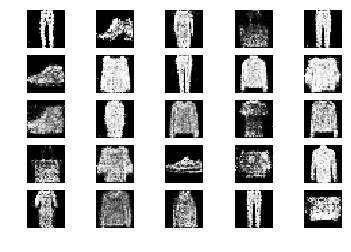

49201 [D loss: 0.654964, acc.: 64.06%] [G loss: 1.137905]
49202 [D loss: 0.632452, acc.: 62.50%] [G loss: 1.081893]
49203 [D loss: 0.596493, acc.: 59.38%] [G loss: 0.984190]
49204 [D loss: 0.620495, acc.: 64.06%] [G loss: 1.132783]
49205 [D loss: 0.625266, acc.: 65.62%] [G loss: 0.959018]
49206 [D loss: 0.583311, acc.: 68.75%] [G loss: 0.979179]
49207 [D loss: 0.558070, acc.: 70.31%] [G loss: 1.046824]
49208 [D loss: 0.603718, acc.: 64.06%] [G loss: 1.035119]
49209 [D loss: 0.603725, acc.: 68.75%] [G loss: 1.134264]
49210 [D loss: 0.583430, acc.: 71.88%] [G loss: 1.041115]
49211 [D loss: 0.549893, acc.: 64.06%] [G loss: 0.967914]
49212 [D loss: 0.587158, acc.: 68.75%] [G loss: 0.955657]
49213 [D loss: 0.552726, acc.: 71.88%] [G loss: 1.101349]
49214 [D loss: 0.701063, acc.: 65.62%] [G loss: 0.887174]
49215 [D loss: 0.581474, acc.: 68.75%] [G loss: 1.084590]
49216 [D loss: 0.642130, acc.: 62.50%] [G loss: 1.021796]
49217 [D loss: 0.610246, acc.: 68.75%] [G loss: 1.006084]
49218 [D loss:

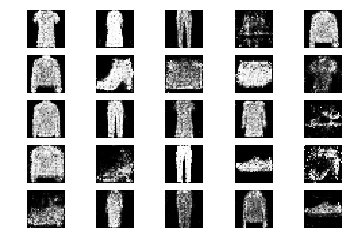

49401 [D loss: 0.642948, acc.: 59.38%] [G loss: 1.023882]
49402 [D loss: 0.652580, acc.: 60.94%] [G loss: 0.960135]
49403 [D loss: 0.601985, acc.: 62.50%] [G loss: 0.909663]
49404 [D loss: 0.679798, acc.: 53.12%] [G loss: 1.175129]
49405 [D loss: 0.675826, acc.: 67.19%] [G loss: 1.032519]
49406 [D loss: 0.578036, acc.: 67.19%] [G loss: 1.090827]
49407 [D loss: 0.648398, acc.: 62.50%] [G loss: 1.019509]
49408 [D loss: 0.654647, acc.: 60.94%] [G loss: 0.998371]
49409 [D loss: 0.650375, acc.: 59.38%] [G loss: 0.998997]
49410 [D loss: 0.548632, acc.: 70.31%] [G loss: 0.991053]
49411 [D loss: 0.603828, acc.: 68.75%] [G loss: 1.140142]
49412 [D loss: 0.646989, acc.: 53.12%] [G loss: 1.074276]
49413 [D loss: 0.658078, acc.: 60.94%] [G loss: 1.140772]
49414 [D loss: 0.645192, acc.: 60.94%] [G loss: 0.971109]
49415 [D loss: 0.689604, acc.: 57.81%] [G loss: 1.030059]
49416 [D loss: 0.651302, acc.: 59.38%] [G loss: 1.044196]
49417 [D loss: 0.607176, acc.: 67.19%] [G loss: 1.016893]
49418 [D loss:

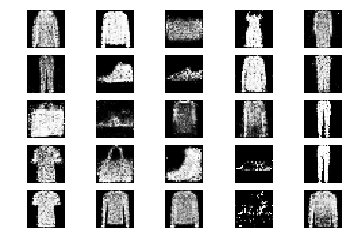

49601 [D loss: 0.590133, acc.: 68.75%] [G loss: 1.035907]
49602 [D loss: 0.622079, acc.: 65.62%] [G loss: 1.013309]
49603 [D loss: 0.645138, acc.: 60.94%] [G loss: 1.053811]
49604 [D loss: 0.675658, acc.: 59.38%] [G loss: 0.956182]
49605 [D loss: 0.552459, acc.: 73.44%] [G loss: 1.047764]
49606 [D loss: 0.588517, acc.: 71.88%] [G loss: 0.963423]
49607 [D loss: 0.643661, acc.: 67.19%] [G loss: 0.960453]
49608 [D loss: 0.634727, acc.: 60.94%] [G loss: 1.028750]
49609 [D loss: 0.605435, acc.: 68.75%] [G loss: 1.037369]
49610 [D loss: 0.617054, acc.: 68.75%] [G loss: 1.048682]
49611 [D loss: 0.662422, acc.: 60.94%] [G loss: 1.065063]
49612 [D loss: 0.654913, acc.: 59.38%] [G loss: 1.051266]
49613 [D loss: 0.646892, acc.: 64.06%] [G loss: 1.101817]
49614 [D loss: 0.681308, acc.: 56.25%] [G loss: 1.011820]
49615 [D loss: 0.538178, acc.: 75.00%] [G loss: 0.923956]
49616 [D loss: 0.686381, acc.: 59.38%] [G loss: 1.150024]
49617 [D loss: 0.534248, acc.: 73.44%] [G loss: 1.120658]
49618 [D loss:

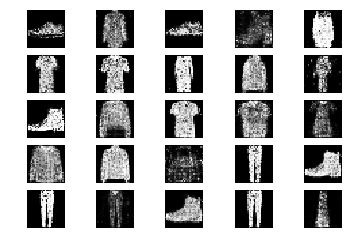

49801 [D loss: 0.600961, acc.: 64.06%] [G loss: 1.048645]
49802 [D loss: 0.587908, acc.: 71.88%] [G loss: 0.945117]
49803 [D loss: 0.690521, acc.: 51.56%] [G loss: 0.976063]
49804 [D loss: 0.532023, acc.: 78.12%] [G loss: 0.989698]
49805 [D loss: 0.576347, acc.: 65.62%] [G loss: 0.997734]
49806 [D loss: 0.519665, acc.: 71.88%] [G loss: 1.023003]
49807 [D loss: 0.575231, acc.: 68.75%] [G loss: 1.040009]
49808 [D loss: 0.649362, acc.: 59.38%] [G loss: 1.108070]
49809 [D loss: 0.596338, acc.: 65.62%] [G loss: 0.950638]
49810 [D loss: 0.642811, acc.: 60.94%] [G loss: 0.908069]
49811 [D loss: 0.582113, acc.: 68.75%] [G loss: 1.029471]
49812 [D loss: 0.570656, acc.: 70.31%] [G loss: 1.040361]
49813 [D loss: 0.618293, acc.: 70.31%] [G loss: 1.124122]
49814 [D loss: 0.641500, acc.: 60.94%] [G loss: 0.996799]
49815 [D loss: 0.577510, acc.: 71.88%] [G loss: 1.022868]
49816 [D loss: 0.534111, acc.: 71.88%] [G loss: 0.997463]
49817 [D loss: 0.685701, acc.: 53.12%] [G loss: 1.008220]
49818 [D loss:

In [0]:
if __name__ == '__main__':
    gan = GAN()
    gan.train(epochs=50000, batch_size=32, sample_interval=200)